In [341]:
import pandas as pd
from datetime import datetime, date, time
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [342]:
# drop each daily csv into its own data frame

monday = pd.read_csv('data/monday.csv', delimiter=';', parse_dates=True, index_col='timestamp')
tuesday = pd.read_csv('data/tuesday.csv', delimiter=';', parse_dates=True, index_col='timestamp')
wednesday = pd.read_csv('data/wednesday.csv', delimiter=';', parse_dates=True, index_col='timestamp')
thursday = pd.read_csv('data/thursday.csv', delimiter=';', parse_dates=True, index_col='timestamp')
friday = pd.read_csv('data/friday.csv', delimiter=';', parse_dates=True, index_col='timestamp')

In [343]:
# create a day column

monday['day'] = 'Monday'
tuesday['day'] = 'Tuesday'
wednesday['day'] = 'Wednesday'
thursday['day'] = 'Thursday'
friday['day'] = 'Friday'

In [344]:
# create a dataframe containing all daily dataframes

all_days = pd.concat([monday, tuesday, wednesday, thursday, friday])

In [345]:
# in daily dataframes, customer_no are reset to 1 each day. We want unique numbers for each customers,
# so we'll make sure that there is no repetition in customer_no by adding a set number to each day
# which is higher than the total number of customers of the previous day

all_days['customer_no'][all_days['day'] == 'Tuesday'] += 2000
all_days['customer_no'][all_days['day'] == 'Wednesday'] += 4000
all_days['customer_no'][all_days['day'] == 'Thursday'] += 6000
all_days['customer_no'][all_days['day'] == 'Friday'] += 8000;

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/1052201446.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_days['customer_no'][all_days['day'] == 'Tuesday'] += 2000
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/1052201446.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_days['customer_no'][all_days['day'] == 'Tuesday'] += 2000
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/1052201446.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

## Understand customer location over time

How busy is each section of our market at each hour of the day?

In [346]:
# we want to end up with a count of customers each hour, so we'll resample the data by hour
# we want to see the count of customers in each location, so we group by location

all_days_sampled= all_days.groupby('location').resample('1H').agg({'customer_no': 'count'}).reset_index()

In [349]:
# to facilitate plotting, we create an "hour" column which will be our x axis

all_days_sampled['hour'] = all_days_sampled['timestamp'].dt.hour

# we'll also create a day column to be able to isolate one day

all_days_sampled['day'] = all_days_sampled['timestamp'].dt.day_name()


Text(0.5, 1.0, 'Count of customers in each market location over the course of Monday')

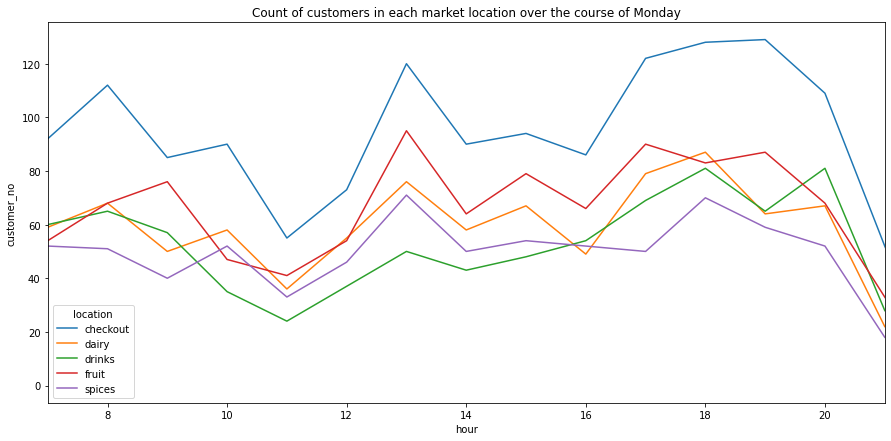

In [350]:
# now we plot! The all_days dataframe contains data for the 5 days, so I'll limit this plot to Monday
# so we have an accurate view of the number of customers over each hour of 1 day

plt.figure(figsize=(15,7))
sns.lineplot(data=all_days_sampled[all_days_sampled['day'] == 'Monday'], x='hour', y='customer_no', hue='location')
plt.xlim(7, 21)
plt.title('Count of customers in each market location over the course of Monday')

## Total number of customers in shop during the day

How many customers are in total in our supermarket during a day?

In [351]:
all_days_sampled

,location,timestamp,customer_no,hour,day
0,checkout,2019-09-02 07:00:00,92,7,Monday
1,checkout,2019-09-02 08:00:00,112,8,Monday
2,checkout,2019-09-02 09:00:00,85,9,Monday
3,checkout,2019-09-02 10:00:00,90,10,Monday
4,checkout,2019-09-02 11:00:00,55,11,Monday
...,...,...,...,...,...
550,spices,2019-09-06 17:00:00,65,17,Friday
551,spices,2019-09-06 18:00:00,98,18,Friday
552,spices,2019-09-06 19:00:00,65,19,Friday
553,spices,2019-09-06 20:00:00,54,20,Friday


In [352]:
# we can use our resampled dataframe and simply group by hour to get rid of the location grouping, 
# which is not important anymore. This will give us the number of customer in the shop for each hour,
# but those counts will be a sum for all 5 days!

all_day_everywhere = all_days_sampled.groupby('hour').customer_no.sum().reset_index()

In [353]:
# to find the mean of customer count in a day, we can divide the customer_no count by our number of days, 5.
all_day_everywhere['customer_no'] = all_day_everywhere['customer_no']/5

Text(0.5, 1.0, 'Total number of customers in the shop throughout the day')

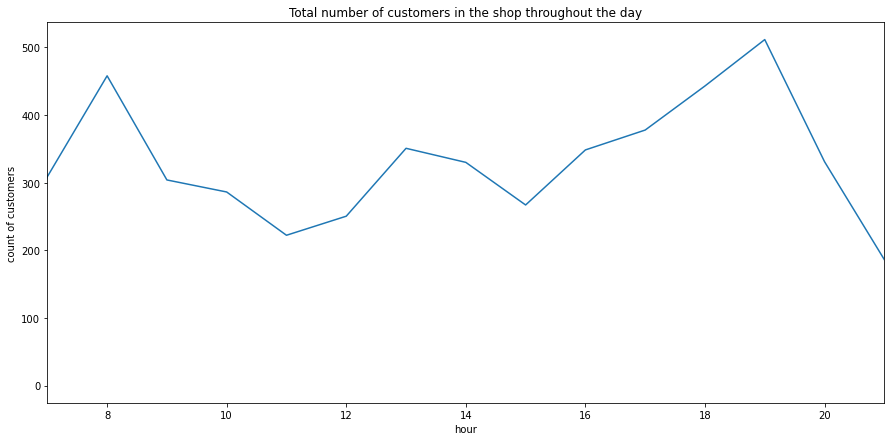

In [354]:
# and we plot!
plt.figure(figsize=(15,7))
sns.lineplot(data=all_day_everywhere, x='hour', y='customer_no')
plt.xlim(7, 21)
plt.ylabel('count of customers')
plt.title('Total number of customers in the shop throughout the day')

## Weekly analysis

Do the number of customers in each location vary during the week?

In [355]:
count_by_day = all_days
count_by_day = count_by_day.groupby(['day','location'])['customer_no'].count().reset_index()
count_by_day.rename(columns={'customer_no': 'customer_count'}, inplace=True)
count_by_day

,day,location,customer_count
0,Friday,checkout,1502
1,Friday,dairy,932
2,Friday,drinks,844
3,Friday,fruit,1057
4,Friday,spices,790
5,Monday,checkout,1437
6,Monday,dairy,895
7,Monday,drinks,797
8,Monday,fruit,1005
9,Monday,spices,750


<AxesSubplot:xlabel='day', ylabel='customer_count'>

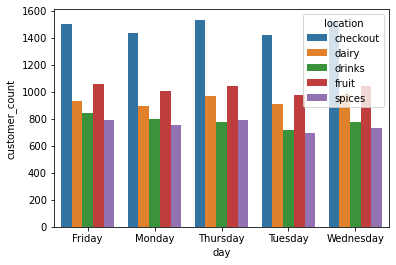

In [356]:
sns.barplot(x='day', y='customer_count', data=count_by_day, hue='location')

# Expanding the dataframe to facilitate transition matrix

## Add checkout time if did not checkout

In [357]:
# some users do not have any row for "checkout". They should be forced out of the shop at 21:55
#so we can close at 22:00

def find_checkout_time(timestamp):
    timestamp=pd.Timestamp(timestamp)
    date_of_visit = timestamp.date()
    checkout = pd.Timestamp('21:55:00')
    
    checkout_time = datetime.strptime('21:55:00', '%H:%M:%S').time()
    checkout_timestamp = pd.Timestamp.combine(date_of_visit, checkout_time)
    checkout_timestamp = pd.to_datetime(checkout_timestamp, errors = 'coerce')
    return checkout_timestamp
    #return date_of_visit
    
find_checkout_time('2019-09-06 21:48:00')

Timestamp('2019-09-06 21:55:00')

In [358]:
#We need to find ind customers who didn't check out

# working with indexes can be tricky so we'll move the timestamp to its own column
all_days.reset_index(inplace=True)

# we'll create a new dataframe that will store our new data
new_df = pd.DataFrame()

# we create one dataframe by customer
for customer in all_days.customer_no.unique():
    customer_df = all_days[all_days['customer_no'] == customer]
    
    # then we try to find the value checkout in their location. If it doesn't exist, we need to add a row for checkout
    # for that customer
    
    if 'checkout' not in customer_df['location'].unique():
        print('customer ' + str(customer) + ' did not checkout')
        # we look at the first row of that customer_df to find the customer_no, day and timestamps we'll be 
        # working with
        ref_row = customer_df.iloc[0]
        current_datetime = ref_row['timestamp']
        
        # now that we know the timestamp of their visit, we can apply our find_checkout_time function 
        # to find the timestamp of the row we need to add
        checkout_time_for_day = find_checkout_time(ref_row['timestamp'])
        
        # we create a series with the checkout time and some values from our first row (ref_row)
        to_append = pd.Series([checkout_time_for_day, ref_row['customer_no'],'checkout',ref_row['day']], index = customer_df.columns)
        # we append that row to the customer dataframe
        customer_df = customer_df.append(to_append, ignore_index=True)
    
    # now we can append the customer dataframe containing the new row to our new dataframe!
    new_df = pd.concat([new_df, customer_df])

customer 1430 did not checkout
customer 1433 did not checkout
customer 1437 did not checkout
customer 1439 did not checkout
customer 1440 did not checkout
customer 1441 did not checkout
customer 1443 did not checkout
customer 1445 did not checkout
customer 1446 did not checkout
customer 1447 did not checkout


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from 

customer 3411 did not checkout
customer 3422 did not checkout


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)


customer 5520 did not checkout
customer 5527 did not checkout
customer 5528 did not checkout
customer 5529 did not checkout
customer 5530 did not checkout


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from 

customer 7527 did not checkout
customer 7532 did not checkout
customer 7533 did not checkout


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)


customer 9494 did not checkout
customer 9496 did not checkout
customer 9500 did not checkout
customer 9503 did not checkout
customer 9505 did not checkout
customer 9506 did not checkout
customer 9509 did not checkout
customer 9510 did not checkout


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  customer_df = customer_df.append(to_append, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/618143787.py:30: FutureWarning: The frame.append method is deprecated and will be removed from 

## Add Self transitions

We currently only have rows for timestamps with new locations. Therefore, the dataframe needs to be filled out with self transition. if the person is in dairy at 7:30 and changes to spices at 7:35 it means they were in dairy also at 31, 32, 33, 34

We'll add these self transitions

In [359]:
for customer in new_df.customer_no.unique():
    print(customer)
    
    # we want to find the first and last timestamp for each customer so we can generate a range of the 
    # timestamps inbetween

    start = new_df['timestamp'][new_df['customer_no'] == customer].min()
    end = new_df['timestamp'][new_df['customer_no'] == customer].max()
    ref_row = new_df[new_df['customer_no']== customer].loc[new_df[new_df['customer_no']== customer].index[0]]
    minutes_timestamps = pd.date_range(start, end, freq='T')
    
    # if those timestamps are not in the dataframe for that user, we want to add a row
    for timestamp in minutes_timestamps:
        if timestamp not in new_df['timestamp'][new_df['customer_no']== customer].unique():
            
            # once again, we generate a series to append. We leave the location empty for now
            series = pd.Series([timestamp, ref_row['customer_no'], np.nan, ref_row['day']],index = new_df.columns)
            new_df = new_df.append(series, ignore_index=True)
            print('appended ' + str(series))
            
# we sort the values of our dataframe by customer and timestamp
new_df = new_df.sort_values(['customer_no','timestamp'])

# we can now fill the location column
new_df = new_df.ffill()
    
new_df

1
appended timestamp      2019-09-02 07:04:00
customer_no                      1
location                       NaN
day                         Monday
dtype: object
2


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)


appended timestamp      2019-09-02 07:04:00
customer_no                      2
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:05:00
customer_no                      2
location                       NaN
day                         Monday
dtype: object
3
appended timestamp      2019-09-02 07:05:00
customer_no                      3
location                       NaN
day                         Monday
dtype: object
4
appended timestamp      2019-09-02 07:05:00
customer_no                      4
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:06:00
customer_no                      4
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:07:00
customer_no                      4
location                       NaN
day                         Monday
dtype: object
5
6


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)


appended timestamp      2019-09-02 07:06:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:07:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:08:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)


appended timestamp      2019-09-02 07:09:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:10:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:11:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:12:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:13:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:14:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:15:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:16:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:19:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:20:00
customer_no                      6
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:10:00
customer_no                      7
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:12:00
customer_no                      7
location                       NaN
day                         Monday
dtype: object
8
appended timestamp      2019-09-02 07:05:00
customer_no                      8
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:06:00
customer_no                      8
location                       NaN
day                         Monday
dtype: object
9
appended timestamp      2019-09-02 07:07:00
customer_no                      9
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:08:00
customer_no                      9
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:09:00
customer_no                     13
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:10:00
customer_no                     13
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:11:00
customer_no                     13
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:12:00
customer_no                     13
location                       NaN
day                         Monday
dtype: object
14
appended timestamp      2019-09-02 07:07:00
customer_no                     14
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:08:00
customer_no                     14
location                       NaN
day                         Monday
dtype: object
15
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:21:00
customer_no                     17
location                       NaN
day                         Monday
dtype: object
18
appended timestamp      2019-09-02 07:13:00
customer_no                     18
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:15:00
customer_no                     18
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:16:00
customer_no                     18
location                       NaN
day                         Monday
dtype: object
19
appended timestamp      2019-09-02 07:14:00
customer_no                     19
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:15:00
customer_no                     19
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:21:00
customer_no                     25
location                       NaN
day                         Monday
dtype: object
26
appended timestamp      2019-09-02 07:17:00
customer_no                     26
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:18:00
customer_no                     26
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:19:00
customer_no                     26
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:21:00
customer_no                     26
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:22:00
customer_no                     26
location                       NaN
day                         Monday
dtype: object
appended timestamp 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:32:00
customer_no                     27
location                       NaN
day                         Monday
dtype: object
28
appended timestamp      2019-09-02 07:17:00
customer_no                     28
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:18:00
customer_no                     28
location                       NaN
day                         Monday
dtype: object
29
appended timestamp      2019-09-02 07:17:00
customer_no                     29
location                       NaN
day                         Monday
dtype: object
30
appended timestamp      2019-09-02 07:22:00
customer_no                     30
location                       NaN
day                         Monday
dtype: object
31
32
appended timestamp      2019-09-02 07:18:00
customer_no                     32
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:20:00
customer_no                     34
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:21:00
customer_no                     34
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:22:00
customer_no                     34
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:23:00
customer_no                     34
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:24:00
customer_no                     34
location                       NaN
day                         Monday
dtype: object
35
appended timestamp      2019-09-02 07:20:00
customer_no                     35
location                       NaN
day                         Monday
dtype: object
appended timestamp 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:27:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:28:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:29:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:31:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:34:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:35:00
customer_no                     42
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:36:00
customer_no                     43
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:37:00
customer_no                     43
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:38:00
customer_no                     43
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:40:00
customer_no                     43
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:42:00
customer_no                     43
location                       NaN
day                         Monday
dtype: object
44
45
appended timestamp      2019-09-02 07:28:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:47:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:48:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:49:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:50:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:51:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:52:00
customer_no                     45
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:32:00
customer_no                     52
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:34:00
customer_no                     52
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:35:00
customer_no                     52
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:38:00
customer_no                     52
location                       NaN
day                         Monday
dtype: object
53
appended timestamp      2019-09-02 07:30:00
customer_no                     53
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:31:00
customer_no                     53
location                       NaN
day                         Monday
dtype: object
54
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:31:00
customer_no                     58
location                       NaN
day                         Monday
dtype: object
59
appended timestamp      2019-09-02 07:31:00
customer_no                     59
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:32:00
customer_no                     59
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:33:00
customer_no                     59
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:34:00
customer_no                     59
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:36:00
customer_no                     59
location                       NaN
day                         Monday
dtype: object
appended timestamp 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:42:00
customer_no                     63
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:45:00
customer_no                     63
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:47:00
customer_no                     63
location                       NaN
day                         Monday
dtype: object
64
appended timestamp      2019-09-02 07:41:00
customer_no                     64
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:44:00
customer_no                     64
location                       NaN
day                         Monday
dtype: object
65
appended timestamp      2019-09-02 07:41:00
customer_no                     65
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:44:00
customer_no                     68
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:46:00
customer_no                     68
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:47:00
customer_no                     68
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:49:00
customer_no                     68
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:51:00
customer_no                     68
location                       NaN
day                         Monday
dtype: object
69
70
appended timestamp      2019-09-02 07:43:00
customer_no                     70
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:44:00
customer_no                     74
location                       NaN
day                         Monday
dtype: object
75
appended timestamp      2019-09-02 07:46:00
customer_no                     75
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:49:00
customer_no                     75
location                       NaN
day                         Monday
dtype: object
76
appended timestamp      2019-09-02 07:45:00
customer_no                     76
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:46:00
customer_no                     76
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:47:00
customer_no                     76
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:50:00
customer_no                     79
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:51:00
customer_no                     79
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:52:00
customer_no                     79
location                       NaN
day                         Monday
dtype: object
80
appended timestamp      2019-09-02 07:49:00
customer_no                     80
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:50:00
customer_no                     80
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:51:00
customer_no                     80
location                       NaN
day                         Monday
dtype: object
appended timestamp 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:56:00
customer_no                     84
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:57:00
customer_no                     84
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:58:00
customer_no                     84
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:59:00
customer_no                     84
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:00:00
customer_no                     84
location                       NaN
day                         Monday
dtype: object
85
86
appended timestamp      2019-09-02 07:52:00
customer_no                     86
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:11:00
customer_no                     86
location                       NaN
day                         Monday
dtype: object
87
88
appended timestamp      2019-09-02 07:50:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:51:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:52:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:53:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:54:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:55:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:56:00
customer_no                     88
location                       NaN
day                         Monday
dtype: object
89
90
91
appended timestamp      2019-09-02 07:53:00
customer_no                     91
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:54:00
customer_no                     91
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:55:00
customer_no                     91
location                       NaN
day                         Monday
dtype: object
appended time

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:54:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:55:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:56:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:58:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:59:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:00:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:01:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:04:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:05:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:06:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:16:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:17:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:18:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:19:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:20:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:21:00
customer_no                     95
location                       NaN
day                         Monday
dtype: object
96
97
appended timestamp      2019-09-02 07:55:00
customer_no                     97
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:56:00
customer_no                     97
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:57:00
customer_no                     97
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:58:00
customer_no                     97
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:59:00
customer_no                     97
location                       NaN
day                         Monday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:02:00
customer_no                    100
location                       NaN
day                         Monday
dtype: object
101
appended timestamp      2019-09-02 07:57:00
customer_no                    101
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:58:00
customer_no                    101
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:59:00
customer_no                    101
location                       NaN
day                         Monday
dtype: object
102
appended timestamp      2019-09-02 07:57:00
customer_no                    102
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 07:58:00
customer_no                    102
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 07:59:00
customer_no                    102
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:00:00
customer_no                    102
location                       NaN
day                         Monday
dtype: object
103
appended timestamp      2019-09-02 08:03:00
customer_no                    103
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:07:00
customer_no                    103
location                       NaN
day                         Monday
dtype: object
104
appended timestamp      2019-09-02 08:03:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:18:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:19:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:20:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:21:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:22:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:23:00
customer_no                    104
location                       NaN
day                         Monday
dtype: object
105
106
appended timestamp      2019-09-02 08:05:00
customer_no                    106
location                       NaN
day                         Monday
dtype: object
107
appended timestamp      2019-09-02 08:04:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:05:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:06:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:07:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:15:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:16:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:17:00
customer_no                    107
location                       NaN
day                         Monday
dtype: object
108
appended timestamp      2019-09-02 08:04:00
customer_no                    108
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:05:00
customer_no                    108
location                       NaN
day                         Monday
dtype: object
109
appended timestamp      2019-09-02 08:06:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:07:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:08:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:09:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:10:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 08:23:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:24:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:25:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:26:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 08:27:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:28:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:29:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:30:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:31:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:32:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:47:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:49:00
customer_no                    109
location                       NaN
day                         Monday
dtype: object
110
appended timestamp      2019-09-02 08:06:00
customer_no                    110
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:07:00
customer_no                    110
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:09:00
customer_no                    110
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:10:00
customer_no                    110
location                       NaN
day                         Monday
dtype: object
111
appended timestamp      2019-09-02 08:07:00
customer_no                    111
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:08:00
customer_no                    111
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:09:00
customer_no                    111
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:10:00
customer_no                    111
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:11:00
customer_no                    111
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:09:00
customer_no                    115
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:10:00
customer_no                    115
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:11:00
customer_no                    115
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:12:00
customer_no                    115
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:13:00
customer_no                    115
location                       NaN
day                         Monday
dtype: object
116


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

117
appended timestamp      2019-09-02 08:11:00
customer_no                    117
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:13:00
customer_no                    117
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:14:00
customer_no                    117
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:15:00
customer_no                    117
location                       NaN
day                         Monday
dtype: object
118
appended timestamp      2019-09-02 08:11:00
customer_no                    118
location                       NaN
day                         Monday
dtype: object
119
120
appended timestamp      2019-09-02 08:12:00
customer_no                    120
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:15:00
customer_no                    123
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:16:00
customer_no                    123
location                       NaN
day                         Monday
dtype: object
124
appended timestamp      2019-09-02 08:15:00
customer_no                    124
location                       NaN
day                         Monday
dtype: object
125


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:15:00
customer_no                    125
location                       NaN
day                         Monday
dtype: object
126
appended timestamp      2019-09-02 08:15:00
customer_no                    126
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:16:00
customer_no                    126
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:17:00
customer_no                    126
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:18:00
customer_no                    126
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:19:00
customer_no                    126
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:27:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:28:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:29:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:30:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:31:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:32:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:34:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:35:00
customer_no                    133
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:24:00
customer_no                    136
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:25:00
customer_no                    136
location                       NaN
day                         Monday
dtype: object
137


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:23:00
customer_no                    137
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:24:00
customer_no                    137
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:25:00
customer_no                    137
location                       NaN
day                         Monday
dtype: object
138
appended timestamp      2019-09-02 08:26:00
customer_no                    138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:27:00
customer_no                    138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:28:00
customer_no                    138
location                       NaN
day                         Monday
dtype: object
139
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:28:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:29:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:30:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:32:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:33:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:34:00
customer_no                    144
location                       NaN
day                         Monday
dtype: object
145
146
appended timestamp      2019-09-02 08:27:00
customer_no                    146
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:30:00
customer_no                    146
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:33:00
customer_no                    150
location                       NaN
day                         Monday
dtype: object
151
appended timestamp      2019-09-02 08:30:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:31:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:32:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:33:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:35:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:36:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:37:00
customer_no                    151
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:49:00
customer_no                    154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:50:00
customer_no                    154
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:51:00
customer_no                    154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:52:00
customer_no                    154
location                       NaN
day                         Monday
dtype: object
155
156
157
appended timestamp      2019-09-02 08:33:00
customer_no                    157
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:34:00
customer_no                    157
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:36:00
customer_no                    157
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:37:00
customer_no                    157
location                       NaN
day                         Monday
dtype: object
158
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:41:00
customer_no                    159
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:42:00
customer_no                    159
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:43:00
customer_no                    159
location                       NaN
day                         Monday
dtype: object
160
appended timestamp      2019-09-02 08:34:00
customer_no                    160
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:36:00
customer_no                    160
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:37:00
customer_no                    160
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:38:00
customer_no                    160
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:39:00
customer_no                    160
location                       NaN
day                         Monday
dtype: object
161
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:43:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:44:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:45:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:46:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:47:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:48:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:49:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:50:00
customer_no                    163
location                       NaN
day                         Monday
dtype: object
164
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:48:00
customer_no                    165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:49:00
customer_no                    165
location                       NaN
day                         Monday
dtype: object
166


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:38:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:39:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:40:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:41:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:42:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:43:00
customer_no                    166
location                       NaN
day                         Monday
dtype: object
167
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:57:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:58:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:59:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:01:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:02:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:05:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:06:00
customer_no                    167
location                       NaN
day                         Monday
dtype: object
168
appended timestamp      2019-09-02 08:39:00
customer_no                    168
location                       NaN
day                         Monday
dtype: object
169
appended timestamp      2019-09-02 08:40:00
customer_no                    169
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:48:00
customer_no                    172
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:49:00
customer_no                    172
location                       NaN
day                         Monday
dtype: object
173


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:41:00
customer_no                    173
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:42:00
customer_no                    173
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:43:00
customer_no                    173
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:44:00
customer_no                    173
location                       NaN
day                         Monday
dtype: object
174
appended timestamp      2019-09-02 08:41:00
customer_no                    174
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:42:00
customer_no                    174
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:46:00
customer_no                    180
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:47:00
customer_no                    180
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:48:00
customer_no                    180
location                       NaN
day                         Monday
dtype: object
181

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


182
appended timestamp      2019-09-02 08:44:00
customer_no                    182
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:47:00
customer_no                    182
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:48:00
customer_no                    182
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:49:00
customer_no                    182
location                       NaN
day                         Monday
dtype: object
183
184
185
appended timestamp      2019-09-02 08:47:00
customer_no                    185
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:48:00
customer_no                    185
location                       NaN
day                         Monday
dtype: object
appen

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:55:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:56:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:59:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:00:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:01:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:02:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:03:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:05:00
customer_no                    186
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 08:49:00
customer_no                    188
location                       NaN
day                         Monday
dtype: object
189


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:50:00
customer_no                    189
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:51:00
customer_no                    189
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:53:00
customer_no                    189
location                       NaN
day                         Monday
dtype: object
190
appended timestamp      2019-09-02 08:49:00
customer_no                    190
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:50:00
customer_no                    190
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:51:00
customer_no                    190
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:54:00
customer_no                    192
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:56:00
customer_no                    192
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:57:00
customer_no                    192
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:58:00
customer_no                    192
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:59:00
customer_no                    192
location                       NaN
day                         Monday
dtype: object
193
appended timestamp      2019-09-02 08:49:00
customer_no                    193
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:50:00
customer_no                    193
location                       NaN
day                         Monday
dtype: object
194
195
appended timestamp      2019-09-02 08:49:00
customer_no                    195
location                       NaN
day                         Monday
dtype: object
196
appended timestamp      2019-09-02 08:52:00
customer_no                    196
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:56:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:57:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:58:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:00:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:01:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:04:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:05:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:07:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:08:00
customer_no                    199
location                       NaN
day                         Monday
dtype: object
200
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:58:00
customer_no                    203
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:59:00
customer_no                    203
location                       NaN
day                         Monday
dtype: object
204
205


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 08:56:00
customer_no                    205
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:58:00
customer_no                    205
location                       NaN
day                         Monday
dtype: object
206
appended timestamp      2019-09-02 08:56:00
customer_no                    206
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:57:00
customer_no                    206
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 08:59:00
customer_no                    206
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:02:00
customer_no                    206
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:03:00
customer_no                    208
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:04:00
customer_no                    208
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:05:00
customer_no                    208
location                       NaN
day                         Monday
dtype: object
209
210
appended timestamp      2019-09-02 08:57:00
customer_no                    210
location                       NaN
day                         Monday
dtype: object
211
appended timestamp      2019-09-02 08:59:00
customer_no                    211
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:00:00
customer_no                    211
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:01:00
customer_no                    211
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:02:00
customer_no                    211
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:05:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:06:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:07:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:08:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:11:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:12:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:13:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:14:00
customer_no                    214
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:11:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:13:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:14:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:15:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:16:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:17:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:18:00
customer_no                    217
location                       NaN
day                         Monday
dtype: object
218
appended timestamp      2019-09-02 09:04:00
customer_no                    218
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:20:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:21:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:23:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:24:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:25:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:26:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:27:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:28:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:29:00
customer_no                    219
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:26:00
customer_no                    220
location                       NaN
day                         Monday
dtype: object
221
appended timestamp      2019-09-02 09:09:00
customer_no                    221
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:10:00
customer_no                    221
location                       NaN
day                         Monday
dtype: object

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 09:11:00
customer_no                    221
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:12:00
customer_no                    221
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:13:00
customer_no                    221
location                       NaN
day                         Monday
dtype: object
222
223
appended timestamp      2019-09-02 09:10:00
customer_no                    223
location                       NaN
day                         Monday
dtype: object
224
225
appended timestamp      2019-09-02 09:11:00
customer_no                    225
location                       NaN
day                         Monday
dtype: object
226
appended timestamp      2019-09-02 09:12:00
customer_no                    226
location                       NaN
day                         Monday
dtype: object
2

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:23:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:24:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:25:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:26:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:27:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:29:00
customer_no                    229
location                       NaN
day                         Monday
dtype: object
230
appended timestamp      2019-09-02 09:14:00
customer_no                    230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:17:00
customer_no                    230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:18:00
customer_no                    230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:19:00
customer_no                    230
location                       NaN
day                         Monday
dtype: object
231
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

233
appended timestamp      2019-09-02 09:16:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:17:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:18:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:20:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:21:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:22:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:23:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:24:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:25:00
customer_no                    233
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:24:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:25:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:26:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:27:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:29:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:31:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:32:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:33:00
customer_no                    234
location                       NaN
day                         Monday
dtype: object
235
appended timestamp      2019-09-02 09:19:00
customer_no                    235
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:20:00
customer_no                    235
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:32:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:33:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:34:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:35:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:36:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:37:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:38:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:39:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:40:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:42:00
customer_no                    236
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:24:00
customer_no                    241
location                       NaN
day                         Monday
dtype: object
242
appended timestamp      2019-09-02 09:24:00
customer_no                    242
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:25:00
customer_no                    242
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:26:00
customer_no                    242
location                       NaN
day                         Monday
dtype: object
243
appended timestamp      2019-09-02 09:25:00
customer_no                    243
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:26:00
customer_no                    243
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:27:00
customer_no                    243
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:28:00
customer_no                    243
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:35:00
customer_no                    250
location                       NaN
day                         Monday
dtype: object
251
252
appended timestamp      2019-09-02 09:38:00
customer_no                    252
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:39:00
customer_no                    252
location                       NaN
day                         Monday
dtype: object
253
appended timestamp      2019-09-02 09:36:00
customer_no                    253
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:37:00
customer_no                    253
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:40:00
customer_no                    253
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:45:00
customer_no                    256
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:50:00
customer_no                    256
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:51:00
customer_no                    256
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:52:00
customer_no                    256
location                       NaN
day                         Monday
dtype: object
257
appended timestamp      2019-09-02 09:38:00
customer_no                    257
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:39:00
customer_no                    257
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

260
appended timestamp      2019-09-02 09:38:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:40:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:41:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:42:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:43:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:44:00
customer_no                    260
location                       NaN
day                         Monday
dtype: object
261
262
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:43:00
customer_no                    269
location                       NaN
day                         Monday
dtype: object
270
271
appended timestamp      2019-09-02 09:41:00
customer_no                    271
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:43:00
customer_no                    271
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:44:00
customer_no                    271
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:45:00
customer_no                    271
location                       NaN
day                         Monday
dtype: object
272
appended timestamp      2019-09-02 09:42:00
customer_no                    272
location                       NaN
day                         Monday
dtype: object
273
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:46:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:48:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:49:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:50:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:51:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:52:00
customer_no                    279
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:49:00
customer_no                    283
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:50:00
customer_no                    283
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:51:00
customer_no                    283
location                       NaN
day                         Monday
dtype: object
284
appended timestamp      2019-09-02 09:47:00
customer_no                    284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:48:00
customer_no                    284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:49:00
customer_no                    284
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:51:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:52:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:54:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:55:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:56:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:57:00
customer_no                    286
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:04:00
customer_no                    287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:06:00
customer_no                    287
location                       NaN
day                         Monday
dtype: object
288
appended timestamp      2019-09-02 09:50:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:51:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:52:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 09:53:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:13:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:14:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:15:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:16:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:17:00
customer_no                    288
location                       NaN
day                         Monday
dtype: object
289
290
appended timestamp      2019-09-02 09:53:00
customer_no                    290
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 09:59:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:01:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:02:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:03:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:04:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:05:00
customer_no                    293
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:11:00
customer_no                    297
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:12:00
customer_no                    297
location                       NaN
day                         Monday
dtype: object
298
appended timestamp      2019-09-02 10:00:00
customer_no                    298
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:01:00
customer_no                    298
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:02:00
customer_no                    298
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:03:00
customer_no                    298
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:01:00
customer_no                    299
location                       NaN
day                         Monday
dtype: object
300
appended timestamp      2019-09-02 10:02:00
customer_no                    300
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:03:00
customer_no                    300
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:04:00
customer_no                    300
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:05:00
customer_no                    300
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:06:00
customer_no                    300
location                       NaN
day                         Monday
dtype: object
301
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:03:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:04:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:05:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:06:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:07:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:08:00
customer_no                    304
location                       NaN
day                         Monday
dtype: object
305
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:23:00
customer_no                    305
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:24:00
customer_no                    305
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:25:00
customer_no                    305
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:26:00
customer_no                    305
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:27:00
customer_no                    305
location                       NaN
day                         Monday
dtype: object
306
appended timestamp      2019-09-02 10:04:00
customer_no                    306
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:19:00
customer_no                    312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:20:00
customer_no                    312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:23:00
customer_no                    312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:24:00
customer_no                    312
location                       NaN
day                         Monday
dtype: object
313
314
appended timestamp      2019-09-02 10:10:00
customer_no                    314
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:11:00
customer_no                    314
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:11:00
customer_no                    317
location                       NaN
day                         Monday
dtype: object
318
appended timestamp      2019-09-02 10:11:00
customer_no                    318
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:12:00
customer_no                    318
location                       NaN
day                         Monday
dtype: object
319
appended timestamp      2019-09-02 10:12:00
customer_no                    319
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:13:00
customer_no                    319
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:14:00
customer_no                    319
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

325
appended timestamp      2019-09-02 10:17:00
customer_no                    325
location                       NaN
day                         Monday
dtype: object
326
327
appended timestamp      2019-09-02 10:18:00
customer_no                    327
location                       NaN
day                         Monday
dtype: object
328
appended timestamp      2019-09-02 10:18:00
customer_no                    328
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:20:00
customer_no                    328
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:21:00
customer_no                    328
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:22:00
customer_no                    328
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:23:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:24:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:26:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:28:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:29:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:30:00
customer_no                    332
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:31:00
customer_no                    333
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:32:00
customer_no                    333
location                       NaN
day                         Monday
dtype: object
334
appended timestamp      2019-09-02 10:19:00
customer_no                    334
location                       NaN
day                         Monday
dtype: object
335
appended timestamp      2019-09-02 10:21:00
customer_no                    335
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:22:00
customer_no                    335
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:23:00
customer_no                    335
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:31:00
customer_no                    340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:32:00
customer_no                    340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:33:00
customer_no                    340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:34:00
customer_no                    340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:35:00
customer_no                    340
location                       NaN
day                         Monday
dtype: object
341
appended timestamp      2019-09-02 10:29:00
customer_no                    341
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:40:00
customer_no                    345
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:41:00
customer_no                    345
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:42:00
customer_no                    345
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:43:00
customer_no                    345
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:44:00
customer_no                    345
location                       NaN
day                         Monday
dtype: object
346
appended timestamp      2019-09-02 10:37:00
customer_no                    346
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:41:00
customer_no                    349
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:46:00
customer_no                    349
location                       NaN
day                         Monday
dtype: object
350
appended timestamp      2019-09-02 10:39:00
customer_no                    350
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:40:00
customer_no                    350
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:42:00
customer_no                    350
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:45:00
customer_no                    350
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:42:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:43:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:44:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:45:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:47:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:48:00
customer_no                    354
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


359
appended timestamp      2019-09-02 10:42:00
customer_no                    359
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:44:00
customer_no                    359
location                       NaN
day                         Monday
dtype: object
360
361
appended timestamp      2019-09-02 10:41:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:42:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:43:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:44:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:59:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:01:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:02:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:03:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:05:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:06:00
customer_no                    361
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:46:00
customer_no                    365
location                       NaN
day                         Monday
dtype: object
366
appended timestamp      2019-09-02 10:42:00
customer_no                    366
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:43:00
customer_no                    366
location                       NaN
day                         Monday
dtype: object
367
appended timestamp      2019-09-02 10:42:00
customer_no                    367
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:43:00
customer_no                    367
location                       NaN
day                         Monday
dtype: object
368
appended timestamp      2019-09-02 10:42:00
customer_no                    368
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:50:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:51:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:52:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:53:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:54:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:55:00
customer_no                    371
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 10:56:00
customer_no                    373
location                       NaN
day                         Monday
dtype: object
374
375
appended timestamp      2019-09-02 10:50:00
customer_no                    375
location                       NaN
day                         Monday
dtype: object
376
377
appended timestamp      2019-09-02 10:50:00
customer_no                    377
location                       NaN
day                         Monday
dtype: object
378
appended timestamp      2019-09-02 10:50:00
customer_no                    378
location                       NaN
day                         Monday
dtype: object
379
appended timestamp      2019-09-02 10:51:00
customer_no                    379
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 10:52:00
customer_no                    379
location                       NaN
day                         Monday
dtype: objec

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:12:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:13:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:15:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:16:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:20:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:24:00
customer_no                    380
location                       NaN
day                         Monday
dtype: object
381
382
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:05:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:06:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:07:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:08:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:09:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:10:00
customer_no                    385
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:19:00
customer_no                    390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:20:00
customer_no                    390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:21:00
customer_no                    390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:24:00
customer_no                    390
location                       NaN
day                         Monday
dtype: object
391
appended timestamp      2019-09-02 11:09:00
customer_no                    391
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:14:00
customer_no                    391
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:12:00
customer_no                    392
location                       NaN
day                         Monday
dtype: object
393
394
appended timestamp      2019-09-02 11:10:00
customer_no                    394
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:11:00
customer_no                    394
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:12:00
customer_no                    394
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:15:00
customer_no                    394
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:17:00
customer_no                    394
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:21:00
customer_no                    398
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:22:00
customer_no                    398
location                       NaN
day                         Monday
dtype: object
399
400
appended timestamp      2019-09-02 11:22:00
customer_no                    400
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:23:00
customer_no                    400
location                       NaN
day                         Monday
dtype: object
401
appended timestamp      2019-09-02 11:23:00
customer_no                    401
location                       NaN
day                         Monday
dtype: object
402
appended timestamp      2019-09-02 11:23:00
customer_no                    402
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:27:00
customer_no                    407
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:28:00
customer_no                    407
location                       NaN
day                         Monday
dtype: object
408
409
appended timestamp      2019-09-02 11:25:00
customer_no                    409
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:26:00
customer_no                    409
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:27:00
customer_no                    409
location                       NaN
day                         Monday
dtype: object
410
appended timestamp      2019-09-02 11:25:00
customer_no                    410
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:29:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:30:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:31:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:32:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:35:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:36:00
customer_no                    413
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:35:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:37:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:38:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:40:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:41:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:43:00
customer_no                    420
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:53:00
customer_no                    423
location                       NaN
day                         Monday
dtype: object
424
appended timestamp      2019-09-02 11:46:00
customer_no                    424
location                       NaN
day                         Monday
dtype: object
425
appended timestamp      2019-09-02 11:49:00
customer_no                    425
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:51:00
customer_no                    425
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:52:00
customer_no                    425
location                       NaN
day                         Monday
dtype: object
426
appended timestamp      2019-09-02 11:49:00
customer_no                    426
location                       NaN
day                         Monday
dtype: object
427
428
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 11:54:00
customer_no                    432
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:55:00
customer_no                    432
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:56:00
customer_no                    432
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:57:00
customer_no                    432
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 11:58:00
customer_no                    432
location                       NaN
day                         Monday
dtype: object
433
appended timestamp      2019-09-02 11:53:00
customer_no                    433
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:08:00
customer_no                    436
location                       NaN
day                         Monday
dtype: object
437
438
439
440
appended timestamp      2019-09-02 12:02:00
customer_no                    440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:03:00
customer_no                    440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:04:00
customer_no                    440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:05:00
customer_no                    440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:06:00
customer_no                    440
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:12:00
customer_no                    442
location                       NaN
day                         Monday
dtype: object
443
appended timestamp      2019-09-02 12:04:00
customer_no                    443
location                       NaN
day                         Monday
dtype: object
444
445
appended timestamp      2019-09-02 12:09:00
customer_no                    445
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:10:00
customer_no                    445
location                       NaN
day                         Monday
dtype: object
446
appended timestamp      2019-09-02 12:06:00
customer_no                    446
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:07:00
customer_no                    446
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:16:00
customer_no                    453
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:17:00
customer_no                    453
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:20:00
customer_no                    453
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:21:00
customer_no                    453
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:22:00
customer_no                    453
location                       NaN
day                         Monday
dtype: object
454
appended timestamp      2019-09-02 12:14:00
customer_no                    454
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:27:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:28:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:29:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:31:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:33:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:34:00
customer_no                    455
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:25:00
customer_no                    456
location                       NaN
day                         Monday
dtype: object
457
appended timestamp      2019-09-02 12:17:00
customer_no                    457
location                       NaN
day                         Monday
dtype: object
458
459
appended timestamp      2019-09-02 12:18:00
customer_no                    459
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:19:00
customer_no                    459
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:20:00
customer_no                    459
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:21:00
customer_no                    459
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:27:00
customer_no                    466
location                       NaN
day                         Monday
dtype: object
467
appended timestamp      2019-09-02 12:26:00
customer_no                    467
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:27:00
customer_no                    467
location                       NaN
day                         Monday
dtype: object
468
appended timestamp      2019-09-02 12:28:00
customer_no                    468
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:29:00
customer_no                    468
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:30:00
customer_no                    468
location                       NaN
day                         Monday
dtype: object
469
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:29:00
customer_no                    472
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:31:00
customer_no                    472
location                       NaN
day                         Monday
dtype: object
473
appended timestamp      2019-09-02 12:28:00
customer_no                    473
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:29:00
customer_no                    473
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:30:00
customer_no                    473
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:31:00
customer_no                    473
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:32:00
customer_no                    475
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:33:00
customer_no                    475
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:34:00
customer_no                    475
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:35:00
customer_no                    475
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:36:00
customer_no                    475
location                       NaN
day                         Monday
dtype: object
476
appended timestamp      2019-09-02 12:29:00
customer_no                    476
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:31:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:32:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:33:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:34:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:35:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:37:00
customer_no                    480
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:33:00
customer_no                    482
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:34:00
customer_no                    482
location                       NaN
day                         Monday
dtype: object
483
appended timestamp      2019-09-02 12:33:00
customer_no                    483
location                       NaN
day                         Monday
dtype: object
484
appended timestamp      2019-09-02 12:33:00
customer_no                    484
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:35:00
customer_no                    484
location                       NaN
day                         Monday
dtype: object
485
486
appended timestamp      2019-09-02 12:36:00
customer_no                    486
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:47:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:48:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:49:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:50:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:51:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:52:00
customer_no                    491
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:58:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:00:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:01:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:02:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:04:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:05:00
customer_no                    492
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:48:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:49:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:50:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:51:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:52:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:53:00
customer_no                    496
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:49:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:50:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:51:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:52:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:53:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:54:00
customer_no                    498
location                       NaN
day                         Monday
dtype: object
499
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:51:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:52:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:53:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:54:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:55:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:56:00
customer_no                    503
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:58:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:00:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:02:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:03:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:05:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:06:00
customer_no                    506
location                       NaN
day                         Monday
dtype: object
507
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:54:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:55:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 12:58:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:00:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:01:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:02:00
customer_no                    509
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 12:59:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:00:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:01:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:02:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:03:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:04:00
customer_no                    512
location                       NaN
day                         Monday
dtype: object
513
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

520
521
appended timestamp      2019-09-02 13:01:00
customer_no                    521
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:02:00
customer_no                    521
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:03:00
customer_no                    521
location                       NaN
day                         Monday
dtype: object
522
523
appended timestamp      2019-09-02 13:02:00
customer_no                    523
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:03:00
customer_no                    523
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:04:00
customer_no                    523
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:18:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:26:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:27:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:28:00
customer_no                    526
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:08:00
customer_no                    528
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:09:00
customer_no                    528
location                       NaN
day                         Monday
dtype: object
529
appended timestamp      2019-09-02 13:08:00
customer_no                    529
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:09:00
customer_no                    529
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:10:00
customer_no                    529
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:11:00
customer_no                    529
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:22:00
customer_no                    530
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:23:00
customer_no                    530
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:24:00
customer_no                    530
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:25:00
customer_no                    530
location                       NaN
day                         Monday
dtype: object
531
appended timestamp      2019-09-02 13:09:00
customer_no                    531
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:11:00
customer_no                    531
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:14:00
customer_no                    532
location                       NaN
day                         Monday
dtype: object
533
appended timestamp      2019-09-02 13:11:00
customer_no                    533
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:12:00
customer_no                    533
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:13:00
customer_no                    533
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:14:00
customer_no                    533
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:15:00
customer_no                    533
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:17:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:18:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:19:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:22:00
customer_no                    535
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:26:00
customer_no                    536
location                       NaN
day                         Monday
dtype: object
537
appended timestamp      2019-09-02 13:12:00
customer_no                    537
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:13:00
customer_no                    537
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:14:00
customer_no                    537
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:15:00
customer_no                    537
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:16:00
customer_no                    537
location                       NaN
day                         Monday
dtype: object
538
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:18:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:19:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:22:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:23:00
customer_no                    539
location                       NaN
day                         Monday
dtype: object
540
541
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:19:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:22:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:23:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:26:00
customer_no                    545
location                       NaN
day                         Monday
dtype: object
546
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

553
554
appended timestamp      2019-09-02 13:17:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:18:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:19:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:23:00
customer_no                    554
location                       NaN
day                         Monday
dtype: object
555
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:26:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:27:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:28:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:29:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:30:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:31:00
customer_no                    558
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

561
appended timestamp      2019-09-02 13:19:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:20:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:21:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:22:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:23:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:24:00
customer_no                    561
location                       NaN
day                         Monday
dtype: object
562
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:32:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:33:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:34:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:35:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:36:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:37:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:58:00
customer_no                    564
location                       NaN
day                         Monday
dtype: object
565
appended timestamp      2019-09-02 13:23:00
customer_no                    565
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:24:00
customer_no                    565
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:25:00
customer_no                    565
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:26:00
customer_no                    565
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:27:00
customer_no                    565
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:28:00
customer_no                    570
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:29:00
customer_no                    570
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:31:00
customer_no                    570
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:32:00
customer_no                    570
location                       NaN
day                         Monday
dtype: object
571
appended timestamp      2019-09-02 13:28:00
customer_no                    571
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:30:00
customer_no                    571
location                       NaN
day                         Monday
dtype: object
572
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:42:00
customer_no                    575
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:43:00
customer_no                    575
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:44:00
customer_no                    575
location                       NaN
day                         Monday
dtype: object
576
appended timestamp      2019-09-02 13:33:00
customer_no                    576
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:34:00
customer_no                    576
location                       NaN
day                         Monday
dtype: object
577
appended timestamp      2019-09-02 13:33:00
customer_no                    577
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:49:00
customer_no                    579
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:52:00
customer_no                    579
location                       NaN
day                         Monday
dtype: object
580
appended timestamp      2019-09-02 13:33:00
customer_no                    580
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:34:00
customer_no                    580
location                       NaN
day                         Monday
dtype: object
581
appended timestamp      2019-09-02 13:35:00
customer_no                    581
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:36:00
customer_no                    581
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:47:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:48:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:49:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:50:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:51:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:52:00
customer_no                    585
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:38:00
customer_no                    589
location                       NaN
day                         Monday
dtype: object
590
591
appended timestamp      2019-09-02 13:37:00
customer_no                    591
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:38:00
customer_no                    591
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:39:00
customer_no                    591
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:40:00
customer_no                    591
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:41:00
customer_no                    591
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:50:00
customer_no                    593
location                       NaN
day                         Monday
dtype: object
594
appended timestamp      2019-09-02 13:38:00
customer_no                    594
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:39:00
customer_no                    594
location                       NaN
day                         Monday
dtype: object
595
appended timestamp      2019-09-02 13:40:00
customer_no                    595
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:41:00
customer_no                    595
location                       NaN
day                         Monday
dtype: object
596
appended timestamp      2019-09-02 13:40:00
customer_no                    596
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:50:00
customer_no                    599
location                       NaN
day                         Monday
dtype: object
600
appended timestamp      2019-09-02 13:42:00
customer_no                    600
location                       NaN
day                         Monday
dtype: object
601
appended timestamp      2019-09-02 13:45:00
customer_no                    601
location                       NaN
day                         Monday
dtype: object
602
appended timestamp      2019-09-02 13:45:00
customer_no                    602
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:47:00
customer_no                    602
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:48:00
customer_no                    602
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:46:00
customer_no                    607
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:47:00
customer_no                    607
location                       NaN
day                         Monday
dtype: object
608
appended timestamp      2019-09-02 13:46:00
customer_no                    608
location                       NaN
day                         Monday
dtype: object
609
610
611
appended timestamp      2019-09-02 13:47:00
customer_no                    611
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:48:00
customer_no                    611
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:49:00
customer_no                    611
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:48:00
customer_no                    615
location                       NaN
day                         Monday
dtype: object
616
appended timestamp      2019-09-02 13:49:00
customer_no                    616
location                       NaN
day                         Monday
dtype: object
617
618
appended timestamp      2019-09-02 13:50:00
customer_no                    618
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:51:00
customer_no                    618
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:52:00
customer_no                    618
location                       NaN
day                         Monday
dtype: object
619
appended timestamp      2019-09-02 13:49:00
customer_no                    619
location                       NaN
day                         Monday
dtype: object
620
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 13:52:00
customer_no                    623
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:53:00
customer_no                    623
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:54:00
customer_no                    623
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:55:00
customer_no                    623
location                       NaN
day                         Monday
dtype: object
624
appended timestamp      2019-09-02 13:53:00
customer_no                    624
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 13:54:00
customer_no                    624
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:03:00
customer_no                    628
location                       NaN
day                         Monday
dtype: object
629
630
appended timestamp      2019-09-02 13:59:00
customer_no                    630
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:00:00
customer_no                    630
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:02:00
customer_no                    630
location                       NaN
day                         Monday
dtype: object
631
appended timestamp      2019-09-02 14:01:00
customer_no                    631
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:03:00
customer_no                    631
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

633
appended timestamp      2019-09-02 13:59:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:00:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:02:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:05:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:06:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:07:00
customer_no                    633
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:03:00
customer_no                    635
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:04:00
customer_no                    635
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:05:00
customer_no                    635
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:06:00
customer_no                    635
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:07:00
customer_no                    635
location                       NaN
day                         Monday
dtype: object
636
appended timestamp      2019-09-02 14:00:00
customer_no                    636
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:08:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:09:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:10:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:11:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:12:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:13:00
customer_no                    643
location                       NaN
day                         Monday
dtype: object
644
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:14:00
customer_no                    646
location                       NaN
day                         Monday
dtype: object
647
648
appended timestamp      2019-09-02 14:12:00
customer_no                    648
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:13:00
customer_no                    648
location                       NaN
day                         Monday
dtype: object
649
650
651
appended timestamp      2019-09-02 14:12:00
customer_no                    651
location                       NaN
day                         Monday
dtype: object
652
653


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:12:00
customer_no                    653
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:13:00
customer_no                    653
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:14:00
customer_no                    653
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:15:00
customer_no                    653
location                       NaN
day                         Monday
dtype: object
654
appended timestamp      2019-09-02 14:13:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:14:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:17:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:18:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:19:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:20:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:21:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:22:00
customer_no                    654
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:16:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:17:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:18:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:21:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:22:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:23:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:26:00
customer_no                    656
location                       NaN
day                         Monday
dtype: object
657
appended timestamp      2019-09-02 14:17:00
customer_no                    657
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:18:00
customer_no                    657
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:19:00
customer_no                    657
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

658
appended timestamp      2019-09-02 14:20:00
customer_no                    658
location                       NaN
day                         Monday
dtype: object
659
appended timestamp      2019-09-02 14:20:00
customer_no                    659
location                       NaN
day                         Monday
dtype: object
660
appended timestamp      2019-09-02 14:20:00
customer_no                    660
location                       NaN
day                         Monday
dtype: object
661
662
appended timestamp      2019-09-02 14:22:00
customer_no                    662
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:24:00
customer_no                    662
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:27:00
customer_no                    662
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:28:00
customer_no                    662
location                       NaN
day                         Monday
dtype: object
663
appended timestamp      2019-09-02 14:24:00
customer_no                    663
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:25:00
customer_no                    663
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:26:00
customer_no                    663
location                       NaN
day                         Monday
dtype: object
664
appended timestamp      2019-09-02 14:22:00
customer_no                    664
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:23:00
customer_no                    664
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:24:00
customer_no                    664
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:25:00
customer_no                    664
location                       NaN
day                         Monday
dtype: object
665
666
appended timestamp      2019-09-02 14:25:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:26:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:27:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:28:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:29:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:30:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:31:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:32:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:33:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:34:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:36:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:38:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:39:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:42:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:43:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:45:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:46:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:47:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:48:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:49:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:57:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:59:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:00:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:01:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:04:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:05:00
customer_no                    666
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:28:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:30:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:31:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:32:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:33:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:34:00
customer_no                    669
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

679
appended timestamp      2019-09-02 14:25:00
customer_no                    679
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:26:00
customer_no                    679
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:27:00
customer_no                    679
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:28:00
customer_no                    679
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:30:00
customer_no                    679
location                       NaN
day                         Monday
dtype: object
680
appended timestamp      2019-09-02 14:25:00
customer_no                    680
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:34:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:35:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:36:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:37:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:38:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:39:00
customer_no                    685
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:48:00
customer_no                    688
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:49:00
customer_no                    688
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:51:00
customer_no                    688
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:53:00
customer_no                    688
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:54:00
customer_no                    688
location                       NaN
day                         Monday
dtype: object
689
appended timestamp      2019-09-02 14:37:00
customer_no                    689
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:37:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:38:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:39:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:40:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:41:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:42:00
customer_no                    691
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:42:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:43:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:44:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:45:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:50:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:51:00
customer_no                    695
location                       NaN
day                         Monday
dtype: object
696
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:45:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:47:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:48:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:49:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:50:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:51:00
customer_no                    699
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 14:50:00
customer_no                    706
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:51:00
customer_no                    706
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:52:00
customer_no                    706
location                       NaN
day                         Monday
dtype: object
707
708
709
appended timestamp      2019-09-02 14:44:00
customer_no                    709
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:45:00
customer_no                    709
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:46:00
customer_no                    709
location                       NaN
day                         Monday
dtype: object
appended 

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:54:00
customer_no                    710
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:55:00
customer_no                    710
location                       NaN
day                         Monday
dtype: object
711
appended timestamp      2019-09-02 14:46:00
customer_no                    711
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:47:00
customer_no                    711
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:48:00
customer_no                    711
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:49:00
customer_no                    711
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 14:50:00
customer_no                    715
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:51:00
customer_no                    715
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 14:52:00
customer_no                    715
location                       NaN
day                         Monday
dtype: object
716
appended timestamp      2019-09-02 14:48:00
customer_no                    716
location                       NaN
day                         Monday
dtype: object
717
appended timestamp      2019-09-02 14:48:00
customer_no                    717
location                       NaN
day                         Monday
dtype: object
718
appended timestamp      2019-09-02 14:54:00
customer_no                    718
location                       NaN
day                         Monday
dtype: object
719
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:13:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:15:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:16:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:17:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:18:00
customer_no                    720
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:12:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:13:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:15:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:16:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:17:00
customer_no                    723
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:02:00
customer_no                    726
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:04:00
customer_no                    726
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:05:00
customer_no                    726
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:06:00
customer_no                    726
location                       NaN
day                         Monday
dtype: object
727
appended timestamp      2019-09-02 15:01:00
customer_no                    727
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:02:00
customer_no                    727
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:04:00
customer_no                    731
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:05:00
customer_no                    731
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:06:00
customer_no                    731
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:07:00
customer_no                    731
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:08:00
customer_no                    731
location                       NaN
day                         Monday
dtype: object
732
appended timestamp      2019-09-02 15:04:00
customer_no                    732
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:09:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:10:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:11:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:12:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:15:00
customer_no                    736
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:14:00
customer_no                    742
location                       NaN
day                         Monday
dtype: object
743
appended timestamp      2019-09-02 15:09:00
customer_no                    743
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:10:00
customer_no                    743
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:12:00
customer_no                    743
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:13:00
customer_no                    743
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    743
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:13:00
customer_no                    744
location                       NaN
day                         Monday
dtype: object
745
appended timestamp      2019-09-02 15:10:00
customer_no                    745
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:11:00
customer_no                    745
location                       NaN
day                         Monday
dtype: object
746
appended timestamp      2019-09-02 15:10:00
customer_no                    746
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:12:00
customer_no                    746
location                       NaN
day                         Monday
dtype: object
747
appended timestamp      2019-09-02 15:12:00
customer_no                    747
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:12:00
customer_no                    750
location                       NaN
day                         Monday
dtype: object
751
appended timestamp      2019-09-02 15:13:00
customer_no                    751
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    751
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:16:00
customer_no                    751
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:18:00
customer_no                    751
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:20:00
customer_no                    751
location                       NaN
day                         Monday
dtype: object
752
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:15:00
customer_no                    753
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:16:00
customer_no                    753
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:17:00
customer_no                    753
location                       NaN
day                         Monday
dtype: object
754
appended timestamp      2019-09-02 15:13:00
customer_no                    754
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:14:00
customer_no                    754
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:15:00
customer_no                    754
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:14:00
customer_no                    758
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:15:00
customer_no                    758
location                       NaN
day                         Monday
dtype: object
759
appended timestamp      2019-09-02 15:14:00
customer_no                    759
location                       NaN
day                         Monday
dtype: object
760
appended timestamp      2019-09-02 15:15:00
customer_no                    760
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:16:00
customer_no                    760
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:18:00
customer_no                    760
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:19:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:20:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:21:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:22:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:26:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:29:00
customer_no                    762
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:20:00
customer_no                    765
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:21:00
customer_no                    765
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:23:00
customer_no                    765
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:25:00
customer_no                    765
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:26:00
customer_no                    765
location                       NaN
day                         Monday
dtype: object
766
767
appended timestamp      2019-09-02 15:21:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:46:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:47:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:48:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:49:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:50:00
customer_no                    767
location                       NaN
day                         Monday
dtype: object
768
769
appended timestamp      2019-09-02 15:22:00
customer_no                    769
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:32:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:33:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:35:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:36:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:38:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:39:00
customer_no                    772
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:29:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:30:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:33:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:34:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:35:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:36:00
customer_no                    778
location                       NaN
day                         Monday
dtype: object
779
780
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:37:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:38:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:39:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:40:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:42:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:43:00
customer_no                    784
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:49:00
customer_no                    786
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:52:00
customer_no                    786
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:53:00
customer_no                    786
location                       NaN
day                         Monday
dtype: object
787
788
appended timestamp      2019-09-02 15:34:00
customer_no                    788
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:35:00
customer_no                    788
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:38:00
customer_no                    788
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:37:00
customer_no                    791
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:38:00
customer_no                    791
location                       NaN
day                         Monday
dtype: object
792
appended timestamp      2019-09-02 15:39:00
customer_no                    792
location                       NaN
day                         Monday
dtype: object
793
appended timestamp      2019-09-02 15:37:00
customer_no                    793
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:38:00
customer_no                    793
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:39:00
customer_no                    793
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 15:50:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:52:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:53:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:54:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:55:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:56:00
customer_no                    798
location                       NaN
day                         Monday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 15:52:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:53:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:54:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:55:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:56:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:57:00
customer_no                    801
location                       NaN
day                         Monday
dtype: object
802
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


806
appended timestamp      2019-09-02 15:47:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:48:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:49:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:50:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:51:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:52:00
customer_no                    806
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 15:53:00
customer_no                    809
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:54:00
customer_no                    809
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:55:00
customer_no                    809
location                       NaN
day                         Monday
dtype: object
810
appended timestamp      2019-09-02 15:48:00
customer_no                    810
location                       NaN
day                         Monday
dtype: object
811
appended timestamp      2019-09-02 15:48:00
customer_no                    811
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 15:50:00
customer_no                    811
location                       NaN
day                         Monday
dtype: object
appended time

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:01:00
customer_no                    816
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:03:00
customer_no                    816
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:04:00
customer_no                    816
location                       NaN
day                         Monday
dtype: object
817
appended timestamp      2019-09-02 15:59:00
customer_no                    817
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:00:00
customer_no                    817
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:02:00
customer_no                    817
location                       NaN
day                         Monday
dtype: object
818
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:06:00
customer_no                    822
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:07:00
customer_no                    822
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:08:00
customer_no                    822
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:09:00
customer_no                    822
location                       NaN
day                         Monday
dtype: object
823
appended timestamp      2019-09-02 16:07:00
customer_no                    823
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:08:00
customer_no                    823
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:13:00
customer_no                    827
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:14:00
customer_no                    827
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:15:00
customer_no                    827
location                       NaN
day                         Monday
dtype: object
828
appended timestamp      2019-09-02 16:15:00
customer_no                    828
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:18:00
customer_no                    828
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:20:00
customer_no                    828
location                       NaN
day                         Monday
dtype: object
829
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:25:00
customer_no                    833
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:26:00
customer_no                    833
location                       NaN
day                         Monday
dtype: object
834
appended timestamp      2019-09-02 16:25:00
customer_no                    834
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:26:00
customer_no                    834
location                       NaN
day                         Monday
dtype: object
835
appended timestamp      2019-09-02 16:24:00
customer_no                    835
location                       NaN
day                         Monday
dtype: object
836
appended timestamp      2019-09-02 16:24:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:46:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:49:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:52:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:53:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:54:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:55:00
customer_no                    836
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:28:00
customer_no                    837
location                       NaN
day                         Monday
dtype: object
838
appended timestamp      2019-09-02 16:28:00
customer_no                    838
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:31:00
customer_no                    838
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:32:00
customer_no                    838
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:34:00
customer_no                    838
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:35:00
customer_no                    838
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:39:00
customer_no                    844
location                       NaN
day                         Monday
dtype: object
845
appended timestamp      2019-09-02 16:30:00
customer_no                    845
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:32:00
customer_no                    845
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:33:00
customer_no                    845
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:34:00
customer_no                    845
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:35:00
customer_no                    845
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:47:00
customer_no                    846
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:48:00
customer_no                    846
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:49:00
customer_no                    846
location                       NaN
day                         Monday
dtype: object
847
848
appended timestamp      2019-09-02 16:33:00
customer_no                    848
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:34:00
customer_no                    848
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:35:00
customer_no                    848
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:36:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:37:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:40:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:42:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:43:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:44:00
customer_no                    851
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 16:39:00
customer_no                    855
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:40:00
customer_no                    855
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:41:00
customer_no                    855
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:42:00
customer_no                    855
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:44:00
customer_no                    855
location                       NaN
day                         Monday
dtype: object
856
appended timestamp      2019-09-02 16:39:00
customer_no                    856
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:40:00
customer_no                    859
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:42:00
customer_no                    859
location                       NaN
day                         Monday
dtype: object
860
861
appended timestamp      2019-09-02 16:41:00
customer_no                    861
location                       NaN
day                         Monday
dtype: object
862
appended timestamp      2019-09-02 16:42:00
customer_no                    862
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:44:00
customer_no                    862
location                       NaN
day                         Monday
dtype: object
863
864
appended timestamp      2019-09-02 16:41:00
customer_no                    864
location                       NaN
day                         Monday
dtype: object
86

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:42:00
customer_no                    866
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:43:00
customer_no                    866
location                       NaN
day                         Monday
dtype: object
867
appended timestamp      2019-09-02 16:42:00
customer_no                    867
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:43:00
customer_no                    867
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:45:00
customer_no                    867
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:46:00
customer_no                    867
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:57:00
customer_no                    869
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:58:00
customer_no                    869
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:59:00
customer_no                    869
location                       NaN
day                         Monday
dtype: object
870
appended timestamp      2019-09-02 16:44:00
customer_no                    870
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:46:00
customer_no                    870
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:47:00
customer_no                    870
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:49:00
customer_no                    875
location                       NaN
day                         Monday
dtype: object
876
appended timestamp      2019-09-02 16:48:00
customer_no                    876
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:49:00
customer_no                    876
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:50:00
customer_no                    876
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:51:00
customer_no                    876
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:52:00
customer_no                    876
location                       NaN
day                         Monday
dtype: object
877
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:55:00
customer_no                    881
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:56:00
customer_no                    881
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:57:00
customer_no                    881
location                       NaN
day                         Monday
dtype: object
882
appended timestamp      2019-09-02 16:49:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:50:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:51:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:02:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:03:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:04:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:05:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:06:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:07:00
customer_no                    882
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 16:58:00
customer_no                    890
location                       NaN
day                         Monday
dtype: object
891
892
893
894
895
appended timestamp      2019-09-02 16:55:00
customer_no                    895
location                       NaN
day                         Monday
dtype: object
896
897
appended timestamp      2019-09-02 16:55:00
customer_no                    897
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:56:00
customer_no                    897
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 16:57:00
customer_no                    897
location                       NaN
day                         Monday
dtype: object
898
899
900
appended timestamp      2019-09-02 16:57:00
customer_no                    900
location                       NaN
day                         Mon

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:01:00
customer_no                    905
location                       NaN
day                         Monday
dtype: object
906
907
appended timestamp      2019-09-02 16:58:00
customer_no                    907
location                       NaN
day                         Monday
dtype: object
908
appended timestamp      2019-09-02 16:58:00
customer_no                    908
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:01:00
customer_no                    908
location                       NaN
day                         Monday
dtype: object
909
appended timestamp      2019-09-02 16:59:00
customer_no                    909
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:00:00
customer_no                    909
location                       NaN
day                         Monday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:12:00
customer_no                    911
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:13:00
customer_no                    911
location                       NaN
day                         Monday
dtype: object
912
913
appended timestamp      2019-09-02 17:01:00
customer_no                    913
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:02:00
customer_no                    913
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:03:00
customer_no                    913
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:05:00
customer_no                    913
location                       NaN
day                         Monday
dtype: object
914
915
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:12:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:13:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:14:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:15:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:16:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:17:00
customer_no                    919
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:09:00
customer_no                    922
location                       NaN
day                         Monday
dtype: object
923
appended timestamp      2019-09-02 17:07:00
customer_no                    923
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:08:00
customer_no                    923
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:09:00
customer_no                    923
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:11:00
customer_no                    923
location                       NaN
day                         Monday
dtype: object
924
925
926
927
appended timestamp      2019-09-02 17:08:00
customer_no                    927
location                       NaN
day                         Monday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:22:00
customer_no                    933
location                       NaN
day                         Monday
dtype: object
934
appended timestamp      2019-09-02 17:14:00
customer_no                    934
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:15:00
customer_no                    934
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:16:00
customer_no                    934
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:17:00
customer_no                    934
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:18:00
customer_no                    934
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:22:00
customer_no                    939
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:23:00
customer_no                    939
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:24:00
customer_no                    939
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:25:00
customer_no                    939
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:26:00
customer_no                    939
location                       NaN
day                         Monday
dtype: object
940
appended timestamp      2019-09-02 17:15:00
customer_no                    940
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:17:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:18:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:19:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:20:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:21:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:23:00
customer_no                    942
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:20:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:21:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:22:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:23:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:25:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:26:00
customer_no                    945
location                       NaN
day                         Monday
dtype: object
946
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:19:00
customer_no                    949
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:21:00
customer_no                    949
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:22:00
customer_no                    949
location                       NaN
day                         Monday
dtype: object
950
951
appended timestamp      2019-09-02 17:18:00
customer_no                    951
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:19:00
customer_no                    951
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:20:00
customer_no                    951
location                       NaN
day                         Monday
dtype: object
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

954
955
appended timestamp      2019-09-02 17:21:00
customer_no                    955
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:22:00
customer_no                    955
location                       NaN
day                         Monday
dtype: object
956
appended timestamp      2019-09-02 17:21:00
customer_no                    956
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:22:00
customer_no                    956
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:25:00
customer_no                    956
location                       NaN
day                         Monday
dtype: object
957
958
appended timestamp      2019-09-02 17:21:00
customer_no                    958
location                       NaN
day                         Monday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:25:00
customer_no                    965
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:26:00
customer_no                    965
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:28:00
customer_no                    965
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:29:00
customer_no                    965
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:30:00
customer_no                    965
location                       NaN
day                         Monday
dtype: object
966
appended timestamp      2019-09-02 17:26:00
customer_no                    966
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:43:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:44:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:45:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:46:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:47:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:48:00
customer_no                    967
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:29:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:31:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:32:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:33:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:34:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:35:00
customer_no                    971
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:51:00
customer_no                    972
location                       NaN
day                         Monday
dtype: object
973
appended timestamp      2019-09-02 17:31:00
customer_no                    973
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:32:00
customer_no                    973
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:33:00
customer_no                    973
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:34:00
customer_no                    973
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:35:00
customer_no                    973
location                       NaN
day                         Monday
dtype: object
974
appended times

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:36:00
customer_no                    982
location                       NaN
day                         Monday
dtype: object
983
appended timestamp      2019-09-02 17:37:00
customer_no                    983
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:38:00
customer_no                    983
location                       NaN
day                         Monday
dtype: object
984
985
appended timestamp      2019-09-02 17:36:00
customer_no                    985
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:37:00
customer_no                    985
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:38:00
customer_no                    985
location                       NaN
day                         Monday
dtype: object
appended t

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:43:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:44:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:45:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:46:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:47:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:49:00
customer_no                    990
location                       NaN
day                         Monday
dtype: object
991
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:52:00
customer_no                    993
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:54:00
customer_no                    993
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:55:00
customer_no                    993
location                       NaN
day                         Monday
dtype: object
994
appended timestamp      2019-09-02 17:41:00
customer_no                    994
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:42:00
customer_no                    994
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:43:00
customer_no                    994
location                       NaN
day                         Monday
dtype: object
appended timestamp

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:46:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:47:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:48:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:49:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:50:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:51:00
customer_no                    998
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:47:00
customer_no                   1002
location                       NaN
day                         Monday
dtype: object
1003
appended timestamp      2019-09-02 17:47:00
customer_no                   1003
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:49:00
customer_no                   1003
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:50:00
customer_no                   1003
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:51:00
customer_no                   1003
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:52:00
customer_no                   1003
location                       NaN
day                         Monday
dtype: object
1004
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:51:00
customer_no                   1011
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:53:00
customer_no                   1011
location                       NaN
day                         Monday
dtype: object
1012
appended timestamp      2019-09-02 17:50:00
customer_no                   1012
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:51:00
customer_no                   1012
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:52:00
customer_no                   1012
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:53:00
customer_no                   1012
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 17:56:00
customer_no                   1016
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:57:00
customer_no                   1016
location                       NaN
day                         Monday
dtype: object
1017
1018
appended timestamp      2019-09-02 17:53:00
customer_no                   1018
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:54:00
customer_no                   1018
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:55:00
customer_no                   1018
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:56:00
customer_no                   1018
location                       NaN
day                         Monday
dtype: object
1019
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:04:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:06:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:07:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:08:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:09:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:10:00
customer_no                   1020
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:09:00
customer_no                   1021
location                       NaN
day                         Monday
dtype: object
1022
appended timestamp      2019-09-02 17:54:00
customer_no                   1022
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:55:00
customer_no                   1022
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:56:00
customer_no                   1022
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:57:00
customer_no                   1022
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 17:58:00
customer_no                   1022
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

1032
appended timestamp      2019-09-02 18:03:00
customer_no                   1032
location                       NaN
day                         Monday
dtype: object
1033
appended timestamp      2019-09-02 18:01:00
customer_no                   1033
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:02:00
customer_no                   1033
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:04:00
customer_no                   1033
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:05:00
customer_no                   1033
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:06:00
customer_no                   1033
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:04:00
customer_no                   1035
location                       NaN
day                         Monday
dtype: object
1036
appended timestamp      2019-09-02 18:03:00
customer_no                   1036
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:04:00
customer_no                   1036
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:06:00
customer_no                   1036
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:08:00
customer_no                   1036
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:09:00
customer_no                   1036
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:05:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:06:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:07:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:08:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:09:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:10:00
customer_no                   1039
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:05:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:06:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:07:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:08:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:09:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:10:00
customer_no                   1045
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:14:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:15:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:16:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:17:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:18:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:19:00
customer_no                   1046
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:22:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:23:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:24:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:25:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:26:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:27:00
customer_no                   1048
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:14:00
customer_no                   1056
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:15:00
customer_no                   1056
location                       NaN
day                         Monday
dtype: object
1057
1058
1059
appended timestamp      2019-09-02 18:12:00
customer_no                   1059
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:13:00
customer_no                   1059
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:14:00
customer_no                   1059
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:15:00
customer_no                   1059
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:17:00
customer_no                   1062
location                       NaN
day                         Monday
dtype: object
1063
appended timestamp      2019-09-02 18:20:00
customer_no                   1063
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:22:00
customer_no                   1063
location                       NaN
day                         Monday
dtype: object
1064
1065
appended timestamp      2019-09-02 18:15:00
customer_no                   1065
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:17:00
customer_no                   1065
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:18:00
customer_no                   1065
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:19:00
customer_no                   1070
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:21:00
customer_no                   1070
location                       NaN
day                         Monday
dtype: object
1071
appended timestamp      2019-09-02 18:20:00
customer_no                   1071
location                       NaN
day                         Monday
dtype: object
1072
1073
1074
appended timestamp      2019-09-02 18:19:00
customer_no                   1074
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:20:00
customer_no                   1074
location                       NaN
day                         Monday
dtype: object
1075
appended timestamp      2019-09-02 18:19:00
customer_no                   1075
location                       NaN
day                         Monday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:24:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:25:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:26:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:27:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:28:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:29:00
customer_no                   1080
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:23:00
customer_no                   1083
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:25:00
customer_no                   1083
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:26:00
customer_no                   1083
location                       NaN
day                         Monday
dtype: object
1084
appended timestamp      2019-09-02 18:21:00
customer_no                   1084
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:22:00
customer_no                   1084
location                       NaN
day                         Monday
dtype: object
1085
appended timestamp      2019-09-02 18:24:00
customer_no                   1085
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:33:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:34:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:35:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:37:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:38:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:39:00
customer_no                   1088
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:32:00
customer_no                   1093
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:33:00
customer_no                   1093
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:34:00
customer_no                   1093
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:35:00
customer_no                   1093
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:36:00
customer_no                   1093
location                       NaN
day                         Monday
dtype: object
1094
appended timestamp      2019-09-02 18:30:00
customer_no                   1094
location                       NaN
day                         Monday
dtype: object
1095
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:33:00
customer_no                   1099
location                       NaN
day                         Monday
dtype: object
1100
appended timestamp      2019-09-02 18:32:00
customer_no                   1100
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:34:00
customer_no                   1100
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:35:00
customer_no                   1100
location                       NaN
day                         Monday
dtype: object
1101
appended timestamp      2019-09-02 18:36:00
customer_no                   1101
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:37:00
customer_no                   1101
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:38:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:39:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:41:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:42:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:43:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:44:00
customer_no                   1104
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:42:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:43:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:44:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:45:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:47:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:48:00
customer_no                   1109
location                       NaN
day                         Monday
dtype: object
1110
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:43:00
customer_no                   1120
location                       NaN
day                         Monday
dtype: object
1121
1122
appended timestamp      2019-09-02 18:43:00
customer_no                   1122
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:44:00
customer_no                   1122
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:45:00
customer_no                   1122
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:46:00
customer_no                   1122
location                       NaN
day                         Monday
dtype: object
1123
appended timestamp      2019-09-02 18:44:00
customer_no                   1123
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:46:00
customer_no                   1130
location                       NaN
day                         Monday
dtype: object
1131
appended timestamp      2019-09-02 18:45:00
customer_no                   1131
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:46:00
customer_no                   1131
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:48:00
customer_no                   1131
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:49:00
customer_no                   1131
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:50:00
customer_no                   1131
location                       NaN
day                         Monday
dtype: object
1132
1133
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:52:00
customer_no                   1135
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:53:00
customer_no                   1135
location                       NaN
day                         Monday
dtype: object
1136
appended timestamp      2019-09-02 18:47:00
customer_no                   1136
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:49:00
customer_no                   1136
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:52:00
customer_no                   1136
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:53:00
customer_no                   1136
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:52:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:55:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:57:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:58:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:01:00
customer_no                   1138
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:58:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:00:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:01:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:02:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:03:00
customer_no                   1142
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:03:00
customer_no                   1143
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:04:00
customer_no                   1143
location                       NaN
day                         Monday
dtype: object
1144
appended timestamp      2019-09-02 18:52:00
customer_no                   1144
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:53:00
customer_no                   1144
location                       NaN
day                         Monday
dtype: object
1145
appended timestamp      2019-09-02 18:54:00
customer_no                   1145
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:55:00
customer_no                   1145
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

1149
appended timestamp      2019-09-02 18:57:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:58:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:00:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:01:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:02:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:18:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:19:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:20:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:21:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:23:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:24:00
customer_no                   1149
location                       NaN
day                         Monday
dtype: object
1150
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:58:00
customer_no                   1151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1151
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:00:00
customer_no                   1151
location                       NaN
day                         Monday
dtype: object
1152
appended timestamp      2019-09-02 18:54:00
customer_no                   1152
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:55:00
customer_no                   1152
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:56:00
customer_no                   1152
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

1154
appended timestamp      2019-09-02 18:55:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:56:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:57:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:58:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:00:00
customer_no                   1154
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 18:58:00
customer_no                   1160
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1160
location                       NaN
day                         Monday
dtype: object
1161
appended timestamp      2019-09-02 18:58:00
customer_no                   1161
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 18:59:00
customer_no                   1161
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:00:00
customer_no                   1161
location                       NaN
day                         Monday
dtype: object
1162
appended timestamp      2019-09-02 18:58:00
customer_no                   1162
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:05:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:06:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:07:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:08:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:09:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:10:00
customer_no                   1165
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:01:00
customer_no                   1168
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:02:00
customer_no                   1168
location                       NaN
day                         Monday
dtype: object
1169
1170
appended timestamp      2019-09-02 19:02:00
customer_no                   1170
location                       NaN
day                         Monday
dtype: object
1171
appended timestamp      2019-09-02 19:02:00
customer_no                   1171
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:03:00
customer_no                   1171
location                       NaN
day                         Monday
dtype: object
1172
appended timestamp      2019-09-02 19:02:00
customer_no                   1172
location                       NaN
day                         Monday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:08:00
customer_no                   1177
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:09:00
customer_no                   1177
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:10:00
customer_no                   1177
location                       NaN
day                         Monday
dtype: object
1178
appended timestamp      2019-09-02 19:05:00
customer_no                   1178
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:06:00
customer_no                   1178
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:07:00
customer_no                   1178
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:14:00
customer_no                   1186
location                       NaN
day                         Monday
dtype: object
1187
1188
appended timestamp      2019-09-02 19:11:00
customer_no                   1188
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:12:00
customer_no                   1188
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:13:00
customer_no                   1188
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:14:00
customer_no                   1188
location                       NaN
day                         Monday
dtype: object
1189
appended timestamp      2019-09-02 19:10:00
customer_no                   1189
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:30:00
customer_no                   1189
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:32:00
customer_no                   1189
location                       NaN
day                         Monday
dtype: object
1190
appended timestamp      2019-09-02 19:11:00
customer_no                   1190
location                       NaN
day                         Monday
dtype: object
1191
appended timestamp      2019-09-02 19:10:00
customer_no                   1191
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:11:00
customer_no                   1191
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:12:00
customer_no                   1191
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 19:16:00
customer_no                   1197
location                       NaN
day                         Monday
dtype: object
1198
appended timestamp      2019-09-02 19:15:00
customer_no                   1198
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:16:00
customer_no                   1198
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:17:00
customer_no                   1198
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:18:00
customer_no                   1198
location                       NaN
day                         Monday
dtype: object
1199
1200
1201
appended timestamp      2019-09-02 19:15:00
customer_no                   1201
location                       NaN
day                         Monday
dtype: object
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:28:00
customer_no                   1205
location                       NaN
day                         Monday
dtype: object
1206
1207
1208
appended timestamp      2019-09-02 19:18:00
customer_no                   1208
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:19:00
customer_no                   1208
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:20:00
customer_no                   1208
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:22:00
customer_no                   1208
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:23:00
customer_no                   1208
location                       NaN
day                         Monday
dtype: object
1209
12

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:43:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:45:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:46:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:47:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:48:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:50:00
customer_no                   1212
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

1215
1216
appended timestamp      2019-09-02 19:24:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:25:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:27:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:28:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:29:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:30:00
customer_no                   1216
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 19:28:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:29:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:30:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:31:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:33:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:34:00
customer_no                   1219
location                       NaN
day                         Monday
dtype: object
1220
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:34:00
customer_no                   1223
location                       NaN
day                         Monday
dtype: object
1224
appended timestamp      2019-09-02 19:33:00
customer_no                   1224
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:34:00
customer_no                   1224
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:35:00
customer_no                   1224
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:36:00
customer_no                   1224
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:37:00
customer_no                   1224
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:35:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:38:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:39:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:44:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:45:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:46:00
customer_no                   1230
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:45:00
customer_no                   1231
location                       NaN
day                         Monday
dtype: object
1232
appended timestamp      2019-09-02 19:35:00
customer_no                   1232
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:38:00
customer_no                   1232
location                       NaN
day                         Monday
dtype: object
1233
appended timestamp      2019-09-02 19:36:00
customer_no                   1233
location                       NaN
day                         Monday
dtype: object
1234
appended timestamp      2019-09-02 19:37:00
customer_no                   1234
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:38:00
customer_no                   1234
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:43:00
customer_no                   1238
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:44:00
customer_no                   1238
location                       NaN
day                         Monday
dtype: object
1239
appended timestamp      2019-09-02 19:38:00
customer_no                   1239
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:39:00
customer_no                   1239
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:40:00
customer_no                   1239
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:41:00
customer_no                   1239
location                       NaN
day                         Monday
dtype: object
1240
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:43:00
customer_no                   1246
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:44:00
customer_no                   1246
location                       NaN
day                         Monday
dtype: object
1247
appended timestamp      2019-09-02 19:42:00
customer_no                   1247
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:43:00
customer_no                   1247
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:44:00
customer_no                   1247
location                       NaN
day                         Monday
dtype: object
1248
1249
appended timestamp      2019-09-02 19:44:00
customer_no                   1249
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 19:46:00
customer_no                   1253
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:49:00
customer_no                   1253
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:53:00
customer_no                   1253
location                       NaN
day                         Monday
dtype: object
1254
appended timestamp      2019-09-02 19:47:00
customer_no                   1254
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:48:00
customer_no                   1254
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:49:00
customer_no                   1254
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:00:00
customer_no                   1259
location                       NaN
day                         Monday
dtype: object
1260
appended timestamp      2019-09-02 19:51:00
customer_no                   1260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:52:00
customer_no                   1260
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:53:00
customer_no                   1260
location                       NaN
day                         Monday
dtype: object
1261
appended timestamp      2019-09-02 19:51:00
customer_no                   1261
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:53:00
customer_no                   1261
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 19:59:00
customer_no                   1267
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:00:00
customer_no                   1267
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:01:00
customer_no                   1267
location                       NaN
day                         Monday
dtype: object
1268
appended timestamp      2019-09-02 19:53:00
customer_no                   1268
location                       NaN
day                         Monday
dtype: object
1269
appended timestamp      2019-09-02 19:52:00
customer_no                   1269
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:53:00
customer_no                   1269
location                       NaN
day                         Monday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:02:00
customer_no                   1276
location                       NaN
day                         Monday
dtype: object
1277
appended timestamp      2019-09-02 19:54:00
customer_no                   1277
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:55:00
customer_no                   1277
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:57:00
customer_no                   1277
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 19:58:00
customer_no                   1277
location                       NaN
day                         Monday
dtype: object
1278
1279
appended timestamp      2019-09-02 19:55:00
customer_no                   1279
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:05:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:06:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:07:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:08:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:10:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:12:00
customer_no                   1284
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 20:03:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:04:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:05:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:06:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:07:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:08:00
customer_no                   1287
location                       NaN
day                         Monday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:05:00
customer_no                   1289
location                       NaN
day                         Monday
dtype: object
1290
appended timestamp      2019-09-02 20:05:00
customer_no                   1290
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:06:00
customer_no                   1290
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:07:00
customer_no                   1290
location                       NaN
day                         Monday
dtype: object
1291
appended timestamp      2019-09-02 20:05:00
customer_no                   1291
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:06:00
customer_no                   1291
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:08:00
customer_no                   1295
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:09:00
customer_no                   1295
location                       NaN
day                         Monday
dtype: object
1296
appended timestamp      2019-09-02 20:10:00
customer_no                   1296
location                       NaN
day                         Monday
dtype: object
1297
appended timestamp      2019-09-02 20:09:00
customer_no                   1297
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:10:00
customer_no                   1297
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:12:00
customer_no                   1297
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:25:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:26:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:27:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:28:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:29:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:30:00
customer_no                   1302
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:24:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:25:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:26:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:27:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:28:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:29:00
customer_no                   1304
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:21:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:22:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:23:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:24:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:25:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:26:00
customer_no                   1312
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:29:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:30:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:31:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:32:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:34:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:35:00
customer_no                   1315
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:32:00
customer_no                   1318
location                       NaN
day                         Monday
dtype: object
1319
appended timestamp      2019-09-02 20:21:00
customer_no                   1319
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:24:00
customer_no                   1319
location                       NaN
day                         Monday
dtype: object
1320
1321
appended timestamp      2019-09-02 20:22:00
customer_no                   1321
location                       NaN
day                         Monday
dtype: object
1322
appended timestamp      2019-09-02 20:27:00
customer_no                   1322
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:28:00
customer_no                   1322
location                       NaN
day                         Monday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:37:00
customer_no                   1327
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:38:00
customer_no                   1327
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:40:00
customer_no                   1327
location                       NaN
day                         Monday
dtype: object
1328
1329
appended timestamp      2019-09-02 20:30:00
customer_no                   1329
location                       NaN
day                         Monday
dtype: object
1330
appended timestamp      2019-09-02 20:31:00
customer_no                   1330
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:32:00
customer_no                   1330
location                       NaN
day                         Monday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:54:00
customer_no                   1330
location                       NaN
day                         Monday
dtype: object
1331
appended timestamp      2019-09-02 20:35:00
customer_no                   1331
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:36:00
customer_no                   1331
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:37:00
customer_no                   1331
location                       NaN
day                         Monday
dtype: object
1332
appended timestamp      2019-09-02 20:31:00
customer_no                   1332
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:32:00
customer_no                   1332
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:35:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:36:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:38:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:39:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:41:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:42:00
customer_no                   1337
location                       NaN
day                         Monday
dtype: object
1338
1339
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:47:00
customer_no                   1340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:48:00
customer_no                   1340
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:49:00
customer_no                   1340
location                       NaN
day                         Monday
dtype: object
1341
appended timestamp      2019-09-02 20:38:00
customer_no                   1341
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:39:00
customer_no                   1341
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:40:00
customer_no                   1341
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:41:00
customer_no                   1348
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:42:00
customer_no                   1348
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:44:00
customer_no                   1348
location                       NaN
day                         Monday
dtype: object
1349
appended timestamp      2019-09-02 20:39:00
customer_no                   1349
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:40:00
customer_no                   1349
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:42:00
customer_no                   1349
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-02 20:52:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:53:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:54:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:55:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:58:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:59:00
customer_no                   1351
location                       NaN
day                         Monday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:44:00
customer_no                   1354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:45:00
customer_no                   1354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:46:00
customer_no                   1354
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:47:00
customer_no                   1354
location                       NaN
day                         Monday
dtype: object
1355
appended timestamp      2019-09-02 20:43:00
customer_no                   1355
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:44:00
customer_no                   1355
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:47:00
customer_no                   1358
location                       NaN
day                         Monday
dtype: object
1359
1360
appended timestamp      2019-09-02 20:45:00
customer_no                   1360
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:46:00
customer_no                   1360
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:47:00
customer_no                   1360
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:48:00
customer_no                   1360
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:49:00
customer_no                   1360
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:53:00
customer_no                   1364
location                       NaN
day                         Monday
dtype: object
1365
appended timestamp      2019-09-02 20:47:00
customer_no                   1365
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:49:00
customer_no                   1365
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:50:00
customer_no                   1365
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:52:00
customer_no                   1365
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:53:00
customer_no                   1365
location                       NaN
day                         Monday
dtype: object
1366
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:49:00
customer_no                   1372
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:50:00
customer_no                   1372
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:51:00
customer_no                   1372
location                       NaN
day                         Monday
dtype: object
1373
1374
appended timestamp      2019-09-02 20:48:00
customer_no                   1374
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:49:00
customer_no                   1374
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:50:00
customer_no                   1374
location                       NaN
day                         Monday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:55:00
customer_no                   1379
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:57:00
customer_no                   1379
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:59:00
customer_no                   1379
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:00:00
customer_no                   1379
location                       NaN
day                         Monday
dtype: object
1380
appended timestamp      2019-09-02 20:52:00
customer_no                   1380
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:54:00
customer_no                   1380
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:04:00
customer_no                   1382
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:06:00
customer_no                   1382
location                       NaN
day                         Monday
dtype: object
1383
appended timestamp      2019-09-02 20:54:00
customer_no                   1383
location                       NaN
day                         Monday
dtype: object
1384
appended timestamp      2019-09-02 20:54:00
customer_no                   1384
location                       NaN
day                         Monday
dtype: object
1385
appended timestamp      2019-09-02 20:56:00
customer_no                   1385
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:57:00
customer_no                   1385
location                       NaN
day                         Monday
dtype: object
1386
13

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 20:57:00
customer_no                   1390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:58:00
customer_no                   1390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 20:59:00
customer_no                   1390
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:01:00
customer_no                   1390
location                       NaN
day                         Monday
dtype: object
1391
appended timestamp      2019-09-02 20:59:00
customer_no                   1391
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:00:00
customer_no                   1391
location                       NaN
day                         Monday
dtype: object
1392
1393
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:05:00
customer_no                   1398
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:06:00
customer_no                   1398
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:08:00
customer_no                   1398
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:09:00
customer_no                   1398
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:10:00
customer_no                   1398
location                       NaN
day                         Monday
dtype: object
1399
appended timestamp      2019-09-02 21:06:00
customer_no                   1399
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:06:00
customer_no                   1400
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:07:00
customer_no                   1400
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:08:00
customer_no                   1400
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:09:00
customer_no                   1400
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:11:00
customer_no                   1400
location                       NaN
day                         Monday
dtype: object
1401
appended timestamp      2019-09-02 21:06:00
customer_no                   1401
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:07:00
customer_no                   1406
location                       NaN
day                         Monday
dtype: object
1407
appended timestamp      2019-09-02 21:07:00
customer_no                   1407
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:08:00
customer_no                   1407
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:09:00
customer_no                   1407
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:10:00
customer_no                   1407
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:11:00
customer_no                   1407
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:27:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:28:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:29:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:30:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:31:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:32:00
customer_no                   1416
location                       NaN
day                         Monday
dtype: object
1417
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:31:00
customer_no                   1421
location                       NaN
day                         Monday
dtype: object
1422
appended timestamp      2019-09-02 21:28:00
customer_no                   1422
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:29:00
customer_no                   1422
location                       NaN
day                         Monday
dtype: object
1423
1424
appended timestamp      2019-09-02 21:29:00
customer_no                   1424
location                       NaN
day                         Monday
dtype: object
1425
appended timestamp      2019-09-02 21:28:00
customer_no                   1425
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:29:00
customer_no                   1425
location                       NaN
day                         Monday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:41:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:44:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:45:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:46:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:47:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:50:00
customer_no                   1430
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:46:00
customer_no                   1432
location                       NaN
day                         Monday
dtype: object
1433
appended timestamp      2019-09-02 21:41:00
customer_no                   1433
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:42:00
customer_no                   1433
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:43:00
customer_no                   1433
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:44:00
customer_no                   1433
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:45:00
customer_no                   1433
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:48:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:49:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:50:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:51:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:52:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:53:00
customer_no                   1437
location                       NaN
day                         Monday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:50:00
customer_no                   1440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:51:00
customer_no                   1440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:52:00
customer_no                   1440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:53:00
customer_no                   1440
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:54:00
customer_no                   1440
location                       NaN
day                         Monday
dtype: object
1441
appended timestamp      2019-09-02 21:50:00
customer_no                   1441
location                       NaN
day                         Monday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-02 21:53:00
customer_no                   1445
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:54:00
customer_no                   1445
location                       NaN
day                         Monday
dtype: object
1446
appended timestamp      2019-09-02 21:51:00
customer_no                   1446
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:52:00
customer_no                   1446
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:53:00
customer_no                   1446
location                       NaN
day                         Monday
dtype: object
appended timestamp      2019-09-02 21:54:00
customer_no                   1446
location                       NaN
day                         Monday
dtype: object
1447
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:05:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:06:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:07:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:08:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:09:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:10:00
customer_no                   2002
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:07:00
customer_no                   2005
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:08:00
customer_no                   2005
location                       NaN
day                        Tuesday
dtype: object
2006
appended timestamp      2019-09-03 07:08:00
customer_no                   2006
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:09:00
customer_no                   2006
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:10:00
customer_no                   2006
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:11:00
customer_no                   2006
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:12:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:14:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:15:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:16:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:17:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:18:00
customer_no                   2009
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:14:00
customer_no                   2012
location                       NaN
day                        Tuesday
dtype: object
2013
appended timestamp      2019-09-03 07:12:00
customer_no                   2013
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:13:00
customer_no                   2013
location                       NaN
day                        Tuesday
dtype: object
2014
appended timestamp      2019-09-03 07:12:00
customer_no                   2014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:13:00
customer_no                   2014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:14:00
customer_no                   2014
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:12:00
customer_no                   2015
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:15:00
customer_no                   2015
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:16:00
customer_no                   2015
location                       NaN
day                        Tuesday
dtype: object
2016
appended timestamp      2019-09-03 07:12:00
customer_no                   2016
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:13:00
customer_no                   2016
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:14:00
customer_no                   2016
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:15:00
customer_no                   2023
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:16:00
customer_no                   2023
location                       NaN
day                        Tuesday
dtype: object
2024
appended timestamp      2019-09-03 07:17:00
customer_no                   2024
location                       NaN
day                        Tuesday
dtype: object
2025
2026
appended timestamp      2019-09-03 07:16:00
customer_no                   2026
location                       NaN
day                        Tuesday
dtype: object
2027
appended timestamp      2019-09-03 07:16:00
customer_no                   2027
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:17:00
customer_no                   2027
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:32:00
customer_no                   2031
location                       NaN
day                        Tuesday
dtype: object
2032
appended timestamp      2019-09-03 07:22:00
customer_no                   2032
location                       NaN
day                        Tuesday
dtype: object
2033
appended timestamp      2019-09-03 07:22:00
customer_no                   2033
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:23:00
customer_no                   2033
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:25:00
customer_no                   2033
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:26:00
customer_no                   2033
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:27:00
customer_no                   2037
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:29:00
customer_no                   2037
location                       NaN
day                        Tuesday
dtype: object
2038
2039
appended timestamp      2019-09-03 07:24:00
customer_no                   2039
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:25:00
customer_no                   2039
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:27:00
customer_no                   2039
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:28:00
customer_no                   2039
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:31:00
customer_no                   2043
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:32:00
customer_no                   2043
location                       NaN
day                        Tuesday
dtype: object
2044
2045
appended timestamp      2019-09-03 07:28:00
customer_no                   2045
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:29:00
customer_no                   2045
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:30:00
customer_no                   2045
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:31:00
customer_no                   2045
location                       NaN
day                        Tuesday
dtype: object
2046
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2054
2055
appended timestamp      2019-09-03 07:32:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:33:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:34:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:35:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:38:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:39:00
customer_no                   2055
location                       NaN
day                        Tuesday
dtype: object
2056
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:49:00
customer_no                   2057
location                       NaN
day                        Tuesday
dtype: object
2058
appended timestamp      2019-09-03 07:33:00
customer_no                   2058
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:34:00
customer_no                   2058
location                       NaN
day                        Tuesday
dtype: object
2059
appended timestamp      2019-09-03 07:34:00
customer_no                   2059
location                       NaN
day                        Tuesday
dtype: object
2060
appended timestamp      2019-09-03 07:37:00
customer_no                   2060
location                       NaN
day                        Tuesday
dtype: object
2061
appended timestamp      2019-09-03 07:36:00
customer_no                   2061
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:41:00
customer_no                   2064
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:44:00
customer_no                   2064
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:46:00
customer_no                   2064
location                       NaN
day                        Tuesday
dtype: object
2065
appended timestamp      2019-09-03 07:39:00
customer_no                   2065
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:40:00
customer_no                   2065
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:41:00
customer_no                   2065
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:45:00
customer_no                   2071
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:46:00
customer_no                   2071
location                       NaN
day                        Tuesday
dtype: object
2072
appended timestamp      2019-09-03 07:45:00
customer_no                   2072
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:46:00
customer_no                   2072
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:48:00
customer_no                   2072
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:49:00
customer_no                   2072
location                       NaN
day                        Tuesday
dtype: object
2073
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:49:00
customer_no                   2075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:51:00
customer_no                   2075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:52:00
customer_no                   2075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:53:00
customer_no                   2075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:55:00
customer_no                   2075
location                       NaN
day                        Tuesday
dtype: object
2076
appended timestamp      2019-09-03 07:46:00
customer_no                   2076
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:51:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:52:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:53:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:55:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:57:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:58:00
customer_no                   2080
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 07:51:00
customer_no                   2083
location                       NaN
day                        Tuesday
dtype: object
2084
appended timestamp      2019-09-03 07:51:00
customer_no                   2084
location                       NaN
day                        Tuesday
dtype: object
2085
2086
2087
appended timestamp      2019-09-03 07:51:00
customer_no                   2087
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:52:00
customer_no                   2087
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:53:00
customer_no                   2087
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:55:00
customer_no                   2087
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:07:00
customer_no                   2088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:10:00
customer_no                   2088
location                       NaN
day                        Tuesday
dtype: object
2089
appended timestamp      2019-09-03 07:51:00
customer_no                   2089
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:52:00
customer_no                   2089
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:59:00
customer_no                   2089
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:00:00
customer_no                   2089
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:11:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:13:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:14:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:15:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:16:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:17:00
customer_no                   2092
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:12:00
customer_no                   2096
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:13:00
customer_no                   2096
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:14:00
customer_no                   2096
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:15:00
customer_no                   2096
location                       NaN
day                        Tuesday
dtype: object
2097
appended timestamp      2019-09-03 07:57:00
customer_no                   2097
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 07:59:00
customer_no                   2097
location                       NaN
day                        Tuesday
dtype: object
2098
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:08:00
customer_no                   2103
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:09:00
customer_no                   2103
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:10:00
customer_no                   2103
location                       NaN
day                        Tuesday
dtype: object
2104
appended timestamp      2019-09-03 08:00:00
customer_no                   2104
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:01:00
customer_no                   2104
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:02:00
customer_no                   2104
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:14:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:15:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:16:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:17:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:18:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:19:00
customer_no                   2106
location                       NaN
day                        Tuesday
dtype: object
2107
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:17:00
customer_no                   2110
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:18:00
customer_no                   2110
location                       NaN
day                        Tuesday
dtype: object
2111
2112
appended timestamp      2019-09-03 08:03:00
customer_no                   2112
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:04:00
customer_no                   2112
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:05:00
customer_no                   2112
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:06:00
customer_no                   2112
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:04:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:07:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:08:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:09:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:12:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:14:00
customer_no                   2113
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2116
appended timestamp      2019-09-03 08:07:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:08:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:09:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:10:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:13:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:14:00
customer_no                   2116
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:06:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:07:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:08:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:09:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:10:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:11:00
customer_no                   2121
location                       NaN
day                        Tuesday
dtype: object
2122
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:13:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:14:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:15:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:16:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:17:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:18:00
customer_no                   2126
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:17:00
customer_no                   2128
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:18:00
customer_no                   2128
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:19:00
customer_no                   2128
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:21:00
customer_no                   2128
location                       NaN
day                        Tuesday
dtype: object
2129
appended timestamp      2019-09-03 08:10:00
customer_no                   2129
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:11:00
customer_no                   2129
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:21:00
customer_no                   2135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:23:00
customer_no                   2135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:25:00
customer_no                   2135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:26:00
customer_no                   2135
location                       NaN
day                        Tuesday
dtype: object
2136
appended timestamp      2019-09-03 08:16:00
customer_no                   2136
location                       NaN
day                        Tuesday
dtype: object
2137
appended timestamp      2019-09-03 08:16:00
customer_no                   2137
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:24:00
customer_no                   2140
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:25:00
customer_no                   2140
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:30:00
customer_no                   2140
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:31:00
customer_no                   2140
location                       NaN
day                        Tuesday
dtype: object
2141
appended timestamp      2019-09-03 08:18:00
customer_no                   2141
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:19:00
customer_no                   2141
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2145
appended timestamp      2019-09-03 08:20:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:23:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:25:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:26:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:27:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:28:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:44:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:45:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:46:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:47:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:48:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:49:00
customer_no                   2145
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:26:00
customer_no                   2152
location                       NaN
day                        Tuesday
dtype: object
2153
appended timestamp      2019-09-03 08:22:00
customer_no                   2153
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:23:00
customer_no                   2153
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:24:00
customer_no                   2153
location                       NaN
day                        Tuesday
dtype: object
2154
appended timestamp      2019-09-03 08:22:00
customer_no                   2154
location                       NaN
day                        Tuesday
dtype: object
2155
appended timestamp      2019-09-03 08:22:00
customer_no                   2155
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:35:00
customer_no                   2156
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:36:00
customer_no                   2156
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:37:00
customer_no                   2156
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:38:00
customer_no                   2156
location                       NaN
day                        Tuesday
dtype: object
2157
2158
appended timestamp      2019-09-03 08:26:00
customer_no                   2158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:27:00
customer_no                   2158
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:27:00
customer_no                   2164
location                       NaN
day                        Tuesday
dtype: object
2165
appended timestamp      2019-09-03 08:28:00
customer_no                   2165
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:29:00
customer_no                   2165
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:30:00
customer_no                   2165
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:31:00
customer_no                   2165
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:32:00
customer_no                   2165
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 08:29:00
customer_no                   2168
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:30:00
customer_no                   2168
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:31:00
customer_no                   2168
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:32:00
customer_no                   2168
location                       NaN
day                        Tuesday
dtype: object
2169
2170
2171
appended timestamp      2019-09-03 08:30:00
customer_no                   2171
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:31:00
customer_no                   2171
location                       NaN
day                        Tuesday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:38:00
customer_no                   2172
location                       NaN
day                        Tuesday
dtype: object
2173
appended timestamp      2019-09-03 08:29:00
customer_no                   2173
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:30:00
customer_no                   2173
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:33:00
customer_no                   2173
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:34:00
customer_no                   2173
location                       NaN
day                        Tuesday
dtype: object
2174
appended timestamp      2019-09-03 08:29:00
customer_no                   2174
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:39:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:40:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:41:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:42:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:44:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:46:00
customer_no                   2176
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:35:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:36:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:37:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:39:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:42:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:43:00
customer_no                   2181
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:40:00
customer_no                   2186
location                       NaN
day                        Tuesday
dtype: object
2187
appended timestamp      2019-09-03 08:37:00
customer_no                   2187
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:38:00
customer_no                   2187
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:39:00
customer_no                   2187
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:40:00
customer_no                   2187
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:41:00
customer_no                   2187
location                       NaN
day                        Tuesday
dtype: object
2188
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:47:00
customer_no                   2189
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:48:00
customer_no                   2189
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:49:00
customer_no                   2189
location                       NaN
day                        Tuesday
dtype: object
2190
2191
appended timestamp      2019-09-03 08:39:00
customer_no                   2191
location                       NaN
day                        Tuesday
dtype: object
2192
appended timestamp      2019-09-03 08:40:00
customer_no                   2192
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:41:00
customer_no                   2192
location                       NaN
day                        Tuesday
dtype: object
2193
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:46:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:49:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:50:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:51:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:52:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:55:00
customer_no                   2198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:42:00
customer_no                   2199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:43:00
customer_no                   2199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:44:00
customer_no                   2199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:45:00
customer_no                   2199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:46:00
customer_no                   2199
location                       NaN
day                        Tuesday
dtype: object
2200
appended timestamp      2019-09-03 08:43:00
customer_no                   2200
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:46:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:47:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:48:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:49:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:50:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:51:00
customer_no                   2204
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:49:00
customer_no                   2208
location                       NaN
day                        Tuesday
dtype: object
2209
appended timestamp      2019-09-03 08:47:00
customer_no                   2209
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:48:00
customer_no                   2209
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:49:00
customer_no                   2209
location                       NaN
day                        Tuesday
dtype: object
2210
appended timestamp      2019-09-03 08:49:00
customer_no                   2210
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:50:00
customer_no                   2210
location                       NaN
day                        Tuesday
dtype: object
2211
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:56:00
customer_no                   2215
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:57:00
customer_no                   2215
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:58:00
customer_no                   2215
location                       NaN
day                        Tuesday
dtype: object
2216
appended timestamp      2019-09-03 08:53:00
customer_no                   2216
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:54:00
customer_no                   2216
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:56:00
customer_no                   2216
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 08:58:00
customer_no                   2223
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:59:00
customer_no                   2223
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:00:00
customer_no                   2223
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:03:00
customer_no                   2223
location                       NaN
day                        Tuesday
dtype: object
2224
appended timestamp      2019-09-03 08:57:00
customer_no                   2224
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 08:58:00
customer_no                   2224
location                       NaN
day                        Tuesday
dtype: object
2225
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:04:00
customer_no                   2229
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:05:00
customer_no                   2229
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:07:00
customer_no                   2229
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:08:00
customer_no                   2229
location                       NaN
day                        Tuesday
dtype: object
2230
2231
appended timestamp      2019-09-03 09:05:00
customer_no                   2231
location                       NaN
day                        Tuesday
dtype: object
2232
appended timestamp      2019-09-03 09:03:00
customer_no                   2232
location                       NaN
day                        Tuesday
dtype: object
2233
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:06:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:07:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:09:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:11:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:13:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:15:00
customer_no                   2236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:11:00
customer_no                   2239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:12:00
customer_no                   2239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:13:00
customer_no                   2239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:14:00
customer_no                   2239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:15:00
customer_no                   2239
location                       NaN
day                        Tuesday
dtype: object
2240
appended timestamp      2019-09-03 09:09:00
customer_no                   2240
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:23:00
customer_no                   2241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:24:00
customer_no                   2241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:26:00
customer_no                   2241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:28:00
customer_no                   2241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:29:00
customer_no                   2241
location                       NaN
day                        Tuesday
dtype: object
2242
appended timestamp      2019-09-03 09:10:00
customer_no                   2242
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:17:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:18:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:19:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:20:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:21:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:22:00
customer_no                   2248
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:18:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:19:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:20:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:21:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:22:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:23:00
customer_no                   2253
location                       NaN
day                        Tuesday
dtype: object
2254
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


2262
appended timestamp      2019-09-03 09:23:00
customer_no                   2262
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:24:00
customer_no                   2262
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:25:00
customer_no                   2262
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:26:00
customer_no                   2262
location                       NaN
day                        Tuesday
dtype: object
2263
2264
appended timestamp      2019-09-03 09:23:00
customer_no                   2264
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:25:00
customer_no                   2264
location                       NaN
day                        Tuesday
dtype: object
2265
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:35:00
customer_no                   2268
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:37:00
customer_no                   2268
location                       NaN
day                        Tuesday
dtype: object
2269
appended timestamp      2019-09-03 09:28:00
customer_no                   2269
location                       NaN
day                        Tuesday
dtype: object
2270
appended timestamp      2019-09-03 09:31:00
customer_no                   2270
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:32:00
customer_no                   2270
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:33:00
customer_no                   2270
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:46:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:48:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:49:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:50:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:52:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:53:00
customer_no                   2271
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:33:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:34:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:36:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:39:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:40:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:41:00
customer_no                   2273
location                       NaN
day                        Tuesday
dtype: object
2274
2275
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:38:00
customer_no                   2276
location                       NaN
day                        Tuesday
dtype: object
2277
appended timestamp      2019-09-03 09:39:00
customer_no                   2277
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:40:00
customer_no                   2277
location                       NaN
day                        Tuesday
dtype: object
2278
2279
appended timestamp      2019-09-03 09:40:00
customer_no                   2279
location                       NaN
day                        Tuesday
dtype: object
2280
appended timestamp      2019-09-03 09:40:00
customer_no                   2280
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:41:00
customer_no                   2280
location                       NaN
day                        Tuesday
dtype: object
22

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:44:00
customer_no                   2283
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:46:00
customer_no                   2283
location                       NaN
day                        Tuesday
dtype: object
2284
2285
appended timestamp      2019-09-03 09:42:00
customer_no                   2285
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:43:00
customer_no                   2285
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:44:00
customer_no                   2285
location                       NaN
day                        Tuesday
dtype: object
2286
2287
appended timestamp      2019-09-03 09:42:00
customer_no                   2287
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:51:00
customer_no                   2293
location                       NaN
day                        Tuesday
dtype: object
2294
appended timestamp      2019-09-03 09:48:00
customer_no                   2294
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:49:00
customer_no                   2294
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:50:00
customer_no                   2294
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:53:00
customer_no                   2294
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:56:00
customer_no                   2294
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 09:57:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:58:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 09:59:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:00:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:01:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:02:00
customer_no                   2299
location                       NaN
day                        Tuesday
dtype: object
2300
2301
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:00:00
customer_no                   2304
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:01:00
customer_no                   2304
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:02:00
customer_no                   2304
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:03:00
customer_no                   2304
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:04:00
customer_no                   2304
location                       NaN
day                        Tuesday
dtype: object
2305
2306
appended timestamp      2019-09-03 10:02:00
customer_no                   2306
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:10:00
customer_no                   2310
location                       NaN
day                        Tuesday
dtype: object
2311
appended timestamp      2019-09-03 10:08:00
customer_no                   2311
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:09:00
customer_no                   2311
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:10:00
customer_no                   2311
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:11:00
customer_no                   2311
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:12:00
customer_no                   2311
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:17:00
customer_no                   2312
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:18:00
customer_no                   2312
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:19:00
customer_no                   2312
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:20:00
customer_no                   2312
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:21:00
customer_no                   2312
location                       NaN
day                        Tuesday
dtype: object
2313
2314
appended timestamp      2019-09-03 10:10:00
customer_no                   2314
location                       NaN
day                        Tuesday
dtype: object
2315
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:14:00
customer_no                   2317
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:15:00
customer_no                   2317
location                       NaN
day                        Tuesday
dtype: object
2318
2319
appended timestamp      2019-09-03 10:14:00
customer_no                   2319
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:17:00
customer_no                   2319
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:18:00
customer_no                   2319
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:19:00
customer_no                   2319
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:24:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:25:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:26:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:27:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:28:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:30:00
customer_no                   2325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:24:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:25:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:26:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:27:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:28:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:31:00
customer_no                   2329
location                       NaN
day                        Tuesday
dtype: object
2330
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:24:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:25:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:26:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:27:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:28:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:30:00
customer_no                   2337
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:31:00
customer_no                   2346
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:32:00
customer_no                   2346
location                       NaN
day                        Tuesday
dtype: object
2347
appended timestamp      2019-09-03 10:31:00
customer_no                   2347
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:32:00
customer_no                   2347
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:33:00
customer_no                   2347
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:34:00
customer_no                   2347
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:33:00
customer_no                   2353
location                       NaN
day                        Tuesday
dtype: object
2354
appended timestamp      2019-09-03 10:37:00
customer_no                   2354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:38:00
customer_no                   2354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:39:00
customer_no                   2354
location                       NaN
day                        Tuesday
dtype: object
2355
appended timestamp      2019-09-03 10:36:00
customer_no                   2355
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:37:00
customer_no                   2355
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2361
appended timestamp      2019-09-03 10:36:00
customer_no                   2361
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:37:00
customer_no                   2361
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:38:00
customer_no                   2361
location                       NaN
day                        Tuesday
dtype: object
2362
appended timestamp      2019-09-03 10:39:00
customer_no                   2362
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:40:00
customer_no                   2362
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:41:00
customer_no                   2362
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:43:00
customer_no                   2364
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:44:00
customer_no                   2364
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:45:00
customer_no                   2364
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:47:00
customer_no                   2364
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:48:00
customer_no                   2364
location                       NaN
day                        Tuesday
dtype: object
2365
appended timestamp      2019-09-03 10:41:00
customer_no                   2365
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2369
appended timestamp      2019-09-03 10:43:00
customer_no                   2369
location                       NaN
day                        Tuesday
dtype: object
2370
appended timestamp      2019-09-03 10:43:00
customer_no                   2370
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:44:00
customer_no                   2370
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:45:00
customer_no                   2370
location                       NaN
day                        Tuesday
dtype: object
2371
appended timestamp      2019-09-03 10:45:00
customer_no                   2371
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:46:00
customer_no                   2371
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 10:52:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:55:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:56:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:57:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 10:58:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:00:00
customer_no                   2375
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:01:00
customer_no                   2378
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:02:00
customer_no                   2378
location                       NaN
day                        Tuesday
dtype: object
2379
appended timestamp      2019-09-03 10:55:00
customer_no                   2379
location                       NaN
day                        Tuesday
dtype: object
2380
appended timestamp      2019-09-03 10:59:00
customer_no                   2380
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:00:00
customer_no                   2380
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:01:00
customer_no                   2380
location                       NaN
day                        Tuesday
dtype: object
2381
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:10:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:12:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:14:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:15:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:16:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:17:00
customer_no                   2385
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:03:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:04:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:05:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:06:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:07:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:08:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:27:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:28:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:29:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:30:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:31:00
customer_no                   2391
location                       NaN
day                        Tuesday
dtype: object
2392
appended timestamp      2019-09-03 11:03:00
customer_no                   2392
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:10:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:11:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:12:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:13:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:14:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:16:00
customer_no                   2399
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:29:00
customer_no                   2406
location                       NaN
day                        Tuesday
dtype: object
2407
appended timestamp      2019-09-03 11:28:00
customer_no                   2407
location                       NaN
day                        Tuesday
dtype: object
2408
appended timestamp      2019-09-03 11:28:00
customer_no                   2408
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:29:00
customer_no                   2408
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:30:00
customer_no                   2408
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:31:00
customer_no                   2408
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 11:39:00
customer_no                   2415
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:41:00
customer_no                   2415
location                       NaN
day                        Tuesday
dtype: object
2416
appended timestamp      2019-09-03 11:40:00
customer_no                   2416
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:43:00
customer_no                   2416
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:45:00
customer_no                   2416
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:46:00
customer_no                   2416
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2421
appended timestamp      2019-09-03 11:50:00
customer_no                   2421
location                       NaN
day                        Tuesday
dtype: object
2422
appended timestamp      2019-09-03 11:50:00
customer_no                   2422
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:52:00
customer_no                   2422
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:53:00
customer_no                   2422
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 11:56:00
customer_no                   2422
location                       NaN
day                        Tuesday
dtype: object
2423
appended timestamp      2019-09-03 11:51:00
customer_no                   2423
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:04:00
customer_no                   2430
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:05:00
customer_no                   2430
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:06:00
customer_no                   2430
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:07:00
customer_no                   2430
location                       NaN
day                        Tuesday
dtype: object
2431
appended timestamp      2019-09-03 12:03:00
customer_no                   2431
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:04:00
customer_no                   2431
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:03:00
customer_no                   2434
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:04:00
customer_no                   2434
location                       NaN
day                        Tuesday
dtype: object
2435
appended timestamp      2019-09-03 12:04:00
customer_no                   2435
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:05:00
customer_no                   2435
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:06:00
customer_no                   2435
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:07:00
customer_no                   2435
location                       NaN
day                        Tuesday
dtype: object
2436
2437
2438
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:16:00
customer_no                   2440
location                       NaN
day                        Tuesday
dtype: object
2441
appended timestamp      2019-09-03 12:10:00
customer_no                   2441
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:11:00
customer_no                   2441
location                       NaN
day                        Tuesday
dtype: object
2442
appended timestamp      2019-09-03 12:09:00
customer_no                   2442
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:10:00
customer_no                   2442
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:12:00
customer_no                   2442
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:14:00
customer_no                   2448
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:15:00
customer_no                   2448
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:16:00
customer_no                   2448
location                       NaN
day                        Tuesday
dtype: object
2449
appended timestamp      2019-09-03 12:16:00
customer_no                   2449
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:17:00
customer_no                   2449
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:18:00
customer_no                   2449
location                       NaN
day                        Tuesday
dtype: object
2450
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:18:00
customer_no                   2451
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:19:00
customer_no                   2451
location                       NaN
day                        Tuesday
dtype: object
2452
appended timestamp      2019-09-03 12:17:00
customer_no                   2452
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:18:00
customer_no                   2452
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:19:00
customer_no                   2452
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:20:00
customer_no                   2452
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 12:17:00
customer_no                   2453
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:19:00
customer_no                   2453
location                       NaN
day                        Tuesday
dtype: object
2454
appended timestamp      2019-09-03 12:22:00
customer_no                   2454
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:23:00
customer_no                   2454
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:24:00
customer_no                   2454
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:25:00
customer_no                   2454
location                       NaN
day                        Tuesday
dtype: object
2455
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:23:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:24:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:25:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:26:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:27:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:28:00
customer_no                   2456
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:25:00
customer_no                   2459
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:26:00
customer_no                   2459
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:27:00
customer_no                   2459
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:29:00
customer_no                   2459
location                       NaN
day                        Tuesday
dtype: object
2460
appended timestamp      2019-09-03 12:26:00
customer_no                   2460
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:27:00
customer_no                   2460
location                       NaN
day                        Tuesday
dtype: object
2461
2462
2463
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:37:00
customer_no                   2464
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:38:00
customer_no                   2464
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:39:00
customer_no                   2464
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:40:00
customer_no                   2464
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:41:00
customer_no                   2464
location                       NaN
day                        Tuesday
dtype: object
2465
appended timestamp      2019-09-03 12:37:00
customer_no                   2465
location                       NaN
day                        Tuesday
dtype: object
2466
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:42:00
customer_no                   2466
location                       NaN
day                        Tuesday
dtype: object
2467
appended timestamp      2019-09-03 12:41:00
customer_no                   2467
location                       NaN
day                        Tuesday
dtype: object
2468
appended timestamp      2019-09-03 12:41:00
customer_no                   2468
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:42:00
customer_no                   2468
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:45:00
customer_no                   2468
location                       NaN
day                        Tuesday
dtype: object
2469
appended timestamp      2019-09-03 12:41:00
customer_no                   2469
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:49:00
customer_no                   2469
location                       NaN
day                        Tuesday
dtype: object
2470
appended timestamp      2019-09-03 12:43:00
customer_no                   2470
location                       NaN
day                        Tuesday
dtype: object
2471
appended timestamp      2019-09-03 12:45:00
customer_no                   2471
location                       NaN
day                        Tuesday
dtype: object
2472
appended timestamp      2019-09-03 12:47:00
customer_no                   2472
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:48:00
customer_no                   2472
location                       NaN
day                        Tuesday
dtype: object
2473
2474
appended timestamp      2019-09-03 12:48:00
customer_no                   2474
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:49:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:52:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:53:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:54:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:55:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:57:00
customer_no                   2476
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:52:00
customer_no                   2477
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:53:00
customer_no                   2477
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:54:00
customer_no                   2477
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:56:00
customer_no                   2477
location                       NaN
day                        Tuesday
dtype: object
2478
appended timestamp      2019-09-03 12:48:00
customer_no                   2478
location                       NaN
day                        Tuesday
dtype: object
2479
appended timestamp      2019-09-03 12:48:00
customer_no                   2479
location                       NaN
day                        Tuesday
dtype: object
2480
2481
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 12:53:00
customer_no                   2482
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:54:00
customer_no                   2482
location                       NaN
day                        Tuesday
dtype: object
2483
appended timestamp      2019-09-03 12:53:00
customer_no                   2483
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:54:00
customer_no                   2483
location                       NaN
day                        Tuesday
dtype: object
2484
appended timestamp      2019-09-03 12:53:00
customer_no                   2484
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 12:54:00
customer_no                   2484
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:17:00
customer_no                   2484
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:18:00
customer_no                   2484
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:19:00
customer_no                   2484
location                       NaN
day                        Tuesday
dtype: object
2485
2486
2487
2488
appended timestamp      2019-09-03 12:58:00
customer_no                   2488
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:00:00
customer_no                   2488
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:01:00
customer_no                   2488
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:08:00
customer_no                   2492
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:09:00
customer_no                   2492
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:10:00
customer_no                   2492
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:12:00
customer_no                   2492
location                       NaN
day                        Tuesday
dtype: object
2493
2494
appended timestamp      2019-09-03 13:02:00
customer_no                   2494
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:03:00
customer_no                   2494
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:16:00
customer_no                   2496
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:17:00
customer_no                   2496
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:18:00
customer_no                   2496
location                       NaN
day                        Tuesday
dtype: object
2497
2498
appended timestamp      2019-09-03 13:06:00
customer_no                   2498
location                       NaN
day                        Tuesday
dtype: object
2499
2500
2501
2502
appended timestamp      2019-09-03 13:08:00
customer_no                   2502
location                       NaN
day                        Tuesday
dtype: object
2503
appended timestamp      2019-09-03 13:08:00
customer_no                   2503
location                       NaN
day                        Tuesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:10:00
customer_no                   2506
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:11:00
customer_no                   2506
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:12:00
customer_no                   2506
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:13:00
customer_no                   2506
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:15:00
customer_no                   2506
location                       NaN
day                        Tuesday
dtype: object
2507
appended timestamp      2019-09-03 13:09:00
customer_no                   2507
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:17:00
customer_no                   2510
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:18:00
customer_no                   2510
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:19:00
customer_no                   2510
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:20:00
customer_no                   2510
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:21:00
customer_no                   2510
location                       NaN
day                        Tuesday
dtype: object
2511
appended timestamp      2019-09-03 13:13:00
customer_no                   2511
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:17:00
customer_no                   2512
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:18:00
customer_no                   2512
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:20:00
customer_no                   2512
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:21:00
customer_no                   2512
location                       NaN
day                        Tuesday
dtype: object
2513
appended timestamp      2019-09-03 13:10:00
customer_no                   2513
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:11:00
customer_no                   2513
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:10:00
customer_no                   2514
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:11:00
customer_no                   2514
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:12:00
customer_no                   2514
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:13:00
customer_no                   2514
location                       NaN
day                        Tuesday
dtype: object
2515
appended timestamp      2019-09-03 13:11:00
customer_no                   2515
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:12:00
customer_no                   2515
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:16:00
customer_no                   2523
location                       NaN
day                        Tuesday
dtype: object
2524
appended timestamp      2019-09-03 13:15:00
customer_no                   2524
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:16:00
customer_no                   2524
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:17:00
customer_no                   2524
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:19:00
customer_no                   2524
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:20:00
customer_no                   2524
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:19:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:20:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:21:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:22:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:23:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:24:00
customer_no                   2529
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:25:00
customer_no                   2534
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:26:00
customer_no                   2534
location                       NaN
day                        Tuesday
dtype: object
2535
2536
appended timestamp      2019-09-03 13:22:00
customer_no                   2536
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:23:00
customer_no                   2536
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:25:00
customer_no                   2536
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:26:00
customer_no                   2536
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:24:00
customer_no                   2546
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:27:00
customer_no                   2546
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:28:00
customer_no                   2546
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:30:00
customer_no                   2546
location                       NaN
day                        Tuesday
dtype: object
2547
appended timestamp      2019-09-03 13:25:00
customer_no                   2547
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:26:00
customer_no                   2547
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:26:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:27:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:28:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:29:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:30:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:31:00
customer_no                   2553
location                       NaN
day                        Tuesday
dtype: object
2554
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:30:00
customer_no                   2558
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:31:00
customer_no                   2558
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:32:00
customer_no                   2558
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:33:00
customer_no                   2558
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:34:00
customer_no                   2558
location                       NaN
day                        Tuesday
dtype: object
2559
appended timestamp      2019-09-03 13:31:00
customer_no                   2559
location                       NaN
day                        Tuesday
dtype: object
2560
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:41:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:42:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:43:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:45:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:46:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:47:00
customer_no                   2562
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:38:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:39:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:40:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:41:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:43:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:44:00
customer_no                   2566
location                       NaN
day                        Tuesday
dtype: object
2567
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:41:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:42:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:43:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:44:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:45:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:46:00
customer_no                   2573
location                       NaN
day                        Tuesday
dtype: object
2574
2575
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:51:00
customer_no                   2578
location                       NaN
day                        Tuesday
dtype: object
2579
appended timestamp      2019-09-03 13:49:00
customer_no                   2579
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:50:00
customer_no                   2579
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:51:00
customer_no                   2579
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:52:00
customer_no                   2579
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:53:00
customer_no                   2579
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 13:54:00
customer_no                   2583
location                       NaN
day                        Tuesday
dtype: object
2584
appended timestamp      2019-09-03 13:52:00
customer_no                   2584
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:53:00
customer_no                   2584
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:54:00
customer_no                   2584
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:55:00
customer_no                   2584
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:56:00
customer_no                   2584
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:00:00
customer_no                   2585
location                       NaN
day                        Tuesday
dtype: object
2586
2587
appended timestamp      2019-09-03 13:52:00
customer_no                   2587
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:53:00
customer_no                   2587
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:54:00
customer_no                   2587
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:55:00
customer_no                   2587
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:56:00
customer_no                   2587
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 14:08:00
customer_no                   2588
location                       NaN
day                        Tuesday
dtype: object
2589
2590
2591
appended timestamp      2019-09-03 13:55:00
customer_no                   2591
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:56:00
customer_no                   2591
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:57:00
customer_no                   2591
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:58:00
customer_no                   2591
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 13:59:00
customer_no                   2591
location                       NaN
day                        Tuesday
dtype: object
2592
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:04:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:05:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:06:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:07:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:08:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:09:00
customer_no                   2594
location                       NaN
day                        Tuesday
dtype: object
2595
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:03:00
customer_no                   2602
location                       NaN
day                        Tuesday
dtype: object
2603
2604
appended timestamp      2019-09-03 14:03:00
customer_no                   2604
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:04:00
customer_no                   2604
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:05:00
customer_no                   2604
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:06:00
customer_no                   2604
location                       NaN
day                        Tuesday
dtype: object
2605
appended timestamp      2019-09-03 14:07:00
customer_no                   2605
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:09:00
customer_no                   2609
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:10:00
customer_no                   2609
location                       NaN
day                        Tuesday
dtype: object
2610
appended timestamp      2019-09-03 14:10:00
customer_no                   2610
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:11:00
customer_no                   2610
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:13:00
customer_no                   2610
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:15:00
customer_no                   2610
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:19:00
customer_no                   2612
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:21:00
customer_no                   2612
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:22:00
customer_no                   2612
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:23:00
customer_no                   2612
location                       NaN
day                        Tuesday
dtype: object
2613
2614
appended timestamp      2019-09-03 14:14:00
customer_no                   2614
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:16:00
customer_no                   2614
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:24:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:25:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:26:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:27:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:28:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:29:00
customer_no                   2617
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:30:00
customer_no                   2618
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:31:00
customer_no                   2618
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:32:00
customer_no                   2618
location                       NaN
day                        Tuesday
dtype: object
2619
appended timestamp      2019-09-03 14:16:00
customer_no                   2619
location                       NaN
day                        Tuesday
dtype: object
2620
appended timestamp      2019-09-03 14:18:00
customer_no                   2620
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:19:00
customer_no                   2620
location                       NaN
day                        Tuesday
dtype: object
2621
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:20:00
customer_no                   2624
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:21:00
customer_no                   2624
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:22:00
customer_no                   2624
location                       NaN
day                        Tuesday
dtype: object
2625
appended timestamp      2019-09-03 14:18:00
customer_no                   2625
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:20:00
customer_no                   2625
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:21:00
customer_no                   2625
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:31:00
customer_no                   2628
location                       NaN
day                        Tuesday
dtype: object
2629
2630
appended timestamp      2019-09-03 14:21:00
customer_no                   2630
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:23:00
customer_no                   2630
location                       NaN
day                        Tuesday
dtype: object
2631
appended timestamp      2019-09-03 14:22:00
customer_no                   2631
location                       NaN
day                        Tuesday
dtype: object
2632
appended timestamp      2019-09-03 14:23:00
customer_no                   2632
location                       NaN
day                        Tuesday
dtype: object
2633
appended timestamp      2019-09-03 14:23:00
customer_no                   2633
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:26:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:27:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:28:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:29:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:30:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:31:00
customer_no                   2639
location                       NaN
day                        Tuesday
dtype: object
2640
2641
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:35:00
customer_no                   2644
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:38:00
customer_no                   2644
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:39:00
customer_no                   2644
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:41:00
customer_no                   2644
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:42:00
customer_no                   2644
location                       NaN
day                        Tuesday
dtype: object
2645
appended timestamp      2019-09-03 14:31:00
customer_no                   2645
location                       NaN
day                        Tuesday
dtype: object
2646
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:37:00
customer_no                   2649
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:38:00
customer_no                   2649
location                       NaN
day                        Tuesday
dtype: object
2650
appended timestamp      2019-09-03 14:33:00
customer_no                   2650
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:34:00
customer_no                   2650
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:35:00
customer_no                   2650
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:36:00
customer_no                   2650
location                       NaN
day                        Tuesday
dtype: object
2651
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:37:00
customer_no                   2653
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:38:00
customer_no                   2653
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:39:00
customer_no                   2653
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:40:00
customer_no                   2653
location                       NaN
day                        Tuesday
dtype: object
2654
appended timestamp      2019-09-03 14:36:00
customer_no                   2654
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:38:00
customer_no                   2654
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:39:00
customer_no                   2662
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:40:00
customer_no                   2662
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:41:00
customer_no                   2662
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:43:00
customer_no                   2662
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:45:00
customer_no                   2662
location                       NaN
day                        Tuesday
dtype: object
2663
appended timestamp      2019-09-03 14:40:00
customer_no                   2663
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:57:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:58:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:59:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:00:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:02:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:03:00
customer_no                   2666
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:46:00
customer_no                   2673
location                       NaN
day                        Tuesday
dtype: object
2674
appended timestamp      2019-09-03 14:44:00
customer_no                   2674
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:45:00
customer_no                   2674
location                       NaN
day                        Tuesday
dtype: object
2675
appended timestamp      2019-09-03 14:44:00
customer_no                   2675
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:45:00
customer_no                   2675
location                       NaN
day                        Tuesday
dtype: object
2676
appended timestamp      2019-09-03 14:44:00
customer_no                   2676
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2681
appended timestamp      2019-09-03 14:47:00
customer_no                   2681
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:48:00
customer_no                   2681
location                       NaN
day                        Tuesday
dtype: object
2682
appended timestamp      2019-09-03 14:46:00
customer_no                   2682
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:47:00
customer_no                   2682
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:48:00
customer_no                   2682
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:49:00
customer_no                   2682
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:47:00
customer_no                   2685
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:48:00
customer_no                   2685
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:49:00
customer_no                   2685
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:50:00
customer_no                   2685
location                       NaN
day                        Tuesday
dtype: object
2686
appended timestamp      2019-09-03 14:47:00
customer_no                   2686
location                       NaN
day                        Tuesday
dtype: object
2687
2688
appended timestamp      2019-09-03 14:47:00
customer_no                   2688
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:49:00
customer_no                   2689
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:50:00
customer_no                   2689
location                       NaN
day                        Tuesday
dtype: object
2690
appended timestamp      2019-09-03 14:52:00
customer_no                   2690
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:53:00
customer_no                   2690
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:54:00
customer_no                   2690
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:55:00
customer_no                   2690
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 14:55:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:56:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:57:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:58:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:00:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:01:00
customer_no                   2693
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 15:00:00
customer_no                   2701
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:01:00
customer_no                   2701
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:02:00
customer_no                   2701
location                       NaN
day                        Tuesday
dtype: object
2702
appended timestamp      2019-09-03 14:53:00
customer_no                   2702
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:54:00
customer_no                   2702
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 14:55:00
customer_no                   2702
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:04:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:05:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:07:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:08:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:09:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:10:00
customer_no                   2707
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:18:00
customer_no                   2708
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:21:00
customer_no                   2708
location                       NaN
day                        Tuesday
dtype: object
2709
2710
appended timestamp      2019-09-03 15:07:00
customer_no                   2710
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:08:00
customer_no                   2710
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:10:00
customer_no                   2710
location                       NaN
day                        Tuesday
dtype: object
2711
appended timestamp      2019-09-03 15:08:00
customer_no                   2711
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:08:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:09:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:11:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:13:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:15:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:16:00
customer_no                   2712
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:09:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:10:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:12:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:13:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:14:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:15:00
customer_no                   2716
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:12:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:13:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:14:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:15:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:16:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:17:00
customer_no                   2718
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 15:14:00
customer_no                   2720
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:15:00
customer_no                   2720
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:18:00
customer_no                   2720
location                       NaN
day                        Tuesday
dtype: object
2721
appended timestamp      2019-09-03 15:14:00
customer_no                   2721
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:15:00
customer_no                   2721
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:16:00
customer_no                   2721
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2726
appended timestamp      2019-09-03 15:16:00
customer_no                   2726
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:17:00
customer_no                   2726
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:18:00
customer_no                   2726
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:20:00
customer_no                   2726
location                       NaN
day                        Tuesday
dtype: object
2727
appended timestamp      2019-09-03 15:16:00
customer_no                   2727
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:17:00
customer_no                   2727
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:17:00
customer_no                   2730
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:20:00
customer_no                   2730
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:21:00
customer_no                   2730
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:22:00
customer_no                   2730
location                       NaN
day                        Tuesday
dtype: object
2731
2732
appended timestamp      2019-09-03 15:19:00
customer_no                   2732
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:20:00
customer_no                   2732
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:23:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:24:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:25:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:26:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:27:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:28:00
customer_no                   2736
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:30:00
customer_no                   2738
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:31:00
customer_no                   2738
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:32:00
customer_no                   2738
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:33:00
customer_no                   2738
location                       NaN
day                        Tuesday
dtype: object
2739
appended timestamp      2019-09-03 15:24:00
customer_no                   2739
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:25:00
customer_no                   2739
location                       NaN
day                        Tuesday
dtype: object
2740
2741
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:42:00
customer_no                   2750
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:44:00
customer_no                   2750
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:46:00
customer_no                   2750
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:47:00
customer_no                   2750
location                       NaN
day                        Tuesday
dtype: object
2751
appended timestamp      2019-09-03 15:43:00
customer_no                   2751
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:44:00
customer_no                   2751
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:48:00
customer_no                   2752
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:49:00
customer_no                   2752
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:50:00
customer_no                   2752
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:51:00
customer_no                   2752
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:53:00
customer_no                   2752
location                       NaN
day                        Tuesday
dtype: object
2753
appended timestamp      2019-09-03 15:47:00
customer_no                   2753
location                       NaN
day                        Tuesday
dtype: object
2754
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:51:00
customer_no                   2759
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:52:00
customer_no                   2759
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:53:00
customer_no                   2759
location                       NaN
day                        Tuesday
dtype: object
2760
appended timestamp      2019-09-03 15:51:00
customer_no                   2760
location                       NaN
day                        Tuesday
dtype: object
2761
appended timestamp      2019-09-03 15:51:00
customer_no                   2761
location                       NaN
day                        Tuesday
dtype: object
2762
2763
2764
appended timestamp      2019-09-03 15:51:00
customer_no                   2764
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:53:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:56:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:57:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:00:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:01:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:02:00
customer_no                   2766
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 15:57:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 15:59:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:00:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:01:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:03:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:06:00
customer_no                   2771
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 16:00:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:01:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:02:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:03:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:06:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:07:00
customer_no                   2775
location                       NaN
day                        Tuesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:04:00
customer_no                   2777
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:05:00
customer_no                   2777
location                       NaN
day                        Tuesday
dtype: object
2778
2779
appended timestamp      2019-09-03 15:59:00
customer_no                   2779
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:00:00
customer_no                   2779
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:01:00
customer_no                   2779
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:02:00
customer_no                   2779
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:05:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:07:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:08:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:09:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:10:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:11:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 16:28:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:29:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:30:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:31:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:32:00
customer_no                   2782
location                       NaN
day                        Tuesday
dtype: object
2783
appended timestamp      2019-09-03 16:04:00
customer_no                   2783
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:11:00
customer_no                   2784
location                       NaN
day                        Tuesday
dtype: object
2785
appended timestamp      2019-09-03 16:05:00
customer_no                   2785
location                       NaN
day                        Tuesday
dtype: object
2786
appended timestamp      2019-09-03 16:06:00
customer_no                   2786
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:07:00
customer_no                   2786
location                       NaN
day                        Tuesday
dtype: object
2787
appended timestamp      2019-09-03 16:05:00
customer_no                   2787
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:07:00
customer_no                   2787
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:11:00
customer_no                   2791
location                       NaN
day                        Tuesday
dtype: object
2792
appended timestamp      2019-09-03 16:06:00
customer_no                   2792
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:07:00
customer_no                   2792
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:08:00
customer_no                   2792
location                       NaN
day                        Tuesday
dtype: object
2793
appended timestamp      2019-09-03 16:09:00
customer_no                   2793
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:10:00
customer_no                   2793
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:26:00
customer_no                   2793
location                       NaN
day                        Tuesday
dtype: object
2794
appended timestamp      2019-09-03 16:11:00
customer_no                   2794
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:12:00
customer_no                   2794
location                       NaN
day                        Tuesday
dtype: object
2795
appended timestamp      2019-09-03 16:12:00
customer_no                   2795
location                       NaN
day                        Tuesday
dtype: object
2796
2797
2798
appended timestamp      2019-09-03 16:12:00
customer_no                   2798
location                       NaN
day                        Tuesday
dtype: object
2799
appended timestamp      2019-09-03 16:13:00
customer_no                   2799
location                       NaN
day                        Tuesday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:21:00
customer_no                   2800
location                       NaN
day                        Tuesday
dtype: object
2801
appended timestamp      2019-09-03 16:13:00
customer_no                   2801
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:14:00
customer_no                   2801
location                       NaN
day                        Tuesday
dtype: object
2802
2803
2804
appended timestamp      2019-09-03 16:14:00
customer_no                   2804
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:16:00
customer_no                   2804
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:18:00
customer_no                   2804
location                       NaN
day                        Tuesday
dtype: object
28

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:23:00
customer_no                   2808
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:26:00
customer_no                   2808
location                       NaN
day                        Tuesday
dtype: object
2809
appended timestamp      2019-09-03 16:17:00
customer_no                   2809
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:18:00
customer_no                   2809
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:19:00
customer_no                   2809
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:20:00
customer_no                   2809
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:18:00
customer_no                   2814
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:19:00
customer_no                   2814
location                       NaN
day                        Tuesday
dtype: object
2815
appended timestamp      2019-09-03 16:18:00
customer_no                   2815
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:19:00
customer_no                   2815
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:21:00
customer_no                   2815
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:22:00
customer_no                   2815
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:26:00
customer_no                   2818
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:27:00
customer_no                   2818
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:28:00
customer_no                   2818
location                       NaN
day                        Tuesday
dtype: object
2819
appended timestamp      2019-09-03 16:19:00
customer_no                   2819
location                       NaN
day                        Tuesday
dtype: object
2820
appended timestamp      2019-09-03 16:21:00
customer_no                   2820
location                       NaN
day                        Tuesday
dtype: object
2821
appended timestamp      2019-09-03 16:22:00
customer_no                   2821
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:28:00
customer_no                   2824
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:29:00
customer_no                   2824
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:30:00
customer_no                   2824
location                       NaN
day                        Tuesday
dtype: object
2825
appended timestamp      2019-09-03 16:23:00
customer_no                   2825
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:24:00
customer_no                   2825
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:25:00
customer_no                   2825
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:30:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:31:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:32:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:33:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:34:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:35:00
customer_no                   2827
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:27:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:28:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:30:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:31:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:32:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:33:00
customer_no                   2829
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:30:00
customer_no                   2830
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:31:00
customer_no                   2830
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:32:00
customer_no                   2830
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:33:00
customer_no                   2830
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:34:00
customer_no                   2830
location                       NaN
day                        Tuesday
dtype: object
2831
2832
appended timestamp      2019-09-03 16:29:00
customer_no                   2832
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:33:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:34:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:35:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:38:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:39:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:40:00
customer_no                   2835
location                       NaN
day                        Tuesday
dtype: object
2836
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:34:00
customer_no                   2840
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:35:00
customer_no                   2840
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:36:00
customer_no                   2840
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:39:00
customer_no                   2840
location                       NaN
day                        Tuesday
dtype: object
2841
appended timestamp      2019-09-03 16:32:00
customer_no                   2841
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:33:00
customer_no                   2841
location                       NaN
day                        Tuesday
dtype: object
2842
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:46:00
customer_no                   2842
location                       NaN
day                        Tuesday
dtype: object
2843
2844
2845
appended timestamp      2019-09-03 16:33:00
customer_no                   2845
location                       NaN
day                        Tuesday
dtype: object
2846
appended timestamp      2019-09-03 16:34:00
customer_no                   2846
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:35:00
customer_no                   2846
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:37:00
customer_no                   2846
location                       NaN
day                        Tuesday
dtype: object
2847
appended timestamp      2019-09-03 16:34:00
customer_no                   2847
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 16:41:00
customer_no                   2851
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:42:00
customer_no                   2851
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:43:00
customer_no                   2851
location                       NaN
day                        Tuesday
dtype: object
2852
appended timestamp      2019-09-03 16:39:00
customer_no                   2852
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:40:00
customer_no                   2852
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:41:00
customer_no                   2852
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:42:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:43:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:45:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:46:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:47:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:48:00
customer_no                   2857
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:46:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:49:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:50:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:52:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:53:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:54:00
customer_no                   2858
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:49:00
customer_no                   2864
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:50:00
customer_no                   2864
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:51:00
customer_no                   2864
location                       NaN
day                        Tuesday
dtype: object
2865
appended timestamp      2019-09-03 16:43:00
customer_no                   2865
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:44:00
customer_no                   2865
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:45:00
customer_no                   2865
location                       NaN
day                        Tuesday
dtype: object
2866
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:47:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:48:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:49:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:50:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:52:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:53:00
customer_no                   2869
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:47:00
customer_no                   2871
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:48:00
customer_no                   2871
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:49:00
customer_no                   2871
location                       NaN
day                        Tuesday
dtype: object
2872
appended timestamp      2019-09-03 16:46:00
customer_no                   2872
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:47:00
customer_no                   2872
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:48:00
customer_no                   2872
location                       NaN
day                        Tuesday
dtype: object
2873
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:51:00
customer_no                   2876
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:52:00
customer_no                   2876
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:53:00
customer_no                   2876
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:54:00
customer_no                   2876
location                       NaN
day                        Tuesday
dtype: object
2877
appended timestamp      2019-09-03 16:50:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:51:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:08:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:09:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:14:00
customer_no                   2877
location                       NaN
day                        Tuesday
dtype: object
2878
appended timestamp      2019-09-03 16:53:00
customer_no                   2878
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:55:00
customer_no                   2878
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2880
appended timestamp      2019-09-03 16:51:00
customer_no                   2880
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:52:00
customer_no                   2880
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:53:00
customer_no                   2880
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:54:00
customer_no                   2880
location                       NaN
day                        Tuesday
dtype: object
2881
2882
2883
appended timestamp      2019-09-03 16:51:00
customer_no                   2883
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:52:00
customer_no                   2883
location                       NaN
day                        Tuesday
dtype: object
28

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 16:53:00
customer_no                   2889
location                       NaN
day                        Tuesday
dtype: object
2890
appended timestamp      2019-09-03 16:53:00
customer_no                   2890
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:54:00
customer_no                   2890
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:55:00
customer_no                   2890
location                       NaN
day                        Tuesday
dtype: object
2891
appended timestamp      2019-09-03 16:54:00
customer_no                   2891
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 16:55:00
customer_no                   2891
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:07:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:08:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:09:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:10:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:12:00
customer_no                   2892
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:07:00
customer_no                   2897
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:08:00
customer_no                   2897
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:09:00
customer_no                   2897
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:10:00
customer_no                   2897
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2897
location                       NaN
day                        Tuesday
dtype: object
2898
appended timestamp      2019-09-03 17:01:00
customer_no                   2898
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:10:00
customer_no                   2900
location                       NaN
day                        Tuesday
dtype: object
2901
2902
appended timestamp      2019-09-03 17:05:00
customer_no                   2902
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:06:00
customer_no                   2902
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:07:00
customer_no                   2902
location                       NaN
day                        Tuesday
dtype: object
2903
appended timestamp      2019-09-03 17:05:00
customer_no                   2903
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:06:00
customer_no                   2903
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:12:00
customer_no                   2904
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:13:00
customer_no                   2904
location                       NaN
day                        Tuesday
dtype: object
2905
appended timestamp      2019-09-03 17:05:00
customer_no                   2905
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:08:00
customer_no                   2905
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:09:00
customer_no                   2905
location                       NaN
day                        Tuesday
dtype: object
2906
2907
appended timestamp      2019-09-03 17:07:00
customer_no                   2907
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:08:00
customer_no                   2909
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:09:00
customer_no                   2909
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:15:00
customer_no                   2909
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:16:00
customer_no                   2909
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:17:00
customer_no                   2909
location                       NaN
day                        Tuesday
dtype: object
2910
appended timestamp      2019-09-03 17:08:00
customer_no                   2910
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:21:00
customer_no                   2910
location                       NaN
day                        Tuesday
dtype: object
2911
appended timestamp      2019-09-03 17:09:00
customer_no                   2911
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:10:00
customer_no                   2911
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2911
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:12:00
customer_no                   2911
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:13:00
customer_no                   2911
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:15:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:16:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:17:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:18:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:19:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:20:00
customer_no                   2912
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:10:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:12:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:13:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:14:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:15:00
customer_no                   2916
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:14:00
customer_no                   2917
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:15:00
customer_no                   2917
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:17:00
customer_no                   2917
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:18:00
customer_no                   2917
location                       NaN
day                        Tuesday
dtype: object
2918
appended timestamp      2019-09-03 17:10:00
customer_no                   2918
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:11:00
customer_no                   2918
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:14:00
customer_no                   2925
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:16:00
customer_no                   2925
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:17:00
customer_no                   2925
location                       NaN
day                        Tuesday
dtype: object
2926
appended timestamp      2019-09-03 17:14:00
customer_no                   2926
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:15:00
customer_no                   2926
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:16:00
customer_no                   2926
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:17:00
customer_no                   2932
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:18:00
customer_no                   2932
location                       NaN
day                        Tuesday
dtype: object
2933
appended timestamp      2019-09-03 17:17:00
customer_no                   2933
location                       NaN
day                        Tuesday
dtype: object
2934
2935
appended timestamp      2019-09-03 17:18:00
customer_no                   2935
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:19:00
customer_no                   2935
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:20:00
customer_no                   2935
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:23:00
customer_no                   2938
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:24:00
customer_no                   2938
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:26:00
customer_no                   2938
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:27:00
customer_no                   2938
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:29:00
customer_no                   2938
location                       NaN
day                        Tuesday
dtype: object
2939
appended timestamp      2019-09-03 17:26:00
customer_no                   2939
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:27:00
customer_no                   2941
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:29:00
customer_no                   2941
location                       NaN
day                        Tuesday
dtype: object
2942
appended timestamp      2019-09-03 17:27:00
customer_no                   2942
location                       NaN
day                        Tuesday
dtype: object
2943
2944
appended timestamp      2019-09-03 17:29:00
customer_no                   2944
location                       NaN
day                        Tuesday
dtype: object
2945
2946
appended timestamp      2019-09-03 17:32:00
customer_no                   2946
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:33:00
customer_no                   2946
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:33:00
customer_no                   2950
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:34:00
customer_no                   2950
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:35:00
customer_no                   2950
location                       NaN
day                        Tuesday
dtype: object
2951
appended timestamp      2019-09-03 17:34:00
customer_no                   2951
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:35:00
customer_no                   2951
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:36:00
customer_no                   2951
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:56:00
customer_no                   2951
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:57:00
customer_no                   2951
location                       NaN
day                        Tuesday
dtype: object
2952
appended timestamp      2019-09-03 17:34:00
customer_no                   2952
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:35:00
customer_no                   2952
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:37:00
customer_no                   2952
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:38:00
customer_no                   2952
location                       NaN
day                        Tuesday
dtype: object
2953
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:39:00
customer_no                   2957
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:40:00
customer_no                   2957
location                       NaN
day                        Tuesday
dtype: object
2958
appended timestamp      2019-09-03 17:40:00
customer_no                   2958
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:41:00
customer_no                   2958
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:42:00
customer_no                   2958
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:43:00
customer_no                   2958
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


2961
appended timestamp      2019-09-03 17:41:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:42:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:44:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:47:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:48:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:49:00
customer_no                   2961
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:47:00
customer_no                   2962
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:50:00
customer_no                   2962
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:51:00
customer_no                   2962
location                       NaN
day                        Tuesday
dtype: object
2963
appended timestamp      2019-09-03 17:43:00
customer_no                   2963
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:44:00
customer_no                   2963
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:45:00
customer_no                   2963
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:48:00
customer_no                   2967
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:49:00
customer_no                   2967
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:50:00
customer_no                   2967
location                       NaN
day                        Tuesday
dtype: object
2968
appended timestamp      2019-09-03 17:42:00
customer_no                   2968
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:43:00
customer_no                   2968
location                       NaN
day                        Tuesday
dtype: object
2969
appended timestamp      2019-09-03 17:42:00
customer_no                   2969
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

2973
appended timestamp      2019-09-03 17:45:00
customer_no                   2973
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:46:00
customer_no                   2973
location                       NaN
day                        Tuesday
dtype: object
2974
appended timestamp      2019-09-03 17:45:00
customer_no                   2974
location                       NaN
day                        Tuesday
dtype: object
2975
appended timestamp      2019-09-03 17:45:00
customer_no                   2975
location                       NaN
day                        Tuesday
dtype: object
2976
appended timestamp      2019-09-03 17:45:00
customer_no                   2976
location                       NaN
day                        Tuesday
dtype: object
2977
appended timestamp      2019-09-03 17:45:00
customer_no                   2977
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:47:00
customer_no                   2979
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:48:00
customer_no                   2979
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:49:00
customer_no                   2979
location                       NaN
day                        Tuesday
dtype: object
2980
appended timestamp      2019-09-03 17:48:00
customer_no                   2980
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:51:00
customer_no                   2980
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:52:00
customer_no                   2980
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:48:00
customer_no                   2983
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:49:00
customer_no                   2983
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:50:00
customer_no                   2983
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:51:00
customer_no                   2983
location                       NaN
day                        Tuesday
dtype: object
2984
appended timestamp      2019-09-03 17:48:00
customer_no                   2984
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:50:00
customer_no                   2984
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:53:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:54:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:55:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:59:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:02:00
customer_no                   2987
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:03:00
customer_no                   2989
location                       NaN
day                        Tuesday
dtype: object
2990
2991
appended timestamp      2019-09-03 17:50:00
customer_no                   2991
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:51:00
customer_no                   2991
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:52:00
customer_no                   2991
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:53:00
customer_no                   2991
location                       NaN
day                        Tuesday
dtype: object
2992
appended timestamp      2019-09-03 17:51:00
customer_no                   2992
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:59:00
customer_no                   2994
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:00:00
customer_no                   2994
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   2994
location                       NaN
day                        Tuesday
dtype: object
2995
appended timestamp      2019-09-03 17:53:00
customer_no                   2995
location                       NaN
day                        Tuesday
dtype: object
2996
appended timestamp      2019-09-03 17:53:00
customer_no                   2996
location                       NaN
day                        Tuesday
dtype: object
2997
2998
appended timestamp      2019-09-03 17:54:00
customer_no                   2998
location                       NaN
day                        Tuesday
dtype: object
29

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:56:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:57:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:58:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:59:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:00:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   3001
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 17:56:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:57:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:58:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:59:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:02:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:24:00
customer_no                   3003
location                       NaN
day                        Tuesday
dtype: object
3004
appended timestamp      2019-09-03 17:56:00
customer_no                   3004
location                       NaN
day                        Tuesday
dtype: object
3005
appended timestamp      2019-09-03 17:56:00
customer_no                   3005
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:57:00
customer_no                   3005
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 17:58:00
customer_no                   3005
location                       NaN
day                        Tuesday
dtype: object
3006
appended timestamp      2019-09-03 17:58:00
customer_no                   3006
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:00:00
customer_no                   3007
location                       NaN
day                        Tuesday
dtype: object
3008
appended timestamp      2019-09-03 18:00:00
customer_no                   3008
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   3008
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:02:00
customer_no                   3008
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:03:00
customer_no                   3008
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:04:00
customer_no                   3008
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:05:00
customer_no                   3010
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:06:00
customer_no                   3010
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:07:00
customer_no                   3010
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:10:00
customer_no                   3010
location                       NaN
day                        Tuesday
dtype: object
3011
3012
3013
appended timestamp      2019-09-03 18:00:00
customer_no                   3013
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:01:00
customer_no                   3013
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:08:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:09:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:10:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:11:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:12:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:13:00
customer_no                   3014
location                       NaN
day                        Tuesday
dtype: object
3015
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:02:00
customer_no                   3017
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:03:00
customer_no                   3017
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:04:00
customer_no                   3017
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:05:00
customer_no                   3017
location                       NaN
day                        Tuesday
dtype: object
3018
appended timestamp      2019-09-03 18:02:00
customer_no                   3018
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:03:00
customer_no                   3018
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:03:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:04:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:06:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:07:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:08:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:10:00
customer_no                   3021
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 18:15:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:16:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:18:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:19:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:20:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:22:00
customer_no                   3025
location                       NaN
day                        Tuesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:11:00
customer_no                   3030
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:12:00
customer_no                   3030
location                       NaN
day                        Tuesday
dtype: object
3031
appended timestamp      2019-09-03 18:09:00
customer_no                   3031
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:10:00
customer_no                   3031
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:11:00
customer_no                   3031
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:12:00
customer_no                   3031
location                       NaN
day                        Tuesday
dtype: object
3032
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:16:00
customer_no                   3035
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:17:00
customer_no                   3035
location                       NaN
day                        Tuesday
dtype: object
3036
appended timestamp      2019-09-03 18:13:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:14:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:15:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:16:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:30:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:33:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:34:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:35:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:36:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:37:00
customer_no                   3036
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:17:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:19:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:22:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:23:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:24:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:25:00
customer_no                   3041
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

3049
appended timestamp      2019-09-03 18:20:00
customer_no                   3049
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:21:00
customer_no                   3049
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:22:00
customer_no                   3049
location                       NaN
day                        Tuesday
dtype: object
3050
appended timestamp      2019-09-03 18:21:00
customer_no                   3050
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:22:00
customer_no                   3050
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:23:00
customer_no                   3050
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:25:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:26:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:28:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:29:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:30:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:31:00
customer_no                   3052
location                       NaN
day                        Tuesday
dtype: object
3053
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:25:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:27:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:28:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:29:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:30:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:31:00
customer_no                   3054
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:22:00
customer_no                   3055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:23:00
customer_no                   3055
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:24:00
customer_no                   3055
location                       NaN
day                        Tuesday
dtype: object
3056
3057
appended timestamp      2019-09-03 18:23:00
customer_no                   3057
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:24:00
customer_no                   3057
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:25:00
customer_no                   3057
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:33:00
customer_no                   3059
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:34:00
customer_no                   3059
location                       NaN
day                        Tuesday
dtype: object
3060
appended timestamp      2019-09-03 18:24:00
customer_no                   3060
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:25:00
customer_no                   3060
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:26:00
customer_no                   3060
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:27:00
customer_no                   3060
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:26:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:27:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:28:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:29:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:30:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:31:00
customer_no                   3061
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:32:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:33:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:35:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:36:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:37:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:38:00
customer_no                   3066
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:31:00
customer_no                   3068
location                       NaN
day                        Tuesday
dtype: object
3069
appended timestamp      2019-09-03 18:29:00
customer_no                   3069
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:30:00
customer_no                   3069
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:32:00
customer_no                   3069
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:33:00
customer_no                   3069
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:34:00
customer_no                   3069
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:31:00
customer_no                   3071
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:32:00
customer_no                   3071
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:33:00
customer_no                   3071
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:36:00
customer_no                   3071
location                       NaN
day                        Tuesday
dtype: object
3072
appended timestamp      2019-09-03 18:30:00
customer_no                   3072
location                       NaN
day                        Tuesday
dtype: object
3073
appended timestamp      2019-09-03 18:32:00
customer_no                   3073
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:37:00
customer_no                   3075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:38:00
customer_no                   3075
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:39:00
customer_no                   3075
location                       NaN
day                        Tuesday
dtype: object
3076
appended timestamp      2019-09-03 18:31:00
customer_no                   3076
location                       NaN
day                        Tuesday
dtype: object
3077
appended timestamp      2019-09-03 18:33:00
customer_no                   3077
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:35:00
customer_no                   3077
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

3081
appended timestamp      2019-09-03 18:33:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:34:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:35:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:36:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:37:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:39:00
customer_no                   3081
location                       NaN
day                        Tuesday
dtype: object
3082
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:42:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:43:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:44:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:46:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:47:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:48:00
customer_no                   3084
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:41:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:42:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:44:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:45:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:46:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:47:00
customer_no                   3088
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:37:00
customer_no                   3094
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:38:00
customer_no                   3094
location                       NaN
day                        Tuesday
dtype: object
3095
3096
appended timestamp      2019-09-03 18:39:00
customer_no                   3096
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:40:00
customer_no                   3096
location                       NaN
day                        Tuesday
dtype: object
3097
3098
3099
3100
3101
appended timestamp      2019-09-03 18:41:00
customer_no                   3101
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:42:00
customer_no                   3101
location                       NaN
day                        Tuesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:48:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:49:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:53:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:54:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:55:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:56:00
customer_no                   3102
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:48:00
customer_no                   3104
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:49:00
customer_no                   3104
location                       NaN
day                        Tuesday
dtype: object
3105
appended timestamp      2019-09-03 18:43:00
customer_no                   3105
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:45:00
customer_no                   3105
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:46:00
customer_no                   3105
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:47:00
customer_no                   3105
location                       NaN
day                        Tuesday
dtype: object
3106
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 18:46:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:47:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:48:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:49:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:50:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:52:00
customer_no                   3107
location                       NaN
day                        Tuesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:49:00
customer_no                   3109
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:51:00
customer_no                   3109
location                       NaN
day                        Tuesday
dtype: object
3110
3111
appended timestamp      2019-09-03 18:45:00
customer_no                   3111
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:46:00
customer_no                   3111
location                       NaN
day                        Tuesday
dtype: object
3112
appended timestamp      2019-09-03 18:48:00
customer_no                   3112
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:50:00
customer_no                   3112
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:52:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:53:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:54:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:55:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:56:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:57:00
customer_no                   3115
location                       NaN
day                        Tuesday
dtype: object
3116
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:50:00
customer_no                   3118
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:51:00
customer_no                   3118
location                       NaN
day                        Tuesday
dtype: object
3119
appended timestamp      2019-09-03 18:50:00
customer_no                   3119
location                       NaN
day                        Tuesday
dtype: object
3120
3121
appended timestamp      2019-09-03 18:50:00
customer_no                   3121
location                       NaN
day                        Tuesday
dtype: object
3122
appended timestamp      2019-09-03 18:50:00
customer_no                   3122
location                       NaN
day                        Tuesday
dtype: object
3123
3124
3125
appended timestamp      2019-09-03 18:51:00
customer_no                   3125
location                       NaN
day                        Tuesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:53:00
customer_no                   3127
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:54:00
customer_no                   3127
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:55:00
customer_no                   3127
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:57:00
customer_no                   3127
location                       NaN
day                        Tuesday
dtype: object
3128
appended timestamp      2019-09-03 18:52:00
customer_no                   3128
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:53:00
customer_no                   3128
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:59:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:00:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:01:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:02:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:03:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:04:00
customer_no                   3131
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:03:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:04:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:10:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:11:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:12:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:13:00
customer_no                   3134
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 18:59:00
customer_no                   3135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:00:00
customer_no                   3135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:01:00
customer_no                   3135
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:02:00
customer_no                   3135
location                       NaN
day                        Tuesday
dtype: object
3136
3137
appended timestamp      2019-09-03 18:58:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 18:59:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:08:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:09:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:10:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:13:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:15:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:16:00
customer_no                   3137
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 19:03:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:04:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:05:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:06:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:07:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:08:00
customer_no                   3139
location                       NaN
day                        Tuesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 18:59:00
customer_no                   3140
location                       NaN
day                        Tuesday
dtype: object
3141
appended timestamp      2019-09-03 18:59:00
customer_no                   3141
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:01:00
customer_no                   3141
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:03:00
customer_no                   3141
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:04:00
customer_no                   3141
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:06:00
customer_no                   3141
location                       NaN
day                        Tuesday
dtype: object
3142
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:00:00
customer_no                   3144
location                       NaN
day                        Tuesday
dtype: object
3145
3146
appended timestamp      2019-09-03 19:05:00
customer_no                   3146
location                       NaN
day                        Tuesday
dtype: object
3147
3148
appended timestamp      2019-09-03 19:04:00
customer_no                   3148
location                       NaN
day                        Tuesday
dtype: object
3149
appended timestamp      2019-09-03 19:05:00
customer_no                   3149
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:06:00
customer_no                   3149
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:07:00
customer_no                   3149
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:07:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:10:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:11:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:12:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:13:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:14:00
customer_no                   3151
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:11:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:12:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:15:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:16:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:17:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:19:00
customer_no                   3158
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:12:00
customer_no                   3161
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:13:00
customer_no                   3161
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:14:00
customer_no                   3161
location                       NaN
day                        Tuesday
dtype: object
3162
appended timestamp      2019-09-03 19:10:00
customer_no                   3162
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:11:00
customer_no                   3162
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:12:00
customer_no                   3162
location                       NaN
day                        Tuesday
dtype: object
3163
3164
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:14:00
customer_no                   3167
location                       NaN
day                        Tuesday
dtype: object
3168
3169
appended timestamp      2019-09-03 19:11:00
customer_no                   3169
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:12:00
customer_no                   3169
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:13:00
customer_no                   3169
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:14:00
customer_no                   3169
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:15:00
customer_no                   3169
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:14:00
customer_no                   3170
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:19:00
customer_no                   3170
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:20:00
customer_no                   3170
location                       NaN
day                        Tuesday
dtype: object
3171
3172
3173
appended timestamp      2019-09-03 19:15:00
customer_no                   3173
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:17:00
customer_no                   3173
location                       NaN
day                        Tuesday
dtype: object
3174
appended timestamp      2019-09-03 19:16:00
customer_no                   3174
location                       NaN
day                        Tuesday
dtype: object
31

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:18:00
customer_no                   3177
location                       NaN
day                        Tuesday
dtype: object
3178
appended timestamp      2019-09-03 19:17:00
customer_no                   3178
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:18:00
customer_no                   3178
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:20:00
customer_no                   3178
location                       NaN
day                        Tuesday
dtype: object
3179
appended timestamp      2019-09-03 19:17:00
customer_no                   3179
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:18:00
customer_no                   3179
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:22:00
customer_no                   3180
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:23:00
customer_no                   3180
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:24:00
customer_no                   3180
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:26:00
customer_no                   3180
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:27:00
customer_no                   3180
location                       NaN
day                        Tuesday
dtype: object
3181
appended timestamp      2019-09-03 19:18:00
customer_no                   3181
location                       NaN
day                        Tuesday
dtype: object
3182
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:19:00
customer_no                   3185
location                       NaN
day                        Tuesday
dtype: object
3186
appended timestamp      2019-09-03 19:22:00
customer_no                   3186
location                       NaN
day                        Tuesday
dtype: object
3187
3188
appended timestamp      2019-09-03 19:20:00
customer_no                   3188
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:21:00
customer_no                   3188
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:23:00
customer_no                   3188
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:25:00
customer_no                   3188
location                       NaN
day                        Tuesday
dtype: object
3189
31

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:28:00
customer_no                   3192
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:29:00
customer_no                   3192
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:30:00
customer_no                   3192
location                       NaN
day                        Tuesday
dtype: object
3193
appended timestamp      2019-09-03 19:21:00
customer_no                   3193
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:22:00
customer_no                   3193
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:23:00
customer_no                   3193
location                       NaN
day                        Tuesday
dtype: object
3194
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:27:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:28:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:31:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:34:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:35:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:36:00
customer_no                   3198
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:30:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:31:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:32:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:33:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:34:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:38:00
customer_no                   3199
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:29:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:30:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:31:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:32:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:33:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:34:00
customer_no                   3201
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:30:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:32:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:33:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:34:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:35:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:36:00
customer_no                   3203
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:31:00
customer_no                   3214
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:32:00
customer_no                   3214
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:33:00
customer_no                   3214
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:35:00
customer_no                   3214
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:36:00
customer_no                   3214
location                       NaN
day                        Tuesday
dtype: object
3215
3216
appended timestamp      2019-09-03 19:32:00
customer_no                   3216
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 19:35:00
customer_no                   3218
location                       NaN
day                        Tuesday
dtype: object
3219
3220
appended timestamp      2019-09-03 19:33:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:36:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:37:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:39:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:41:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:56:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:57:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:58:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:01:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:02:00
customer_no                   3220
location                       NaN
day                        Tuesday
dtype: object
3221
appended timestamp      2019-09-03 19:35:00
customer_no                   3221
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:43:00
customer_no                   3223
location                       NaN
day                        Tuesday
dtype: object
3224
appended timestamp      2019-09-03 19:35:00
customer_no                   3224
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:36:00
customer_no                   3224
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:37:00
customer_no                   3224
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:38:00
customer_no                   3224
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:39:00
customer_no                   3224
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:47:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:48:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:49:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:50:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:51:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:52:00
customer_no                   3225
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:40:00
customer_no                   3230
location                       NaN
day                        Tuesday
dtype: object
3231
appended timestamp      2019-09-03 19:39:00
customer_no                   3231
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:40:00
customer_no                   3231
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:41:00
customer_no                   3231
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:42:00
customer_no                   3231
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:43:00
customer_no                   3231
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 19:40:00
customer_no                   3236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:42:00
customer_no                   3236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:43:00
customer_no                   3236
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:44:00
customer_no                   3236
location                       NaN
day                        Tuesday
dtype: object
3237
3238
appended timestamp      2019-09-03 19:40:00
customer_no                   3238
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:41:00
customer_no                   3238
location                       NaN
day                        Tuesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:50:00
customer_no                   3238
location                       NaN
day                        Tuesday
dtype: object
3239
appended timestamp      2019-09-03 19:43:00
customer_no                   3239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:44:00
customer_no                   3239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:45:00
customer_no                   3239
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:46:00
customer_no                   3239
location                       NaN
day                        Tuesday
dtype: object
3240
appended timestamp      2019-09-03 19:43:00
customer_no                   3240
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:52:00
customer_no                   3241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:54:00
customer_no                   3241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:55:00
customer_no                   3241
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:58:00
customer_no                   3241
location                       NaN
day                        Tuesday
dtype: object
3242
appended timestamp      2019-09-03 19:43:00
customer_no                   3242
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:44:00
customer_no                   3242
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:47:00
customer_no                   3244
location                       NaN
day                        Tuesday
dtype: object
3245
3246
3247
appended timestamp      2019-09-03 19:50:00
customer_no                   3247
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:54:00
customer_no                   3247
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:55:00
customer_no                   3247
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:56:00
customer_no                   3247
location                       NaN
day                        Tuesday
dtype: object
3248
3249
appended timestamp      2019-09-03 19:50:00
customer_no                   3249
location                       NaN
day                        Tuesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:53:00
customer_no                   3254
location                       NaN
day                        Tuesday
dtype: object
3255
appended timestamp      2019-09-03 19:52:00
customer_no                   3255
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:53:00
customer_no                   3255
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:54:00
customer_no                   3255
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:55:00
customer_no                   3255
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:58:00
customer_no                   3255
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:55:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:57:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 19:59:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:00:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:03:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:04:00
customer_no                   3257
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 19:56:00
customer_no                   3260
location                       NaN
day                        Tuesday
dtype: object
3261
appended timestamp      2019-09-03 19:56:00
customer_no                   3261
location                       NaN
day                        Tuesday
dtype: object
3262
3263
3264
appended timestamp      2019-09-03 20:00:00
customer_no                   3264
location                       NaN
day                        Tuesday
dtype: object
3265
3266
3267
appended timestamp      2019-09-03 19:59:00
customer_no                   3267
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:00:00
customer_no                   3267
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:01:00
customer_no                   3267
location                       NaN
day                        Tuesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:04:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:05:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:06:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:07:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:09:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:14:00
customer_no                   3269
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:01:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:02:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:04:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:05:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:06:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:08:00
customer_no                   3274
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:04:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:05:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:06:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:07:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:09:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:11:00
customer_no                   3276
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:05:00
customer_no                   3277
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:06:00
customer_no                   3277
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:07:00
customer_no                   3277
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:08:00
customer_no                   3277
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:09:00
customer_no                   3277
location                       NaN
day                        Tuesday
dtype: object
3278
appended timestamp      2019-09-03 20:04:00
customer_no                   3278
location                       NaN
day                        Tuesday
dtype: object
3279
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:10:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:11:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:12:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:14:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:15:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:16:00
customer_no                   3282
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:09:00
customer_no                   3288
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:10:00
customer_no                   3288
location                       NaN
day                        Tuesday
dtype: object
3289
appended timestamp      2019-09-03 20:08:00
customer_no                   3289
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:10:00
customer_no                   3289
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:11:00
customer_no                   3289
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:12:00
customer_no                   3289
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:13:00
customer_no                   3293
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:14:00
customer_no                   3293
location                       NaN
day                        Tuesday
dtype: object
3294
3295
appended timestamp      2019-09-03 20:09:00
customer_no                   3295
location                       NaN
day                        Tuesday
dtype: object
3296
appended timestamp      2019-09-03 20:13:00
customer_no                   3296
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:14:00
customer_no                   3296
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:15:00
customer_no                   3296
location                       NaN
day                        Tuesday
dtype: object
3297
32

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:23:00
customer_no                   3301
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:24:00
customer_no                   3301
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:25:00
customer_no                   3301
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:26:00
customer_no                   3301
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:27:00
customer_no                   3301
location                       NaN
day                        Tuesday
dtype: object
3302
appended timestamp      2019-09-03 20:14:00
customer_no                   3302
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:18:00
customer_no                   3307
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:19:00
customer_no                   3307
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:21:00
customer_no                   3307
location                       NaN
day                        Tuesday
dtype: object
3308
appended timestamp      2019-09-03 20:18:00
customer_no                   3308
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:19:00
customer_no                   3308
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:20:00
customer_no                   3308
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

3310
appended timestamp      2019-09-03 20:19:00
customer_no                   3310
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:21:00
customer_no                   3310
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:22:00
customer_no                   3310
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:23:00
customer_no                   3310
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:24:00
customer_no                   3310
location                       NaN
day                        Tuesday
dtype: object
3311
appended timestamp      2019-09-03 20:20:00
customer_no                   3311
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 20:22:00
customer_no                   3317
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:24:00
customer_no                   3317
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:26:00
customer_no                   3317
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:29:00
customer_no                   3317
location                       NaN
day                        Tuesday
dtype: object
3318
appended timestamp      2019-09-03 20:21:00
customer_no                   3318
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:22:00
customer_no                   3318
location                       NaN
day                        Tuesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:34:00
customer_no                   3318
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:35:00
customer_no                   3318
location                       NaN
day                        Tuesday
dtype: object
3319
appended timestamp      2019-09-03 20:24:00
customer_no                   3319
location                       NaN
day                        Tuesday
dtype: object
3320
appended timestamp      2019-09-03 20:28:00
customer_no                   3320
location                       NaN
day                        Tuesday
dtype: object
3321
appended timestamp      2019-09-03 20:29:00
customer_no                   3321
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:30:00
customer_no                   3321
location                       NaN
day                        Tuesday
dtype: object
3322
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:39:00
customer_no                   3323
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:40:00
customer_no                   3323
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:41:00
customer_no                   3323
location                       NaN
day                        Tuesday
dtype: object
3324
appended timestamp      2019-09-03 20:33:00
customer_no                   3324
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:34:00
customer_no                   3324
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:35:00
customer_no                   3324
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

3325
appended timestamp      2019-09-03 20:32:00
customer_no                   3325
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:34:00
customer_no                   3325
location                       NaN
day                        Tuesday
dtype: object
3326
appended timestamp      2019-09-03 20:34:00
customer_no                   3326
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:35:00
customer_no                   3326
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:36:00
customer_no                   3326
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:37:00
customer_no                   3326
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:34:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:35:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:36:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:37:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:38:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:39:00
customer_no                   3333
location                       NaN
day                        Tuesday
dtype: object
3334
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:43:00
customer_no                   3337
location                       NaN
day                        Tuesday
dtype: object
3338
appended timestamp      2019-09-03 20:36:00
customer_no                   3338
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:37:00
customer_no                   3338
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:38:00
customer_no                   3338
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:39:00
customer_no                   3338
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:40:00
customer_no                   3338
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:39:00
customer_no                   3342
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:40:00
customer_no                   3342
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:42:00
customer_no                   3342
location                       NaN
day                        Tuesday
dtype: object
3343
appended timestamp      2019-09-03 20:38:00
customer_no                   3343
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:40:00
customer_no                   3343
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:41:00
customer_no                   3343
location                       NaN
day                        Tuesday
dtype: object
3344
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:50:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:51:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:52:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:53:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:54:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:55:00
customer_no                   3350
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:58:00
customer_no                   3351
location                       NaN
day                        Tuesday
dtype: object
3352
3353
3354
appended timestamp      2019-09-03 20:52:00
customer_no                   3354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:53:00
customer_no                   3354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:54:00
customer_no                   3354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:55:00
customer_no                   3354
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 20:56:00
customer_no                   3354
location                       NaN
day                        Tuesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 20:55:00
customer_no                   3359
location                       NaN
day                        Tuesday
dtype: object
3360
appended timestamp      2019-09-03 20:59:00
customer_no                   3360
location                       NaN
day                        Tuesday
dtype: object
3361
appended timestamp      2019-09-03 20:59:00
customer_no                   3361
location                       NaN
day                        Tuesday
dtype: object
3362
appended timestamp      2019-09-03 20:59:00
customer_no                   3362
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:00:00
customer_no                   3362
location                       NaN
day                        Tuesday
dtype: object
3363
appended timestamp      2019-09-03 20:59:00
customer_no                   3363
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:05:00
customer_no                   3366
location                       NaN
day                        Tuesday
dtype: object
3367
appended timestamp      2019-09-03 21:03:00
customer_no                   3367
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:04:00
customer_no                   3367
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:05:00
customer_no                   3367
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:06:00
customer_no                   3367
location                       NaN
day                        Tuesday
dtype: object
3368
appended timestamp      2019-09-03 21:03:00
customer_no                   3368
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:17:00
customer_no                   3371
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:18:00
customer_no                   3371
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:19:00
customer_no                   3371
location                       NaN
day                        Tuesday
dtype: object
3372
3373
appended timestamp      2019-09-03 21:10:00
customer_no                   3373
location                       NaN
day                        Tuesday
dtype: object
3374
appended timestamp      2019-09-03 21:10:00
customer_no                   3374
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:11:00
customer_no                   3374
location                       NaN
day                        Tuesday
dtype: object
3375
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-03 21:14:00
customer_no                   3376
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:15:00
customer_no                   3376
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:16:00
customer_no                   3376
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:17:00
customer_no                   3376
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:18:00
customer_no                   3376
location                       NaN
day                        Tuesday
dtype: object
3377
3378
appended timestamp      2019-09-03 21:16:00
customer_no                   3378
location                       NaN
day                        Tuesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:19:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:20:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:21:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:22:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:23:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:24:00
customer_no                   3379
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:18:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:19:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:20:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:22:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:23:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:24:00
customer_no                   3382
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:28:00
customer_no                   3384
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:29:00
customer_no                   3384
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:30:00
customer_no                   3384
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3384
location                       NaN
day                        Tuesday
dtype: object
3385
3386
appended timestamp      2019-09-03 21:17:00
customer_no                   3386
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:18:00
customer_no                   3386
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:20:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:21:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:25:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:28:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:29:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:30:00
customer_no                   3389
location                       NaN
day                        Tuesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:25:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:26:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:27:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:28:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:30:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:32:00
customer_no                   3390
location                       NaN
day                        Tuesday
dtype: object
3391
3392
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:22:00
customer_no                   3394
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:23:00
customer_no                   3394
location                       NaN
day                        Tuesday
dtype: object
3395
3396
appended timestamp      2019-09-03 21:21:00
customer_no                   3396
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:22:00
customer_no                   3396
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:23:00
customer_no                   3396
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:24:00
customer_no                   3396
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:25:00
customer_no                   3402
location                       NaN
day                        Tuesday
dtype: object
3403
appended timestamp      2019-09-03 21:27:00
customer_no                   3403
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:28:00
customer_no                   3403
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:30:00
customer_no                   3403
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3403
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:32:00
customer_no                   3403
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:29:00
customer_no                   3405
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:30:00
customer_no                   3405
location                       NaN
day                        Tuesday
dtype: object
3406
appended timestamp      2019-09-03 21:30:00
customer_no                   3406
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3406
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:32:00
customer_no                   3406
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:33:00
customer_no                   3406
location                       NaN
day                        Tuesday
dtype: object
3407
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:40:00
customer_no                   3409
location                       NaN
day                        Tuesday
dtype: object
3410
appended timestamp      2019-09-03 21:30:00
customer_no                   3410
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3410
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:32:00
customer_no                   3410
location                       NaN
day                        Tuesday
dtype: object
3411
appended timestamp      2019-09-03 21:30:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:51:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:52:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:53:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:54:00
customer_no                   3411
location                       NaN
day                        Tuesday
dtype: object
3412
appended timestamp      2019-09-03 21:30:00
customer_no                   3412
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:31:00
customer_no                   3412
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:31:00
customer_no                   3413
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:32:00
customer_no                   3413
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:33:00
customer_no                   3413
location                       NaN
day                        Tuesday
dtype: object
3414
appended timestamp      2019-09-03 21:32:00
customer_no                   3414
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:33:00
customer_no                   3414
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:36:00
customer_no                   3414
location                       NaN
day                        Tuesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-03 21:41:00
customer_no                   3418
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:42:00
customer_no                   3418
location                       NaN
day                        Tuesday
dtype: object
3419
3420
appended timestamp      2019-09-03 21:44:00
customer_no                   3420
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:45:00
customer_no                   3420
location                       NaN
day                        Tuesday
dtype: object
3421
3422
appended timestamp      2019-09-03 21:48:00
customer_no                   3422
location                       NaN
day                        Tuesday
dtype: object
appended timestamp      2019-09-03 21:49:00
customer_no                   3422
location                       NaN
day                        Tuesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:05:00
customer_no                   4003
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:07:00
customer_no                   4003
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:08:00
customer_no                   4003
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:09:00
customer_no                   4003
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:10:00
customer_no                   4003
location                       NaN
day                      Wednesday
dtype: object
4004
appended timestamp      2019-09-04 07:01:00
customer_no                   4004
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4008
appended timestamp      2019-09-04 07:04:00
customer_no                   4008
location                       NaN
day                      Wednesday
dtype: object
4009
4010
appended timestamp      2019-09-04 07:04:00
customer_no                   4010
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:05:00
customer_no                   4010
location                       NaN
day                      Wednesday
dtype: object
4011
appended timestamp      2019-09-04 07:04:00
customer_no                   4011
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:05:00
customer_no                   4011
location                       NaN
day                      Wednesday
dtype: object
4012
appended timestamp      2019-09-04 07:04:00
customer_no                   4012
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:07:00
customer_no                   4015
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:08:00
customer_no                   4015
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:09:00
customer_no                   4015
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:11:00
customer_no                   4015
location                       NaN
day                      Wednesday
dtype: object
4016
appended timestamp      2019-09-04 07:05:00
customer_no                   4016
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:06:00
customer_no                   4016
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:12:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:13:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:14:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:15:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:16:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:17:00
customer_no                   4019
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:27:00
customer_no                   4020
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:28:00
customer_no                   4020
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:29:00
customer_no                   4020
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:30:00
customer_no                   4020
location                       NaN
day                      Wednesday
dtype: object
4021
appended timestamp      2019-09-04 07:14:00
customer_no                   4021
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:15:00
customer_no                   4021
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:34:00
customer_no                   4021
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:35:00
customer_no                   4021
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:36:00
customer_no                   4021
location                       NaN
day                      Wednesday
dtype: object
4022
4023
appended timestamp      2019-09-04 07:15:00
customer_no                   4023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:17:00
customer_no                   4023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:19:00
customer_no                   4023
location                       NaN
day                      Wednesday
dtype: object
4024
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:17:00
customer_no                   4027
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:18:00
customer_no                   4027
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:19:00
customer_no                   4027
location                       NaN
day                      Wednesday
dtype: object
4028
appended timestamp      2019-09-04 07:17:00
customer_no                   4028
location                       NaN
day                      Wednesday
dtype: object
4029
appended timestamp      2019-09-04 07:17:00
customer_no                   4029
location                       NaN
day                      Wednesday
dtype: object
4030
4031
appended timestamp      2019-09-04 07:19:00
customer_no                   4031
location                       NaN
day                      Wednesday
dtype: object
40

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:31:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:32:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:33:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:34:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:36:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:37:00
customer_no                   4036
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:26:00
customer_no                   4037
location                       NaN
day                      Wednesday
dtype: object
4038
4039
4040
appended timestamp      2019-09-04 07:21:00
customer_no                   4040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:22:00
customer_no                   4040
location                       NaN
day                      Wednesday
dtype: object
4041
appended timestamp      2019-09-04 07:21:00
customer_no                   4041
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:23:00
customer_no                   4041
location                       NaN
day                      Wednesday
dtype: object
4042
appended timestamp      2019-09-04 07:23:00
customer_no                   4042
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 07:33:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:34:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:35:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:36:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:37:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:39:00
customer_no                   4049
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:30:00
customer_no                   4054
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:31:00
customer_no                   4054
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:32:00
customer_no                   4054
location                       NaN
day                      Wednesday
dtype: object
4055
appended timestamp      2019-09-04 07:30:00
customer_no                   4055
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:31:00
customer_no                   4055
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:33:00
customer_no                   4055
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:33:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:36:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:37:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:38:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:39:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:41:00
customer_no                   4058
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:42:00
customer_no                   4059
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:44:00
customer_no                   4059
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:45:00
customer_no                   4059
location                       NaN
day                      Wednesday
dtype: object
4060
appended timestamp      2019-09-04 07:37:00
customer_no                   4060
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:38:00
customer_no                   4060
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:39:00
customer_no                   4060
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:43:00
customer_no                   4061
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:44:00
customer_no                   4061
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:45:00
customer_no                   4061
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:48:00
customer_no                   4061
location                       NaN
day                      Wednesday
dtype: object
4062
appended timestamp      2019-09-04 07:37:00
customer_no                   4062
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:38:00
customer_no                   4062
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4065
appended timestamp      2019-09-04 07:39:00
customer_no                   4065
location                       NaN
day                      Wednesday
dtype: object
4066
4067
appended timestamp      2019-09-04 07:41:00
customer_no                   4067
location                       NaN
day                      Wednesday
dtype: object
4068
4069
4070
appended timestamp      2019-09-04 07:46:00
customer_no                   4070
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:47:00
customer_no                   4070
location                       NaN
day                      Wednesday
dtype: object
4071
4072
appended timestamp      2019-09-04 07:46:00
customer_no                   4072
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:47:00
customer_no                   4072
location                       NaN
day                      Wednes

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:48:00
customer_no                   4075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:49:00
customer_no                   4075
location                       NaN
day                      Wednesday
dtype: object
4076
appended timestamp      2019-09-04 07:49:00
customer_no                   4076
location                       NaN
day                      Wednesday
dtype: object
4077
appended timestamp      2019-09-04 07:48:00
customer_no                   4077
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:49:00
customer_no                   4077
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:50:00
customer_no                   4077
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 07:51:00
customer_no                   4079
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:52:00
customer_no                   4079
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:53:00
customer_no                   4079
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:54:00
customer_no                   4079
location                       NaN
day                      Wednesday
dtype: object
4080
appended timestamp      2019-09-04 07:51:00
customer_no                   4080
location                       NaN
day                      Wednesday
dtype: object
4081
4082
appended timestamp      2019-09-04 07:54:00
customer_no                   4082
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:03:00
customer_no                   4085
location                       NaN
day                      Wednesday
dtype: object
4086
appended timestamp      2019-09-04 07:57:00
customer_no                   4086
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:58:00
customer_no                   4086
location                       NaN
day                      Wednesday
dtype: object
4087
appended timestamp      2019-09-04 07:57:00
customer_no                   4087
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:58:00
customer_no                   4087
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 07:59:00
customer_no                   4087
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:12:00
customer_no                   4088
location                       NaN
day                      Wednesday
dtype: object
4089
appended timestamp      2019-09-04 08:02:00
customer_no                   4089
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:03:00
customer_no                   4089
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:04:00
customer_no                   4089
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:05:00
customer_no                   4089
location                       NaN
day                      Wednesday
dtype: object
4090
appended timestamp      2019-09-04 08:02:00
customer_no                   4090
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:09:00
customer_no                   4094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:10:00
customer_no                   4094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:11:00
customer_no                   4094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:12:00
customer_no                   4094
location                       NaN
day                      Wednesday
dtype: object
4095
appended timestamp      2019-09-04 08:02:00
customer_no                   4095
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:05:00
customer_no                   4095
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:06:00
customer_no                   4101
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:07:00
customer_no                   4101
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:08:00
customer_no                   4101
location                       NaN
day                      Wednesday
dtype: object
4102
appended timestamp      2019-09-04 08:05:00
customer_no                   4102
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:07:00
customer_no                   4102
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:08:00
customer_no                   4102
location                       NaN
day                      Wednesday
dtype: object
4103
4104
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:11:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:12:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:14:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:16:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:17:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:18:00
customer_no                   4106
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:16:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:17:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:18:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:19:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:20:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:21:00
customer_no                   4111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:12:00
customer_no                   4114
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:14:00
customer_no                   4114
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:15:00
customer_no                   4114
location                       NaN
day                      Wednesday
dtype: object
4115
appended timestamp      2019-09-04 08:08:00
customer_no                   4115
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:09:00
customer_no                   4115
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:11:00
customer_no                   4115
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:10:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:12:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:13:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:14:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:16:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:17:00
customer_no                   4119
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:12:00
customer_no                   4123
location                       NaN
day                      Wednesday
dtype: object
4124
4125
appended timestamp      2019-09-04 08:14:00
customer_no                   4125
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:15:00
customer_no                   4125
location                       NaN
day                      Wednesday
dtype: object
4126
appended timestamp      2019-09-04 08:15:00
customer_no                   4126
location                       NaN
day                      Wednesday
dtype: object
4127
appended timestamp      2019-09-04 08:14:00
customer_no                   4127
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:15:00
customer_no                   4127
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:21:00
customer_no                   4132
location                       NaN
day                      Wednesday
dtype: object
4133
appended timestamp      2019-09-04 08:17:00
customer_no                   4133
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:20:00
customer_no                   4133
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:21:00
customer_no                   4133
location                       NaN
day                      Wednesday
dtype: object
4134
appended timestamp      2019-09-04 08:17:00
customer_no                   4134
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:18:00
customer_no                   4134
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:27:00
customer_no                   4136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:28:00
customer_no                   4136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:30:00
customer_no                   4136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:31:00
customer_no                   4136
location                       NaN
day                      Wednesday
dtype: object
4137
appended timestamp      2019-09-04 08:19:00
customer_no                   4137
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:20:00
customer_no                   4137
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:23:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:25:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:27:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:28:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:31:00
customer_no                   4138
location                       NaN
day                      Wednesday
dtype: object
4139
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:22:00
customer_no                   4141
location                       NaN
day                      Wednesday
dtype: object
4142
appended timestamp      2019-09-04 08:22:00
customer_no                   4142
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:23:00
customer_no                   4142
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:24:00
customer_no                   4142
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:25:00
customer_no                   4142
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4142
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:24:00
customer_no                   4143
location                       NaN
day                      Wednesday
dtype: object
4144
appended timestamp      2019-09-04 08:24:00
customer_no                   4144
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:25:00
customer_no                   4144
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4144
location                       NaN
day                      Wednesday
dtype: object
4145
4146
appended timestamp      2019-09-04 08:25:00
customer_no                   4146
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4146
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 08:25:00
customer_no                   4147
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4147
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:27:00
customer_no                   4147
location                       NaN
day                      Wednesday
dtype: object
4148
appended timestamp      2019-09-04 08:25:00
customer_no                   4148
location                       NaN
day                      Wednesday
dtype: object
4149
4150
appended timestamp      2019-09-04 08:25:00
customer_no                   4150
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:26:00
customer_no                   4150
location                       NaN
day                      Wednesday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4152
appended timestamp      2019-09-04 08:25:00
customer_no                   4152
location                       NaN
day                      Wednesday
dtype: object
4153
appended timestamp      2019-09-04 08:25:00
customer_no                   4153
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:27:00
customer_no                   4153
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:29:00
customer_no                   4153
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:30:00
customer_no                   4153
location                       NaN
day                      Wednesday
dtype: object
4154
appended timestamp      2019-09-04 08:27:00
customer_no                   4154
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:35:00
customer_no                   4159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:36:00
customer_no                   4159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:37:00
customer_no                   4159
location                       NaN
day                      Wednesday
dtype: object
4160
appended timestamp      2019-09-04 08:27:00
customer_no                   4160
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:28:00
customer_no                   4160
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:30:00
customer_no                   4160
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:32:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:33:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:34:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:35:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:38:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:39:00
customer_no                   4164
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:35:00
customer_no                   4167
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:36:00
customer_no                   4167
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:37:00
customer_no                   4167
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:38:00
customer_no                   4167
location                       NaN
day                      Wednesday
dtype: object
4168
appended timestamp      2019-09-04 08:28:00
customer_no                   4168
location                       NaN
day                      Wednesday
dtype: object
4169
appended timestamp      2019-09-04 08:30:00
customer_no                   4169
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 08:35:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:36:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:39:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:40:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:41:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:42:00
customer_no                   4173
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:33:00
customer_no                   4177
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:34:00
customer_no                   4177
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:35:00
customer_no                   4177
location                       NaN
day                      Wednesday
dtype: object
4178
4179
appended timestamp      2019-09-04 08:35:00
customer_no                   4179
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:36:00
customer_no                   4179
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:37:00
customer_no                   4179
location                       NaN
day                      Wednesday
dtype: object
4180
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4184
appended timestamp      2019-09-04 08:35:00
customer_no                   4184
location                       NaN
day                      Wednesday
dtype: object
4185
appended timestamp      2019-09-04 08:35:00
customer_no                   4185
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:36:00
customer_no                   4185
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:37:00
customer_no                   4185
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:38:00
customer_no                   4185
location                       NaN
day                      Wednesday
dtype: object
4186
appended timestamp      2019-09-04 08:36:00
customer_no                   4186
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:43:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:44:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:45:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:48:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:49:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:51:00
customer_no                   4190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:41:00
customer_no                   4192
location                       NaN
day                      Wednesday
dtype: object
4193
appended timestamp      2019-09-04 08:37:00
customer_no                   4193
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:38:00
customer_no                   4193
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:39:00
customer_no                   4193
location                       NaN
day                      Wednesday
dtype: object
4194
appended timestamp      2019-09-04 08:39:00
customer_no                   4194
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:40:00
customer_no                   4194
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:57:00
customer_no                   4195
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:00:00
customer_no                   4195
location                       NaN
day                      Wednesday
dtype: object
4196
appended timestamp      2019-09-04 08:41:00
customer_no                   4196
location                       NaN
day                      Wednesday
dtype: object
4197
appended timestamp      2019-09-04 08:40:00
customer_no                   4197
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:41:00
customer_no                   4197
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:42:00
customer_no                   4197
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:48:00
customer_no                   4204
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:49:00
customer_no                   4204
location                       NaN
day                      Wednesday
dtype: object
4205
appended timestamp      2019-09-04 08:42:00
customer_no                   4205
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:43:00
customer_no                   4205
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:44:00
customer_no                   4205
location                       NaN
day                      Wednesday
dtype: object
4206
appended timestamp      2019-09-04 08:42:00
customer_no                   4206
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:54:00
customer_no                   4209
location                       NaN
day                      Wednesday
dtype: object
4210
appended timestamp      2019-09-04 08:45:00
customer_no                   4210
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:46:00
customer_no                   4210
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:47:00
customer_no                   4210
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:48:00
customer_no                   4210
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:49:00
customer_no                   4210
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:49:00
customer_no                   4215
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:50:00
customer_no                   4215
location                       NaN
day                      Wednesday
dtype: object
4216
appended timestamp      2019-09-04 08:46:00
customer_no                   4216
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:48:00
customer_no                   4216
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:50:00
customer_no                   4216
location                       NaN
day                      Wednesday
dtype: object
4217
appended timestamp      2019-09-04 08:46:00
customer_no                   4217
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:50:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:51:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:52:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:53:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:54:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:55:00
customer_no                   4220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:51:00
customer_no                   4226
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:52:00
customer_no                   4226
location                       NaN
day                      Wednesday
dtype: object
4227
appended timestamp      2019-09-04 08:49:00
customer_no                   4227
location                       NaN
day                      Wednesday
dtype: object
4228
appended timestamp      2019-09-04 08:50:00
customer_no                   4228
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:51:00
customer_no                   4228
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:52:00
customer_no                   4228
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:00:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:01:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:02:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:03:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:05:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:08:00
customer_no                   4229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4234
appended timestamp      2019-09-04 08:53:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:55:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:56:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:57:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:58:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:59:00
customer_no                   4234
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:55:00
customer_no                   4237
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:56:00
customer_no                   4237
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:57:00
customer_no                   4237
location                       NaN
day                      Wednesday
dtype: object
4238
appended timestamp      2019-09-04 08:51:00
customer_no                   4238
location                       NaN
day                      Wednesday
dtype: object
4239
appended timestamp      2019-09-04 08:52:00
customer_no                   4239
location                       NaN
day                      Wednesday
dtype: object
4240
appended timestamp      2019-09-04 08:54:00
customer_no                   4240
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:55:00
customer_no                   4246
location                       NaN
day                      Wednesday
dtype: object
4247
4248
appended timestamp      2019-09-04 08:55:00
customer_no                   4248
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:56:00
customer_no                   4248
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:57:00
customer_no                   4248
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:58:00
customer_no                   4248
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:59:00
customer_no                   4248
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:55:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:56:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:57:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:58:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:59:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:00:00
customer_no                   4250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 08:56:00
customer_no                   4255
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:58:00
customer_no                   4255
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:00:00
customer_no                   4255
location                       NaN
day                      Wednesday
dtype: object
4256
appended timestamp      2019-09-04 08:56:00
customer_no                   4256
location                       NaN
day                      Wednesday
dtype: object
4257
4258
appended timestamp      2019-09-04 08:57:00
customer_no                   4258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:59:00
customer_no                   4258
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:16:00
customer_no                   4258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:17:00
customer_no                   4258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:18:00
customer_no                   4258
location                       NaN
day                      Wednesday
dtype: object
4259
appended timestamp      2019-09-04 08:57:00
customer_no                   4259
location                       NaN
day                      Wednesday
dtype: object
4260
appended timestamp      2019-09-04 08:57:00
customer_no                   4260
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 08:58:00
customer_no                   4260
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:03:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:04:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:05:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:06:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:07:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:08:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:28:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:29:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:30:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:31:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:32:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:33:00
customer_no                   4264
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:10:00
customer_no                   4267
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:11:00
customer_no                   4267
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:12:00
customer_no                   4267
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:13:00
customer_no                   4267
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:15:00
customer_no                   4267
location                       NaN
day                      Wednesday
dtype: object
4268
appended timestamp      2019-09-04 09:06:00
customer_no                   4268
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:05:00
customer_no                   4271
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:07:00
customer_no                   4271
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:10:00
customer_no                   4271
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:15:00
customer_no                   4271
location                       NaN
day                      Wednesday
dtype: object
4272
appended timestamp      2019-09-04 09:05:00
customer_no                   4272
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:06:00
customer_no                   4272
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:14:00
customer_no                   4273
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:17:00
customer_no                   4273
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:18:00
customer_no                   4273
location                       NaN
day                      Wednesday
dtype: object
4274
appended timestamp      2019-09-04 09:07:00
customer_no                   4274
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:08:00
customer_no                   4274
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:09:00
customer_no                   4274
location                       NaN
day                      Wednesday
dtype: object
4275
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:22:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:23:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:24:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:25:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:26:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:27:00
customer_no                   4275
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:08:00
customer_no                   4277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:11:00
customer_no                   4277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:12:00
customer_no                   4277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:13:00
customer_no                   4277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:15:00
customer_no                   4277
location                       NaN
day                      Wednesday
dtype: object
4278
appended timestamp      2019-09-04 09:07:00
customer_no                   4278
location                       NaN
day                      Wednesday
dtype: object
4279
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:11:00
customer_no                   4282
location                       NaN
day                      Wednesday
dtype: object
4283
4284
4285
appended timestamp      2019-09-04 09:10:00
customer_no                   4285
location                       NaN
day                      Wednesday
dtype: object
4286
appended timestamp      2019-09-04 09:12:00
customer_no                   4286
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:13:00
customer_no                   4286
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:14:00
customer_no                   4286
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:15:00
customer_no                   4286
location                       NaN
day                      Wednesday
dtype: object
42

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:22:00
customer_no                   4288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:25:00
customer_no                   4288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:26:00
customer_no                   4288
location                       NaN
day                      Wednesday
dtype: object
4289
appended timestamp      2019-09-04 09:11:00
customer_no                   4289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:12:00
customer_no                   4289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:13:00
customer_no                   4289
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:12:00
customer_no                   4292
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:13:00
customer_no                   4292
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:15:00
customer_no                   4292
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:16:00
customer_no                   4292
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:18:00
customer_no                   4292
location                       NaN
day                      Wednesday
dtype: object
4293
appended timestamp      2019-09-04 09:12:00
customer_no                   4293
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:15:00
customer_no                   4296
location                       NaN
day                      Wednesday
dtype: object
4297
appended timestamp      2019-09-04 09:15:00
customer_no                   4297
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:16:00
customer_no                   4297
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:17:00
customer_no                   4297
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:18:00
customer_no                   4297
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:19:00
customer_no                   4297
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 09:20:00
customer_no                   4300
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:21:00
customer_no                   4300
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:22:00
customer_no                   4300
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:23:00
customer_no                   4300
location                       NaN
day                      Wednesday
dtype: object
4301
appended timestamp      2019-09-04 09:21:00
customer_no                   4301
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:23:00
customer_no                   4301
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 09:23:00
customer_no                   4304
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:24:00
customer_no                   4304
location                       NaN
day                      Wednesday
dtype: object
4305
4306
4307
appended timestamp      2019-09-04 09:24:00
customer_no                   4307
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:25:00
customer_no                   4307
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:26:00
customer_no                   4307
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:27:00
customer_no                   4307
location                       NaN
day                      Wednesday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:32:00
customer_no                   4310
location                       NaN
day                      Wednesday
dtype: object
4311
appended timestamp      2019-09-04 09:25:00
customer_no                   4311
location                       NaN
day                      Wednesday
dtype: object
4312
appended timestamp      2019-09-04 09:26:00
customer_no                   4312
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:27:00
customer_no                   4312
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:28:00
customer_no                   4312
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:29:00
customer_no                   4312
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:44:00
customer_no                   4313
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:45:00
customer_no                   4313
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:47:00
customer_no                   4313
location                       NaN
day                      Wednesday
dtype: object
4314
4315
appended timestamp      2019-09-04 09:27:00
customer_no                   4315
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:29:00
customer_no                   4315
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:30:00
customer_no                   4315
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:29:00
customer_no                   4321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:30:00
customer_no                   4321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:31:00
customer_no                   4321
location                       NaN
day                      Wednesday
dtype: object
4322
appended timestamp      2019-09-04 09:29:00
customer_no                   4322
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:30:00
customer_no                   4322
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:31:00
customer_no                   4322
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:34:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:37:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:38:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:39:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:40:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:42:00
customer_no                   4324
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:40:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:42:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:43:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:44:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:45:00
customer_no                   4325
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:38:00
customer_no                   4327
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:39:00
customer_no                   4327
location                       NaN
day                      Wednesday
dtype: object
4328
appended timestamp      2019-09-04 09:31:00
customer_no                   4328
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:32:00
customer_no                   4328
location                       NaN
day                      Wednesday
dtype: object
4329
appended timestamp      2019-09-04 09:34:00
customer_no                   4329
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:35:00
customer_no                   4329
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:47:00
customer_no                   4330
location                       NaN
day                      Wednesday
dtype: object
4331
appended timestamp      2019-09-04 09:37:00
customer_no                   4331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:38:00
customer_no                   4331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:39:00
customer_no                   4331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:42:00
customer_no                   4331
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:39:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:40:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:43:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:44:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:45:00
customer_no                   4334
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:40:00
customer_no                   4335
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4335
location                       NaN
day                      Wednesday
dtype: object
4336
4337
appended timestamp      2019-09-04 09:38:00
customer_no                   4337
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:39:00
customer_no                   4337
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:40:00
customer_no                   4337
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4337
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:48:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:49:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:50:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:51:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:52:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:53:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:07:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:08:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:11:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:12:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:13:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:14:00
customer_no                   4340
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:52:00
customer_no                   4342
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:53:00
customer_no                   4342
location                       NaN
day                      Wednesday
dtype: object
4343
appended timestamp      2019-09-04 09:40:00
customer_no                   4343
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:41:00
customer_no                   4343
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:42:00
customer_no                   4343
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:44:00
customer_no                   4343
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:56:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:58:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:00:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:01:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:03:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:05:00
customer_no                   4346
location                       NaN
day                      Wednesday
dtype: object
4347
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:53:00
customer_no                   4350
location                       NaN
day                      Wednesday
dtype: object
4351
4352
appended timestamp      2019-09-04 09:53:00
customer_no                   4352
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:55:00
customer_no                   4352
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:56:00
customer_no                   4352
location                       NaN
day                      Wednesday
dtype: object
4353
appended timestamp      2019-09-04 09:52:00
customer_no                   4353
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:53:00
customer_no                   4353
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:02:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:05:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:06:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:08:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:09:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:10:00
customer_no                   4356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:00:00
customer_no                   4358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:01:00
customer_no                   4358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:02:00
customer_no                   4358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:03:00
customer_no                   4358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:04:00
customer_no                   4358
location                       NaN
day                      Wednesday
dtype: object
4359
appended timestamp      2019-09-04 09:55:00
customer_no                   4359
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:00:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:03:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:04:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:05:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:06:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:07:00
customer_no                   4361
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:00:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:01:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:02:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:03:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:04:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:06:00
customer_no                   4363
location                       NaN
day                      Wednesday
dtype: object
4364
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 09:58:00
customer_no                   4367
location                       NaN
day                      Wednesday
dtype: object
4368
appended timestamp      2019-09-04 09:58:00
customer_no                   4368
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:00:00
customer_no                   4368
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:02:00
customer_no                   4368
location                       NaN
day                      Wednesday
dtype: object
4369
4370
appended timestamp      2019-09-04 09:58:00
customer_no                   4370
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 09:59:00
customer_no                   4370
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 10:03:00
customer_no                   4371
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:04:00
customer_no                   4371
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:07:00
customer_no                   4371
location                       NaN
day                      Wednesday
dtype: object
4372
appended timestamp      2019-09-04 10:00:00
customer_no                   4372
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:02:00
customer_no                   4372
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:04:00
customer_no                   4372
location                       NaN
day                      Wednesday
dtype: object
4373
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:00:00
customer_no                   4375
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:01:00
customer_no                   4375
location                       NaN
day                      Wednesday
dtype: object
4376
4377
appended timestamp      2019-09-04 10:00:00
customer_no                   4377
location                       NaN
day                      Wednesday
dtype: object
4378
appended timestamp      2019-09-04 10:00:00
customer_no                   4378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:01:00
customer_no                   4378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:02:00
customer_no                   4378
location                       NaN
day                      Wednesday
dtype: object
4379
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:12:00
customer_no                   4382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:13:00
customer_no                   4382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:16:00
customer_no                   4382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:17:00
customer_no                   4382
location                       NaN
day                      Wednesday
dtype: object
4383
appended timestamp      2019-09-04 10:06:00
customer_no                   4383
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:07:00
customer_no                   4383
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:07:00
customer_no                   4387
location                       NaN
day                      Wednesday
dtype: object
4388
4389
4390
appended timestamp      2019-09-04 10:09:00
customer_no                   4390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:10:00
customer_no                   4390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:11:00
customer_no                   4390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:12:00
customer_no                   4390
location                       NaN
day                      Wednesday
dtype: object
4391
4392
appended timestamp      2019-09-04 10:12:00
customer_no                   4392
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 10:17:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:18:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:19:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:20:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:21:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:22:00
customer_no                   4397
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:20:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:21:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:23:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:24:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:25:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:27:00
customer_no                   4400
location                       NaN
day                      Wednesday
dtype: object
4401
4402
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:26:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:27:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:28:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:29:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:30:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:32:00
customer_no                   4405
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:25:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:26:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:27:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:30:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:31:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:32:00
customer_no                   4407
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:23:00
customer_no                   4410
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:24:00
customer_no                   4410
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:25:00
customer_no                   4410
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:27:00
customer_no                   4410
location                       NaN
day                      Wednesday
dtype: object
4411
appended timestamp      2019-09-04 10:24:00
customer_no                   4411
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:25:00
customer_no                   4411
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:29:00
customer_no                   4414
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:30:00
customer_no                   4414
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:33:00
customer_no                   4414
location                       NaN
day                      Wednesday
dtype: object
4415
appended timestamp      2019-09-04 10:25:00
customer_no                   4415
location                       NaN
day                      Wednesday
dtype: object
4416
appended timestamp      2019-09-04 10:24:00
customer_no                   4416
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:25:00
customer_no                   4416
location                       NaN
day                      Wednesday
dtype: object
4417
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:38:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:39:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:40:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:41:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:43:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:44:00
customer_no                   4417
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 10:31:00
customer_no                   4422
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:32:00
customer_no                   4422
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:33:00
customer_no                   4422
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:34:00
customer_no                   4422
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:35:00
customer_no                   4422
location                       NaN
day                      Wednesday
dtype: object
4423
appended timestamp      2019-09-04 10:28:00
customer_no                   4423
location                       NaN
day                      Wednesday
dtype: object
4424
4425
4426
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:43:00
customer_no                   4429
location                       NaN
day                      Wednesday
dtype: object
4430
appended timestamp      2019-09-04 10:33:00
customer_no                   4430
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:34:00
customer_no                   4430
location                       NaN
day                      Wednesday
dtype: object
4431
appended timestamp      2019-09-04 10:32:00
customer_no                   4431
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:33:00
customer_no                   4431
location                       NaN
day                      Wednesday
dtype: object
4432
appended timestamp      2019-09-04 10:34:00
customer_no                   4432
location                       NaN
day                      Wednesday
dtype: object
4433
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 10:47:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:49:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:50:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:52:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:53:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 10:55:00
customer_no                   4435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:00:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:02:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:03:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:04:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:05:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:07:00
customer_no                   4443
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 10:59:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:00:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:01:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:02:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:03:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:04:00
customer_no                   4447
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 11:01:00
customer_no                   4450
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:02:00
customer_no                   4450
location                       NaN
day                      Wednesday
dtype: object
4451
appended timestamp      2019-09-04 11:03:00
customer_no                   4451
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:04:00
customer_no                   4451
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:06:00
customer_no                   4451
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:07:00
customer_no                   4451
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:04:00
customer_no                   4453
location                       NaN
day                      Wednesday
dtype: object
4454
appended timestamp      2019-09-04 11:02:00
customer_no                   4454
location                       NaN
day                      Wednesday
dtype: object
4455
appended timestamp      2019-09-04 11:02:00
customer_no                   4455
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:03:00
customer_no                   4455
location                       NaN
day                      Wednesday
dtype: object
4456
4457
4458
appended timestamp      2019-09-04 11:03:00
customer_no                   4458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:04:00
customer_no                   4458
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:04:00
customer_no                   4459
location                       NaN
day                      Wednesday
dtype: object
4460
4461
4462
appended timestamp      2019-09-04 11:08:00
customer_no                   4462
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:09:00
customer_no                   4462
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:12:00
customer_no                   4462
location                       NaN
day                      Wednesday
dtype: object
4463
4464
appended timestamp      2019-09-04 11:08:00
customer_no                   4464
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:10:00
customer_no                   4464
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:10:00
customer_no                   4466
location                       NaN
day                      Wednesday
dtype: object
4467
appended timestamp      2019-09-04 11:10:00
customer_no                   4467
location                       NaN
day                      Wednesday
dtype: object
4468
appended timestamp      2019-09-04 11:10:00
customer_no                   4468
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:11:00
customer_no                   4468
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:12:00
customer_no                   4468
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:13:00
customer_no                   4468
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:14:00
customer_no                   4470
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:15:00
customer_no                   4470
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:17:00
customer_no                   4470
location                       NaN
day                      Wednesday
dtype: object
4471
appended timestamp      2019-09-04 11:10:00
customer_no                   4471
location                       NaN
day                      Wednesday
dtype: object
4472
appended timestamp      2019-09-04 11:12:00
customer_no                   4472
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:13:00
customer_no                   4472
location                       NaN
day                      Wednesday
dtype: object
4473
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:21:00
customer_no                   4474
location                       NaN
day                      Wednesday
dtype: object
4475
4476
appended timestamp      2019-09-04 11:13:00
customer_no                   4476
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:14:00
customer_no                   4476
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:15:00
customer_no                   4476
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:17:00
customer_no                   4476
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:18:00
customer_no                   4476
location                       NaN
day                      Wednesday
dtype: object
4477
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:21:00
customer_no                   4480
location                       NaN
day                      Wednesday
dtype: object
4481
appended timestamp      2019-09-04 11:21:00
customer_no                   4481
location                       NaN
day                      Wednesday
dtype: object
4482
appended timestamp      2019-09-04 11:21:00
customer_no                   4482
location                       NaN
day                      Wednesday
dtype: object
4483
appended timestamp      2019-09-04 11:24:00
customer_no                   4483
location                       NaN
day                      Wednesday
dtype: object
4484
appended timestamp      2019-09-04 11:24:00
customer_no                   4484
location                       NaN
day                      Wednesday
dtype: object
4485
4486
4487
appended timestamp      2019-09-04 11:29:00
customer_no                   4487
location                       NaN
day                      Wednesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:28:00
customer_no                   4491
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:29:00
customer_no                   4491
location                       NaN
day                      Wednesday
dtype: object
4492
appended timestamp      2019-09-04 11:28:00
customer_no                   4492
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:30:00
customer_no                   4492
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:31:00
customer_no                   4492
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:32:00
customer_no                   4492
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:36:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:37:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:38:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:39:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:41:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:42:00
customer_no                   4496
location                       NaN
day                      Wednesday
dtype: object
4497
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:40:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:41:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:42:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:43:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:44:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:45:00
customer_no                   4498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:48:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:49:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:50:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:51:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:52:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:53:00
customer_no                   4500
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:57:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:58:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:00:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:01:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:02:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:05:00
customer_no                   4502
location                       NaN
day                      Wednesday
dtype: object
4503
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:41:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:42:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:43:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:44:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:45:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:46:00
customer_no                   4506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:57:00
customer_no                   4507
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:58:00
customer_no                   4507
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:59:00
customer_no                   4507
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:01:00
customer_no                   4507
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:04:00
customer_no                   4507
location                       NaN
day                      Wednesday
dtype: object
4508
4509
appended timestamp      2019-09-04 11:41:00
customer_no                   4509
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 11:43:00
customer_no                   4513
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:44:00
customer_no                   4513
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:45:00
customer_no                   4513
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:46:00
customer_no                   4513
location                       NaN
day                      Wednesday
dtype: object
4514
4515
appended timestamp      2019-09-04 11:44:00
customer_no                   4515
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:45:00
customer_no                   4515
location                       NaN
day                      Wednesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:45:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:46:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:48:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:49:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:50:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:51:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:07:00
customer_no                   4518
location                       NaN
day                      Wednesday
dtype: object
4519
appended timestamp      2019-09-04 11:45:00
customer_no                   4519
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:46:00
customer_no                   4519
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:49:00
customer_no                   4519
location                       NaN
day                      Wednesday
dtype: object
4520
appended timestamp      2019-09-04 11:48:00
customer_no                   4520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:49:00
customer_no                   4520
location                       NaN
day                      Wednesday
dtype: object
4521
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:52:00
customer_no                   4526
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:53:00
customer_no                   4526
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:55:00
customer_no                   4526
location                       NaN
day                      Wednesday
dtype: object
4527
appended timestamp      2019-09-04 11:51:00
customer_no                   4527
location                       NaN
day                      Wednesday
dtype: object
4528
appended timestamp      2019-09-04 11:54:00
customer_no                   4528
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:55:00
customer_no                   4528
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 11:58:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 11:59:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:00:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:01:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:02:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:03:00
customer_no                   4533
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:05:00
customer_no                   4536
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:07:00
customer_no                   4536
location                       NaN
day                      Wednesday
dtype: object
4537
4538
appended timestamp      2019-09-04 12:03:00
customer_no                   4538
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:05:00
customer_no                   4538
location                       NaN
day                      Wednesday
dtype: object
4539
appended timestamp      2019-09-04 12:04:00
customer_no                   4539
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:05:00
customer_no                   4539
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:05:00
customer_no                   4543
location                       NaN
day                      Wednesday
dtype: object
4544
appended timestamp      2019-09-04 12:06:00
customer_no                   4544
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:08:00
customer_no                   4544
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:09:00
customer_no                   4544
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:10:00
customer_no                   4544
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:11:00
customer_no                   4544
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:06:00
customer_no                   4548
location                       NaN
day                      Wednesday
dtype: object
4549
appended timestamp      2019-09-04 12:06:00
customer_no                   4549
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:07:00
customer_no                   4549
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:08:00
customer_no                   4549
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:09:00
customer_no                   4549
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:10:00
customer_no                   4549
location                       NaN
day                      Wednesday
dtype: object
4550
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4554
appended timestamp      2019-09-04 12:09:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:10:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:11:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:12:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:13:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:14:00
customer_no                   4554
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:19:00
customer_no                   4559
location                       NaN
day                      Wednesday
dtype: object
4560
4561
appended timestamp      2019-09-04 12:14:00
customer_no                   4561
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:15:00
customer_no                   4561
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:16:00
customer_no                   4561
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:17:00
customer_no                   4561
location                       NaN
day                      Wednesday
dtype: object
4562
appended timestamp      2019-09-04 12:16:00
customer_no                   4562
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:20:00
customer_no                   4567
location                       NaN
day                      Wednesday
dtype: object
4568
appended timestamp      2019-09-04 12:23:00
customer_no                   4568
location                       NaN
day                      Wednesday
dtype: object
4569
appended timestamp      2019-09-04 12:22:00
customer_no                   4569
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:23:00
customer_no                   4569
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:24:00
customer_no                   4569
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:26:00
customer_no                   4569
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:23:00
customer_no                   4571
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:24:00
customer_no                   4571
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:25:00
customer_no                   4571
location                       NaN
day                      Wednesday
dtype: object
4572
appended timestamp      2019-09-04 12:23:00
customer_no                   4572
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:24:00
customer_no                   4572
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:25:00
customer_no                   4572
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:33:00
customer_no                   4576
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:34:00
customer_no                   4576
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:36:00
customer_no                   4576
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:37:00
customer_no                   4576
location                       NaN
day                      Wednesday
dtype: object
4577
4578
4579
4580
appended timestamp      2019-09-04 12:27:00
customer_no                   4580
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:28:00
customer_no                   4580
location                       NaN
day                      Wednesday
dtype: object
45

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:32:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:33:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:34:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:35:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:36:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:38:00
customer_no                   4588
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:32:00
customer_no                   4590
location                       NaN
day                      Wednesday
dtype: object
4591
4592
appended timestamp      2019-09-04 12:38:00
customer_no                   4592
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:39:00
customer_no                   4592
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:40:00
customer_no                   4592
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:41:00
customer_no                   4592
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:42:00
customer_no                   4592
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:39:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:41:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:43:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:45:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:46:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:49:00
customer_no                   4597
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:48:00
customer_no                   4599
location                       NaN
day                      Wednesday
dtype: object
4600
appended timestamp      2019-09-04 12:41:00
customer_no                   4600
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:42:00
customer_no                   4600
location                       NaN
day                      Wednesday
dtype: object
4601
appended timestamp      2019-09-04 12:40:00
customer_no                   4601
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:41:00
customer_no                   4601
location                       NaN
day                      Wednesday
dtype: object
4602
appended timestamp      2019-09-04 12:41:00
customer_no                   4602
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:53:00
customer_no                   4609
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:54:00
customer_no                   4609
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:55:00
customer_no                   4609
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:56:00
customer_no                   4609
location                       NaN
day                      Wednesday
dtype: object
4610
appended timestamp      2019-09-04 12:48:00
customer_no                   4610
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:49:00
customer_no                   4610
location                       NaN
day                      Wednesday
dtype: object
4611
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 12:54:00
customer_no                   4615
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:55:00
customer_no                   4615
location                       NaN
day                      Wednesday
dtype: object
4616
appended timestamp      2019-09-04 12:51:00
customer_no                   4616
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:52:00
customer_no                   4616
location                       NaN
day                      Wednesday
dtype: object
4617
appended timestamp      2019-09-04 12:53:00
customer_no                   4617
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 12:54:00
customer_no                   4617
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:01:00
customer_no                   4622
location                       NaN
day                      Wednesday
dtype: object
4623
4624
4625
appended timestamp      2019-09-04 13:05:00
customer_no                   4625
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:06:00
customer_no                   4625
location                       NaN
day                      Wednesday
dtype: object
4626
appended timestamp      2019-09-04 13:07:00
customer_no                   4626
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:08:00
customer_no                   4626
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:09:00
customer_no                   4626
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:28:00
customer_no                   4626
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:29:00
customer_no                   4626
location                       NaN
day                      Wednesday
dtype: object
4627
appended timestamp      2019-09-04 13:07:00
customer_no                   4627
location                       NaN
day                      Wednesday
dtype: object
4628
appended timestamp      2019-09-04 13:08:00
customer_no                   4628
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:09:00
customer_no                   4628
location                       NaN
day                      Wednesday
dtype: object
4629
appended timestamp      2019-09-04 13:08:00
customer_no                   4629
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:12:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:13:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:14:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:15:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:16:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:17:00
customer_no                   4636
location                       NaN
day                      Wednesday
dtype: object
4637
4638
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:14:00
customer_no                   4643
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:15:00
customer_no                   4643
location                       NaN
day                      Wednesday
dtype: object
4644
appended timestamp      2019-09-04 13:13:00
customer_no                   4644
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:14:00
customer_no                   4644
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:15:00
customer_no                   4644
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:16:00
customer_no                   4644
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:23:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:24:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:25:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:26:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:27:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:28:00
customer_no                   4647
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:25:00
customer_no                   4651
location                       NaN
day                      Wednesday
dtype: object
4652
appended timestamp      2019-09-04 13:17:00
customer_no                   4652
location                       NaN
day                      Wednesday
dtype: object
4653
appended timestamp      2019-09-04 13:18:00
customer_no                   4653
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:20:00
customer_no                   4653
location                       NaN
day                      Wednesday
dtype: object
4654
appended timestamp      2019-09-04 13:18:00
customer_no                   4654
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:19:00
customer_no                   4654
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:26:00
customer_no                   4656
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:27:00
customer_no                   4656
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:28:00
customer_no                   4656
location                       NaN
day                      Wednesday
dtype: object
4657
appended timestamp      2019-09-04 13:19:00
customer_no                   4657
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:20:00
customer_no                   4657
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:21:00
customer_no                   4657
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:25:00
customer_no                   4658
location                       NaN
day                      Wednesday
dtype: object
4659
appended timestamp      2019-09-04 13:21:00
customer_no                   4659
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:22:00
customer_no                   4659
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:23:00
customer_no                   4659
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:24:00
customer_no                   4659
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:25:00
customer_no                   4659
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:23:00
customer_no                   4663
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:24:00
customer_no                   4663
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:25:00
customer_no                   4663
location                       NaN
day                      Wednesday
dtype: object
4664
4665
appended timestamp      2019-09-04 13:22:00
customer_no                   4665
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:24:00
customer_no                   4665
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:25:00
customer_no                   4665
location                       NaN
day                      Wednesday
dtype: object
4666
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:31:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:32:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:33:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:35:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:36:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:37:00
customer_no                   4669
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:32:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:33:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:34:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:35:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:36:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:37:00
customer_no                   4670
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:30:00
customer_no                   4676
location                       NaN
day                      Wednesday
dtype: object
4677
appended timestamp      2019-09-04 13:31:00
customer_no                   4677
location                       NaN
day                      Wednesday
dtype: object
4678
appended timestamp      2019-09-04 13:32:00
customer_no                   4678
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:33:00
customer_no                   4678
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:35:00
customer_no                   4678
location                       NaN
day                      Wednesday
dtype: object
4679
appended timestamp      2019-09-04 13:31:00
customer_no                   4679
location                       NaN
day                      Wednesday
dtype: object
4680
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:39:00
customer_no                   4683
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:40:00
customer_no                   4683
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:41:00
customer_no                   4683
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:42:00
customer_no                   4683
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:43:00
customer_no                   4683
location                       NaN
day                      Wednesday
dtype: object
4684
appended timestamp      2019-09-04 13:32:00
customer_no                   4684
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:47:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:50:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:51:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:52:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:54:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:56:00
customer_no                   4685
location                       NaN
day                      Wednesday
dtype: object
4686
4687
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:48:00
customer_no                   4688
location                       NaN
day                      Wednesday
dtype: object
4689
appended timestamp      2019-09-04 13:35:00
customer_no                   4689
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:36:00
customer_no                   4689
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:37:00
customer_no                   4689
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:38:00
customer_no                   4689
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:39:00
customer_no                   4689
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:41:00
customer_no                   4692
location                       NaN
day                      Wednesday
dtype: object
4693
appended timestamp      2019-09-04 13:39:00
customer_no                   4693
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:40:00
customer_no                   4693
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:42:00
customer_no                   4693
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:43:00
customer_no                   4693
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:45:00
customer_no                   4693
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:47:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:49:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:50:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:51:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:52:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:53:00
customer_no                   4695
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:48:00
customer_no                   4697
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:49:00
customer_no                   4697
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:50:00
customer_no                   4697
location                       NaN
day                      Wednesday
dtype: object
4698
appended timestamp      2019-09-04 13:39:00
customer_no                   4698
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:40:00
customer_no                   4698
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:41:00
customer_no                   4698
location                       NaN
day                      Wednesday
dtype: object
4699
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:46:00
customer_no                   4701
location                       NaN
day                      Wednesday
dtype: object
4702
appended timestamp      2019-09-04 13:42:00
customer_no                   4702
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:43:00
customer_no                   4702
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:44:00
customer_no                   4702
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:45:00
customer_no                   4702
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:46:00
customer_no                   4702
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:03:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:04:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:05:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:06:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:07:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:08:00
customer_no                   4703
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:46:00
customer_no                   4706
location                       NaN
day                      Wednesday
dtype: object
4707
4708
appended timestamp      2019-09-04 13:49:00
customer_no                   4708
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:50:00
customer_no                   4708
location                       NaN
day                      Wednesday
dtype: object
4709
appended timestamp      2019-09-04 13:49:00
customer_no                   4709
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:50:00
customer_no                   4709
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:51:00
customer_no                   4709
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:01:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:02:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:03:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:05:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:06:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:07:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:21:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:22:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:23:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:24:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:25:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:26:00
customer_no                   4710
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:53:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:54:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:57:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:58:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:59:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:01:00
customer_no                   4714
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:00:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:01:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:02:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:03:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:04:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:05:00
customer_no                   4716
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4723
appended timestamp      2019-09-04 13:56:00
customer_no                   4723
location                       NaN
day                      Wednesday
dtype: object
4724
appended timestamp      2019-09-04 13:56:00
customer_no                   4724
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:57:00
customer_no                   4724
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:00:00
customer_no                   4724
location                       NaN
day                      Wednesday
dtype: object
4725
appended timestamp      2019-09-04 13:56:00
customer_no                   4725
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 13:57:00
customer_no                   4725
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 13:59:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:00:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:01:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:02:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:03:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:04:00
customer_no                   4726
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:04:00
customer_no                   4733
location                       NaN
day                      Wednesday
dtype: object
4734
appended timestamp      2019-09-04 14:00:00
customer_no                   4734
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:01:00
customer_no                   4734
location                       NaN
day                      Wednesday
dtype: object
4735
appended timestamp      2019-09-04 14:02:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:04:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:05:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:17:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:18:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:19:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:20:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:21:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:22:00
customer_no                   4735
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:02:00
customer_no                   4738
location                       NaN
day                      Wednesday
dtype: object
4739
4740
4741
appended timestamp      2019-09-04 14:06:00
customer_no                   4741
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:08:00
customer_no                   4741
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:09:00
customer_no                   4741
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:10:00
customer_no                   4741
location                       NaN
day                      Wednesday
dtype: object
4742
appended timestamp      2019-09-04 14:04:00
customer_no                   4742
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:10:00
customer_no                   4747
location                       NaN
day                      Wednesday
dtype: object
4748
appended timestamp      2019-09-04 14:07:00
customer_no                   4748
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:09:00
customer_no                   4748
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:11:00
customer_no                   4748
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:12:00
customer_no                   4748
location                       NaN
day                      Wednesday
dtype: object
4749
appended timestamp      2019-09-04 14:07:00
customer_no                   4749
location                       NaN
day                      Wednesday
dtype: object
4750
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:10:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:11:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:14:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:15:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:16:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:17:00
customer_no                   4755
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:24:00
customer_no                   4756
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:25:00
customer_no                   4756
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:26:00
customer_no                   4756
location                       NaN
day                      Wednesday
dtype: object
4757
appended timestamp      2019-09-04 14:11:00
customer_no                   4757
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:12:00
customer_no                   4757
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:13:00
customer_no                   4757
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:15:00
customer_no                   4764
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:16:00
customer_no                   4764
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:17:00
customer_no                   4764
location                       NaN
day                      Wednesday
dtype: object
4765
appended timestamp      2019-09-04 14:14:00
customer_no                   4765
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:15:00
customer_no                   4765
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:16:00
customer_no                   4765
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:18:00
customer_no                   4768
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:20:00
customer_no                   4768
location                       NaN
day                      Wednesday
dtype: object
4769
appended timestamp      2019-09-04 14:20:00
customer_no                   4769
location                       NaN
day                      Wednesday
dtype: object
4770
4771
appended timestamp      2019-09-04 14:21:00
customer_no                   4771
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:22:00
customer_no                   4771
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:23:00
customer_no                   4771
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:31:00
customer_no                   4774
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:32:00
customer_no                   4774
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:33:00
customer_no                   4774
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:35:00
customer_no                   4774
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:36:00
customer_no                   4774
location                       NaN
day                      Wednesday
dtype: object
4775
appended timestamp      2019-09-04 14:28:00
customer_no                   4775
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:41:00
customer_no                   4777
location                       NaN
day                      Wednesday
dtype: object
4778
appended timestamp      2019-09-04 14:28:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:30:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:31:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:32:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:33:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 14:55:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:56:00
customer_no                   4778
location                       NaN
day                      Wednesday
dtype: object
4779
appended timestamp      2019-09-04 14:29:00
customer_no                   4779
location                       NaN
day                      Wednesday
dtype: object
4780
4781
4782
4783
4784
appended timestamp      2019-09-04 14:30:00
customer_no                   4784
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:31:00
customer_no                   4784
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:32:00
customer_no                   4784
location                       NaN
day                      Wednesday
dtype

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:35:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:36:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:37:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:42:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:43:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:44:00
customer_no                   4788
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:36:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:37:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:38:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:39:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:40:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:43:00
customer_no                   4792
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:45:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:47:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:48:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:49:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:50:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:51:00
customer_no                   4796
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:48:00
customer_no                   4797
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:49:00
customer_no                   4797
location                       NaN
day                      Wednesday
dtype: object
4798
appended timestamp      2019-09-04 14:39:00
customer_no                   4798
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:40:00
customer_no                   4798
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:41:00
customer_no                   4798
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:42:00
customer_no                   4798
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:39:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:40:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:41:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:42:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:43:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:44:00
customer_no                   4800
location                       NaN
day                      Wednesday
dtype: object
4801
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 14:43:00
customer_no                   4804
location                       NaN
day                      Wednesday
dtype: object
4805
appended timestamp      2019-09-04 14:41:00
customer_no                   4805
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:42:00
customer_no                   4805
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:43:00
customer_no                   4805
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:44:00
customer_no                   4805
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:47:00
customer_no                   4805
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 14:43:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:44:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:45:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:49:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:50:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:51:00
customer_no                   4808
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 14:48:00
customer_no                   4813
location                       NaN
day                      Wednesday
dtype: object
4814
appended timestamp      2019-09-04 14:47:00
customer_no                   4814
location                       NaN
day                      Wednesday
dtype: object
4815
appended timestamp      2019-09-04 14:49:00
customer_no                   4815
location                       NaN
day                      Wednesday
dtype: object
4816
appended timestamp      2019-09-04 14:49:00
customer_no                   4816
location                       NaN
day                      Wednesday
dtype: object
4817
appended timestamp      2019-09-04 14:49:00
customer_no                   4817
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:50:00
customer_no                   4817
location                       NaN
day                      Wednesday
dtype: object
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 14:58:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:59:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:00:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:01:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:02:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:03:00
customer_no                   4818
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 14:57:00
customer_no                   4821
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 14:58:00
customer_no                   4821
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:00:00
customer_no                   4821
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:01:00
customer_no                   4821
location                       NaN
day                      Wednesday
dtype: object
4822
appended timestamp      2019-09-04 14:54:00
customer_no                   4822
location                       NaN
day                      Wednesday
dtype: object
4823
appended timestamp      2019-09-04 14:52:00
customer_no                   4823
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:00:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:01:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:02:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:03:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:04:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:05:00
customer_no                   4824
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 15:03:00
customer_no                   4830
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:04:00
customer_no                   4830
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:05:00
customer_no                   4830
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:06:00
customer_no                   4830
location                       NaN
day                      Wednesday
dtype: object
4831
4832
appended timestamp      2019-09-04 15:00:00
customer_no                   4832
location                       NaN
day                      Wednesday
dtype: object
4833
appended timestamp      2019-09-04 15:00:00
customer_no                   4833
location                       NaN
day                      Wednesday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:04:00
customer_no                   4838
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:06:00
customer_no                   4838
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:07:00
customer_no                   4838
location                       NaN
day                      Wednesday
dtype: object
4839
4840
4841
appended timestamp      2019-09-04 15:04:00
customer_no                   4841
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:05:00
customer_no                   4841
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:06:00
customer_no                   4841
location                       NaN
day                      Wednesday
dtype: object
4842
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:11:00
customer_no                   4848
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:12:00
customer_no                   4848
location                       NaN
day                      Wednesday
dtype: object
4849
appended timestamp      2019-09-04 15:10:00
customer_no                   4849
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:11:00
customer_no                   4849
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:12:00
customer_no                   4849
location                       NaN
day                      Wednesday
dtype: object
4850
4851
4852
appended timestamp      2019-09-04 15:12:00
customer_no                   4852
location                       NaN
day                      Wednesday
dtype: object
48

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:25:00
customer_no                   4855
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:26:00
customer_no                   4855
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:27:00
customer_no                   4855
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:28:00
customer_no                   4855
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:29:00
customer_no                   4855
location                       NaN
day                      Wednesday
dtype: object
4856
appended timestamp      2019-09-04 15:16:00
customer_no                   4856
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:30:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:33:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:36:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:37:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:38:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:39:00
customer_no                   4862
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:31:00
customer_no                   4865
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:32:00
customer_no                   4865
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:33:00
customer_no                   4865
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:36:00
customer_no                   4865
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:37:00
customer_no                   4865
location                       NaN
day                      Wednesday
dtype: object
4866
appended timestamp      2019-09-04 15:28:00
customer_no                   4866
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:45:00
customer_no                   4869
location                       NaN
day                      Wednesday
dtype: object
4870
appended timestamp      2019-09-04 15:33:00
customer_no                   4870
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:34:00
customer_no                   4870
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:35:00
customer_no                   4870
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:37:00
customer_no                   4870
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:38:00
customer_no                   4870
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:39:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:40:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:41:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:42:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:43:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:44:00
customer_no                   4871
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:35:00
customer_no                   4874
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:36:00
customer_no                   4874
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:38:00
customer_no                   4874
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:40:00
customer_no                   4874
location                       NaN
day                      Wednesday
dtype: object
4875
appended timestamp      2019-09-04 15:36:00
customer_no                   4875
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:37:00
customer_no                   4875
location                       NaN
day                      Wednesday
dtype: object
4876
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

4877
appended timestamp      2019-09-04 15:38:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:39:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:40:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:41:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:42:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:43:00
customer_no                   4877
location                       NaN
day                      Wednesday
dtype: object
4878
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:41:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:42:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:43:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:44:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:45:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:48:00
customer_no                   4881
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:41:00
customer_no                   4886
location                       NaN
day                      Wednesday
dtype: object
4887
appended timestamp      2019-09-04 15:42:00
customer_no                   4887
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:44:00
customer_no                   4887
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:45:00
customer_no                   4887
location                       NaN
day                      Wednesday
dtype: object
4888
appended timestamp      2019-09-04 15:42:00
customer_no                   4888
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:43:00
customer_no                   4888
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:55:00
customer_no                   4891
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:56:00
customer_no                   4891
location                       NaN
day                      Wednesday
dtype: object
4892
appended timestamp      2019-09-04 15:43:00
customer_no                   4892
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:44:00
customer_no                   4892
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:45:00
customer_no                   4892
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:46:00
customer_no                   4892
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:47:00
customer_no                   4895
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:49:00
customer_no                   4895
location                       NaN
day                      Wednesday
dtype: object
4896
appended timestamp      2019-09-04 15:46:00
customer_no                   4896
location                       NaN
day                      Wednesday
dtype: object
4897
appended timestamp      2019-09-04 15:48:00
customer_no                   4897
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:49:00
customer_no                   4897
location                       NaN
day                      Wednesday
dtype: object
4898
appended timestamp      2019-09-04 15:48:00
customer_no                   4898
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:02:00
customer_no                   4901
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:03:00
customer_no                   4901
location                       NaN
day                      Wednesday
dtype: object
4902
appended timestamp      2019-09-04 15:55:00
customer_no                   4902
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:56:00
customer_no                   4902
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:57:00
customer_no                   4902
location                       NaN
day                      Wednesday
dtype: object
4903
4904
appended timestamp      2019-09-04 15:57:00
customer_no                   4904
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 15:57:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:58:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 15:59:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:00:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:03:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:04:00
customer_no                   4905
location                       NaN
day                      Wednesday
dtype: object
4906
4907
4908
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:04:00
customer_no                   4912
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:06:00
customer_no                   4912
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:07:00
customer_no                   4912
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:09:00
customer_no                   4912
location                       NaN
day                      Wednesday
dtype: object
4913
appended timestamp      2019-09-04 16:02:00
customer_no                   4913
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:04:00
customer_no                   4913
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:09:00
customer_no                   4915
location                       NaN
day                      Wednesday
dtype: object
4916
appended timestamp      2019-09-04 16:02:00
customer_no                   4916
location                       NaN
day                      Wednesday
dtype: object
4917
appended timestamp      2019-09-04 16:05:00
customer_no                   4917
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:06:00
customer_no                   4917
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:07:00
customer_no                   4917
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:08:00
customer_no                   4917
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:08:00
customer_no                   4920
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:09:00
customer_no                   4920
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:10:00
customer_no                   4920
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:11:00
customer_no                   4920
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:12:00
customer_no                   4920
location                       NaN
day                      Wednesday
dtype: object
4921
4922
appended timestamp      2019-09-04 16:04:00
customer_no                   4922
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:12:00
customer_no                   4924
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:13:00
customer_no                   4924
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:14:00
customer_no                   4924
location                       NaN
day                      Wednesday
dtype: object
4925
appended timestamp      2019-09-04 16:05:00
customer_no                   4925
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:06:00
customer_no                   4925
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:07:00
customer_no                   4925
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:10:00
customer_no                   4928
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:11:00
customer_no                   4928
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:12:00
customer_no                   4928
location                       NaN
day                      Wednesday
dtype: object
4929
4930
appended timestamp      2019-09-04 16:11:00
customer_no                   4930
location                       NaN
day                      Wednesday
dtype: object
4931
4932
appended timestamp      2019-09-04 16:10:00
customer_no                   4932
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:11:00
customer_no                   4932
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:14:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:15:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:16:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:17:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:18:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:19:00
customer_no                   4937
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:13:00
customer_no                   4939
location                       NaN
day                      Wednesday
dtype: object
4940
appended timestamp      2019-09-04 16:13:00
customer_no                   4940
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:14:00
customer_no                   4940
location                       NaN
day                      Wednesday
dtype: object
4941
appended timestamp      2019-09-04 16:16:00
customer_no                   4941
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:17:00
customer_no                   4941
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:18:00
customer_no                   4941
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:20:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:21:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:22:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:23:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:24:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:25:00
customer_no                   4949
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:26:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:29:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:31:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:32:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:33:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:36:00
customer_no                   4952
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:30:00
customer_no                   4954
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:31:00
customer_no                   4954
location                       NaN
day                      Wednesday
dtype: object
4955
appended timestamp      2019-09-04 16:27:00
customer_no                   4955
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:28:00
customer_no                   4955
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:29:00
customer_no                   4955
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:30:00
customer_no                   4955
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:38:00
customer_no                   4959
location                       NaN
day                      Wednesday
dtype: object
4960
appended timestamp      2019-09-04 16:31:00
customer_no                   4960
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:32:00
customer_no                   4960
location                       NaN
day                      Wednesday
dtype: object
4961
appended timestamp      2019-09-04 16:32:00
customer_no                   4961
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:33:00
customer_no                   4961
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:34:00
customer_no                   4961
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:47:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:48:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:49:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:50:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:53:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:54:00
customer_no                   4962
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:42:00
customer_no                   4964
location                       NaN
day                      Wednesday
dtype: object
4965
4966
appended timestamp      2019-09-04 16:33:00
customer_no                   4966
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:34:00
customer_no                   4966
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:35:00
customer_no                   4966
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:36:00
customer_no                   4966
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:37:00
customer_no                   4966
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:38:00
customer_no                   4971
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:39:00
customer_no                   4971
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:40:00
customer_no                   4971
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:41:00
customer_no                   4971
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:42:00
customer_no                   4971
location                       NaN
day                      Wednesday
dtype: object
4972
appended timestamp      2019-09-04 16:37:00
customer_no                   4972
location                       NaN
day                      Wednesday
dtype: object
4973
4974
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:38:00
customer_no                   4979
location                       NaN
day                      Wednesday
dtype: object
4980
appended timestamp      2019-09-04 16:38:00
customer_no                   4980
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:40:00
customer_no                   4980
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:41:00
customer_no                   4980
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:42:00
customer_no                   4980
location                       NaN
day                      Wednesday
dtype: object
4981
appended timestamp      2019-09-04 16:41:00
customer_no                   4981
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:46:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:47:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:48:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:49:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:50:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:51:00
customer_no                   4984
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:46:00
customer_no                   4987
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:47:00
customer_no                   4987
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:48:00
customer_no                   4987
location                       NaN
day                      Wednesday
dtype: object
4988
appended timestamp      2019-09-04 16:49:00
customer_no                   4988
location                       NaN
day                      Wednesday
dtype: object
4989
appended timestamp      2019-09-04 16:49:00
customer_no                   4989
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:50:00
customer_no                   4989
location                       NaN
day                      Wednesday
dtype: object
4990
4991
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:01:00
customer_no                   4994
location                       NaN
day                      Wednesday
dtype: object
4995
appended timestamp      2019-09-04 16:54:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:55:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:56:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:57:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:58:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:15:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:16:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:17:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:18:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:19:00
customer_no                   4995
location                       NaN
day                      Wednesday
dtype: object
4996
appended timestamp      2019-09-04 16:54:00
customer_no                   4996
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:01:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:02:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:03:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:04:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:05:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:06:00
customer_no                   4997
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 16:58:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:59:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:00:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:01:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:02:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:04:00
customer_no                   5000
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:04:00
customer_no                   5004
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:05:00
customer_no                   5004
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:06:00
customer_no                   5004
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:07:00
customer_no                   5004
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:08:00
customer_no                   5004
location                       NaN
day                      Wednesday
dtype: object
5005
appended timestamp      2019-09-04 16:58:00
customer_no                   5005
location                       NaN
day                      Wednesday
dtype: object
5006
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:09:00
customer_no                   5007
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:12:00
customer_no                   5007
location                       NaN
day                      Wednesday
dtype: object
5008
appended timestamp      2019-09-04 16:58:00
customer_no                   5008
location                       NaN
day                      Wednesday
dtype: object
5009
appended timestamp      2019-09-04 16:58:00
customer_no                   5009
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 16:59:00
customer_no                   5009
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:00:00
customer_no                   5009
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:10:00
customer_no                   5012
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:11:00
customer_no                   5012
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:13:00
customer_no                   5012
location                       NaN
day                      Wednesday
dtype: object
5013
5014
5015
appended timestamp      2019-09-04 17:07:00
customer_no                   5015
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:08:00
customer_no                   5015
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:09:00
customer_no                   5015
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:05:00
customer_no                   5016
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:06:00
customer_no                   5016
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:07:00
customer_no                   5016
location                       NaN
day                      Wednesday
dtype: object
5017
appended timestamp      2019-09-04 17:05:00
customer_no                   5017
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:06:00
customer_no                   5017
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:07:00
customer_no                   5017
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:18:00
customer_no                   5019
location                       NaN
day                      Wednesday
dtype: object
5020
appended timestamp      2019-09-04 17:07:00
customer_no                   5020
location                       NaN
day                      Wednesday
dtype: object
5021
appended timestamp      2019-09-04 17:07:00
customer_no                   5021
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:08:00
customer_no                   5021
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:09:00
customer_no                   5021
location                       NaN
day                      Wednesday
dtype: object
5022
appended timestamp      2019-09-04 17:07:00
customer_no                   5022
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:15:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:16:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:17:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:18:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:19:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:20:00
customer_no                   5023
location                       NaN
day                      Wednesday
dtype: object
5024
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:10:00
customer_no                   5028
location                       NaN
day                      Wednesday
dtype: object
5029
5030
appended timestamp      2019-09-04 17:12:00
customer_no                   5030
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:13:00
customer_no                   5030
location                       NaN
day                      Wednesday
dtype: object
5031
appended timestamp      2019-09-04 17:11:00
customer_no                   5031
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:12:00
customer_no                   5031
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:13:00
customer_no                   5031
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:13:00
customer_no                   5033
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:14:00
customer_no                   5033
location                       NaN
day                      Wednesday
dtype: object
5034
5035
appended timestamp      2019-09-04 17:15:00
customer_no                   5035
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:16:00
customer_no                   5035
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:18:00
customer_no                   5035
location                       NaN
day                      Wednesday
dtype: object
5036
appended timestamp      2019-09-04 17:17:00
customer_no                   5036
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:22:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:23:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:24:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:26:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:27:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:28:00
customer_no                   5040
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 17:28:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:29:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:30:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:31:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:32:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:33:00
customer_no                   5044
location                       NaN
day                      Wednesday
dtype: object
5045
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

5050
appended timestamp      2019-09-04 17:34:00
customer_no                   5050
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:35:00
customer_no                   5050
location                       NaN
day                      Wednesday
dtype: object
5051
5052
appended timestamp      2019-09-04 17:32:00
customer_no                   5052
location                       NaN
day                      Wednesday
dtype: object
5053
5054
appended timestamp      2019-09-04 17:34:00
customer_no                   5054
location                       NaN
day                      Wednesday
dtype: object
5055
5056
appended timestamp      2019-09-04 17:35:00
customer_no                   5056
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:36:00
customer_no                   5056
location                       NaN
day                      Wednesday
d

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:43:00
customer_no                   5059
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:45:00
customer_no                   5059
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:46:00
customer_no                   5059
location                       NaN
day                      Wednesday
dtype: object
5060
appended timestamp      2019-09-04 17:35:00
customer_no                   5060
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:36:00
customer_no                   5060
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:39:00
customer_no                   5060
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 17:41:00
customer_no                   5065
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:42:00
customer_no                   5065
location                       NaN
day                      Wednesday
dtype: object
5066
appended timestamp      2019-09-04 17:40:00
customer_no                   5066
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:41:00
customer_no                   5066
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:43:00
customer_no                   5066
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:45:00
customer_no                   5066
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:46:00
customer_no                   5068
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:47:00
customer_no                   5068
location                       NaN
day                      Wednesday
dtype: object
5069
appended timestamp      2019-09-04 17:40:00
customer_no                   5069
location                       NaN
day                      Wednesday
dtype: object
5070
appended timestamp      2019-09-04 17:40:00
customer_no                   5070
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:41:00
customer_no                   5070
location                       NaN
day                      Wednesday
dtype: object
5071
appended timestamp      2019-09-04 17:41:00
customer_no                   5071
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:49:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:52:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:55:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:56:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:57:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:58:00
customer_no                   5075
location                       NaN
day                      Wednesday
dtype: object
5076
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:52:00
customer_no                   5079
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:53:00
customer_no                   5079
location                       NaN
day                      Wednesday
dtype: object
5080
appended timestamp      2019-09-04 17:44:00
customer_no                   5080
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:45:00
customer_no                   5080
location                       NaN
day                      Wednesday
dtype: object
5081
5082
appended timestamp      2019-09-04 17:45:00
customer_no                   5082
location                       NaN
day                      Wednesday
dtype: object
5083
appended timestamp      2019-09-04 17:45:00
customer_no                   5083
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:48:00
customer_no                   5090
location                       NaN
day                      Wednesday
dtype: object
5091
appended timestamp      2019-09-04 17:47:00
customer_no                   5091
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:48:00
customer_no                   5091
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:49:00
customer_no                   5091
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:50:00
customer_no                   5091
location                       NaN
day                      Wednesday
dtype: object
5092
appended timestamp      2019-09-04 17:49:00
customer_no                   5092
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:08:00
customer_no                   5093
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:09:00
customer_no                   5093
location                       NaN
day                      Wednesday
dtype: object
5094
appended timestamp      2019-09-04 17:52:00
customer_no                   5094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:53:00
customer_no                   5094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:54:00
customer_no                   5094
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:55:00
customer_no                   5094
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 17:58:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 17:59:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:00:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:01:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:02:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:03:00
customer_no                   5097
location                       NaN
day                      Wednesday
dtype: object
5098
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:12:00
customer_no                   5103
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:14:00
customer_no                   5103
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:16:00
customer_no                   5103
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:17:00
customer_no                   5103
location                       NaN
day                      Wednesday
dtype: object
5104
appended timestamp      2019-09-04 18:05:00
customer_no                   5104
location                       NaN
day                      Wednesday
dtype: object
5105
appended timestamp      2019-09-04 18:05:00
customer_no                   5105
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


5111
appended timestamp      2019-09-04 18:08:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:09:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:10:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:11:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:12:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:13:00
customer_no                   5111
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 18:16:00
customer_no                   5116
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:17:00
customer_no                   5116
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:18:00
customer_no                   5116
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:19:00
customer_no                   5116
location                       NaN
day                      Wednesday
dtype: object
5117
appended timestamp      2019-09-04 18:13:00
customer_no                   5117
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:14:00
customer_no                   5117
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:16:00
customer_no                   5121
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:17:00
customer_no                   5121
location                       NaN
day                      Wednesday
dtype: object
5122
5123
appended timestamp      2019-09-04 18:14:00
customer_no                   5123
location                       NaN
day                      Wednesday
dtype: object
5124
5125
appended timestamp      2019-09-04 18:14:00
customer_no                   5125
location                       NaN
day                      Wednesday
dtype: object
5126
appended timestamp      2019-09-04 18:15:00
customer_no                   5126
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:16:00
customer_no                   5126
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:28:00
customer_no                   5127
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:29:00
customer_no                   5127
location                       NaN
day                      Wednesday
dtype: object
5128
appended timestamp      2019-09-04 18:15:00
customer_no                   5128
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:16:00
customer_no                   5128
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:17:00
customer_no                   5128
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:18:00
customer_no                   5128
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:15:00
customer_no                   5130
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:17:00
customer_no                   5130
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:18:00
customer_no                   5130
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:19:00
customer_no                   5130
location                       NaN
day                      Wednesday
dtype: object
5131
5132
5133
appended timestamp      2019-09-04 18:19:00
customer_no                   5133
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:21:00
customer_no                   5133
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:27:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:28:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:30:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:32:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:33:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:34:00
customer_no                   5136
location                       NaN
day                      Wednesday
dtype: object
5137
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:27:00
customer_no                   5140
location                       NaN
day                      Wednesday
dtype: object
5141
5142
appended timestamp      2019-09-04 18:27:00
customer_no                   5142
location                       NaN
day                      Wednesday
dtype: object
5143
appended timestamp      2019-09-04 18:29:00
customer_no                   5143
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:30:00
customer_no                   5143
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:31:00
customer_no                   5143
location                       NaN
day                      Wednesday
dtype: object
5144
appended timestamp      2019-09-04 18:30:00
customer_no                   5144
location                       NaN
day                      Wednesday
dtype: object
51

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:37:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:38:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:39:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:40:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:41:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:43:00
customer_no                   5148
location                       NaN
day                      Wednesday
dtype: object
5149
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:39:00
customer_no                   5151
location                       NaN
day                      Wednesday
dtype: object
5152
5153
5154
appended timestamp      2019-09-04 18:34:00
customer_no                   5154
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:35:00
customer_no                   5154
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:36:00
customer_no                   5154
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:37:00
customer_no                   5154
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:38:00
customer_no                   5154
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:39:00
customer_no                   5157
location                       NaN
day                      Wednesday
dtype: object
5158
appended timestamp      2019-09-04 18:35:00
customer_no                   5158
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:36:00
customer_no                   5158
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:37:00
customer_no                   5158
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:38:00
customer_no                   5158
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:39:00
customer_no                   5158
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:39:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:40:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:43:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:44:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:45:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:46:00
customer_no                   5159
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:42:00
customer_no                   5163
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:43:00
customer_no                   5163
location                       NaN
day                      Wednesday
dtype: object
5164
5165
appended timestamp      2019-09-04 18:41:00
customer_no                   5165
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:44:00
customer_no                   5165
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:45:00
customer_no                   5165
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:46:00
customer_no                   5165
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:44:00
customer_no                   5168
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:45:00
customer_no                   5168
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:46:00
customer_no                   5168
location                       NaN
day                      Wednesday
dtype: object
5169
5170
appended timestamp      2019-09-04 18:43:00
customer_no                   5170
location                       NaN
day                      Wednesday
dtype: object
5171
appended timestamp      2019-09-04 18:43:00
customer_no                   5171
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:44:00
customer_no                   5171
location                       NaN
day                      Wednesday
dtype: object
5172
51

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:44:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:45:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:46:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:47:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:48:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:49:00
customer_no                   5175
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:49:00
customer_no                   5179
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:50:00
customer_no                   5179
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:51:00
customer_no                   5179
location                       NaN
day                      Wednesday
dtype: object
5180
appended timestamp      2019-09-04 18:49:00
customer_no                   5180
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:50:00
customer_no                   5180
location                       NaN
day                      Wednesday
dtype: object
5181
appended timestamp      2019-09-04 18:50:00
customer_no                   5181
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:53:00
customer_no                   5183
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:55:00
customer_no                   5183
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:56:00
customer_no                   5183
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:57:00
customer_no                   5183
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:58:00
customer_no                   5183
location                       NaN
day                      Wednesday
dtype: object
5184
appended timestamp      2019-09-04 18:53:00
customer_no                   5184
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:57:00
customer_no                   5190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:58:00
customer_no                   5190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:59:00
customer_no                   5190
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:00:00
customer_no                   5190
location                       NaN
day                      Wednesday
dtype: object
5191
appended timestamp      2019-09-04 18:57:00
customer_no                   5191
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:58:00
customer_no                   5191
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:14:00
customer_no                   5191
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:16:00
customer_no                   5191
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5191
location                       NaN
day                      Wednesday
dtype: object
5192
appended timestamp      2019-09-04 18:57:00
customer_no                   5192
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:58:00
customer_no                   5192
location                       NaN
day                      Wednesday
dtype: object
5193
appended timestamp      2019-09-04 18:57:00
customer_no                   5193
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 18:58:00
customer_no                   5197
location                       NaN
day                      Wednesday
dtype: object
5198
5199
appended timestamp      2019-09-04 18:58:00
customer_no                   5199
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 18:59:00
customer_no                   5199
location                       NaN
day                      Wednesday
dtype: object
5200
5201
appended timestamp      2019-09-04 19:01:00
customer_no                   5201
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:03:00
customer_no                   5201
location                       NaN
day                      Wednesday
dtype: object
5202
appended timestamp      2019-09-04 19:00:00
customer_no                   5202
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:02:00
customer_no                   5202
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:03:00
customer_no                   5202
location                       NaN
day                      Wednesday
dtype: object
5203
appended timestamp      2019-09-04 19:00:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:01:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:02:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:03:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:14:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:16:00
customer_no                   5203
location                       NaN
day                      Wednesday
dtype: object
5204
appended timestamp      2019-09-04 19:02:00
customer_no                   5204
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:03:00
customer_no                   5204
location                       NaN
day                      Wednesday
dtype: object
5205
appended timestamp      2019-09-04 19:02:00
customer_no                   5205
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:03:00
customer_no                   5205
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:05:00
customer_no                   5210
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:06:00
customer_no                   5210
location                       NaN
day                      Wednesday
dtype: object
5211
appended timestamp      2019-09-04 19:04:00
customer_no                   5211
location                       NaN
day                      Wednesday
dtype: object
5212
appended timestamp      2019-09-04 19:03:00
customer_no                   5212
location                       NaN
day                      Wednesday
dtype: object
5213
appended timestamp      2019-09-04 19:03:00
customer_no                   5213
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:04:00
customer_no                   5213
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:05:00
customer_no                   5215
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:06:00
customer_no                   5215
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:07:00
customer_no                   5215
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:08:00
customer_no                   5215
location                       NaN
day                      Wednesday
dtype: object
5216
5217
appended timestamp      2019-09-04 19:04:00
customer_no                   5217
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:05:00
customer_no                   5217
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:08:00
customer_no                   5220
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:09:00
customer_no                   5220
location                       NaN
day                      Wednesday
dtype: object
5221
appended timestamp      2019-09-04 19:04:00
customer_no                   5221
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:05:00
customer_no                   5221
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:06:00
customer_no                   5221
location                       NaN
day                      Wednesday
dtype: object
5222
appended timestamp      2019-09-04 19:05:00
customer_no                   5222
location                       NaN
day                      Wednesday
dtype: object
5223
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:06:00
customer_no                   5225
location                       NaN
day                      Wednesday
dtype: object
5226
appended timestamp      2019-09-04 19:09:00
customer_no                   5226
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:10:00
customer_no                   5226
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:11:00
customer_no                   5226
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:14:00
customer_no                   5226
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:15:00
customer_no                   5226
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:14:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:15:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:20:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:23:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:24:00
customer_no                   5229
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:17:00
customer_no                   5239
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:18:00
customer_no                   5239
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:21:00
customer_no                   5239
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:22:00
customer_no                   5239
location                       NaN
day                      Wednesday
dtype: object
5240
appended timestamp      2019-09-04 19:10:00
customer_no                   5240
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:11:00
customer_no                   5240
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:12:00
customer_no                   5243
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:13:00
customer_no                   5243
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:15:00
customer_no                   5243
location                       NaN
day                      Wednesday
dtype: object
5244
appended timestamp      2019-09-04 19:11:00
customer_no                   5244
location                       NaN
day                      Wednesday
dtype: object
5245
appended timestamp      2019-09-04 19:11:00
customer_no                   5245
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:12:00
customer_no                   5245
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:13:00
customer_no                   5248
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:18:00
customer_no                   5248
location                       NaN
day                      Wednesday
dtype: object
5249
appended timestamp      2019-09-04 19:13:00
customer_no                   5249
location                       NaN
day                      Wednesday
dtype: object
5250
appended timestamp      2019-09-04 19:13:00
customer_no                   5250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:14:00
customer_no                   5250
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:16:00
customer_no                   5250
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:14:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:15:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:16:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:17:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:18:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5253
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:15:00
customer_no                   5258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:16:00
customer_no                   5258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:17:00
customer_no                   5258
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:18:00
customer_no                   5258
location                       NaN
day                      Wednesday
dtype: object
5259
appended timestamp      2019-09-04 19:16:00
customer_no                   5259
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:17:00
customer_no                   5259
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:16:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:17:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:18:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:20:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:21:00
customer_no                   5262
location                       NaN
day                      Wednesday
dtype: object
5263
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:23:00
customer_no                   5265
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:24:00
customer_no                   5265
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:25:00
customer_no                   5265
location                       NaN
day                      Wednesday
dtype: object
5266
appended timestamp      2019-09-04 19:16:00
customer_no                   5266
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:17:00
customer_no                   5266
location                       NaN
day                      Wednesday
dtype: object
5267
appended timestamp      2019-09-04 19:17:00
customer_no                   5267
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:25:00
customer_no                   5270
location                       NaN
day                      Wednesday
dtype: object
5271
5272
appended timestamp      2019-09-04 19:18:00
customer_no                   5272
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5272
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:20:00
customer_no                   5272
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:21:00
customer_no                   5272
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:22:00
customer_no                   5272
location                       NaN
day                      Wednesday
dtype: object
5273
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:18:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:19:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:20:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:23:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:24:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:25:00
customer_no                   5277
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:32:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:34:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:35:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:36:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:37:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:38:00
customer_no                   5278
location                       NaN
day                      Wednesday
dtype: object
5279
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:22:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:23:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:24:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:25:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:27:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:29:00
customer_no                   5283
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:25:00
customer_no                   5287
location                       NaN
day                      Wednesday
dtype: object
5288
appended timestamp      2019-09-04 19:23:00
customer_no                   5288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:24:00
customer_no                   5288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:27:00
customer_no                   5288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:28:00
customer_no                   5288
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:29:00
customer_no                   5288
location                       NaN
day                      Wednesday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:27:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:28:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:29:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:30:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:31:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:32:00
customer_no                   5289
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:32:00
customer_no                   5290
location                       NaN
day                      Wednesday
dtype: object
5291
5292
5293
5294
5295
appended timestamp      2019-09-04 19:26:00
customer_no                   5295
location                       NaN
day                      Wednesday
dtype: object
5296
appended timestamp      2019-09-04 19:26:00
customer_no                   5296
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:27:00
customer_no                   5296
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:29:00
customer_no                   5296
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:31:00
customer_no                   5296
location                       NaN
day                      Wednesday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:35:00
customer_no                   5300
location                       NaN
day                      Wednesday
dtype: object
5301
5302
appended timestamp      2019-09-04 19:28:00
customer_no                   5302
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:29:00
customer_no                   5302
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:30:00
customer_no                   5302
location                       NaN
day                      Wednesday
dtype: object
5303
appended timestamp      2019-09-04 19:28:00
customer_no                   5303
location                       NaN
day                      Wednesday
dtype: object
5304
appended timestamp      2019-09-04 19:28:00
customer_no                   5304
location                       NaN
day                      Wednesday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:38:00
customer_no                   5305
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:40:00
customer_no                   5305
location                       NaN
day                      Wednesday
dtype: object
5306
appended timestamp      2019-09-04 19:29:00
customer_no                   5306
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:30:00
customer_no                   5306
location                       NaN
day                      Wednesday
dtype: object
5307
appended timestamp      2019-09-04 19:30:00
customer_no                   5307
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:31:00
customer_no                   5307
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:45:00
customer_no                   5308
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:46:00
customer_no                   5308
location                       NaN
day                      Wednesday
dtype: object
5309
appended timestamp      2019-09-04 19:30:00
customer_no                   5309
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:31:00
customer_no                   5309
location                       NaN
day                      Wednesday
dtype: object
5310
appended timestamp      2019-09-04 19:31:00
customer_no                   5310
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:32:00
customer_no                   5310
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:51:00
customer_no                   5310
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:53:00
customer_no                   5310
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:54:00
customer_no                   5310
location                       NaN
day                      Wednesday
dtype: object
5311
appended timestamp      2019-09-04 19:33:00
customer_no                   5311
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:34:00
customer_no                   5311
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:35:00
customer_no                   5311
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:32:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:33:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:34:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:35:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:36:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:37:00
customer_no                   5318
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:33:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:34:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:35:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:36:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:37:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:38:00
customer_no                   5321
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:38:00
customer_no                   5327
location                       NaN
day                      Wednesday
dtype: object
5328
appended timestamp      2019-09-04 19:35:00
customer_no                   5328
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:36:00
customer_no                   5328
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:37:00
customer_no                   5328
location                       NaN
day                      Wednesday
dtype: object
5329
5330
appended timestamp      2019-09-04 19:39:00
customer_no                   5330
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:40:00
customer_no                   5330
location                       NaN
day                      Wednesday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:40:00
customer_no                   5331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:41:00
customer_no                   5331
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:42:00
customer_no                   5331
location                       NaN
day                      Wednesday
dtype: object
5332
appended timestamp      2019-09-04 19:41:00
customer_no                   5332
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:42:00
customer_no                   5332
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:43:00
customer_no                   5332
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:40:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:41:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:42:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:43:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:44:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:45:00
customer_no                   5333
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:41:00
customer_no                   5338
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:42:00
customer_no                   5338
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:43:00
customer_no                   5338
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:44:00
customer_no                   5338
location                       NaN
day                      Wednesday
dtype: object
5339
appended timestamp      2019-09-04 19:42:00
customer_no                   5339
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:43:00
customer_no                   5339
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:45:00
customer_no                   5342
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:46:00
customer_no                   5342
location                       NaN
day                      Wednesday
dtype: object
5343
5344
appended timestamp      2019-09-04 19:44:00
customer_no                   5344
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:45:00
customer_no                   5344
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:46:00
customer_no                   5344
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:47:00
customer_no                   5344
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:51:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:52:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:53:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:54:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:55:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:56:00
customer_no                   5346
location                       NaN
day                      Wednesday
dtype: object
5347
5348
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:57:00
customer_no                   5351
location                       NaN
day                      Wednesday
dtype: object
5352
5353
appended timestamp      2019-09-04 19:47:00
customer_no                   5353
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:48:00
customer_no                   5353
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:49:00
customer_no                   5353
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:50:00
customer_no                   5353
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:52:00
customer_no                   5353
location                       NaN
day                      Wednesday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:56:00
customer_no                   5355
location                       NaN
day                      Wednesday
dtype: object
5356
appended timestamp      2019-09-04 19:49:00
customer_no                   5356
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:50:00
customer_no                   5356
location                       NaN
day                      Wednesday
dtype: object
5357
5358
appended timestamp      2019-09-04 19:48:00
customer_no                   5358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:49:00
customer_no                   5358
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:50:00
customer_no                   5358
location                       NaN
day                      Wednesday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


5362
appended timestamp      2019-09-04 19:49:00
customer_no                   5362
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:51:00
customer_no                   5362
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:54:00
customer_no                   5362
location                       NaN
day                      Wednesday
dtype: object
5363
appended timestamp      2019-09-04 19:50:00
customer_no                   5363
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:51:00
customer_no                   5363
location                       NaN
day                      Wednesday
dtype: object
5364
appended timestamp      2019-09-04 19:51:00
customer_no                   5364
location                       NaN
day                      Wednesday
dtype: object
5365
5

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:55:00
customer_no                   5369
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:56:00
customer_no                   5369
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:57:00
customer_no                   5369
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:58:00
customer_no                   5369
location                       NaN
day                      Wednesday
dtype: object
5370
appended timestamp      2019-09-04 19:51:00
customer_no                   5370
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:52:00
customer_no                   5370
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-04 19:55:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:56:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:57:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:58:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:59:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:00:00
customer_no                   5378
location                       NaN
day                      Wednesday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:54:00
customer_no                   5382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:55:00
customer_no                   5382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:57:00
customer_no                   5382
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:58:00
customer_no                   5382
location                       NaN
day                      Wednesday
dtype: object
5383
appended timestamp      2019-09-04 19:55:00
customer_no                   5383
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:56:00
customer_no                   5383
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:00:00
customer_no                   5386
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:02:00
customer_no                   5386
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:04:00
customer_no                   5386
location                       NaN
day                      Wednesday
dtype: object
5387
5388
appended timestamp      2019-09-04 19:55:00
customer_no                   5388
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:57:00
customer_no                   5388
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:58:00
customer_no                   5388
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 19:59:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:00:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:01:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:02:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:03:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:04:00
customer_no                   5390
location                       NaN
day                      Wednesday
dtype: object
5391
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

5394
appended timestamp      2019-09-04 19:57:00
customer_no                   5394
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 19:58:00
customer_no                   5394
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:00:00
customer_no                   5394
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:02:00
customer_no                   5394
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:03:00
customer_no                   5394
location                       NaN
day                      Wednesday
dtype: object
5395
5396
appended timestamp      2019-09-04 19:58:00
customer_no                   5396
location                       NaN
day                      Wednesday
dtype: object
5397
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:17:00
customer_no                   5397
location                       NaN
day                      Wednesday
dtype: object
5398
appended timestamp      2019-09-04 19:59:00
customer_no                   5398
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:00:00
customer_no                   5398
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:01:00
customer_no                   5398
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:03:00
customer_no                   5398
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:05:00
customer_no                   5398
location                       NaN
day                      Wednesday
dtype: object
5399
5400
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:09:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:10:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:11:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:12:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:13:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:14:00
customer_no                   5404
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:07:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:08:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:09:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:13:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:14:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:15:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:35:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:36:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:39:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:40:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:41:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:42:00
customer_no                   5408
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:14:00
customer_no                   5414
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:16:00
customer_no                   5414
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:20:00
customer_no                   5414
location                       NaN
day                      Wednesday
dtype: object
5415
appended timestamp      2019-09-04 20:15:00
customer_no                   5415
location                       NaN
day                      Wednesday
dtype: object
5416
appended timestamp      2019-09-04 20:17:00
customer_no                   5416
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:19:00
customer_no                   5416
location                       NaN
day                      Wednesday
dtype: object
5417
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:17:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:18:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:19:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:20:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:22:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:23:00
customer_no                   5420
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:26:00
customer_no                   5422
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:28:00
customer_no                   5422
location                       NaN
day                      Wednesday
dtype: object
5423
appended timestamp      2019-09-04 20:16:00
customer_no                   5423
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:17:00
customer_no                   5423
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:18:00
customer_no                   5423
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:19:00
customer_no                   5423
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:26:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:27:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:28:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:29:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:30:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:31:00
customer_no                   5428
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:31:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:32:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:35:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:36:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:37:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:38:00
customer_no                   5432
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:35:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:36:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:37:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:38:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:39:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:40:00
customer_no                   5435
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:32:00
customer_no                   5438
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:33:00
customer_no                   5438
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:34:00
customer_no                   5438
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:35:00
customer_no                   5438
location                       NaN
day                      Wednesday
dtype: object
5439
appended timestamp      2019-09-04 20:34:00
customer_no                   5439
location                       NaN
day                      Wednesday
dtype: object
5440
appended timestamp      2019-09-04 20:41:00
customer_no                   5440
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:43:00
customer_no                   5445
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:44:00
customer_no                   5445
location                       NaN
day                      Wednesday
dtype: object
5446
5447
5448
5449
appended timestamp      2019-09-04 20:42:00
customer_no                   5449
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:43:00
customer_no                   5449
location                       NaN
day                      Wednesday
dtype: object
5450
appended timestamp      2019-09-04 20:44:00
customer_no                   5450
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:45:00
customer_no                   5450
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

5453
appended timestamp      2019-09-04 20:45:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:46:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:51:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:52:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:53:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:54:00
customer_no                   5453
location                       NaN
day                      Wednesday
dtype: object
5454
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:48:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:49:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:50:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:51:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:52:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:53:00
customer_no                   5458
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 20:57:00
customer_no                   5468
location                       NaN
day                      Wednesday
dtype: object
5469
appended timestamp      2019-09-04 20:55:00
customer_no                   5469
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:56:00
customer_no                   5469
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:57:00
customer_no                   5469
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:58:00
customer_no                   5469
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 20:59:00
customer_no                   5469
location                       NaN
day                      Wednesday
dtype: object
5470
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:05:00
customer_no                   5473
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:08:00
customer_no                   5473
location                       NaN
day                      Wednesday
dtype: object
5474
appended timestamp      2019-09-04 20:59:00
customer_no                   5474
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:00:00
customer_no                   5474
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:01:00
customer_no                   5474
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:02:00
customer_no                   5474
location                       NaN
day                      Wednesday
dtype: object
5475
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:12:00
customer_no                   5477
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:13:00
customer_no                   5477
location                       NaN
day                      Wednesday
dtype: object
5478
appended timestamp      2019-09-04 21:03:00
customer_no                   5478
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:04:00
customer_no                   5478
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:05:00
customer_no                   5478
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:06:00
customer_no                   5478
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:04:00
customer_no                   5480
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:05:00
customer_no                   5480
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:06:00
customer_no                   5480
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:07:00
customer_no                   5480
location                       NaN
day                      Wednesday
dtype: object
5481
appended timestamp      2019-09-04 21:03:00
customer_no                   5481
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:04:00
customer_no                   5481
location                       NaN
day                      Wednesday
dtype: object
5482
5483
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:18:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:19:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:20:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:21:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:23:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:24:00
customer_no                   5488
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:19:00
customer_no                   5489
location                       NaN
day                      Wednesday
dtype: object
5490
appended timestamp      2019-09-04 21:17:00
customer_no                   5490
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:18:00
customer_no                   5490
location                       NaN
day                      Wednesday
dtype: object
5491
appended timestamp      2019-09-04 21:17:00
customer_no                   5491
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:18:00
customer_no                   5491
location                       NaN
day                      Wednesday
dtype: object
5492
5493
5494
appended timestamp      2019-09-04 21:18:00
customer_no                   5494
location                       NaN
day                      Wednesday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:18:00
customer_no                   5496
location                       NaN
day                      Wednesday
dtype: object
5497
appended timestamp      2019-09-04 21:23:00
customer_no                   5497
location                       NaN
day                      Wednesday
dtype: object
5498
appended timestamp      2019-09-04 21:23:00
customer_no                   5498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:24:00
customer_no                   5498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:25:00
customer_no                   5498
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:26:00
customer_no                   5498
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:27:00
customer_no                   5501
location                       NaN
day                      Wednesday
dtype: object
5502
appended timestamp      2019-09-04 21:25:00
customer_no                   5502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:26:00
customer_no                   5502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:27:00
customer_no                   5502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:29:00
customer_no                   5502
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:30:00
customer_no                   5502
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:28:00
customer_no                   5506
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:30:00
customer_no                   5506
location                       NaN
day                      Wednesday
dtype: object
5507
appended timestamp      2019-09-04 21:30:00
customer_no                   5507
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:31:00
customer_no                   5507
location                       NaN
day                      Wednesday
dtype: object
5508
appended timestamp      2019-09-04 21:30:00
customer_no                   5508
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:32:00
customer_no                   5508
location                       NaN
day                      Wednesday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:36:00
customer_no                   5511
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:37:00
customer_no                   5511
location                       NaN
day                      Wednesday
dtype: object
5512
appended timestamp      2019-09-04 21:36:00
customer_no                   5512
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:37:00
customer_no                   5512
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:38:00
customer_no                   5512
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:39:00
customer_no                   5512
location                       NaN
day                      Wednesday
dtype: object
5513
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:39:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:40:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:41:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:42:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:43:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:44:00
customer_no                   5516
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:41:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:42:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:43:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:44:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:45:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:46:00
customer_no                   5520
location                       NaN
day                      Wednesday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:45:00
customer_no                   5522
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:46:00
customer_no                   5522
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:47:00
customer_no                   5522
location                       NaN
day                      Wednesday
dtype: object
5523
5524
5525
5526
appended timestamp      2019-09-04 21:44:00
customer_no                   5526
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:45:00
customer_no                   5526
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:46:00
customer_no                   5526
location                       NaN
day                      Wednesday
dtype: object
55

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:50:00
customer_no                   5528
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:51:00
customer_no                   5528
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:52:00
customer_no                   5528
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:53:00
customer_no                   5528
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:54:00
customer_no                   5528
location                       NaN
day                      Wednesday
dtype: object
5529
appended timestamp      2019-09-04 21:46:00
customer_no                   5529
location                       NaN
day                      Wednesday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-04 21:47:00
customer_no                   5531
location                       NaN
day                      Wednesday
dtype: object
appended timestamp      2019-09-04 21:48:00
customer_no                   5531
location                       NaN
day                      Wednesday
dtype: object
6001
appended timestamp      2019-09-05 07:01:00
customer_no                   6001
location                       NaN
day                       Thursday
dtype: object
6002
appended timestamp      2019-09-05 07:02:00
customer_no                   6002
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:03:00
customer_no                   6002
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:04:00
customer_no                   6002
location                       NaN
day                       Thursday
dtype: object
6003
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:20:00
customer_no                   6003
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:21:00
customer_no                   6003
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:22:00
customer_no                   6003
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:23:00
customer_no                   6003
location                       NaN
day                       Thursday
dtype: object
6004
6005
appended timestamp      2019-09-05 07:04:00
customer_no                   6005
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:05:00
customer_no                   6005
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:25:00
customer_no                   6006
location                       NaN
day                       Thursday
dtype: object
6007
6008
appended timestamp      2019-09-05 07:08:00
customer_no                   6008
location                       NaN
day                       Thursday
dtype: object
6009
6010
appended timestamp      2019-09-05 07:08:00
customer_no                   6010
location                       NaN
day                       Thursday
dtype: object
6011
appended timestamp      2019-09-05 07:09:00
customer_no                   6011
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:12:00
customer_no                   6011
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:13:00
customer_no                   6011
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:15:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:16:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:17:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:18:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:19:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:20:00
customer_no                   6012
location                       NaN
day                       Thursday
dtype: object
6013
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:13:00
customer_no                   6019
location                       NaN
day                       Thursday
dtype: object
6020
appended timestamp      2019-09-05 07:15:00
customer_no                   6020
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:16:00
customer_no                   6020
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:18:00
customer_no                   6020
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:19:00
customer_no                   6020
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:20:00
customer_no                   6020
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:18:00
customer_no                   6022
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:21:00
customer_no                   6022
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:22:00
customer_no                   6022
location                       NaN
day                       Thursday
dtype: object
6023
appended timestamp      2019-09-05 07:14:00
customer_no                   6023
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:16:00
customer_no                   6023
location                       NaN
day                       Thursday
dtype: object
6024
appended timestamp      2019-09-05 07:14:00
customer_no                   6024
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:23:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:24:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:25:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:26:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:27:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:28:00
customer_no                   6034
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:21:00
customer_no                   6036
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:22:00
customer_no                   6036
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:23:00
customer_no                   6036
location                       NaN
day                       Thursday
dtype: object
6037
6038
6039
appended timestamp      2019-09-05 07:20:00
customer_no                   6039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:21:00
customer_no                   6039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:22:00
customer_no                   6039
location                       NaN
day                       Thursday
dtype: object
6040
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:29:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:30:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:33:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:34:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:35:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:38:00
customer_no                   6042
location                       NaN
day                       Thursday
dtype: object
6043
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:25:00
customer_no                   6045
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:26:00
customer_no                   6045
location                       NaN
day                       Thursday
dtype: object
6046
appended timestamp      2019-09-05 07:23:00
customer_no                   6046
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:24:00
customer_no                   6046
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:25:00
customer_no                   6046
location                       NaN
day                       Thursday
dtype: object
6047
6048
6049
appended timestamp      2019-09-05 07:26:00
customer_no                   6049
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:36:00
customer_no                   6051
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:38:00
customer_no                   6051
location                       NaN
day                       Thursday
dtype: object
6052
appended timestamp      2019-09-05 07:27:00
customer_no                   6052
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:28:00
customer_no                   6052
location                       NaN
day                       Thursday
dtype: object
6053
appended timestamp      2019-09-05 07:28:00
customer_no                   6053
location                       NaN
day                       Thursday
dtype: object
6054
appended timestamp      2019-09-05 07:29:00
customer_no                   6054
location                       NaN
day                       Thursday
dtype: object
6055
60

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 07:37:00
customer_no                   6063
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:39:00
customer_no                   6063
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:41:00
customer_no                   6063
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:42:00
customer_no                   6063
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:43:00
customer_no                   6063
location                       NaN
day                       Thursday
dtype: object
6064
appended timestamp      2019-09-05 07:33:00
customer_no                   6064
location                       NaN
day                       Thursday
dtype: object
6065
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6071
appended timestamp      2019-09-05 07:35:00
customer_no                   6071
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:36:00
customer_no                   6071
location                       NaN
day                       Thursday
dtype: object
6072
appended timestamp      2019-09-05 07:37:00
customer_no                   6072
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:38:00
customer_no                   6072
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:39:00
customer_no                   6072
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:40:00
customer_no                   6072
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:39:00
customer_no                   6073
location                       NaN
day                       Thursday
dtype: object
6074
6075
6076
appended timestamp      2019-09-05 07:36:00
customer_no                   6076
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:37:00
customer_no                   6076
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:38:00
customer_no                   6076
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:39:00
customer_no                   6076
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:40:00
customer_no                   6076
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:41:00
customer_no                   6080
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:42:00
customer_no                   6080
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:43:00
customer_no                   6080
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:44:00
customer_no                   6080
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:45:00
customer_no                   6080
location                       NaN
day                       Thursday
dtype: object
6081
6082
appended timestamp      2019-09-05 07:40:00
customer_no                   6082
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:45:00
customer_no                   6086
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:46:00
customer_no                   6086
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:47:00
customer_no                   6086
location                       NaN
day                       Thursday
dtype: object
6087
6088
appended timestamp      2019-09-05 07:45:00
customer_no                   6088
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:46:00
customer_no                   6088
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:47:00
customer_no                   6088
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:53:00
customer_no                   6094
location                       NaN
day                       Thursday
dtype: object
6095
appended timestamp      2019-09-05 07:51:00
customer_no                   6095
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:52:00
customer_no                   6095
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:53:00
customer_no                   6095
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:54:00
customer_no                   6095
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:55:00
customer_no                   6095
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:54:00
customer_no                   6097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:55:00
customer_no                   6097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:56:00
customer_no                   6097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:57:00
customer_no                   6097
location                       NaN
day                       Thursday
dtype: object
6098
6099
appended timestamp      2019-09-05 07:54:00
customer_no                   6099
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:55:00
customer_no                   6099
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:56:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:57:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:58:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:59:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:00:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:01:00
customer_no                   6103
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:57:00
customer_no                   6104
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:58:00
customer_no                   6104
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:59:00
customer_no                   6104
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:00:00
customer_no                   6104
location                       NaN
day                       Thursday
dtype: object
6105


/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 07:58:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 07:59:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:00:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:01:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:02:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:03:00
customer_no                   6105
location                       NaN
day                       Thursday
dtype: object
6106
6107
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6109
6110
6111
appended timestamp      2019-09-05 08:05:00
customer_no                   6111
location                       NaN
day                       Thursday
dtype: object
6112
appended timestamp      2019-09-05 08:03:00
customer_no                   6112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:06:00
customer_no                   6112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:08:00
customer_no                   6112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:09:00
customer_no                   6112
location                       NaN
day                       Thursday
dtype: object
6113
6114
appended timestamp      2019-09-05 08:03:00
customer_no                   6114
location                       NaN
day                       Thursday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:13:00
customer_no                   6115
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:14:00
customer_no                   6115
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:15:00
customer_no                   6115
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:16:00
customer_no                   6115
location                       NaN
day                       Thursday
dtype: object
6116
appended timestamp      2019-09-05 08:05:00
customer_no                   6116
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:06:00
customer_no                   6116
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:18:00
customer_no                   6116
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:19:00
customer_no                   6116
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6116
location                       NaN
day                       Thursday
dtype: object
6117
appended timestamp      2019-09-05 08:05:00
customer_no                   6117
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:06:00
customer_no                   6117
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:07:00
customer_no                   6117
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:08:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:09:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:10:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:13:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:14:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:15:00
customer_no                   6120
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:10:00
customer_no                   6126
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:11:00
customer_no                   6126
location                       NaN
day                       Thursday
dtype: object
6127
appended timestamp      2019-09-05 08:09:00
customer_no                   6127
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:10:00
customer_no                   6127
location                       NaN
day                       Thursday
dtype: object
6128
appended timestamp      2019-09-05 08:08:00
customer_no                   6128
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:09:00
customer_no                   6128
location                       NaN
day                       Thursday
dtype: object
6129
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:17:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:18:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:19:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:21:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:22:00
customer_no                   6131
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:10:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:11:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:12:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:14:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:15:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:16:00
customer_no                   6134
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:19:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:22:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:23:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:24:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:25:00
customer_no                   6136
location                       NaN
day                       Thursday
dtype: object
6137
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:11:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:12:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:14:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:16:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:18:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6140
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 08:15:00
customer_no                   6143
location                       NaN
day                       Thursday
dtype: object
6144
appended timestamp      2019-09-05 08:15:00
customer_no                   6144
location                       NaN
day                       Thursday
dtype: object
6145
appended timestamp      2019-09-05 08:15:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:16:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:18:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:19:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:36:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:37:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:38:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:40:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:42:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:43:00
customer_no                   6145
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:24:00
customer_no                   6148
location                       NaN
day                       Thursday
dtype: object
6149
appended timestamp      2019-09-05 08:15:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:16:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:17:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:18:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:19:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:37:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:38:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:39:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:40:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:41:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:42:00
customer_no                   6149
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6155
appended timestamp      2019-09-05 08:18:00
customer_no                   6155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:19:00
customer_no                   6155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6155
location                       NaN
day                       Thursday
dtype: object
6156
appended timestamp      2019-09-05 08:19:00
customer_no                   6156
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6156
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:21:00
customer_no                   6156
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:24:00
customer_no                   6161
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:25:00
customer_no                   6161
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:26:00
customer_no                   6161
location                       NaN
day                       Thursday
dtype: object
6162
appended timestamp      2019-09-05 08:19:00
customer_no                   6162
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6162
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:21:00
customer_no                   6162
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:19:00
customer_no                   6163
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6163
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:21:00
customer_no                   6163
location                       NaN
day                       Thursday
dtype: object
6164
appended timestamp      2019-09-05 08:19:00
customer_no                   6164
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:20:00
customer_no                   6164
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:21:00
customer_no                   6164
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:21:00
customer_no                   6170
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:22:00
customer_no                   6170
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:23:00
customer_no                   6170
location                       NaN
day                       Thursday
dtype: object
6171
6172
appended timestamp      2019-09-05 08:22:00
customer_no                   6172
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:23:00
customer_no                   6172
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:24:00
customer_no                   6172
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:29:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:31:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:32:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:33:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:34:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:35:00
customer_no                   6176
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:28:00
customer_no                   6181
location                       NaN
day                       Thursday
dtype: object
6182
appended timestamp      2019-09-05 08:26:00
customer_no                   6182
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:27:00
customer_no                   6182
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:29:00
customer_no                   6182
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:30:00
customer_no                   6182
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:31:00
customer_no                   6182
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:37:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:39:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:41:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:42:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:43:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:44:00
customer_no                   6186
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:34:00
customer_no                   6189
location                       NaN
day                       Thursday
dtype: object
6190
appended timestamp      2019-09-05 08:29:00
customer_no                   6190
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:30:00
customer_no                   6190
location                       NaN
day                       Thursday
dtype: object
6191
appended timestamp      2019-09-05 08:29:00
customer_no                   6191
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:30:00
customer_no                   6191
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:34:00
customer_no                   6191
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:30:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:31:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:32:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:33:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:34:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:35:00
customer_no                   6193
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:35:00
customer_no                   6196
location                       NaN
day                       Thursday
dtype: object
6197
appended timestamp      2019-09-05 08:35:00
customer_no                   6197
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:36:00
customer_no                   6197
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:37:00
customer_no                   6197
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:38:00
customer_no                   6197
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:40:00
customer_no                   6197
location                       NaN
day                       Thursday
dtype: object
6198
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:38:00
customer_no                   6201
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:40:00
customer_no                   6201
location                       NaN
day                       Thursday
dtype: object
6202
6203
appended timestamp      2019-09-05 08:38:00
customer_no                   6203
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:41:00
customer_no                   6203
location                       NaN
day                       Thursday
dtype: object
6204
6205
appended timestamp      2019-09-05 08:37:00
customer_no                   6205
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:38:00
customer_no                   6205
location                       NaN
day                       Thursday
dtype: object
62

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:45:00
customer_no                   6208
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:46:00
customer_no                   6208
location                       NaN
day                       Thursday
dtype: object
6209
6210
appended timestamp      2019-09-05 08:43:00
customer_no                   6210
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:44:00
customer_no                   6210
location                       NaN
day                       Thursday
dtype: object
6211
appended timestamp      2019-09-05 08:43:00
customer_no                   6211
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:44:00
customer_no                   6211
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:43:00
customer_no                   6212
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:44:00
customer_no                   6212
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:45:00
customer_no                   6212
location                       NaN
day                       Thursday
dtype: object
6213
appended timestamp      2019-09-05 08:44:00
customer_no                   6213
location                       NaN
day                       Thursday
dtype: object
6214
appended timestamp      2019-09-05 08:45:00
customer_no                   6214
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:46:00
customer_no                   6214
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:52:00
customer_no                   6218
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:53:00
customer_no                   6218
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:54:00
customer_no                   6218
location                       NaN
day                       Thursday
dtype: object
6219
appended timestamp      2019-09-05 08:44:00
customer_no                   6219
location                       NaN
day                       Thursday
dtype: object
6220
6221
appended timestamp      2019-09-05 08:46:00
customer_no                   6221
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:47:00
customer_no                   6221
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:51:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:52:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:53:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:54:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:55:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:56:00
customer_no                   6225
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:57:00
customer_no                   6229
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:58:00
customer_no                   6229
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:01:00
customer_no                   6229
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:02:00
customer_no                   6229
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:03:00
customer_no                   6229
location                       NaN
day                       Thursday
dtype: object
6230
appended timestamp      2019-09-05 08:53:00
customer_no                   6230
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:56:00
customer_no                   6233
location                       NaN
day                       Thursday
dtype: object
6234
appended timestamp      2019-09-05 08:55:00
customer_no                   6234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:56:00
customer_no                   6234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:57:00
customer_no                   6234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:58:00
customer_no                   6234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:59:00
customer_no                   6234
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6239
appended timestamp      2019-09-05 08:56:00
customer_no                   6239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:57:00
customer_no                   6239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:59:00
customer_no                   6239
location                       NaN
day                       Thursday
dtype: object
6240
appended timestamp      2019-09-05 08:56:00
customer_no                   6240
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 08:57:00
customer_no                   6240
location                       NaN
day                       Thursday
dtype: object
6241
appended timestamp      2019-09-05 08:56:00
customer_no                   6241
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:58:00
customer_no                   6242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:01:00
customer_no                   6242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:02:00
customer_no                   6242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:04:00
customer_no                   6242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:05:00
customer_no                   6242
location                       NaN
day                       Thursday
dtype: object
6243
appended timestamp      2019-09-05 08:56:00
customer_no                   6243
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 08:59:00
customer_no                   6245
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:00:00
customer_no                   6245
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:01:00
customer_no                   6245
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:02:00
customer_no                   6245
location                       NaN
day                       Thursday
dtype: object
6246
6247
6248
appended timestamp      2019-09-05 09:02:00
customer_no                   6248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:03:00
customer_no                   6248
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:06:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:07:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:08:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:09:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:11:00
customer_no                   6250
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 09:06:00
customer_no                   6253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:07:00
customer_no                   6253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:08:00
customer_no                   6253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6253
location                       NaN
day                       Thursday
dtype: object
6254
6255
appended timestamp      2019-09-05 09:01:00
customer_no                   6255
location                       NaN
day                       Thursday
dtype: object
6256
appended timestamp      2019-09-05 09:01:00
customer_no                   6256
location                       NaN
day                       Thursday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 09:05:00
customer_no                   6260
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:06:00
customer_no                   6260
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:07:00
customer_no                   6260
location                       NaN
day                       Thursday
dtype: object
6261
6262
appended timestamp      2019-09-05 09:06:00
customer_no                   6262
location                       NaN
day                       Thursday
dtype: object
6263
appended timestamp      2019-09-05 09:04:00
customer_no                   6263
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:05:00
customer_no                   6263
location                       NaN
day                       Thursday
dtype: object
6264
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:06:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:07:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:08:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:09:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:12:00
customer_no                   6267
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:16:00
customer_no                   6273
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:17:00
customer_no                   6273
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:18:00
customer_no                   6273
location                       NaN
day                       Thursday
dtype: object
6274
appended timestamp      2019-09-05 09:07:00
customer_no                   6274
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:08:00
customer_no                   6274
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6274
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:09:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:11:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:12:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:13:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:14:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:15:00
customer_no                   6275
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:11:00
customer_no                   6276
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:12:00
customer_no                   6276
location                       NaN
day                       Thursday
dtype: object
6277
6278
6279
appended timestamp      2019-09-05 09:09:00
customer_no                   6279
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6279
location                       NaN
day                       Thursday
dtype: object
6280
appended timestamp      2019-09-05 09:09:00
customer_no                   6280
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:10:00
customer_no                   6280
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:19:00
customer_no                   6285
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:20:00
customer_no                   6285
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:21:00
customer_no                   6285
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:27:00
customer_no                   6285
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:28:00
customer_no                   6285
location                       NaN
day                       Thursday
dtype: object
6286
appended timestamp      2019-09-05 09:13:00
customer_no                   6286
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:15:00
customer_no                   6291
location                       NaN
day                       Thursday
dtype: object
6292
appended timestamp      2019-09-05 09:15:00
customer_no                   6292
location                       NaN
day                       Thursday
dtype: object
6293
appended timestamp      2019-09-05 09:15:00
customer_no                   6293
location                       NaN
day                       Thursday
dtype: object
6294
appended timestamp      2019-09-05 09:15:00
customer_no                   6294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:16:00
customer_no                   6294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:17:00
customer_no                   6294
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:18:00
customer_no                   6298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:19:00
customer_no                   6298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:20:00
customer_no                   6298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:21:00
customer_no                   6298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:22:00
customer_no                   6298
location                       NaN
day                       Thursday
dtype: object
6299
appended timestamp      2019-09-05 09:18:00
customer_no                   6299
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:20:00
customer_no                   6301
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:21:00
customer_no                   6301
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:23:00
customer_no                   6301
location                       NaN
day                       Thursday
dtype: object
6302
appended timestamp      2019-09-05 09:20:00
customer_no                   6302
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:22:00
customer_no                   6302
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:26:00
customer_no                   6302
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:21:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:22:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:23:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:24:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:25:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:26:00
customer_no                   6305
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:30:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:31:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:34:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:35:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:37:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:38:00
customer_no                   6307
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:31:00
customer_no                   6310
location                       NaN
day                       Thursday
dtype: object
6311
appended timestamp      2019-09-05 09:24:00
customer_no                   6311
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:25:00
customer_no                   6311
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:26:00
customer_no                   6311
location                       NaN
day                       Thursday
dtype: object
6312
appended timestamp      2019-09-05 09:26:00
customer_no                   6312
location                       NaN
day                       Thursday
dtype: object
6313
appended timestamp      2019-09-05 09:26:00
customer_no                   6313
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:39:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:40:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:43:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:44:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:45:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:46:00
customer_no                   6324
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:42:00
customer_no                   6330
location                       NaN
day                       Thursday
dtype: object
6331
appended timestamp      2019-09-05 09:42:00
customer_no                   6331
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:44:00
customer_no                   6331
location                       NaN
day                       Thursday
dtype: object
6332
6333
6334
appended timestamp      2019-09-05 09:46:00
customer_no                   6334
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:47:00
customer_no                   6334
location                       NaN
day                       Thursday
dtype: object
6335
appended timestamp      2019-09-05 09:46:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:56:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:57:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:58:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:00:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:01:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:02:00
customer_no                   6335
location                       NaN
day                       Thursday
dtype: object
6336
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:50:00
customer_no                   6343
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:51:00
customer_no                   6343
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:53:00
customer_no                   6343
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:54:00
customer_no                   6343
location                       NaN
day                       Thursday
dtype: object
6344
appended timestamp      2019-09-05 09:49:00
customer_no                   6344
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:50:00
customer_no                   6344
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 09:53:00
customer_no                   6345
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:57:00
customer_no                   6345
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:58:00
customer_no                   6345
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:59:00
customer_no                   6345
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:00:00
customer_no                   6345
location                       NaN
day                       Thursday
dtype: object
6346
appended timestamp      2019-09-05 09:57:00
customer_no                   6346
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:08:00
customer_no                   6347
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:09:00
customer_no                   6347
location                       NaN
day                       Thursday
dtype: object
6348
appended timestamp      2019-09-05 09:58:00
customer_no                   6348
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 09:59:00
customer_no                   6348
location                       NaN
day                       Thursday
dtype: object
6349
appended timestamp      2019-09-05 09:58:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:00:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:13:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:14:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:15:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:16:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:19:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:20:00
customer_no                   6349
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:06:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:07:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:08:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:09:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:12:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:13:00
customer_no                   6352
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:01:00
customer_no                   6354
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:02:00
customer_no                   6354
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:03:00
customer_no                   6354
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:05:00
customer_no                   6354
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:06:00
customer_no                   6354
location                       NaN
day                       Thursday
dtype: object
6355
appended timestamp      2019-09-05 10:01:00
customer_no                   6355
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:07:00
customer_no                   6356
location                       NaN
day                       Thursday
dtype: object
6357
appended timestamp      2019-09-05 10:02:00
customer_no                   6357
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:03:00
customer_no                   6357
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:05:00
customer_no                   6357
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:07:00
customer_no                   6357
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:08:00
customer_no                   6357
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:06:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:07:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:08:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:09:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:10:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:11:00
customer_no                   6360
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:14:00
customer_no                   6364
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:15:00
customer_no                   6364
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:17:00
customer_no                   6364
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:19:00
customer_no                   6364
location                       NaN
day                       Thursday
dtype: object
6365
appended timestamp      2019-09-05 10:05:00
customer_no                   6365
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:06:00
customer_no                   6365
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:15:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:16:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:17:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:18:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:19:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:20:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 10:37:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:38:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:39:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:40:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:41:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:42:00
customer_no                   6366
location                       NaN
day                       Thursday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:11:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:12:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:13:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:14:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:17:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:18:00
customer_no                   6370
location                       NaN
day                       Thursday
dtype: object
6371
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:24:00
customer_no                   6371
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:25:00
customer_no                   6371
location                       NaN
day                       Thursday
dtype: object
6372
appended timestamp      2019-09-05 10:08:00
customer_no                   6372
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:10:00
customer_no                   6372
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:11:00
customer_no                   6372
location                       NaN
day                       Thursday
dtype: object
6373
appended timestamp      2019-09-05 10:11:00
customer_no                   6373
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:18:00
customer_no                   6374
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:19:00
customer_no                   6374
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:21:00
customer_no                   6374
location                       NaN
day                       Thursday
dtype: object
6375
appended timestamp      2019-09-05 10:11:00
customer_no                   6375
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:12:00
customer_no                   6375
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:13:00
customer_no                   6375
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:17:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:18:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:19:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:20:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:21:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:22:00
customer_no                   6377
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:15:00
customer_no                   6380
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:16:00
customer_no                   6380
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:17:00
customer_no                   6380
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:20:00
customer_no                   6380
location                       NaN
day                       Thursday
dtype: object
6381
appended timestamp      2019-09-05 10:16:00
customer_no                   6381
location                       NaN
day                       Thursday
dtype: object
6382
appended timestamp      2019-09-05 10:16:00
customer_no                   6382
location                       NaN
day                       Thursday
dtype: object
6383
6384
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:28:00
customer_no                   6385
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:29:00
customer_no                   6385
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:30:00
customer_no                   6385
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:31:00
customer_no                   6385
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:32:00
customer_no                   6385
location                       NaN
day                       Thursday
dtype: object
6386
appended timestamp      2019-09-05 10:20:00
customer_no                   6386
location                       NaN
day                       Thursday
dtype: object
6387
6388
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:24:00
customer_no                   6392
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:25:00
customer_no                   6392
location                       NaN
day                       Thursday
dtype: object
6393
appended timestamp      2019-09-05 10:25:00
customer_no                   6393
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:26:00
customer_no                   6393
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:27:00
customer_no                   6393
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:28:00
customer_no                   6393
location                       NaN
day                       Thursday
dtype: object
6394
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:29:00
customer_no                   6397
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:30:00
customer_no                   6397
location                       NaN
day                       Thursday
dtype: object
6398
6399
appended timestamp      2019-09-05 10:29:00
customer_no                   6399
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:30:00
customer_no                   6399
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:33:00
customer_no                   6399
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:34:00
customer_no                   6399
location                       NaN
day                       Thursday
dtype: object
6400
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 10:36:00
customer_no                   6405
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:37:00
customer_no                   6405
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:38:00
customer_no                   6405
location                       NaN
day                       Thursday
dtype: object
6406
appended timestamp      2019-09-05 10:35:00
customer_no                   6406
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:37:00
customer_no                   6406
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:38:00
customer_no                   6406
location                       NaN
day                       Thursday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:42:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:45:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:46:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:47:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:48:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:49:00
customer_no                   6407
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:40:00
customer_no                   6412
location                       NaN
day                       Thursday
dtype: object
6413
appended timestamp      2019-09-05 10:39:00
customer_no                   6413
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:40:00
customer_no                   6413
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:41:00
customer_no                   6413
location                       NaN
day                       Thursday
dtype: object
6414
6415
appended timestamp      2019-09-05 10:43:00
customer_no                   6415
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:44:00
customer_no                   6415
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:48:00
customer_no                   6419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:49:00
customer_no                   6419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:50:00
customer_no                   6419
location                       NaN
day                       Thursday
dtype: object
6420
appended timestamp      2019-09-05 10:48:00
customer_no                   6420
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:49:00
customer_no                   6420
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:50:00
customer_no                   6420
location                       NaN
day                       Thursday
dtype: object
6421
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:48:00
customer_no                   6423
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:49:00
customer_no                   6423
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:50:00
customer_no                   6423
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:51:00
customer_no                   6423
location                       NaN
day                       Thursday
dtype: object
6424
appended timestamp      2019-09-05 10:49:00
customer_no                   6424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:50:00
customer_no                   6424
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:01:00
customer_no                   6425
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:02:00
customer_no                   6425
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:03:00
customer_no                   6425
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:04:00
customer_no                   6425
location                       NaN
day                       Thursday
dtype: object
6426
appended timestamp      2019-09-05 10:48:00
customer_no                   6426
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:49:00
customer_no                   6426
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 10:51:00
customer_no                   6431
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:52:00
customer_no                   6431
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:53:00
customer_no                   6431
location                       NaN
day                       Thursday
dtype: object
6432
appended timestamp      2019-09-05 10:51:00
customer_no                   6432
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 10:52:00
customer_no                   6432
location                       NaN
day                       Thursday
dtype: object
6433
appended timestamp      2019-09-05 10:55:00
customer_no                   6433
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:06:00
customer_no                   6435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:08:00
customer_no                   6435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:10:00
customer_no                   6435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:11:00
customer_no                   6435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:12:00
customer_no                   6435
location                       NaN
day                       Thursday
dtype: object
6436
appended timestamp      2019-09-05 10:59:00
customer_no                   6436
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:03:00
customer_no                   6439
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:04:00
customer_no                   6439
location                       NaN
day                       Thursday
dtype: object
6440
appended timestamp      2019-09-05 11:00:00
customer_no                   6440
location                       NaN
day                       Thursday
dtype: object
6441
appended timestamp      2019-09-05 10:59:00
customer_no                   6441
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:00:00
customer_no                   6441
location                       NaN
day                       Thursday
dtype: object
6442
appended timestamp      2019-09-05 10:59:00
customer_no                   6442
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:05:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:06:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:07:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:08:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:09:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:11:00
customer_no                   6445
location                       NaN
day                       Thursday
dtype: object
6446
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:07:00
customer_no                   6448
location                       NaN
day                       Thursday
dtype: object
6449
6450
6451
appended timestamp      2019-09-05 11:05:00
customer_no                   6451
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:07:00
customer_no                   6451
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:08:00
customer_no                   6451
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:09:00
customer_no                   6451
location                       NaN
day                       Thursday
dtype: object
6452
appended timestamp      2019-09-05 11:07:00
customer_no                   6452
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:17:00
customer_no                   6454
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:18:00
customer_no                   6454
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:20:00
customer_no                   6454
location                       NaN
day                       Thursday
dtype: object
6455
appended timestamp      2019-09-05 11:07:00
customer_no                   6455
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:10:00
customer_no                   6455
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:11:00
customer_no                   6455
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:18:00
customer_no                   6461
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:19:00
customer_no                   6461
location                       NaN
day                       Thursday
dtype: object
6462
6463
appended timestamp      2019-09-05 11:18:00
customer_no                   6463
location                       NaN
day                       Thursday
dtype: object
6464
6465
6466
appended timestamp      2019-09-05 11:20:00
customer_no                   6466
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:21:00
customer_no                   6466
location                       NaN
day                       Thursday
dtype: object
6467
appended timestamp      2019-09-05 11:22:00
customer_no                   6467
location                       NaN
day                       Thursday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:26:00
customer_no                   6469
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:28:00
customer_no                   6469
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:30:00
customer_no                   6469
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:31:00
customer_no                   6469
location                       NaN
day                       Thursday
dtype: object
6470
6471
appended timestamp      2019-09-05 11:23:00
customer_no                   6471
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:24:00
customer_no                   6471
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:25:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:26:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:27:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:28:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:29:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:30:00
customer_no                   6472
location                       NaN
day                       Thursday
dtype: object
6473
6474
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:28:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:29:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:30:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:31:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:32:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:33:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:51:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:52:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:54:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:56:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:57:00
customer_no                   6478
location                       NaN
day                       Thursday
dtype: object
6479
appended timestamp      2019-09-05 11:28:00
customer_no                   6479
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:41:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:42:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:43:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:44:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:45:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:47:00
customer_no                   6482
location                       NaN
day                       Thursday
dtype: object
6483
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:43:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:44:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:45:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:46:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:47:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:48:00
customer_no                   6486
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:44:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:46:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:47:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:48:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:49:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:50:00
customer_no                   6490
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:52:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:53:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:54:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:55:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:56:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:57:00
customer_no                   6494
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:51:00
customer_no                   6496
location                       NaN
day                       Thursday
dtype: object
6497
6498
6499
appended timestamp      2019-09-05 11:48:00
customer_no                   6499
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:49:00
customer_no                   6499
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:50:00
customer_no                   6499
location                       NaN
day                       Thursday
dtype: object
6500
appended timestamp      2019-09-05 11:50:00
customer_no                   6500
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:51:00
customer_no                   6500
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


6504
appended timestamp      2019-09-05 11:53:00
customer_no                   6504
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:54:00
customer_no                   6504
location                       NaN
day                       Thursday
dtype: object
6505
6506
appended timestamp      2019-09-05 11:54:00
customer_no                   6506
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:55:00
customer_no                   6506
location                       NaN
day                       Thursday
dtype: object
6507
appended timestamp      2019-09-05 11:56:00
customer_no                   6507
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 11:57:00
customer_no                   6507
location                       NaN
day                       Thursday
dtype: object
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 11:59:00
customer_no                   6511
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:00:00
customer_no                   6511
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:02:00
customer_no                   6511
location                       NaN
day                       Thursday
dtype: object
6512
appended timestamp      2019-09-05 12:01:00
customer_no                   6512
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:02:00
customer_no                   6512
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:04:00
customer_no                   6512
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:01:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:02:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:03:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:04:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:05:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:06:00
customer_no                   6513
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:08:00
customer_no                   6515
location                       NaN
day                       Thursday
dtype: object
6516
appended timestamp      2019-09-05 12:03:00
customer_no                   6516
location                       NaN
day                       Thursday
dtype: object
6517
appended timestamp      2019-09-05 12:01:00
customer_no                   6517
location                       NaN
day                       Thursday
dtype: object
6518
appended timestamp      2019-09-05 12:02:00
customer_no                   6518
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:03:00
customer_no                   6518
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:05:00
customer_no                   6518
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:13:00
customer_no                   6522
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:14:00
customer_no                   6522
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:15:00
customer_no                   6522
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:16:00
customer_no                   6522
location                       NaN
day                       Thursday
dtype: object
6523
appended timestamp      2019-09-05 12:11:00
customer_no                   6523
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:12:00
customer_no                   6523
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:23:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:24:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:25:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:26:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:27:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:28:00
customer_no                   6524
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:23:00
customer_no                   6526
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:24:00
customer_no                   6526
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:27:00
customer_no                   6526
location                       NaN
day                       Thursday
dtype: object
6527
appended timestamp      2019-09-05 12:13:00
customer_no                   6527
location                       NaN
day                       Thursday
dtype: object
6528
6529
appended timestamp      2019-09-05 12:15:00
customer_no                   6529
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:16:00
customer_no                   6529
location                       NaN
day                       Thursday
dtype: object
6530
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:16:00
customer_no                   6535
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:17:00
customer_no                   6535
location                       NaN
day                       Thursday
dtype: object
6536
6537
appended timestamp      2019-09-05 12:17:00
customer_no                   6537
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:18:00
customer_no                   6537
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:19:00
customer_no                   6537
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:20:00
customer_no                   6537
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:18:00
customer_no                   6539
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:19:00
customer_no                   6539
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:20:00
customer_no                   6539
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:21:00
customer_no                   6539
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:22:00
customer_no                   6539
location                       NaN
day                       Thursday
dtype: object
6540
appended timestamp      2019-09-05 12:18:00
customer_no                   6540
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:20:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:21:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:22:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:23:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:24:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:25:00
customer_no                   6544
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:25:00
customer_no                   6548
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:26:00
customer_no                   6548
location                       NaN
day                       Thursday
dtype: object
6549
appended timestamp      2019-09-05 12:25:00
customer_no                   6549
location                       NaN
day                       Thursday
dtype: object
6550
6551
appended timestamp      2019-09-05 12:29:00
customer_no                   6551
location                       NaN
day                       Thursday
dtype: object
6552
appended timestamp      2019-09-05 12:29:00
customer_no                   6552
location                       NaN
day                       Thursday
dtype: object
6553
appended timestamp      2019-09-05 12:29:00
customer_no                   6553
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:32:00
customer_no                   6554
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:34:00
customer_no                   6554
location                       NaN
day                       Thursday
dtype: object
6555
appended timestamp      2019-09-05 12:33:00
customer_no                   6555
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:34:00
customer_no                   6555
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:35:00
customer_no                   6555
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:36:00
customer_no                   6555
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:39:00
customer_no                   6560
location                       NaN
day                       Thursday
dtype: object
6561
appended timestamp      2019-09-05 12:38:00
customer_no                   6561
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:39:00
customer_no                   6561
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:40:00
customer_no                   6561
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:42:00
customer_no                   6561
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:43:00
customer_no                   6561
location                       NaN
day                       Thursday
dtype: object
6562
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:53:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:54:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:55:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:56:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:57:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:58:00
customer_no                   6562
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:46:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:47:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:48:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:49:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:50:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:51:00
customer_no                   6567
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:44:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:45:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:46:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:47:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:51:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:52:00
customer_no                   6568
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:46:00
customer_no                   6571
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:47:00
customer_no                   6571
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:48:00
customer_no                   6571
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:49:00
customer_no                   6571
location                       NaN
day                       Thursday
dtype: object
6572
6573
6574
6575
appended timestamp      2019-09-05 12:46:00
customer_no                   6575
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:48:00
customer_no                   6575
location                       NaN
day                       Thursday
dtype: object
65

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:00:00
customer_no                   6577
location                       NaN
day                       Thursday
dtype: object
6578
appended timestamp      2019-09-05 12:47:00
customer_no                   6578
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:49:00
customer_no                   6578
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:50:00
customer_no                   6578
location                       NaN
day                       Thursday
dtype: object
6579
appended timestamp      2019-09-05 12:47:00
customer_no                   6579
location                       NaN
day                       Thursday
dtype: object
6580
appended timestamp      2019-09-05 12:51:00
customer_no                   6580
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:59:00
customer_no                   6584
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:00:00
customer_no                   6584
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:01:00
customer_no                   6584
location                       NaN
day                       Thursday
dtype: object
6585
appended timestamp      2019-09-05 12:54:00
customer_no                   6585
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:55:00
customer_no                   6585
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:56:00
customer_no                   6585
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:10:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:11:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:13:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:15:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:16:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:17:00
customer_no                   6586
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 12:59:00
customer_no                   6588
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:00:00
customer_no                   6588
location                       NaN
day                       Thursday
dtype: object
6589
appended timestamp      2019-09-05 12:56:00
customer_no                   6589
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:58:00
customer_no                   6589
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:00:00
customer_no                   6589
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:01:00
customer_no                   6589
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:10:00
customer_no                   6590
location                       NaN
day                       Thursday
dtype: object
6591
appended timestamp      2019-09-05 12:57:00
customer_no                   6591
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:58:00
customer_no                   6591
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 12:59:00
customer_no                   6591
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:00:00
customer_no                   6591
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:01:00
customer_no                   6591
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:01:00
customer_no                   6594
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:03:00
customer_no                   6594
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:04:00
customer_no                   6594
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:05:00
customer_no                   6594
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:06:00
customer_no                   6594
location                       NaN
day                       Thursday
dtype: object
6595
appended timestamp      2019-09-05 13:02:00
customer_no                   6595
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:08:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:11:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:12:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:13:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:14:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:15:00
customer_no                   6597
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:07:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:08:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:09:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:10:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:11:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:12:00
customer_no                   6602
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:10:00
customer_no                   6604
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:12:00
customer_no                   6604
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:13:00
customer_no                   6604
location                       NaN
day                       Thursday
dtype: object
6605
appended timestamp      2019-09-05 13:10:00
customer_no                   6605
location                       NaN
day                       Thursday
dtype: object
6606
6607
appended timestamp      2019-09-05 13:11:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:12:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:31:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:32:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:33:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:34:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:35:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:36:00
customer_no                   6607
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:14:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:19:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:20:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:21:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:22:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:25:00
customer_no                   6609
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


6613
appended timestamp      2019-09-05 13:18:00
customer_no                   6613
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:19:00
customer_no                   6613
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:20:00
customer_no                   6613
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:21:00
customer_no                   6613
location                       NaN
day                       Thursday
dtype: object
6614
appended timestamp      2019-09-05 13:23:00
customer_no                   6614
location                       NaN
day                       Thursday
dtype: object
6615
appended timestamp      2019-09-05 13:23:00
customer_no                   6615
location                       NaN
day                       Thursday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:30:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:32:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:33:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:34:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:35:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:36:00
customer_no                   6617
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:30:00
customer_no                   6621
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:31:00
customer_no                   6621
location                       NaN
day                       Thursday
dtype: object
6622
appended timestamp      2019-09-05 13:27:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:28:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:29:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:30:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:50:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:51:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:52:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:53:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:54:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:55:00
customer_no                   6622
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6626
appended timestamp      2019-09-05 13:30:00
customer_no                   6626
location                       NaN
day                       Thursday
dtype: object
6627
appended timestamp      2019-09-05 13:31:00
customer_no                   6627
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:32:00
customer_no                   6627
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:33:00
customer_no                   6627
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:34:00
customer_no                   6627
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:35:00
customer_no                   6627
location                       NaN
day                       Thursday
dtype: object
6628
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:38:00
customer_no                   6631
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:39:00
customer_no                   6631
location                       NaN
day                       Thursday
dtype: object
6632
appended timestamp      2019-09-05 13:31:00
customer_no                   6632
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:32:00
customer_no                   6632
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:33:00
customer_no                   6632
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:34:00
customer_no                   6632
location                       NaN
day                       Thursday
dtype: object
6633
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:37:00
customer_no                   6637
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:38:00
customer_no                   6637
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:39:00
customer_no                   6637
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:40:00
customer_no                   6637
location                       NaN
day                       Thursday
dtype: object
6638
appended timestamp      2019-09-05 13:35:00
customer_no                   6638
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:36:00
customer_no                   6638
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 13:55:00
customer_no                   6638
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:58:00
customer_no                   6638
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:01:00
customer_no                   6638
location                       NaN
day                       Thursday
dtype: object
6639
appended timestamp      2019-09-05 13:36:00
customer_no                   6639
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:38:00
customer_no                   6639
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:42:00
customer_no                   6639
location                       NaN
day                       Thursday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:48:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:49:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:50:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:51:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:52:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:53:00
customer_no                   6640
location                       NaN
day                       Thursday
dtype: object
6641
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:43:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:44:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:45:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:46:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:47:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:48:00
customer_no                   6644
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 13:54:00
customer_no                   6645
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:55:00
customer_no                   6645
location                       NaN
day                       Thursday
dtype: object
6646
appended timestamp      2019-09-05 13:42:00
customer_no                   6646
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:43:00
customer_no                   6646
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:45:00
customer_no                   6646
location                       NaN
day                       Thursday
dtype: object
6647
appended timestamp      2019-09-05 13:43:00
customer_no                   6647
location                       NaN
day                       Thursday
dtype: object
appended ti

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:45:00
customer_no                   6653
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:48:00
customer_no                   6653
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:49:00
customer_no                   6653
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:51:00
customer_no                   6653
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:52:00
customer_no                   6653
location                       NaN
day                       Thursday
dtype: object
6654
appended timestamp      2019-09-05 13:45:00
customer_no                   6654
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:54:00
customer_no                   6658
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:55:00
customer_no                   6658
location                       NaN
day                       Thursday
dtype: object
6659
appended timestamp      2019-09-05 13:53:00
customer_no                   6659
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:55:00
customer_no                   6659
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:56:00
customer_no                   6659
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:57:00
customer_no                   6659
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 13:56:00
customer_no                   6663
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:58:00
customer_no                   6663
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:59:00
customer_no                   6663
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:00:00
customer_no                   6663
location                       NaN
day                       Thursday
dtype: object
6664
appended timestamp      2019-09-05 13:56:00
customer_no                   6664
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 13:57:00
customer_no                   6664
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:03:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:04:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:05:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:06:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:07:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:08:00
customer_no                   6666
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:08:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:09:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:10:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:12:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:13:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:14:00
customer_no                   6669
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:11:00
customer_no                   6671
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:13:00
customer_no                   6671
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:14:00
customer_no                   6671
location                       NaN
day                       Thursday
dtype: object
6672
appended timestamp      2019-09-05 14:07:00
customer_no                   6672
location                       NaN
day                       Thursday
dtype: object
6673
appended timestamp      2019-09-05 14:11:00
customer_no                   6673
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:12:00
customer_no                   6673
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:10:00
customer_no                   6675
location                       NaN
day                       Thursday
dtype: object
6676
appended timestamp      2019-09-05 14:09:00
customer_no                   6676
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:10:00
customer_no                   6676
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:11:00
customer_no                   6676
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:12:00
customer_no                   6676
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:15:00
customer_no                   6676
location                       NaN
day                       Thursday
dtype: object
6677
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:12:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:13:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:14:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:15:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:16:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:17:00
customer_no                   6682
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:13:00
customer_no                   6686
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:14:00
customer_no                   6686
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:16:00
customer_no                   6686
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:19:00
customer_no                   6686
location                       NaN
day                       Thursday
dtype: object
6687
6688
6689
appended timestamp      2019-09-05 14:15:00
customer_no                   6689
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:16:00
customer_no                   6689
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:22:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:23:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:24:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:25:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:26:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:27:00
customer_no                   6697
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:25:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:26:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:27:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:28:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:29:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:30:00
customer_no                   6701
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:32:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:35:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:37:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:39:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:40:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:41:00
customer_no                   6705
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:41:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:44:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:46:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:47:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:48:00
customer_no                   6706
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:35:00
customer_no                   6708
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:36:00
customer_no                   6708
location                       NaN
day                       Thursday
dtype: object
6709
6710
appended timestamp      2019-09-05 14:37:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:40:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:41:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:50:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:51:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:52:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:53:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:54:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:55:00
customer_no                   6710
location                       NaN
day                       Thursday
dtype: object
6711
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:39:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:40:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:41:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:43:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:44:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:48:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:49:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:50:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:51:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:52:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:53:00
customer_no                   6711
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:39:00
customer_no                   6714
location                       NaN
day                       Thursday
dtype: object
6715
6716
appended timestamp      2019-09-05 14:39:00
customer_no                   6716
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:40:00
customer_no                   6716
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:41:00
customer_no                   6716
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6716
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:44:00
customer_no                   6716
location                       NaN
day                       Thursday
dtype: object
6717
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:43:00
customer_no                   6720
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:45:00
customer_no                   6720
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:46:00
customer_no                   6720
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:48:00
customer_no                   6720
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:50:00
customer_no                   6720
location                       NaN
day                       Thursday
dtype: object
6721
appended timestamp      2019-09-05 14:41:00
customer_no                   6721
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:41:00
customer_no                   6724
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6724
location                       NaN
day                       Thursday
dtype: object
6725
appended timestamp      2019-09-05 14:41:00
customer_no                   6725
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6725
location                       NaN
day                       Thursday
dtype: object
6726
appended timestamp      2019-09-05 14:41:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:42:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:02:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:03:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:04:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:06:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:07:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:08:00
customer_no                   6726
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:54:00
customer_no                   6727
location                       NaN
day                       Thursday
dtype: object
6728
appended timestamp      2019-09-05 14:45:00
customer_no                   6728
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:46:00
customer_no                   6728
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:47:00
customer_no                   6728
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:48:00
customer_no                   6728
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:49:00
customer_no                   6728
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:54:00
customer_no                   6733
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:55:00
customer_no                   6733
location                       NaN
day                       Thursday
dtype: object
6734
appended timestamp      2019-09-05 14:53:00
customer_no                   6734
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:54:00
customer_no                   6734
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:55:00
customer_no                   6734
location                       NaN
day                       Thursday
dtype: object
6735
appended timestamp      2019-09-05 14:52:00
customer_no                   6735
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:52:00
customer_no                   6737
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:53:00
customer_no                   6737
location                       NaN
day                       Thursday
dtype: object
6738
appended timestamp      2019-09-05 14:53:00
customer_no                   6738
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:55:00
customer_no                   6738
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:56:00
customer_no                   6738
location                       NaN
day                       Thursday
dtype: object
6739
appended timestamp      2019-09-05 14:53:00
customer_no                   6739
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 14:59:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:03:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:04:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:06:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:07:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:08:00
customer_no                   6748
location                       NaN
day                       Thursday
dtype: object
6749
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:06:00
customer_no                   6750
location                       NaN
day                       Thursday
dtype: object
6751
appended timestamp      2019-09-05 14:58:00
customer_no                   6751
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 14:59:00
customer_no                   6751
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:00:00
customer_no                   6751
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:01:00
customer_no                   6751
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:02:00
customer_no                   6751
location                       NaN
day                       Thursday
dtype: object
6752
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:15:00
customer_no                   6752
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:16:00
customer_no                   6752
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:17:00
customer_no                   6752
location                       NaN
day                       Thursday
dtype: object
6753
appended timestamp      2019-09-05 14:59:00
customer_no                   6753
location                       NaN
day                       Thursday
dtype: object
6754
appended timestamp      2019-09-05 15:00:00
customer_no                   6754
location                       NaN
day                       Thursday
dtype: object
6755
appended timestamp      2019-09-05 14:59:00
customer_no                   6755
location                       NaN
day                       Thursday
dtype: object
6756
67

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:04:00
customer_no                   6759
location                       NaN
day                       Thursday
dtype: object
6760
6761
6762
appended timestamp      2019-09-05 15:03:00
customer_no                   6762
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:04:00
customer_no                   6762
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:05:00
customer_no                   6762
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:06:00
customer_no                   6762
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:07:00
customer_no                   6762
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:07:00
customer_no                   6765
location                       NaN
day                       Thursday
dtype: object
6766
appended timestamp      2019-09-05 15:02:00
customer_no                   6766
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:03:00
customer_no                   6766
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:05:00
customer_no                   6766
location                       NaN
day                       Thursday
dtype: object
6767
appended timestamp      2019-09-05 15:02:00
customer_no                   6767
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:03:00
customer_no                   6767
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:07:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:08:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:09:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:10:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:11:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:12:00
customer_no                   6769
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:07:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:08:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:09:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:10:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:11:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:12:00
customer_no                   6772
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:14:00
customer_no                   6775
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:15:00
customer_no                   6775
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:16:00
customer_no                   6775
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:17:00
customer_no                   6775
location                       NaN
day                       Thursday
dtype: object
6776
appended timestamp      2019-09-05 15:09:00
customer_no                   6776
location                       NaN
day                       Thursday
dtype: object
6777
appended timestamp      2019-09-05 15:09:00
customer_no                   6777
location                       NaN
day                       Thursday
dtype: object
6778
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:14:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:15:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:16:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:17:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:18:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:19:00
customer_no                   6784
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:22:00
customer_no                   6786
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:23:00
customer_no                   6786
location                       NaN
day                       Thursday
dtype: object
6787
appended timestamp      2019-09-05 15:16:00
customer_no                   6787
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:17:00
customer_no                   6787
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:18:00
customer_no                   6787
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:19:00
customer_no                   6787
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:21:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:22:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:23:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:24:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:27:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:29:00
customer_no                   6790
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:23:00
customer_no                   6792
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:24:00
customer_no                   6792
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:25:00
customer_no                   6792
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:26:00
customer_no                   6792
location                       NaN
day                       Thursday
dtype: object
6793
appended timestamp      2019-09-05 15:20:00
customer_no                   6793
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:21:00
customer_no                   6793
location                       NaN
day                       Thursday
dtype: object
6794
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:26:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:27:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:28:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:29:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:30:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:31:00
customer_no                   6799
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:28:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:29:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:30:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:31:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:34:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:36:00
customer_no                   6802
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:31:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:32:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:33:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:34:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:35:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:37:00
customer_no                   6811
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:36:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:37:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:38:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:39:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:40:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:41:00
customer_no                   6813
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:33:00
customer_no                   6815
location                       NaN
day                       Thursday
dtype: object
6816
6817
appended timestamp      2019-09-05 15:36:00
customer_no                   6817
location                       NaN
day                       Thursday
dtype: object
6818
appended timestamp      2019-09-05 15:37:00
customer_no                   6818
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:38:00
customer_no                   6818
location                       NaN
day                       Thursday
dtype: object
6819
appended timestamp      2019-09-05 15:38:00
customer_no                   6819
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:39:00
customer_no                   6819
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:42:00
customer_no                   6822
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:43:00
customer_no                   6822
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:44:00
customer_no                   6822
location                       NaN
day                       Thursday
dtype: object
6823
appended timestamp      2019-09-05 15:44:00
customer_no                   6823
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:45:00
customer_no                   6823
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:46:00
customer_no                   6823
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 15:48:00
customer_no                   6825
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:49:00
customer_no                   6825
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:50:00
customer_no                   6825
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:51:00
customer_no                   6825
location                       NaN
day                       Thursday
dtype: object
6826
appended timestamp      2019-09-05 15:47:00
customer_no                   6826
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 15:48:00
customer_no                   6826
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:03:00
customer_no                   6828
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:04:00
customer_no                   6828
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:05:00
customer_no                   6828
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:06:00
customer_no                   6828
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:07:00
customer_no                   6828
location                       NaN
day                       Thursday
dtype: object
6829
appended timestamp      2019-09-05 15:58:00
customer_no                   6829
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:06:00
customer_no                   6835
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:07:00
customer_no                   6835
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:08:00
customer_no                   6835
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:09:00
customer_no                   6835
location                       NaN
day                       Thursday
dtype: object
6836
appended timestamp      2019-09-05 16:01:00
customer_no                   6836
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:02:00
customer_no                   6836
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:08:00
customer_no                   6838
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:09:00
customer_no                   6838
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:11:00
customer_no                   6838
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:12:00
customer_no                   6838
location                       NaN
day                       Thursday
dtype: object
6839
appended timestamp      2019-09-05 16:01:00
customer_no                   6839
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:04:00
customer_no                   6839
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:03:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:04:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:05:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:06:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:08:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:12:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:26:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:27:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:28:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:29:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:30:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:31:00
customer_no                   6840
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:06:00
customer_no                   6842
location                       NaN
day                       Thursday
dtype: object
6843
6844
appended timestamp      2019-09-05 16:05:00
customer_no                   6844
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:06:00
customer_no                   6844
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:07:00
customer_no                   6844
location                       NaN
day                       Thursday
dtype: object
6845
6846
appended timestamp      2019-09-05 16:08:00
customer_no                   6846
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:09:00
customer_no                   6846
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:15:00
customer_no                   6851
location                       NaN
day                       Thursday
dtype: object
6852
appended timestamp      2019-09-05 16:11:00
customer_no                   6852
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:12:00
customer_no                   6852
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:13:00
customer_no                   6852
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:15:00
customer_no                   6852
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:16:00
customer_no                   6852
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:15:00
customer_no                   6854
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:16:00
customer_no                   6854
location                       NaN
day                       Thursday
dtype: object
6855
appended timestamp      2019-09-05 16:12:00
customer_no                   6855
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:13:00
customer_no                   6855
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:14:00
customer_no                   6855
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:15:00
customer_no                   6855
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:27:00
customer_no                   6858
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:28:00
customer_no                   6858
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:29:00
customer_no                   6858
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:30:00
customer_no                   6858
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:31:00
customer_no                   6858
location                       NaN
day                       Thursday
dtype: object
6859
appended timestamp      2019-09-05 16:17:00
customer_no                   6859
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:17:00
customer_no                   6860
location                       NaN
day                       Thursday
dtype: object
6861
appended timestamp      2019-09-05 16:17:00
customer_no                   6861
location                       NaN
day                       Thursday
dtype: object
6862
appended timestamp      2019-09-05 16:17:00
customer_no                   6862
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:19:00
customer_no                   6862
location                       NaN
day                       Thursday
dtype: object
6863
appended timestamp      2019-09-05 16:17:00
customer_no                   6863
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:19:00
customer_no                   6863
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:19:00
customer_no                   6867
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:20:00
customer_no                   6867
location                       NaN
day                       Thursday
dtype: object
6868
appended timestamp      2019-09-05 16:18:00
customer_no                   6868
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:19:00
customer_no                   6868
location                       NaN
day                       Thursday
dtype: object
6869
appended timestamp      2019-09-05 16:19:00
customer_no                   6869
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:20:00
customer_no                   6869
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:30:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:31:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:32:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:33:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:36:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:37:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:53:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:54:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:55:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:56:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:57:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:59:00
customer_no                   6872
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:24:00
customer_no                   6875
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:26:00
customer_no                   6875
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:27:00
customer_no                   6875
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:28:00
customer_no                   6875
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:30:00
customer_no                   6875
location                       NaN
day                       Thursday
dtype: object
6876
appended timestamp      2019-09-05 16:27:00
customer_no                   6876
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6879
appended timestamp      2019-09-05 16:24:00
customer_no                   6879
location                       NaN
day                       Thursday
dtype: object
6880
6881
appended timestamp      2019-09-05 16:25:00
customer_no                   6881
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:26:00
customer_no                   6881
location                       NaN
day                       Thursday
dtype: object
6882
appended timestamp      2019-09-05 16:25:00
customer_no                   6882
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:26:00
customer_no                   6882
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:27:00
customer_no                   6882
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:30:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:31:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:32:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:33:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:34:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:35:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 16:57:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:58:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:59:00
customer_no                   6886
location                       NaN
day                       Thursday
dtype: object
6887
appended timestamp      2019-09-05 16:26:00
customer_no                   6887
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:28:00
customer_no                   6887
location                       NaN
day                       Thursday
dtype: object
6888
6889
appended timestamp      2019-09-05 16:27:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:44:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:45:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:46:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:47:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:48:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:49:00
customer_no                   6889
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:32:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:33:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:35:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:36:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:38:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:39:00
customer_no                   6895
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:33:00
customer_no                   6899
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:34:00
customer_no                   6899
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:35:00
customer_no                   6899
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:37:00
customer_no                   6899
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:38:00
customer_no                   6899
location                       NaN
day                       Thursday
dtype: object
6900
6901
appended timestamp      2019-09-05 16:34:00
customer_no                   6901
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:41:00
customer_no                   6905
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:42:00
customer_no                   6905
location                       NaN
day                       Thursday
dtype: object
6906
6907
appended timestamp      2019-09-05 16:36:00
customer_no                   6907
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:37:00
customer_no                   6907
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:38:00
customer_no                   6907
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:39:00
customer_no                   6907
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:49:00
customer_no                   6909
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:50:00
customer_no                   6909
location                       NaN
day                       Thursday
dtype: object
6910
appended timestamp      2019-09-05 16:38:00
customer_no                   6910
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:39:00
customer_no                   6910
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:40:00
customer_no                   6910
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:41:00
customer_no                   6910
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:42:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:43:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:44:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:45:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:46:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:47:00
customer_no                   6914
location                       NaN
day                       Thursday
dtype: object
6915
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:44:00
customer_no                   6918
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:45:00
customer_no                   6918
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:46:00
customer_no                   6918
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:47:00
customer_no                   6918
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:48:00
customer_no                   6918
location                       NaN
day                       Thursday
dtype: object
6919
appended timestamp      2019-09-05 16:44:00
customer_no                   6919
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 16:48:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:49:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:50:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:51:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:52:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:53:00
customer_no                   6925
location                       NaN
day                       Thursday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:51:00
customer_no                   6928
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:52:00
customer_no                   6928
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:53:00
customer_no                   6928
location                       NaN
day                       Thursday
dtype: object
6929
6930
appended timestamp      2019-09-05 16:48:00
customer_no                   6930
location                       NaN
day                       Thursday
dtype: object
6931
appended timestamp      2019-09-05 16:50:00
customer_no                   6931
location                       NaN
day                       Thursday
dtype: object
6932
6933
appended timestamp      2019-09-05 16:50:00
customer_no                   6933
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:53:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:56:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:57:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:58:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:59:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:00:00
customer_no                   6938
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:56:00
customer_no                   6939
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:57:00
customer_no                   6939
location                       NaN
day                       Thursday
dtype: object
6940
6941
appended timestamp      2019-09-05 16:53:00
customer_no                   6941
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:56:00
customer_no                   6941
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:57:00
customer_no                   6941
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:58:00
customer_no                   6941
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 16:55:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:57:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:58:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 16:59:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:00:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:01:00
customer_no                   6946
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:00:00
customer_no                   6953
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:01:00
customer_no                   6953
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:02:00
customer_no                   6953
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:03:00
customer_no                   6953
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:04:00
customer_no                   6953
location                       NaN
day                       Thursday
dtype: object
6954
appended timestamp      2019-09-05 17:00:00
customer_no                   6954
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:05:00
customer_no                   6957
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:06:00
customer_no                   6957
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:07:00
customer_no                   6957
location                       NaN
day                       Thursday
dtype: object
6958
appended timestamp      2019-09-05 17:01:00
customer_no                   6958
location                       NaN
day                       Thursday
dtype: object
6959
appended timestamp      2019-09-05 17:01:00
customer_no                   6959
location                       NaN
day                       Thursday
dtype: object
6960
appended timestamp      2019-09-05 17:01:00
customer_no                   6960
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:10:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:11:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:12:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:13:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:15:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:16:00
customer_no                   6963
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:09:00
customer_no                   6967
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:10:00
customer_no                   6967
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:12:00
customer_no                   6967
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:13:00
customer_no                   6967
location                       NaN
day                       Thursday
dtype: object
6968
appended timestamp      2019-09-05 17:10:00
customer_no                   6968
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:11:00
customer_no                   6968
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:16:00
customer_no                   6971
location                       NaN
day                       Thursday
dtype: object
6972
appended timestamp      2019-09-05 17:17:00
customer_no                   6972
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:18:00
customer_no                   6972
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:19:00
customer_no                   6972
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:20:00
customer_no                   6972
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:21:00
customer_no                   6972
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:17:00
customer_no                   6977
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:19:00
customer_no                   6977
location                       NaN
day                       Thursday
dtype: object
6978
appended timestamp      2019-09-05 17:16:00
customer_no                   6978
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:17:00
customer_no                   6978
location                       NaN
day                       Thursday
dtype: object
6979
appended timestamp      2019-09-05 17:17:00
customer_no                   6979
location                       NaN
day                       Thursday
dtype: object
6980
appended timestamp      2019-09-05 17:18:00
customer_no                   6980
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

6983
appended timestamp      2019-09-05 17:19:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:20:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:21:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:22:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:23:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:24:00
customer_no                   6983
location                       NaN
day                       Thursday
dtype: object
6984
6985
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:31:00
customer_no                   6986
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:32:00
customer_no                   6986
location                       NaN
day                       Thursday
dtype: object
6987
6988
appended timestamp      2019-09-05 17:19:00
customer_no                   6988
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:23:00
customer_no                   6988
location                       NaN
day                       Thursday
dtype: object
6989
appended timestamp      2019-09-05 17:19:00
customer_no                   6989
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:21:00
customer_no                   6989
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:24:00
customer_no                   6993
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:25:00
customer_no                   6993
location                       NaN
day                       Thursday
dtype: object
6994
appended timestamp      2019-09-05 17:21:00
customer_no                   6994
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:23:00
customer_no                   6994
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:24:00
customer_no                   6994
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:25:00
customer_no                   6994
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:26:00
customer_no                   6997
location                       NaN
day                       Thursday
dtype: object
6998
appended timestamp      2019-09-05 17:23:00
customer_no                   6998
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:24:00
customer_no                   6998
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:26:00
customer_no                   6998
location                       NaN
day                       Thursday
dtype: object
6999
appended timestamp      2019-09-05 17:24:00
customer_no                   6999
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:25:00
customer_no                   6999
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:26:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:28:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:29:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:31:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:32:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:33:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:50:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:51:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:52:00
customer_no                   7001
location                       NaN
day                       Thursday
dtype: object
7002
appended timestamp      2019-09-05 17:25:00
customer_no                   7002
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:26:00
customer_no                   7002
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:27:00
customer_no                   7002
location                       NaN
day                       Thursday
dtype: object
7003
7004
7005
70

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:32:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:34:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:36:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:37:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:39:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:40:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:59:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:00:00
customer_no                   7009
location                       NaN
day                       Thursday
dtype: object
7010
7011
appended timestamp      2019-09-05 17:32:00
customer_no                   7011
location                       NaN
day                       Thursday
dtype: object
7012
appended timestamp      2019-09-05 17:31:00
customer_no                   7012
location                       NaN
day                       Thursday
dtype: object
7013
appended timestamp      2019-09-05 17:33:00
customer_no                   7013
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:34:00
customer_no                   7013
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:52:00
customer_no                   7013
location                       NaN
day                       Thursday
dtype: object
7014
appended timestamp      2019-09-05 17:33:00
customer_no                   7014
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:34:00
customer_no                   7014
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:35:00
customer_no                   7014
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:36:00
customer_no                   7014
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:37:00
customer_no                   7014
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:34:00
customer_no                   7021
location                       NaN
day                       Thursday
dtype: object
7022
7023
appended timestamp      2019-09-05 17:36:00
customer_no                   7023
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:38:00
customer_no                   7023
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:39:00
customer_no                   7023
location                       NaN
day                       Thursday
dtype: object
7024
7025
7026
appended timestamp      2019-09-05 17:37:00
customer_no                   7026
location                       NaN
day                       Thursday
dtype: object
7027
appended timestamp      2019-09-05 17:37:00
customer_no                   7027
location                       NaN
day                       Thursday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:44:00
customer_no                   7030
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:45:00
customer_no                   7030
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:46:00
customer_no                   7030
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:47:00
customer_no                   7030
location                       NaN
day                       Thursday
dtype: object
7031
appended timestamp      2019-09-05 17:42:00
customer_no                   7031
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:43:00
customer_no                   7031
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:44:00
customer_no                   7034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:45:00
customer_no                   7034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:46:00
customer_no                   7034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:48:00
customer_no                   7034
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:49:00
customer_no                   7034
location                       NaN
day                       Thursday
dtype: object
7035
7036
appended timestamp      2019-09-05 17:45:00
customer_no                   7036
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:46:00
customer_no                   7038
location                       NaN
day                       Thursday
dtype: object
7039
appended timestamp      2019-09-05 17:46:00
customer_no                   7039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:47:00
customer_no                   7039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:48:00
customer_no                   7039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:51:00
customer_no                   7039
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:52:00
customer_no                   7039
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:55:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:56:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:57:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:59:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:00:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:01:00
customer_no                   7041
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:46:00
customer_no                   7045
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:47:00
customer_no                   7045
location                       NaN
day                       Thursday
dtype: object
7046
appended timestamp      2019-09-05 17:51:00
customer_no                   7046
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:52:00
customer_no                   7046
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:53:00
customer_no                   7046
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:55:00
customer_no                   7046
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:51:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:52:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:53:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:54:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:55:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:56:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:12:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:15:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:17:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:19:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:21:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:22:00
customer_no                   7047
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:47:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:48:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:49:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:50:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:52:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:53:00
customer_no                   7048
location                       NaN
day                       Thursday
dtype: object
7049
7050
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 17:50:00
customer_no                   7053
location                       NaN
day                       Thursday
dtype: object
7054
appended timestamp      2019-09-05 17:51:00
customer_no                   7054
location                       NaN
day                       Thursday
dtype: object
7055
appended timestamp      2019-09-05 17:52:00
customer_no                   7055
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:55:00
customer_no                   7055
location                       NaN
day                       Thursday
dtype: object
7056
appended timestamp      2019-09-05 17:52:00
customer_no                   7056
location                       NaN
day                       Thursday
dtype: object
7057
appended timestamp      2019-09-05 17:53:00
customer_no                   7057
location                       NaN
day                       Thursday
dtype: object
a

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:58:00
customer_no                   7058
location                       NaN
day                       Thursday
dtype: object
7059
appended timestamp      2019-09-05 17:54:00
customer_no                   7059
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:55:00
customer_no                   7059
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:56:00
customer_no                   7059
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:57:00
customer_no                   7059
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:58:00
customer_no                   7059
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:01:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:03:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:04:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:06:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:07:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:09:00
customer_no                   7061
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:05:00
customer_no                   7065
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:06:00
customer_no                   7065
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:08:00
customer_no                   7065
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:10:00
customer_no                   7065
location                       NaN
day                       Thursday
dtype: object
7066
appended timestamp      2019-09-05 17:58:00
customer_no                   7066
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 17:59:00
customer_no                   7066
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 17:59:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:00:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:01:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:02:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:03:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:04:00
customer_no                   7068
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:01:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:02:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:03:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:06:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:07:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:08:00
customer_no                   7069
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


7075
7076
appended timestamp      2019-09-05 18:02:00
customer_no                   7076
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:03:00
customer_no                   7076
location                       NaN
day                       Thursday
dtype: object
7077
appended timestamp      2019-09-05 18:02:00
customer_no                   7077
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:03:00
customer_no                   7077
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:04:00
customer_no                   7077
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:05:00
customer_no                   7077
location                       NaN
day                       Thursday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:04:00
customer_no                   7078
location                       NaN
day                       Thursday
dtype: object
7079
appended timestamp      2019-09-05 18:03:00
customer_no                   7079
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:04:00
customer_no                   7079
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:05:00
customer_no                   7079
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:08:00
customer_no                   7079
location                       NaN
day                       Thursday
dtype: object
7080
appended timestamp      2019-09-05 18:03:00
customer_no                   7080
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:13:00
customer_no                   7082
location                       NaN
day                       Thursday
dtype: object
7083
7084
7085
appended timestamp      2019-09-05 18:08:00
customer_no                   7085
location                       NaN
day                       Thursday
dtype: object
7086
7087
appended timestamp      2019-09-05 18:09:00
customer_no                   7087
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:10:00
customer_no                   7087
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:11:00
customer_no                   7087
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:12:00
customer_no                   7087
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:11:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:12:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:17:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:19:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:20:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:21:00
customer_no                   7089
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:17:00
customer_no                   7093
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:18:00
customer_no                   7093
location                       NaN
day                       Thursday
dtype: object
7094
appended timestamp      2019-09-05 18:16:00
customer_no                   7094
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:17:00
customer_no                   7094
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:18:00
customer_no                   7094
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:19:00
customer_no                   7094
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:20:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:21:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:22:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:24:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:25:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:26:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:44:00
customer_no                   7096
location                       NaN
day                       Thursday
dtype: object
7097
appended timestamp      2019-09-05 18:18:00
customer_no                   7097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:20:00
customer_no                   7097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:21:00
customer_no                   7097
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:22:00
customer_no                   7097
location                       NaN
day                       Thursday
dtype: object
7098
7099
appended timestamp      2019-09-05 18:20:00
customer_no                   7099
location                       NaN
day                       Thursday
dtype: object
7100
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:32:00
customer_no                   7100
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:33:00
customer_no                   7100
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:34:00
customer_no                   7100
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:35:00
customer_no                   7100
location                       NaN
day                       Thursday
dtype: object
7101
appended timestamp      2019-09-05 18:20:00
customer_no                   7101
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:21:00
customer_no                   7101
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:26:00
customer_no                   7105
location                       NaN
day                       Thursday
dtype: object
7106
appended timestamp      2019-09-05 18:21:00
customer_no                   7106
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:23:00
customer_no                   7106
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:24:00
customer_no                   7106
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:25:00
customer_no                   7106
location                       NaN
day                       Thursday
dtype: object
7107
7108
appended timestamp      2019-09-05 18:25:00
customer_no                   7108
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:34:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:35:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:36:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:37:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:38:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:39:00
customer_no                   7109
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:25:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:26:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:27:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:31:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:32:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:33:00
customer_no                   7112
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:31:00
customer_no                   7117
location                       NaN
day                       Thursday
dtype: object
7118
appended timestamp      2019-09-05 18:28:00
customer_no                   7118
location                       NaN
day                       Thursday
dtype: object
7119
appended timestamp      2019-09-05 18:27:00
customer_no                   7119
location                       NaN
day                       Thursday
dtype: object
7120
7121
appended timestamp      2019-09-05 18:28:00
customer_no                   7121
location                       NaN
day                       Thursday
dtype: object
7122
appended timestamp      2019-09-05 18:28:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:29:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:41:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:42:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:43:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:46:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:47:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:48:00
customer_no                   7122
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:28:00
customer_no                   7124
location                       NaN
day                       Thursday
dtype: object
7125
appended timestamp      2019-09-05 18:28:00
customer_no                   7125
location                       NaN
day                       Thursday
dtype: object
7126
7127
appended timestamp      2019-09-05 18:31:00
customer_no                   7127
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:33:00
customer_no                   7127
location                       NaN
day                       Thursday
dtype: object
7128
appended timestamp      2019-09-05 18:32:00
customer_no                   7128
location                       NaN
day                       Thursday
dtype: object
7129
7130
appended timestamp      2019-09-05 18:33:00
customer_no                   7130
location                       NaN
day                       Thursday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:34:00
customer_no                   7132
location                       NaN
day                       Thursday
dtype: object
7133
appended timestamp      2019-09-05 18:36:00
customer_no                   7133
location                       NaN
day                       Thursday
dtype: object
7134
appended timestamp      2019-09-05 18:34:00
customer_no                   7134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:35:00
customer_no                   7134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:36:00
customer_no                   7134
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:37:00
customer_no                   7134
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:36:00
customer_no                   7135
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:37:00
customer_no                   7135
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:38:00
customer_no                   7135
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:39:00
customer_no                   7135
location                       NaN
day                       Thursday
dtype: object
7136
appended timestamp      2019-09-05 18:36:00
customer_no                   7136
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:37:00
customer_no                   7136
location                       NaN
day                       Thursday
dtype: object
7137
7138
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:39:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:40:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:44:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:45:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:47:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:48:00
customer_no                   7140
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:39:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:40:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:41:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:42:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:43:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:44:00
customer_no                   7142
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:43:00
customer_no                   7145
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:44:00
customer_no                   7145
location                       NaN
day                       Thursday
dtype: object
7146
7147
appended timestamp      2019-09-05 18:40:00
customer_no                   7147
location                       NaN
day                       Thursday
dtype: object
7148
appended timestamp      2019-09-05 18:41:00
customer_no                   7148
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:43:00
customer_no                   7148
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:44:00
customer_no                   7148
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:43:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:44:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:47:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:48:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:49:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:51:00
customer_no                   7151
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:50:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:51:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:52:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:57:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:58:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:59:00
customer_no                   7155
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:46:00
customer_no                   7159
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:47:00
customer_no                   7159
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:48:00
customer_no                   7159
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:49:00
customer_no                   7159
location                       NaN
day                       Thursday
dtype: object
7160
appended timestamp      2019-09-05 18:47:00
customer_no                   7160
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:50:00
customer_no                   7160
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

7163
appended timestamp      2019-09-05 18:48:00
customer_no                   7163
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:50:00
customer_no                   7163
location                       NaN
day                       Thursday
dtype: object
7164
7165
appended timestamp      2019-09-05 18:48:00
customer_no                   7165
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:49:00
customer_no                   7165
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:51:00
customer_no                   7165
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:52:00
customer_no                   7165
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:59:00
customer_no                   7166
location                       NaN
day                       Thursday
dtype: object
7167
7168
7169
appended timestamp      2019-09-05 18:49:00
customer_no                   7169
location                       NaN
day                       Thursday
dtype: object
7170
appended timestamp      2019-09-05 18:49:00
customer_no                   7170
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:50:00
customer_no                   7170
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:51:00
customer_no                   7170
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:52:00
customer_no                   7170
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:51:00
customer_no                   7174
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:52:00
customer_no                   7174
location                       NaN
day                       Thursday
dtype: object
7175
appended timestamp      2019-09-05 18:52:00
customer_no                   7175
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:53:00
customer_no                   7175
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:54:00
customer_no                   7175
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:55:00
customer_no                   7175
location                       NaN
day                       Thursday
dtype: object
7176
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:57:00
customer_no                   7182
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:58:00
customer_no                   7182
location                       NaN
day                       Thursday
dtype: object
7183
7184
appended timestamp      2019-09-05 18:55:00
customer_no                   7184
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:56:00
customer_no                   7184
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:58:00
customer_no                   7184
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:59:00
customer_no                   7184
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 18:55:00
customer_no                   7186
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:56:00
customer_no                   7186
location                       NaN
day                       Thursday
dtype: object
7187
appended timestamp      2019-09-05 18:55:00
customer_no                   7187
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:56:00
customer_no                   7187
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 18:59:00
customer_no                   7187
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:00:00
customer_no                   7187
location                       NaN
day                       Thursday
dtype: object
7188
7189
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:00:00
customer_no                   7191
location                       NaN
day                       Thursday
dtype: object
7192
appended timestamp      2019-09-05 18:58:00
customer_no                   7192
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:00:00
customer_no                   7192
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:02:00
customer_no                   7192
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:03:00
customer_no                   7192
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:04:00
customer_no                   7192
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:03:00
customer_no                   7196
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:04:00
customer_no                   7196
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:05:00
customer_no                   7196
location                       NaN
day                       Thursday
dtype: object
7197
appended timestamp      2019-09-05 19:01:00
customer_no                   7197
location                       NaN
day                       Thursday
dtype: object
7198
appended timestamp      2019-09-05 19:00:00
customer_no                   7198
location                       NaN
day                       Thursday
dtype: object
7199
appended timestamp      2019-09-05 19:02:00
customer_no                   7199
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:01:00
customer_no                   7202
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:02:00
customer_no                   7202
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:03:00
customer_no                   7202
location                       NaN
day                       Thursday
dtype: object
7203
appended timestamp      2019-09-05 19:02:00
customer_no                   7203
location                       NaN
day                       Thursday
dtype: object
7204
7205
appended timestamp      2019-09-05 19:01:00
customer_no                   7205
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:02:00
customer_no                   7205
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

7211
appended timestamp      2019-09-05 19:02:00
customer_no                   7211
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:03:00
customer_no                   7211
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:05:00
customer_no                   7211
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:06:00
customer_no                   7211
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:07:00
customer_no                   7211
location                       NaN
day                       Thursday
dtype: object
7212
appended timestamp      2019-09-05 19:03:00
customer_no                   7212
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:04:00
customer_no                   7215
location                       NaN
day                       Thursday
dtype: object
7216
appended timestamp      2019-09-05 19:04:00
customer_no                   7216
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:07:00
customer_no                   7216
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:08:00
customer_no                   7216
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:09:00
customer_no                   7216
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:10:00
customer_no                   7216
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:10:00
customer_no                   7218
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:11:00
customer_no                   7218
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:12:00
customer_no                   7218
location                       NaN
day                       Thursday
dtype: object
7219
appended timestamp      2019-09-05 19:06:00
customer_no                   7219
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:07:00
customer_no                   7219
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:08:00
customer_no                   7219
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:13:00
customer_no                   7222
location                       NaN
day                       Thursday
dtype: object
7223
appended timestamp      2019-09-05 19:09:00
customer_no                   7223
location                       NaN
day                       Thursday
dtype: object
7224
appended timestamp      2019-09-05 19:08:00
customer_no                   7224
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:09:00
customer_no                   7224
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:10:00
customer_no                   7224
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:11:00
customer_no                   7224
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:14:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:15:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:17:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:18:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:20:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:21:00
customer_no                   7226
location                       NaN
day                       Thursday
dtype: object
7227
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

7230
appended timestamp      2019-09-05 19:10:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:11:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:12:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:13:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:14:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:15:00
customer_no                   7230
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 19:17:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:18:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:20:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:22:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:23:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:24:00
customer_no                   7234
location                       NaN
day                       Thursday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:15:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:16:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:17:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:18:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:19:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:23:00
customer_no                   7239
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:22:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:24:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:25:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:27:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:28:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:30:00
customer_no                   7242
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:18:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:19:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:20:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:21:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:22:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:23:00
customer_no                   7248
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:30:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:31:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:33:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:34:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:35:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:36:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:53:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:54:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:55:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:59:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:00:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:01:00
customer_no                   7250
location                       NaN
day                       Thursday
dtype: object
7251
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:27:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:28:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:29:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:30:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:31:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:32:00
customer_no                   7253
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:17:00
customer_no                   7257
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:18:00
customer_no                   7257
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:19:00
customer_no                   7257
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:21:00
customer_no                   7257
location                       NaN
day                       Thursday
dtype: object
7258
appended timestamp      2019-09-05 19:17:00
customer_no                   7258
location                       NaN
day                       Thursday
dtype: object
7259
appended timestamp      2019-09-05 19:19:00
customer_no                   7259
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:31:00
customer_no                   7261
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:32:00
customer_no                   7261
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:33:00
customer_no                   7261
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:35:00
customer_no                   7261
location                       NaN
day                       Thursday
dtype: object
7262
appended timestamp      2019-09-05 19:20:00
customer_no                   7262
location                       NaN
day                       Thursday
dtype: object
7263
appended timestamp      2019-09-05 19:19:00
customer_no                   7263
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:25:00
customer_no                   7269
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:27:00
customer_no                   7269
location                       NaN
day                       Thursday
dtype: object
7270
appended timestamp      2019-09-05 19:25:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:26:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:27:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:28:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 19:46:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:47:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7270
location                       NaN
day                       Thursday
dtype: object
7271
7272
appended timestamp      2019-09-05 19:28:00
customer_no                   7272
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:29:00
customer_no                   7272
location                       NaN
day                       Thursday
dtype: object
7273
appended timestamp      2019-09-05 19:26:00
customer_no                   7273
location                       NaN
day                       Thursday
dtype: object
7274
7

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:32:00
customer_no                   7278
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:33:00
customer_no                   7278
location                       NaN
day                       Thursday
dtype: object
7279
appended timestamp      2019-09-05 19:29:00
customer_no                   7279
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:30:00
customer_no                   7279
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:32:00
customer_no                   7279
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:33:00
customer_no                   7279
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:32:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:34:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:35:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:37:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:38:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:39:00
customer_no                   7286
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:33:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:34:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:35:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:36:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:37:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:38:00
customer_no                   7287
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:34:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:36:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:37:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:39:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:40:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:41:00
customer_no                   7289
location                       NaN
day                       Thursday
dtype: object
7290
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:42:00
customer_no                   7292
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:43:00
customer_no                   7292
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:44:00
customer_no                   7292
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:45:00
customer_no                   7292
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:46:00
customer_no                   7292
location                       NaN
day                       Thursday
dtype: object
7293
appended timestamp      2019-09-05 19:31:00
customer_no                   7293
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:44:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:45:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:46:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:47:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:48:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7294
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:35:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:36:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:37:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:38:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:39:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:40:00
customer_no                   7298
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:35:00
customer_no                   7300
location                       NaN
day                       Thursday
dtype: object
7301
appended timestamp      2019-09-05 19:36:00
customer_no                   7301
location                       NaN
day                       Thursday
dtype: object
7302
appended timestamp      2019-09-05 19:35:00
customer_no                   7302
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:37:00
customer_no                   7302
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:40:00
customer_no                   7302
location                       NaN
day                       Thursday
dtype: object
7303
appended timestamp      2019-09-05 19:37:00
customer_no                   7303
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:44:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:45:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:46:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:47:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:48:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7306
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:44:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:45:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:46:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:47:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:50:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:51:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:09:00
customer_no                   7308
location                       NaN
day                       Thursday
dtype: object
7309
appended timestamp      2019-09-05 19:40:00
customer_no                   7309
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:41:00
customer_no                   7309
location                       NaN
day                       Thursday
dtype: object
7310
appended timestamp      2019-09-05 19:40:00
customer_no                   7310
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:41:00
customer_no                   7310
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:42:00
customer_no                   7310
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:40:00
customer_no                   7313
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:41:00
customer_no                   7313
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:42:00
customer_no                   7313
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:43:00
customer_no                   7313
location                       NaN
day                       Thursday
dtype: object
7314
appended timestamp      2019-09-05 19:41:00
customer_no                   7314
location                       NaN
day                       Thursday
dtype: object
7315
appended timestamp      2019-09-05 19:42:00
customer_no                   7315
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:57:00
customer_no                   7315
location                       NaN
day                       Thursday
dtype: object
7316
7317
appended timestamp      2019-09-05 19:43:00
customer_no                   7317
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:44:00
customer_no                   7317
location                       NaN
day                       Thursday
dtype: object
7318
appended timestamp      2019-09-05 19:44:00
customer_no                   7318
location                       NaN
day                       Thursday
dtype: object
7319
7320
appended timestamp      2019-09-05 19:44:00
customer_no                   7320
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:45:00
customer_no                   7320
location                       NaN
day                       Thursday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:44:00
customer_no                   7321
location                       NaN
day                       Thursday
dtype: object
7322
7323
appended timestamp      2019-09-05 19:45:00
customer_no                   7323
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:46:00
customer_no                   7323
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:47:00
customer_no                   7323
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:50:00
customer_no                   7323
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:51:00
customer_no                   7323
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:47:00
customer_no                   7325
location                       NaN
day                       Thursday
dtype: object
7326
7327
7328
appended timestamp      2019-09-05 19:47:00
customer_no                   7328
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:48:00
customer_no                   7328
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7328
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:50:00
customer_no                   7328
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:52:00
customer_no                   7328
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:51:00
customer_no                   7329
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:52:00
customer_no                   7329
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:53:00
customer_no                   7329
location                       NaN
day                       Thursday
dtype: object
7330
appended timestamp      2019-09-05 19:46:00
customer_no                   7330
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7330
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:51:00
customer_no                   7330
location                       NaN
day                       Thursday
dtype: object
7331
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:50:00
customer_no                   7334
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:51:00
customer_no                   7334
location                       NaN
day                       Thursday
dtype: object
7335
appended timestamp      2019-09-05 19:49:00
customer_no                   7335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:50:00
customer_no                   7335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:53:00
customer_no                   7335
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:54:00
customer_no                   7335
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:48:00
customer_no                   7338
location                       NaN
day                       Thursday
dtype: object
7339
appended timestamp      2019-09-05 19:48:00
customer_no                   7339
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:49:00
customer_no                   7339
location                       NaN
day                       Thursday
dtype: object
7340
appended timestamp      2019-09-05 19:48:00
customer_no                   7340
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:50:00
customer_no                   7340
location                       NaN
day                       Thursday
dtype: object
7341
7342
appended timestamp      2019-09-05 19:49:00
customer_no                   7342
location                       NaN
day                       Thursday
dtype: object
73

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:53:00
customer_no                   7348
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:54:00
customer_no                   7348
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:55:00
customer_no                   7348
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:57:00
customer_no                   7348
location                       NaN
day                       Thursday
dtype: object
7349
appended timestamp      2019-09-05 19:53:00
customer_no                   7349
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:54:00
customer_no                   7349
location                       NaN
day                       Thursday
dtype: object
7350
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 19:55:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:56:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:57:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:59:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:01:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:02:00
customer_no                   7352
location                       NaN
day                       Thursday
dtype: object
7353
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:07:00
customer_no                   7356
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:09:00
customer_no                   7356
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:10:00
customer_no                   7356
location                       NaN
day                       Thursday
dtype: object
7357
appended timestamp      2019-09-05 19:56:00
customer_no                   7357
location                       NaN
day                       Thursday
dtype: object
7358
appended timestamp      2019-09-05 19:56:00
customer_no                   7358
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 19:57:00
customer_no                   7358
location                       NaN
day                       Thursday
dtype: object
7359
7360
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:04:00
customer_no                   7365
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:06:00
customer_no                   7365
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:09:00
customer_no                   7365
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:10:00
customer_no                   7365
location                       NaN
day                       Thursday
dtype: object
7366
appended timestamp      2019-09-05 20:03:00
customer_no                   7366
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:04:00
customer_no                   7366
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:09:00
customer_no                   7372
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:10:00
customer_no                   7372
location                       NaN
day                       Thursday
dtype: object
7373
7374
appended timestamp      2019-09-05 20:11:00
customer_no                   7374
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:12:00
customer_no                   7374
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:13:00
customer_no                   7374
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:16:00
customer_no                   7374
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:18:00
customer_no                   7379
location                       NaN
day                       Thursday
dtype: object
7380
7381
appended timestamp      2019-09-05 20:17:00
customer_no                   7381
location                       NaN
day                       Thursday
dtype: object
7382
appended timestamp      2019-09-05 20:17:00
customer_no                   7382
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:18:00
customer_no                   7382
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:19:00
customer_no                   7382
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:20:00
customer_no                   7382
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:23:00
customer_no                   7386
location                       NaN
day                       Thursday
dtype: object
7387
appended timestamp      2019-09-05 20:21:00
customer_no                   7387
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:22:00
customer_no                   7387
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:23:00
customer_no                   7387
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:24:00
customer_no                   7387
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:27:00
customer_no                   7387
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:29:00
customer_no                   7390
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:30:00
customer_no                   7390
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:31:00
customer_no                   7390
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:32:00
customer_no                   7390
location                       NaN
day                       Thursday
dtype: object
7391
appended timestamp      2019-09-05 20:22:00
customer_no                   7391
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:23:00
customer_no                   7391
location                       NaN
day                       Thursday
dtype: object
7392
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:25:00
customer_no                   7393
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:26:00
customer_no                   7393
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:27:00
customer_no                   7393
location                       NaN
day                       Thursday
dtype: object
7394
7395
7396
appended timestamp      2019-09-05 20:28:00
customer_no                   7396
location                       NaN
day                       Thursday
dtype: object
7397
appended timestamp      2019-09-05 20:29:00
customer_no                   7397
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:30:00
customer_no                   7397
location                       NaN
day                       Thursday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:33:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:35:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:36:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:38:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:42:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:44:00
customer_no                   7401
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:31:00
customer_no                   7403
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:32:00
customer_no                   7403
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:33:00
customer_no                   7403
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:34:00
customer_no                   7403
location                       NaN
day                       Thursday
dtype: object
7404
appended timestamp      2019-09-05 20:31:00
customer_no                   7404
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:32:00
customer_no                   7404
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:33:00
customer_no                   7409
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:34:00
customer_no                   7409
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:35:00
customer_no                   7409
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:36:00
customer_no                   7409
location                       NaN
day                       Thursday
dtype: object
7410
appended timestamp      2019-09-05 20:32:00
customer_no                   7410
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:33:00
customer_no                   7410
location                       NaN
day                       Thursday
dtype: object
7411
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:42:00
customer_no                   7414
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:43:00
customer_no                   7414
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:45:00
customer_no                   7414
location                       NaN
day                       Thursday
dtype: object
7415
appended timestamp      2019-09-05 20:40:00
customer_no                   7415
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:41:00
customer_no                   7415
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:42:00
customer_no                   7415
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:43:00
customer_no                   7416
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:44:00
customer_no                   7416
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:45:00
customer_no                   7416
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:46:00
customer_no                   7416
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:48:00
customer_no                   7416
location                       NaN
day                       Thursday
dtype: object
7417
appended timestamp      2019-09-05 20:40:00
customer_no                   7417
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:51:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:52:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:53:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:54:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:55:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:56:00
customer_no                   7419
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:49:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:50:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:51:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:52:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:53:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:54:00
customer_no                   7424
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:56:00
customer_no                   7425
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:57:00
customer_no                   7425
location                       NaN
day                       Thursday
dtype: object
7426
appended timestamp      2019-09-05 20:46:00
customer_no                   7426
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:47:00
customer_no                   7426
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:48:00
customer_no                   7426
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:49:00
customer_no                   7426
location                       NaN
day                       Thursday
dtype: object
7427
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:01:00
customer_no                   7427
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:02:00
customer_no                   7427
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:03:00
customer_no                   7427
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:04:00
customer_no                   7427
location                       NaN
day                       Thursday
dtype: object
7428
7429
7430
appended timestamp      2019-09-05 20:48:00
customer_no                   7430
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:49:00
customer_no                   7430
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:56:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:58:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:00:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:01:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:03:00
customer_no                   7433
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:03:00
customer_no                   7435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:04:00
customer_no                   7435
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:05:00
customer_no                   7435
location                       NaN
day                       Thursday
dtype: object
7436
appended timestamp      2019-09-05 20:50:00
customer_no                   7436
location                       NaN
day                       Thursday
dtype: object
7437
appended timestamp      2019-09-05 20:50:00
customer_no                   7437
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:51:00
customer_no                   7437
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:56:00
customer_no                   7441
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:58:00
customer_no                   7441
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7441
location                       NaN
day                       Thursday
dtype: object
7442
appended timestamp      2019-09-05 20:52:00
customer_no                   7442
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:54:00
customer_no                   7442
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:55:00
customer_no                   7442
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:04:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:05:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:10:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:11:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:12:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:13:00
customer_no                   7443
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:53:00
customer_no                   7445
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:54:00
customer_no                   7445
location                       NaN
day                       Thursday
dtype: object
7446
appended timestamp      2019-09-05 20:52:00
customer_no                   7446
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:53:00
customer_no                   7446
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:54:00
customer_no                   7446
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:55:00
customer_no                   7446
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:00:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:01:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:02:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:03:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:04:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:05:00
customer_no                   7448
location                       NaN
day                       Thursday
dtype: object
7449
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:57:00
customer_no                   7452
location                       NaN
day                       Thursday
dtype: object
7453
appended timestamp      2019-09-05 20:55:00
customer_no                   7453
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:56:00
customer_no                   7453
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:58:00
customer_no                   7453
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7453
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:00:00
customer_no                   7453
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

7456
appended timestamp      2019-09-05 20:55:00
customer_no                   7456
location                       NaN
day                       Thursday
dtype: object
7457
appended timestamp      2019-09-05 20:55:00
customer_no                   7457
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:56:00
customer_no                   7457
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:57:00
customer_no                   7457
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:58:00
customer_no                   7457
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7457
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:55:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:56:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:57:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:00:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:01:00
customer_no                   7458
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:05:00
customer_no                   7461
location                       NaN
day                       Thursday
dtype: object
7462
appended timestamp      2019-09-05 20:57:00
customer_no                   7462
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:58:00
customer_no                   7462
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7462
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:00:00
customer_no                   7462
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:01:00
customer_no                   7462
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:01:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:02:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:03:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:04:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:05:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:07:00
customer_no                   7467
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 20:58:00
customer_no                   7469
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7469
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:00:00
customer_no                   7469
location                       NaN
day                       Thursday
dtype: object
7470
appended timestamp      2019-09-05 20:58:00
customer_no                   7470
location                       NaN
day                       Thursday
dtype: object
7471
appended timestamp      2019-09-05 20:58:00
customer_no                   7471
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 20:59:00
customer_no                   7471
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:16:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:17:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:18:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:19:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:20:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:21:00
customer_no                   7472
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:06:00
customer_no                   7477
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:07:00
customer_no                   7477
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:08:00
customer_no                   7477
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:10:00
customer_no                   7477
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:11:00
customer_no                   7477
location                       NaN
day                       Thursday
dtype: object
7478
appended timestamp      2019-09-05 21:04:00
customer_no                   7478
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:07:00
customer_no                   7484
location                       NaN
day                       Thursday
dtype: object
7485
appended timestamp      2019-09-05 21:06:00
customer_no                   7485
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:07:00
customer_no                   7485
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:08:00
customer_no                   7485
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:09:00
customer_no                   7485
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:10:00
customer_no                   7485
location                       NaN
day                       Thursday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:14:00
customer_no                   7491
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:16:00
customer_no                   7491
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:19:00
customer_no                   7491
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:20:00
customer_no                   7491
location                       NaN
day                       Thursday
dtype: object
7492
appended timestamp      2019-09-05 21:11:00
customer_no                   7492
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:12:00
customer_no                   7492
location                       NaN
day                       Thursday
dtype: object
7493
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:17:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:18:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:19:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:20:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:21:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:22:00
customer_no                   7495
location                       NaN
day                       Thursday
dtype: object
7496
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:25:00
customer_no                   7501
location                       NaN
day                       Thursday
dtype: object
7502
7503
appended timestamp      2019-09-05 21:22:00
customer_no                   7503
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:23:00
customer_no                   7503
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:25:00
customer_no                   7503
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:26:00
customer_no                   7503
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:27:00
customer_no                   7503
location                       NaN
day                       Thursday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:30:00
customer_no                   7507
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:32:00
customer_no                   7507
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:34:00
customer_no                   7507
location                       NaN
day                       Thursday
dtype: object
7508
appended timestamp      2019-09-05 21:30:00
customer_no                   7508
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:31:00
customer_no                   7508
location                       NaN
day                       Thursday
dtype: object
7509
7510
appended timestamp      2019-09-05 21:31:00
customer_no                   7510
location                       NaN
day                       Thursday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 21:33:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:34:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:35:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:36:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:37:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:38:00
customer_no                   7515
location                       NaN
day                       Thursday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:39:00
customer_no                   7519
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:41:00
customer_no                   7519
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:42:00
customer_no                   7519
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:43:00
customer_no                   7519
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:44:00
customer_no                   7519
location                       NaN
day                       Thursday
dtype: object
7520
7521
appended timestamp      2019-09-05 21:34:00
customer_no                   7521
location                       NaN
day                       Thursday
dtype: object
7522
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-05 21:48:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:49:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:50:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:51:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:52:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:53:00
customer_no                   7527
location                       NaN
day                       Thursday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-05 21:54:00
customer_no                   7532
location                       NaN
day                       Thursday
dtype: object
7533
appended timestamp      2019-09-05 21:49:00
customer_no                   7533
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:50:00
customer_no                   7533
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:51:00
customer_no                   7533
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:52:00
customer_no                   7533
location                       NaN
day                       Thursday
dtype: object
appended timestamp      2019-09-05 21:53:00
customer_no                   7533
location                       NaN
day                       Thursday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:02:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:03:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:04:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:05:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:06:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:09:00
customer_no                   8005
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:10:00
customer_no                   8010
location                       NaN
day                         Friday
dtype: object
8011
appended timestamp      2019-09-06 07:07:00
customer_no                   8011
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:08:00
customer_no                   8011
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:09:00
customer_no                   8011
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:10:00
customer_no                   8011
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:11:00
customer_no                   8011
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:14:00
customer_no                   8016
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:15:00
customer_no                   8016
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:17:00
customer_no                   8016
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:19:00
customer_no                   8016
location                       NaN
day                         Friday
dtype: object
8017
appended timestamp      2019-09-06 07:10:00
customer_no                   8017
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:14:00
customer_no                   8017
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:13:00
customer_no                   8020
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:14:00
customer_no                   8020
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:15:00
customer_no                   8020
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:16:00
customer_no                   8020
location                       NaN
day                         Friday
dtype: object
8021
appended timestamp      2019-09-06 07:13:00
customer_no                   8021
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:14:00
customer_no                   8021
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:28:00
customer_no                   8023
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:29:00
customer_no                   8023
location                       NaN
day                         Friday
dtype: object
8024
appended timestamp      2019-09-06 07:20:00
customer_no                   8024
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:21:00
customer_no                   8024
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:22:00
customer_no                   8024
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:23:00
customer_no                   8024
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:20:00
customer_no                   8027
location                       NaN
day                         Friday
dtype: object
8028
8029
appended timestamp      2019-09-06 07:21:00
customer_no                   8029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:22:00
customer_no                   8029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:23:00
customer_no                   8029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:25:00
customer_no                   8029
location                       NaN
day                         Friday
dtype: object
8030
8031
appended timestamp      2019-09-06 07:21:00
customer_no                   8031
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:24:00
customer_no                   8032
location                       NaN
day                         Friday
dtype: object
8033
appended timestamp      2019-09-06 07:23:00
customer_no                   8033
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:24:00
customer_no                   8033
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:25:00
customer_no                   8033
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:26:00
customer_no                   8033
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:27:00
customer_no                   8033
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:26:00
customer_no                   8036
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:27:00
customer_no                   8036
location                       NaN
day                         Friday
dtype: object
8037
appended timestamp      2019-09-06 07:26:00
customer_no                   8037
location                       NaN
day                         Friday
dtype: object
8038
appended timestamp      2019-09-06 07:28:00
customer_no                   8038
location                       NaN
day                         Friday
dtype: object
8039
appended timestamp      2019-09-06 07:28:00
customer_no                   8039
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:29:00
customer_no                   8039
location                       NaN
day                         Friday
dtype: object
8040
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:31:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:32:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:33:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:34:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:35:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:36:00
customer_no                   8042
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:39:00
customer_no                   8046
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:40:00
customer_no                   8046
location                       NaN
day                         Friday
dtype: object
8047
appended timestamp      2019-09-06 07:33:00
customer_no                   8047
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:38:00
customer_no                   8047
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:39:00
customer_no                   8047
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:40:00
customer_no                   8047
location                       NaN
day                         Friday
dtype: object
8048
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 07:46:00
customer_no                   8051
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:47:00
customer_no                   8051
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:49:00
customer_no                   8051
location                       NaN
day                         Friday
dtype: object
8052
8053
8054
appended timestamp      2019-09-06 07:38:00
customer_no                   8054
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:39:00
customer_no                   8054
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:40:00
customer_no                   8054
location                       NaN
day                         Friday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:38:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:40:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:41:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:43:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:44:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:45:00
customer_no                   8056
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:41:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:42:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:44:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:45:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:46:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:47:00
customer_no                   8059
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:41:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:44:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:45:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:46:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:47:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:48:00
customer_no                   8062
location                       NaN
day                         Friday
dtype: object
8063
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:43:00
customer_no                   8065
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:45:00
customer_no                   8065
location                       NaN
day                         Friday
dtype: object
8066
8067
appended timestamp      2019-09-06 07:41:00
customer_no                   8067
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:42:00
customer_no                   8067
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:43:00
customer_no                   8067
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:44:00
customer_no                   8067
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:46:00
customer_no                   8072
location                       NaN
day                         Friday
dtype: object
8073
appended timestamp      2019-09-06 07:49:00
customer_no                   8073
location                       NaN
day                         Friday
dtype: object
8074
appended timestamp      2019-09-06 07:50:00
customer_no                   8074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:52:00
customer_no                   8074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:53:00
customer_no                   8074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:54:00
customer_no                   8074
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:54:00
customer_no                   8077
location                       NaN
day                         Friday
dtype: object
8078
appended timestamp      2019-09-06 07:50:00
customer_no                   8078
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:51:00
customer_no                   8078
location                       NaN
day                         Friday
dtype: object
8079
appended timestamp      2019-09-06 07:51:00
customer_no                   8079
location                       NaN
day                         Friday
dtype: object
8080
8081
appended timestamp      2019-09-06 07:52:00
customer_no                   8081
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:53:00
customer_no                   8081
location                       NaN
day                         Friday
dtype: object
80

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 07:57:00
customer_no                   8085
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:59:00
customer_no                   8085
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:00:00
customer_no                   8085
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:03:00
customer_no                   8085
location                       NaN
day                         Friday
dtype: object
8086
appended timestamp      2019-09-06 07:55:00
customer_no                   8086
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 07:56:00
customer_no                   8086
location                       NaN
day                         Friday
dtype: object
8087
8088
8089
80

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:00:00
customer_no                   8092
location                       NaN
day                         Friday
dtype: object
8093
appended timestamp      2019-09-06 07:59:00
customer_no                   8093
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:01:00
customer_no                   8093
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:02:00
customer_no                   8093
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:03:00
customer_no                   8093
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:04:00
customer_no                   8093
location                       NaN
day                         Friday
dtype: object
8094
8095
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:30:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:32:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:34:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:35:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:36:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:37:00
customer_no                   8102
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:09:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:10:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:11:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:12:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:13:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:14:00
customer_no                   8103
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:13:00
customer_no                   8106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:15:00
customer_no                   8106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:16:00
customer_no                   8106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:17:00
customer_no                   8106
location                       NaN
day                         Friday
dtype: object
8107
8108
8109
appended timestamp      2019-09-06 08:11:00
customer_no                   8109
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:12:00
customer_no                   8109
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:15:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:16:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:19:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:21:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:22:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:23:00
customer_no                   8111
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:14:00
customer_no                   8117
location                       NaN
day                         Friday
dtype: object
8118
appended timestamp      2019-09-06 08:14:00
customer_no                   8118
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:15:00
customer_no                   8118
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:16:00
customer_no                   8118
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:17:00
customer_no                   8118
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:18:00
customer_no                   8118
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:17:00
customer_no                   8122
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:18:00
customer_no                   8122
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:19:00
customer_no                   8122
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:20:00
customer_no                   8122
location                       NaN
day                         Friday
dtype: object
8123
8124
appended timestamp      2019-09-06 08:18:00
customer_no                   8124
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:20:00
customer_no                   8124
location                       NaN
day                         Friday
dtype: object
8125
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:29:00
customer_no                   8125
location                       NaN
day                         Friday
dtype: object
8126
appended timestamp      2019-09-06 08:18:00
customer_no                   8126
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:20:00
customer_no                   8126
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:21:00
customer_no                   8126
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:22:00
customer_no                   8126
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:23:00
customer_no                   8126
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:26:00
customer_no                   8129
location                       NaN
day                         Friday
dtype: object
8130
8131
appended timestamp      2019-09-06 08:23:00
customer_no                   8131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:25:00
customer_no                   8131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:26:00
customer_no                   8131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:27:00
customer_no                   8131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:28:00
customer_no                   8131
location                       NaN
day                         Friday
dtype: object
8132
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:21:00
customer_no                   8135
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:24:00
customer_no                   8135
location                       NaN
day                         Friday
dtype: object
8136
8137
appended timestamp      2019-09-06 08:23:00
customer_no                   8137
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:24:00
customer_no                   8137
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:25:00
customer_no                   8137
location                       NaN
day                         Friday
dtype: object
8138
appended timestamp      2019-09-06 08:21:00
customer_no                   8138
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:23:00
customer_no                   8141
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:24:00
customer_no                   8141
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:25:00
customer_no                   8141
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:26:00
customer_no                   8141
location                       NaN
day                         Friday
dtype: object
8142
appended timestamp      2019-09-06 08:23:00
customer_no                   8142
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:24:00
customer_no                   8142
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:32:00
customer_no                   8144
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:33:00
customer_no                   8144
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:34:00
customer_no                   8144
location                       NaN
day                         Friday
dtype: object
8145
appended timestamp      2019-09-06 08:23:00
customer_no                   8145
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:24:00
customer_no                   8145
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:25:00
customer_no                   8145
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:26:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:27:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:28:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:29:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:30:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:31:00
customer_no                   8149
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:30:00
customer_no                   8154
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:31:00
customer_no                   8154
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:32:00
customer_no                   8154
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:33:00
customer_no                   8154
location                       NaN
day                         Friday
dtype: object
8155
8156
8157
appended timestamp      2019-09-06 08:29:00
customer_no                   8157
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:31:00
customer_no                   8157
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:37:00
customer_no                   8159
location                       NaN
day                         Friday
dtype: object
8160
appended timestamp      2019-09-06 08:30:00
customer_no                   8160
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:32:00
customer_no                   8160
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:34:00
customer_no                   8160
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:35:00
customer_no                   8160
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:36:00
customer_no                   8160
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:30:00
customer_no                   8161
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:35:00
customer_no                   8161
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:37:00
customer_no                   8161
location                       NaN
day                         Friday
dtype: object
8162
appended timestamp      2019-09-06 08:31:00
customer_no                   8162
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:33:00
customer_no                   8162
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:37:00
customer_no                   8162
location                       NaN
day                         Friday
dtype: object
8163
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:35:00
customer_no                   8168
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:36:00
customer_no                   8168
location                       NaN
day                         Friday
dtype: object
8169
8170
appended timestamp      2019-09-06 08:34:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:35:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:36:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:37:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:50:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:54:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:55:00
customer_no                   8170
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:34:00
customer_no                   8171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:35:00
customer_no                   8171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:36:00
customer_no                   8171
location                       NaN
day                         Friday
dtype: object
8172
appended timestamp      2019-09-06 08:36:00
customer_no                   8172
location                       NaN
day                         Friday
dtype: object
8173
8174
appended timestamp      2019-09-06 08:37:00
customer_no                   8174
location                       NaN
day                         Friday
dtype: object
8175
appended timestamp      2019-09-06 08:37:00
customer_no                   8175
location                       NaN
day                         Friday
dtype: object
81

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:47:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:48:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:49:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:54:00
customer_no                   8180
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:40:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:41:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:42:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:43:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:47:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:49:00
customer_no                   8182
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:54:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:55:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:56:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:57:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:58:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8183
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:45:00
customer_no                   8186
location                       NaN
day                         Friday
dtype: object
8187
appended timestamp      2019-09-06 08:41:00
customer_no                   8187
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:42:00
customer_no                   8187
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:44:00
customer_no                   8187
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:45:00
customer_no                   8187
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:46:00
customer_no                   8187
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:48:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:49:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:50:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8190
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:49:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:50:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:54:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:10:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:12:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:13:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:14:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:15:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:16:00
customer_no                   8192
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:48:00
customer_no                   8197
location                       NaN
day                         Friday
dtype: object
8198
appended timestamp      2019-09-06 08:48:00
customer_no                   8198
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:49:00
customer_no                   8198
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:50:00
customer_no                   8198
location                       NaN
day                         Friday
dtype: object
8199
appended timestamp      2019-09-06 08:48:00
customer_no                   8199
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:49:00
customer_no                   8199
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:55:00
customer_no                   8201
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:56:00
customer_no                   8201
location                       NaN
day                         Friday
dtype: object
8202
appended timestamp      2019-09-06 08:49:00
customer_no                   8202
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:50:00
customer_no                   8202
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8202
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8202
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:54:00
customer_no                   8204
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:55:00
customer_no                   8204
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:58:00
customer_no                   8204
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8204
location                       NaN
day                         Friday
dtype: object
8205
appended timestamp      2019-09-06 08:50:00
customer_no                   8205
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8205
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:55:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:56:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:57:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:01:00
customer_no                   8208
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:03:00
customer_no                   8209
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:04:00
customer_no                   8209
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:06:00
customer_no                   8209
location                       NaN
day                         Friday
dtype: object
8210
appended timestamp      2019-09-06 08:50:00
customer_no                   8210
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:51:00
customer_no                   8210
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8210
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:56:00
customer_no                   8212
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:58:00
customer_no                   8212
location                       NaN
day                         Friday
dtype: object
8213
appended timestamp      2019-09-06 08:51:00
customer_no                   8213
location                       NaN
day                         Friday
dtype: object
8214
appended timestamp      2019-09-06 08:51:00
customer_no                   8214
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:52:00
customer_no                   8214
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:53:00
customer_no                   8214
location                       NaN
day                         Friday
dtype: object
8215
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:00:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:04:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:05:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:06:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:07:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:08:00
customer_no                   8216
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:54:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:55:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:56:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:57:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8218
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:56:00
customer_no                   8220
location                       NaN
day                         Friday
dtype: object
8221
8222
8223
appended timestamp      2019-09-06 08:54:00
customer_no                   8223
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:55:00
customer_no                   8223
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:56:00
customer_no                   8223
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:57:00
customer_no                   8223
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:58:00
customer_no                   8223
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:56:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:57:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:58:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:01:00
customer_no                   8226
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8231
appended timestamp      2019-09-06 08:56:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:01:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:03:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:04:00
customer_no                   8231
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 08:59:00
customer_no                   8232
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8232
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:02:00
customer_no                   8232
location                       NaN
day                         Friday
dtype: object
8233
appended timestamp      2019-09-06 08:58:00
customer_no                   8233
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 08:59:00
customer_no                   8233
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8233
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:13:00
customer_no                   8233
location                       NaN
day                         Friday
dtype: object
8234
8235
appended timestamp      2019-09-06 08:59:00
customer_no                   8235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:01:00
customer_no                   8235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:02:00
customer_no                   8235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:03:00
customer_no                   8235
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:00:00
customer_no                   8237
location                       NaN
day                         Friday
dtype: object
8238
appended timestamp      2019-09-06 08:59:00
customer_no                   8238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:00:00
customer_no                   8238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:01:00
customer_no                   8238
location                       NaN
day                         Friday
dtype: object
8239
8240
8241
appended timestamp      2019-09-06 09:02:00
customer_no                   8241
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:04:00
customer_no                   8241
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:02:00
customer_no                   8242
location                       NaN
day                         Friday
dtype: object
8243
8244
appended timestamp      2019-09-06 09:05:00
customer_no                   8244
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:06:00
customer_no                   8244
location                       NaN
day                         Friday
dtype: object
8245
appended timestamp      2019-09-06 09:05:00
customer_no                   8245
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:06:00
customer_no                   8245
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:07:00
customer_no                   8245
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:15:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:16:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:17:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:18:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:19:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:22:00
customer_no                   8246
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:08:00
customer_no                   8250
location                       NaN
day                         Friday
dtype: object
8251
appended timestamp      2019-09-06 09:08:00
customer_no                   8251
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:09:00
customer_no                   8251
location                       NaN
day                         Friday
dtype: object
8252
8253
8254
appended timestamp      2019-09-06 09:10:00
customer_no                   8254
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:11:00
customer_no                   8254
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:12:00
customer_no                   8254
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:11:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:12:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:13:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:14:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:15:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:16:00
customer_no                   8256
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:23:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:24:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:25:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:26:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:27:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:28:00
customer_no                   8258
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8261
appended timestamp      2019-09-06 09:19:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:20:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:21:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:23:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:24:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:25:00
customer_no                   8261
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:22:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:23:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:24:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:25:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:26:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:27:00
customer_no                   8262
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:22:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:23:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:24:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:25:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:26:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:27:00
customer_no                   8263
location                       NaN
day                         Friday
dtype: object
8264
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:31:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:32:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:33:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:34:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:35:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:36:00
customer_no                   8264
location                       NaN
day                         Friday
dtype: object
8265
8266
8267
8268
82

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:27:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:28:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:29:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:30:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:31:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:33:00
customer_no                   8271
location                       NaN
day                         Friday
dtype: object
8272
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:29:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:31:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:32:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:33:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:34:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:35:00
customer_no                   8275
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:42:00
customer_no                   8278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:43:00
customer_no                   8278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:44:00
customer_no                   8278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:45:00
customer_no                   8278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:46:00
customer_no                   8278
location                       NaN
day                         Friday
dtype: object
8279
appended timestamp      2019-09-06 09:35:00
customer_no                   8279
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:39:00
customer_no                   8285
location                       NaN
day                         Friday
dtype: object
8286
appended timestamp      2019-09-06 09:39:00
customer_no                   8286
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:40:00
customer_no                   8286
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:41:00
customer_no                   8286
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:42:00
customer_no                   8286
location                       NaN
day                         Friday
dtype: object
8287
8288
appended timestamp      2019-09-06 09:42:00
customer_no                   8288
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:46:00
customer_no                   8292
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:47:00
customer_no                   8292
location                       NaN
day                         Friday
dtype: object
8293
8294
appended timestamp      2019-09-06 09:50:00
customer_no                   8294
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:51:00
customer_no                   8294
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:52:00
customer_no                   8294
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:54:00
customer_no                   8294
location                       NaN
day                         Friday
dtype: object
8295
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:56:00
customer_no                   8296
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:57:00
customer_no                   8296
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:58:00
customer_no                   8296
location                       NaN
day                         Friday
dtype: object
8297
8298
appended timestamp      2019-09-06 09:53:00
customer_no                   8298
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:54:00
customer_no                   8298
location                       NaN
day                         Friday
dtype: object
8299
appended timestamp      2019-09-06 09:54:00
customer_no                   8299
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 09:57:00
customer_no                   8302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:58:00
customer_no                   8302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:01:00
customer_no                   8302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:02:00
customer_no                   8302
location                       NaN
day                         Friday
dtype: object
8303
appended timestamp      2019-09-06 09:56:00
customer_no                   8303
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:57:00
customer_no                   8303
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:05:00
customer_no                   8304
location                       NaN
day                         Friday
dtype: object
8305
8306
appended timestamp      2019-09-06 09:58:00
customer_no                   8306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 09:59:00
customer_no                   8306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:00:00
customer_no                   8306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:01:00
customer_no                   8306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:02:00
customer_no                   8306
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:02:00
customer_no                   8308
location                       NaN
day                         Friday
dtype: object
8309
appended timestamp      2019-09-06 09:59:00
customer_no                   8309
location                       NaN
day                         Friday
dtype: object
8310
appended timestamp      2019-09-06 09:59:00
customer_no                   8310
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:00:00
customer_no                   8310
location                       NaN
day                         Friday
dtype: object
8311
appended timestamp      2019-09-06 09:59:00
customer_no                   8311
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:00:00
customer_no                   8311
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:05:00
customer_no                   8314
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:06:00
customer_no                   8314
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:07:00
customer_no                   8314
location                       NaN
day                         Friday
dtype: object
8315
appended timestamp      2019-09-06 10:01:00
customer_no                   8315
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:02:00
customer_no                   8315
location                       NaN
day                         Friday
dtype: object
8316
appended timestamp      2019-09-06 10:03:00
customer_no                   8316
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:05:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:06:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:08:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:09:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:10:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:11:00
customer_no                   8319
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:05:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:06:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:08:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:09:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:11:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:14:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:26:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:28:00
customer_no                   8320
location                       NaN
day                         Friday
dtype: object
8321
appended timestamp      2019-09-06 10:03:00
customer_no                   8321
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:05:00
customer_no                   8321
location                       NaN
day                         Friday
dtype: object
8322
8323
appended timestamp      2019-09-06 10:03:00
customer_no                   8323
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:05:00
customer_no                   8323
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:05:00
customer_no                   8327
location                       NaN
day                         Friday
dtype: object
8328
appended timestamp      2019-09-06 10:06:00
customer_no                   8328
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:08:00
customer_no                   8328
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:09:00
customer_no                   8328
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:11:00
customer_no                   8328
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:12:00
customer_no                   8328
location                       NaN
day                         Friday
dtype: object
8329
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:19:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:20:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:21:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:22:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:23:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:24:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:38:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:39:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:40:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:41:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:42:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:43:00
customer_no                   8329
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:10:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:11:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:12:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:13:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:14:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:15:00
customer_no                   8332
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:08:00
customer_no                   8333
location                       NaN
day                         Friday
dtype: object
8334
appended timestamp      2019-09-06 10:12:00
customer_no                   8334
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:13:00
customer_no                   8334
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:14:00
customer_no                   8334
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:15:00
customer_no                   8334
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:16:00
customer_no                   8334
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:14:00
customer_no                   8335
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:15:00
customer_no                   8335
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:16:00
customer_no                   8335
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:18:00
customer_no                   8335
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:19:00
customer_no                   8335
location                       NaN
day                         Friday
dtype: object
8336
appended timestamp      2019-09-06 10:13:00
customer_no                   8336
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:18:00
customer_no                   8338
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:19:00
customer_no                   8338
location                       NaN
day                         Friday
dtype: object
8339
appended timestamp      2019-09-06 10:14:00
customer_no                   8339
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:15:00
customer_no                   8339
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:16:00
customer_no                   8339
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:17:00
customer_no                   8339
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:22:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:23:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:24:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:25:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:26:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:27:00
customer_no                   8340
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:24:00
customer_no                   8342
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:25:00
customer_no                   8342
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:26:00
customer_no                   8342
location                       NaN
day                         Friday
dtype: object
8343
appended timestamp      2019-09-06 10:18:00
customer_no                   8343
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:19:00
customer_no                   8343
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:20:00
customer_no                   8343
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:28:00
customer_no                   8347
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:29:00
customer_no                   8347
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:30:00
customer_no                   8347
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:31:00
customer_no                   8347
location                       NaN
day                         Friday
dtype: object
8348
appended timestamp      2019-09-06 10:24:00
customer_no                   8348
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:25:00
customer_no                   8348
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:34:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:35:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:36:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:39:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:41:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:43:00
customer_no                   8351
location                       NaN
day                         Friday
dtype: object
8352
8353
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:46:00
customer_no                   8365
location                       NaN
day                         Friday
dtype: object
8366
appended timestamp      2019-09-06 10:39:00
customer_no                   8366
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:40:00
customer_no                   8366
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:41:00
customer_no                   8366
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:42:00
customer_no                   8366
location                       NaN
day                         Friday
dtype: object
8367
8368
appended timestamp      2019-09-06 10:44:00
customer_no                   8368
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:59:00
customer_no                   8368
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:01:00
customer_no                   8368
location                       NaN
day                         Friday
dtype: object
8369
8370
appended timestamp      2019-09-06 10:44:00
customer_no                   8370
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:45:00
customer_no                   8370
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:47:00
customer_no                   8370
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:48:00
customer_no                   8370
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:45:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:46:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:47:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:48:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:50:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:52:00
customer_no                   8374
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:54:00
customer_no                   8379
location                       NaN
day                         Friday
dtype: object
8380
appended timestamp      2019-09-06 10:54:00
customer_no                   8380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:55:00
customer_no                   8380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:56:00
customer_no                   8380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:57:00
customer_no                   8380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:58:00
customer_no                   8380
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 10:58:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:59:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:01:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:02:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:03:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:04:00
customer_no                   8382
location                       NaN
day                         Friday
dtype: object
8383
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:02:00
customer_no                   8386
location                       NaN
day                         Friday
dtype: object
8387
appended timestamp      2019-09-06 10:57:00
customer_no                   8387
location                       NaN
day                         Friday
dtype: object
8388
appended timestamp      2019-09-06 10:57:00
customer_no                   8388
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:58:00
customer_no                   8388
location                       NaN
day                         Friday
dtype: object
8389
appended timestamp      2019-09-06 10:57:00
customer_no                   8389
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 10:58:00
customer_no                   8389
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:09:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:10:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:11:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:12:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:13:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:14:00
customer_no                   8392
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:16:00
customer_no                   8393
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:17:00
customer_no                   8393
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:18:00
customer_no                   8393
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:19:00
customer_no                   8393
location                       NaN
day                         Friday
dtype: object
8394
appended timestamp      2019-09-06 11:08:00
customer_no                   8394
location                       NaN
day                         Friday
dtype: object
8395
appended timestamp      2019-09-06 11:09:00
customer_no                   8395
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:22:00
customer_no                   8395
location                       NaN
day                         Friday
dtype: object
8396
appended timestamp      2019-09-06 11:09:00
customer_no                   8396
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:10:00
customer_no                   8396
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:11:00
customer_no                   8396
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:12:00
customer_no                   8396
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:13:00
customer_no                   8396
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:18:00
customer_no                   8399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:19:00
customer_no                   8399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:20:00
customer_no                   8399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:21:00
customer_no                   8399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:22:00
customer_no                   8399
location                       NaN
day                         Friday
dtype: object
8400
8401
8402
appended timestamp      2019-09-06 11:19:00
customer_no                   8402
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:24:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:25:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:26:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:27:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:28:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:29:00
customer_no                   8404
location                       NaN
day                         Friday
dtype: object
8405
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:24:00
customer_no                   8410
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:25:00
customer_no                   8410
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:26:00
customer_no                   8410
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:28:00
customer_no                   8410
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:29:00
customer_no                   8410
location                       NaN
day                         Friday
dtype: object
8411
appended timestamp      2019-09-06 11:22:00
customer_no                   8411
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8417
appended timestamp      2019-09-06 11:30:00
customer_no                   8417
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:31:00
customer_no                   8417
location                       NaN
day                         Friday
dtype: object
8418
appended timestamp      2019-09-06 11:29:00
customer_no                   8418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:30:00
customer_no                   8418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:31:00
customer_no                   8418
location                       NaN
day                         Friday
dtype: object
8419
appended timestamp      2019-09-06 11:29:00
customer_no                   8419
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:39:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:40:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:41:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:42:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:44:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:45:00
customer_no                   8420
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:41:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:42:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:43:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:44:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:45:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:47:00
customer_no                   8421
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:35:00
customer_no                   8423
location                       NaN
day                         Friday
dtype: object
8424
appended timestamp      2019-09-06 11:35:00
customer_no                   8424
location                       NaN
day                         Friday
dtype: object
8425
appended timestamp      2019-09-06 11:35:00
customer_no                   8425
location                       NaN
day                         Friday
dtype: object
8426
appended timestamp      2019-09-06 11:38:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:39:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:40:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:53:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:54:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:55:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:56:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:57:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:58:00
customer_no                   8426
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:39:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:40:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:42:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:44:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:46:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:47:00
customer_no                   8429
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8432
8433
appended timestamp      2019-09-06 11:40:00
customer_no                   8433
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:41:00
customer_no                   8433
location                       NaN
day                         Friday
dtype: object
8434
appended timestamp      2019-09-06 11:40:00
customer_no                   8434
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:41:00
customer_no                   8434
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:43:00
customer_no                   8434
location                       NaN
day                         Friday
dtype: object
8435
appended timestamp      2019-09-06 11:42:00
customer_no                   8435
location                       NaN
day                         Friday
dtype: object
84

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:48:00
customer_no                   8439
location                       NaN
day                         Friday
dtype: object
8440
appended timestamp      2019-09-06 11:43:00
customer_no                   8440
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:44:00
customer_no                   8440
location                       NaN
day                         Friday
dtype: object
8441
appended timestamp      2019-09-06 11:44:00
customer_no                   8441
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:48:00
customer_no                   8441
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:49:00
customer_no                   8441
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:46:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:48:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:49:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:50:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:52:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:53:00
customer_no                   8442
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:52:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:54:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:56:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:57:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:58:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:59:00
customer_no                   8443
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:49:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:50:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:52:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:53:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:55:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:56:00
customer_no                   8446
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:54:00
customer_no                   8448
location                       NaN
day                         Friday
dtype: object
8449
appended timestamp      2019-09-06 11:46:00
customer_no                   8449
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:48:00
customer_no                   8449
location                       NaN
day                         Friday
dtype: object
8450
appended timestamp      2019-09-06 11:48:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:49:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:51:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:05:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:07:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:08:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:09:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:10:00
customer_no                   8450
location                       NaN
day                         Friday
dtype: object
8451
appended timestamp      2019-09-06 11:50:00
customer_no                   8451
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:59:00
customer_no                   8452
location                       NaN
day                         Friday
dtype: object
8453
appended timestamp      2019-09-06 11:50:00
customer_no                   8453
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:51:00
customer_no                   8453
location                       NaN
day                         Friday
dtype: object
8454
appended timestamp      2019-09-06 11:52:00
customer_no                   8454
location                       NaN
day                         Friday
dtype: object
8455
appended timestamp      2019-09-06 11:53:00
customer_no                   8455
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:55:00
customer_no                   8455
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 11:55:00
customer_no                   8457
location                       NaN
day                         Friday
dtype: object
8458
appended timestamp      2019-09-06 11:54:00
customer_no                   8458
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:55:00
customer_no                   8458
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:56:00
customer_no                   8458
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 11:57:00
customer_no                   8458
location                       NaN
day                         Friday
dtype: object
8459
appended timestamp      2019-09-06 11:54:00
customer_no                   8459
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:03:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:04:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:05:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:06:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:07:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:09:00
customer_no                   8462
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:05:00
customer_no                   8466
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:06:00
customer_no                   8466
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:07:00
customer_no                   8466
location                       NaN
day                         Friday
dtype: object
8467
8468
appended timestamp      2019-09-06 11:57:00
customer_no                   8468
location                       NaN
day                         Friday
dtype: object
8469
appended timestamp      2019-09-06 11:59:00
customer_no                   8469
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:00:00
customer_no                   8469
location                       NaN
day                         Friday
dtype: object
8470
84

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:05:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:06:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:07:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:08:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:09:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:10:00
customer_no                   8476
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:09:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:10:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:12:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:14:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:15:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:16:00
customer_no                   8480
location                       NaN
day                         Friday
dtype: object
8481
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:17:00
customer_no                   8482
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:18:00
customer_no                   8482
location                       NaN
day                         Friday
dtype: object
8483
appended timestamp      2019-09-06 12:06:00
customer_no                   8483
location                       NaN
day                         Friday
dtype: object
8484
8485
8486
appended timestamp      2019-09-06 12:08:00
customer_no                   8486
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:09:00
customer_no                   8486
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:10:00
customer_no                   8486
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:17:00
customer_no                   8488
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:18:00
customer_no                   8488
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:19:00
customer_no                   8488
location                       NaN
day                         Friday
dtype: object
8489
appended timestamp      2019-09-06 12:11:00
customer_no                   8489
location                       NaN
day                         Friday
dtype: object
8490
appended timestamp      2019-09-06 12:10:00
customer_no                   8490
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:11:00
customer_no                   8490
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:16:00
customer_no                   8493
location                       NaN
day                         Friday
dtype: object
8494
appended timestamp      2019-09-06 12:13:00
customer_no                   8494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:14:00
customer_no                   8494
location                       NaN
day                         Friday
dtype: object
8495
appended timestamp      2019-09-06 12:16:00
customer_no                   8495
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:19:00
customer_no                   8495
location                       NaN
day                         Friday
dtype: object
8496
appended timestamp      2019-09-06 12:13:00
customer_no                   8496
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:18:00
customer_no                   8497
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:19:00
customer_no                   8497
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:20:00
customer_no                   8497
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:21:00
customer_no                   8497
location                       NaN
day                         Friday
dtype: object
8498
appended timestamp      2019-09-06 12:14:00
customer_no                   8498
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:15:00
customer_no                   8498
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:22:00
customer_no                   8499
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:23:00
customer_no                   8499
location                       NaN
day                         Friday
dtype: object
8500
appended timestamp      2019-09-06 12:18:00
customer_no                   8500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:19:00
customer_no                   8500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:20:00
customer_no                   8500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:21:00
customer_no                   8500
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:24:00
customer_no                   8502
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:26:00
customer_no                   8502
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:27:00
customer_no                   8502
location                       NaN
day                         Friday
dtype: object
8503
8504
appended timestamp      2019-09-06 12:25:00
customer_no                   8504
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:26:00
customer_no                   8504
location                       NaN
day                         Friday
dtype: object
8505
appended timestamp      2019-09-06 12:25:00
customer_no                   8505
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:32:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:33:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:34:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:35:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:36:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:37:00
customer_no                   8506
location                       NaN
day                         Friday
dtype: object
8507
8508
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:34:00
customer_no                   8511
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:35:00
customer_no                   8511
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:37:00
customer_no                   8511
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:38:00
customer_no                   8511
location                       NaN
day                         Friday
dtype: object
8512
appended timestamp      2019-09-06 12:34:00
customer_no                   8512
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:35:00
customer_no                   8512
location                       NaN
day                         Friday
dtype: object
8513
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:38:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:40:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:41:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:42:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:43:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:46:00
customer_no                   8515
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:37:00
customer_no                   8519
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:38:00
customer_no                   8519
location                       NaN
day                         Friday
dtype: object
8520
appended timestamp      2019-09-06 12:40:00
customer_no                   8520
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:41:00
customer_no                   8520
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:42:00
customer_no                   8520
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:43:00
customer_no                   8520
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:40:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:41:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:42:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:43:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:45:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:46:00
customer_no                   8523
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:41:00
customer_no                   8529
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:42:00
customer_no                   8529
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:43:00
customer_no                   8529
location                       NaN
day                         Friday
dtype: object
8530
8531
appended timestamp      2019-09-06 12:41:00
customer_no                   8531
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:42:00
customer_no                   8531
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:44:00
customer_no                   8531
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:55:00
customer_no                   8538
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:56:00
customer_no                   8538
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:57:00
customer_no                   8538
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:00:00
customer_no                   8538
location                       NaN
day                         Friday
dtype: object
8539
8540
appended timestamp      2019-09-06 12:49:00
customer_no                   8540
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:51:00
customer_no                   8540
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 12:56:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:57:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 12:59:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:01:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:02:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:03:00
customer_no                   8548
location                       NaN
day                         Friday
dtype: object
8549
8550
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:03:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:04:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:05:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:06:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:07:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:09:00
customer_no                   8556
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:14:00
customer_no                   8558
location                       NaN
day                         Friday
dtype: object
8559
appended timestamp      2019-09-06 13:03:00
customer_no                   8559
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:04:00
customer_no                   8559
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:05:00
customer_no                   8559
location                       NaN
day                         Friday
dtype: object
8560
appended timestamp      2019-09-06 13:05:00
customer_no                   8560
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:07:00
customer_no                   8560
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:09:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:10:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:11:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:12:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:13:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:14:00
customer_no                   8564
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8566
appended timestamp      2019-09-06 13:07:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:08:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:09:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:10:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:11:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:12:00
customer_no                   8566
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:15:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:16:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:17:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:18:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:21:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:22:00
customer_no                   8571
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:18:00
customer_no                   8575
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:19:00
customer_no                   8575
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:21:00
customer_no                   8575
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:22:00
customer_no                   8575
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:23:00
customer_no                   8575
location                       NaN
day                         Friday
dtype: object
8576
appended timestamp      2019-09-06 13:16:00
customer_no                   8576
location                       NaN
day                         Friday
dtype: object
8577
8578
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:22:00
customer_no                   8581
location                       NaN
day                         Friday
dtype: object
8582
appended timestamp      2019-09-06 13:17:00
customer_no                   8582
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:18:00
customer_no                   8582
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:19:00
customer_no                   8582
location                       NaN
day                         Friday
dtype: object
8583
8584
appended timestamp      2019-09-06 13:17:00
customer_no                   8584
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:18:00
customer_no                   8584
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:21:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:22:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:23:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:24:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:25:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:29:00
customer_no                   8587
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8592
appended timestamp      2019-09-06 13:20:00
customer_no                   8592
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:21:00
customer_no                   8592
location                       NaN
day                         Friday
dtype: object
8593
8594
appended timestamp      2019-09-06 13:20:00
customer_no                   8594
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:21:00
customer_no                   8594
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:23:00
customer_no                   8594
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:24:00
customer_no                   8594
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:29:00
customer_no                   8595
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:30:00
customer_no                   8595
location                       NaN
day                         Friday
dtype: object
8596
appended timestamp      2019-09-06 13:22:00
customer_no                   8596
location                       NaN
day                         Friday
dtype: object
8597
appended timestamp      2019-09-06 13:21:00
customer_no                   8597
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:23:00
customer_no                   8597
location                       NaN
day                         Friday
dtype: object
8598
appended timestamp      2019-09-06 13:22:00
customer_no                   8598
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:25:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:26:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:27:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:28:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:29:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:30:00
customer_no                   8603
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:32:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:33:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:34:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:35:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:36:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:38:00
customer_no                   8607
location                       NaN
day                         Friday
dtype: object
8608
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:29:00
customer_no                   8613
location                       NaN
day                         Friday
dtype: object
8614
8615
appended timestamp      2019-09-06 13:29:00
customer_no                   8615
location                       NaN
day                         Friday
dtype: object
8616
8617
8618
8619
appended timestamp      2019-09-06 13:30:00
customer_no                   8619
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:31:00
customer_no                   8619
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:32:00
customer_no                   8619
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:33:00
customer_no                   8619
location                       NaN
day                         Friday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:40:00
customer_no                   8622
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:41:00
customer_no                   8622
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:42:00
customer_no                   8622
location                       NaN
day                         Friday
dtype: object
8623
appended timestamp      2019-09-06 13:32:00
customer_no                   8623
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:33:00
customer_no                   8623
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:34:00
customer_no                   8623
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:39:00
customer_no                   8628
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:40:00
customer_no                   8628
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:41:00
customer_no                   8628
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:42:00
customer_no                   8628
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:43:00
customer_no                   8628
location                       NaN
day                         Friday
dtype: object
8629
8630
8631
appended timestamp      2019-09-06 13:33:00
customer_no                   8631
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:42:00
customer_no                   8633
location                       NaN
day                         Friday
dtype: object
8634
appended timestamp      2019-09-06 13:36:00
customer_no                   8634
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:38:00
customer_no                   8634
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:40:00
customer_no                   8634
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:42:00
customer_no                   8634
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:43:00
customer_no                   8634
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:44:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:46:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:48:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:49:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:50:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:51:00
customer_no                   8638
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:51:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:52:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:53:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:54:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:55:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:56:00
customer_no                   8641
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:53:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:54:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:55:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:56:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:57:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:58:00
customer_no                   8643
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:47:00
customer_no                   8647
location                       NaN
day                         Friday
dtype: object
8648
appended timestamp      2019-09-06 13:49:00
customer_no                   8648
location                       NaN
day                         Friday
dtype: object
8649
appended timestamp      2019-09-06 13:48:00
customer_no                   8649
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:49:00
customer_no                   8649
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:50:00
customer_no                   8649
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:52:00
customer_no                   8649
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:04:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:05:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:06:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:08:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:09:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:10:00
customer_no                   8650
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:54:00
customer_no                   8655
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:56:00
customer_no                   8655
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:58:00
customer_no                   8655
location                       NaN
day                         Friday
dtype: object
8656
appended timestamp      2019-09-06 13:54:00
customer_no                   8656
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:55:00
customer_no                   8656
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:56:00
customer_no                   8656
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 13:55:00
customer_no                   8657
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:57:00
customer_no                   8657
location                       NaN
day                         Friday
dtype: object
8658
appended timestamp      2019-09-06 13:56:00
customer_no                   8658
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:57:00
customer_no                   8658
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:58:00
customer_no                   8658
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:59:00
customer_no                   8658
location                       NaN
day                         Friday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:58:00
customer_no                   8665
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:01:00
customer_no                   8665
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:02:00
customer_no                   8665
location                       NaN
day                         Friday
dtype: object
8666
appended timestamp      2019-09-06 13:57:00
customer_no                   8666
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:58:00
customer_no                   8666
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:59:00
customer_no                   8666
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 13:58:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 13:59:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:00:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:02:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:03:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:04:00
customer_no                   8668
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:02:00
customer_no                   8671
location                       NaN
day                         Friday
dtype: object
8672
appended timestamp      2019-09-06 14:02:00
customer_no                   8672
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:04:00
customer_no                   8672
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:05:00
customer_no                   8672
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:06:00
customer_no                   8672
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:07:00
customer_no                   8672
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:03:00
customer_no                   8675
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:04:00
customer_no                   8675
location                       NaN
day                         Friday
dtype: object
8676
appended timestamp      2019-09-06 14:02:00
customer_no                   8676
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:03:00
customer_no                   8676
location                       NaN
day                         Friday
dtype: object
8677
8678
appended timestamp      2019-09-06 14:03:00
customer_no                   8678
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:06:00
customer_no                   8678
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:07:00
customer_no                   8681
location                       NaN
day                         Friday
dtype: object
8682
8683
appended timestamp      2019-09-06 14:05:00
customer_no                   8683
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:06:00
customer_no                   8683
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:08:00
customer_no                   8683
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:09:00
customer_no                   8683
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:10:00
customer_no                   8683
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:09:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:10:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:13:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:15:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:16:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:17:00
customer_no                   8688
location                       NaN
day                         Friday
dtype: object
8689
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:41:00
customer_no                   8690
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:42:00
customer_no                   8690
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:43:00
customer_no                   8690
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:44:00
customer_no                   8690
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:46:00
customer_no                   8690
location                       NaN
day                         Friday
dtype: object
8691
appended timestamp      2019-09-06 14:10:00
customer_no                   8691
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:16:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:17:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:18:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:19:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:20:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:21:00
customer_no                   8692
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8694
8695
8696
appended timestamp      2019-09-06 14:15:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:16:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:18:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:19:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:20:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:21:00
customer_no                   8696
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:20:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:22:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:24:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:26:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:27:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:28:00
customer_no                   8697
location                       NaN
day                         Friday
dtype: object
8698
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:25:00
customer_no                   8703
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:26:00
customer_no                   8703
location                       NaN
day                         Friday
dtype: object
8704
8705
appended timestamp      2019-09-06 14:22:00
customer_no                   8705
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:23:00
customer_no                   8705
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:24:00
customer_no                   8705
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:25:00
customer_no                   8705
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:24:00
customer_no                   8709
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:25:00
customer_no                   8709
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:27:00
customer_no                   8709
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:28:00
customer_no                   8709
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:29:00
customer_no                   8709
location                       NaN
day                         Friday
dtype: object
8710
appended timestamp      2019-09-06 14:22:00
customer_no                   8710
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:26:00
customer_no                   8715
location                       NaN
day                         Friday
dtype: object
8716
appended timestamp      2019-09-06 14:24:00
customer_no                   8716
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:25:00
customer_no                   8716
location                       NaN
day                         Friday
dtype: object
8717
appended timestamp      2019-09-06 14:25:00
customer_no                   8717
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:26:00
customer_no                   8717
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:27:00
customer_no                   8717
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:28:00
customer_no                   8719
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:30:00
customer_no                   8719
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:31:00
customer_no                   8719
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:32:00
customer_no                   8719
location                       NaN
day                         Friday
dtype: object
8720
appended timestamp      2019-09-06 14:26:00
customer_no                   8720
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:28:00
customer_no                   8720
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 14:28:00
customer_no                   8721
location                       NaN
day                         Friday
dtype: object
8722
appended timestamp      2019-09-06 14:27:00
customer_no                   8722
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:28:00
customer_no                   8722
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:29:00
customer_no                   8722
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:30:00
customer_no                   8722
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:31:00
customer_no                   8722
location                       NaN
day                         Friday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:30:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:31:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:32:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:33:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:34:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:35:00
customer_no                   8723
location                       NaN
day                         Friday
dtype: object
8724
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:37:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:38:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:39:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:41:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:42:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:44:00
customer_no                   8728
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 14:35:00
customer_no                   8732
location                       NaN
day                         Friday
dtype: object
8733
appended timestamp      2019-09-06 14:32:00
customer_no                   8733
location                       NaN
day                         Friday
dtype: object
8734
appended timestamp      2019-09-06 14:31:00
customer_no                   8734
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:33:00
customer_no                   8734
location                       NaN
day                         Friday
dtype: object
8735
appended timestamp      2019-09-06 14:32:00
customer_no                   8735
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:33:00
customer_no                   8735
location                       NaN
day                         Friday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:32:00
customer_no                   8740
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:33:00
customer_no                   8740
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:34:00
customer_no                   8740
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:35:00
customer_no                   8740
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:36:00
customer_no                   8740
location                       NaN
day                         Friday
dtype: object
8741
appended timestamp      2019-09-06 14:31:00
customer_no                   8741
location                       NaN
day                         Friday
dtype: object
8742
8743
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:39:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:43:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:44:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:46:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:47:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:49:00
customer_no                   8745
location                       NaN
day                         Friday
dtype: object
8746
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:46:00
customer_no                   8749
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:47:00
customer_no                   8749
location                       NaN
day                         Friday
dtype: object
8750
appended timestamp      2019-09-06 14:41:00
customer_no                   8750
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:42:00
customer_no                   8750
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:43:00
customer_no                   8750
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:45:00
customer_no                   8750
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:50:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:51:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:53:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:54:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:55:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:56:00
customer_no                   8753
location                       NaN
day                         Friday
dtype: object
8754
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:48:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:49:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:50:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:51:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:52:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:53:00
customer_no                   8759
location                       NaN
day                         Friday
dtype: object
8760
8761
8762
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 14:51:00
customer_no                   8763
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:52:00
customer_no                   8763
location                       NaN
day                         Friday
dtype: object
8764
appended timestamp      2019-09-06 14:52:00
customer_no                   8764
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 14:53:00
customer_no                   8764
location                       NaN
day                         Friday
dtype: object
8765
appended timestamp      2019-09-06 14:54:00
customer_no                   8765
location                       NaN
day                         Friday
dtype: object
8766
8767
8768
appended timestamp      2019-09-06 14:59:00
customer_no                   8768
location                       NaN
day                         Friday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:02:00
customer_no                   8772
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:03:00
customer_no                   8772
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:04:00
customer_no                   8772
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:05:00
customer_no                   8772
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:06:00
customer_no                   8772
location                       NaN
day                         Friday
dtype: object
8773
appended timestamp      2019-09-06 15:01:00
customer_no                   8773
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:13:00
customer_no                   8775
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:15:00
customer_no                   8775
location                       NaN
day                         Friday
dtype: object
8776
appended timestamp      2019-09-06 15:03:00
customer_no                   8776
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:04:00
customer_no                   8776
location                       NaN
day                         Friday
dtype: object
8777
appended timestamp      2019-09-06 15:06:00
customer_no                   8777
location                       NaN
day                         Friday
dtype: object
8778
appended timestamp      2019-09-06 15:06:00
customer_no                   8778
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:17:00
customer_no                   8779
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:20:00
customer_no                   8779
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:22:00
customer_no                   8779
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:23:00
customer_no                   8779
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:24:00
customer_no                   8779
location                       NaN
day                         Friday
dtype: object
8780
appended timestamp      2019-09-06 15:06:00
customer_no                   8780
location                       NaN
day                         Friday
dtype: object
8781
8782
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:18:00
customer_no                   8786
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:19:00
customer_no                   8786
location                       NaN
day                         Friday
dtype: object
8787
appended timestamp      2019-09-06 15:14:00
customer_no                   8787
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:15:00
customer_no                   8787
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:16:00
customer_no                   8787
location                       NaN
day                         Friday
dtype: object
8788
appended timestamp      2019-09-06 15:15:00
customer_no                   8788
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 15:24:00
customer_no                   8796
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:25:00
customer_no                   8796
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:26:00
customer_no                   8796
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:28:00
customer_no                   8796
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:29:00
customer_no                   8796
location                       NaN
day                         Friday
dtype: object
8797
appended timestamp      2019-09-06 15:24:00
customer_no                   8797
location                       NaN
day                         Friday
dtype: object
appended timesta

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:24:00
customer_no                   8801
location                       NaN
day                         Friday
dtype: object
8802
appended timestamp      2019-09-06 15:25:00
customer_no                   8802
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:27:00
customer_no                   8802
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:28:00
customer_no                   8802
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:31:00
customer_no                   8802
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:32:00
customer_no                   8802
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:34:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:35:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:36:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:37:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:39:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:40:00
customer_no                   8807
location                       NaN
day                         Friday
dtype: object
8808
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:36:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:37:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:38:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:39:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:41:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:42:00
customer_no                   8811
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:44:00
customer_no                   8814
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:45:00
customer_no                   8814
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:46:00
customer_no                   8814
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:47:00
customer_no                   8814
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:48:00
customer_no                   8814
location                       NaN
day                         Friday
dtype: object
8815
appended timestamp      2019-09-06 15:34:00
customer_no                   8815
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:45:00
customer_no                   8825
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:47:00
customer_no                   8825
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:48:00
customer_no                   8825
location                       NaN
day                         Friday
dtype: object
8826
appended timestamp      2019-09-06 15:45:00
customer_no                   8826
location                       NaN
day                         Friday
dtype: object
8827
appended timestamp      2019-09-06 15:46:00
customer_no                   8827
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:47:00
customer_no                   8827
location                       NaN
day                         Friday
dtype: object
8828
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:56:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:58:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:59:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:00:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:01:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:02:00
customer_no                   8830
location                       NaN
day                         Friday
dtype: object
8831
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:47:00
customer_no                   8835
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:48:00
customer_no                   8835
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:49:00
customer_no                   8835
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:50:00
customer_no                   8835
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:51:00
customer_no                   8835
location                       NaN
day                         Friday
dtype: object
8836
appended timestamp      2019-09-06 15:47:00
customer_no                   8836
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:54:00
customer_no                   8841
location                       NaN
day                         Friday
dtype: object
8842
appended timestamp      2019-09-06 15:48:00
customer_no                   8842
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:50:00
customer_no                   8842
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:51:00
customer_no                   8842
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:53:00
customer_no                   8842
location                       NaN
day                         Friday
dtype: object
8843
appended timestamp      2019-09-06 15:50:00
customer_no                   8843
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:03:00
customer_no                   8845
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:04:00
customer_no                   8845
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:05:00
customer_no                   8845
location                       NaN
day                         Friday
dtype: object
8846
appended timestamp      2019-09-06 15:55:00
customer_no                   8846
location                       NaN
day                         Friday
dtype: object
8847
appended timestamp      2019-09-06 15:55:00
customer_no                   8847
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:56:00
customer_no                   8847
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 15:56:00
customer_no                   8850
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:57:00
customer_no                   8850
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 15:59:00
customer_no                   8850
location                       NaN
day                         Friday
dtype: object
8851
appended timestamp      2019-09-06 15:57:00
customer_no                   8851
location                       NaN
day                         Friday
dtype: object
8852
8853
8854
8855
appended timestamp      2019-09-06 16:01:00
customer_no                   8855
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:02:00
customer_no                   8855
location                       NaN
day                         Friday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:04:00
customer_no                   8859
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:05:00
customer_no                   8859
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:06:00
customer_no                   8859
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:09:00
customer_no                   8859
location                       NaN
day                         Friday
dtype: object
8860
appended timestamp      2019-09-06 16:03:00
customer_no                   8860
location                       NaN
day                         Friday
dtype: object
8861
appended timestamp      2019-09-06 16:02:00
customer_no                   8861
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:08:00
customer_no                   8867
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:13:00
customer_no                   8867
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:14:00
customer_no                   8867
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:16:00
customer_no                   8867
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:18:00
customer_no                   8867
location                       NaN
day                         Friday
dtype: object
8868
8869
8870
appended timestamp      2019-09-06 16:09:00
customer_no                   8870
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:12:00
customer_no                   8872
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:13:00
customer_no                   8872
location                       NaN
day                         Friday
dtype: object
8873
appended timestamp      2019-09-06 16:11:00
customer_no                   8873
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:12:00
customer_no                   8873
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:13:00
customer_no                   8873
location                       NaN
day                         Friday
dtype: object
8874
appended timestamp      2019-09-06 16:14:00
customer_no                   8874
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:19:00
customer_no                   8876
location                       NaN
day                         Friday
dtype: object
8877
appended timestamp      2019-09-06 16:15:00
customer_no                   8877
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:16:00
customer_no                   8877
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:17:00
customer_no                   8877
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:18:00
customer_no                   8877
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:19:00
customer_no                   8877
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:27:00
customer_no                   8878
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:28:00
customer_no                   8878
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:29:00
customer_no                   8878
location                       NaN
day                         Friday
dtype: object
8879
appended timestamp      2019-09-06 16:15:00
customer_no                   8879
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:16:00
customer_no                   8879
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:17:00
customer_no                   8879
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:16:00
customer_no                   8882
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:17:00
customer_no                   8882
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:18:00
customer_no                   8882
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:19:00
customer_no                   8882
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:22:00
customer_no                   8882
location                       NaN
day                         Friday
dtype: object
8883
appended timestamp      2019-09-06 16:17:00
customer_no                   8883
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:19:00
customer_no                   8890
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:20:00
customer_no                   8890
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:21:00
customer_no                   8890
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:22:00
customer_no                   8890
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:23:00
customer_no                   8890
location                       NaN
day                         Friday
dtype: object
8891
appended timestamp      2019-09-06 16:19:00
customer_no                   8891
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:25:00
customer_no                   8897
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:26:00
customer_no                   8897
location                       NaN
day                         Friday
dtype: object
8898
appended timestamp      2019-09-06 16:25:00
customer_no                   8898
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:26:00
customer_no                   8898
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:27:00
customer_no                   8898
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:28:00
customer_no                   8898
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:31:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:32:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:33:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:34:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:35:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:37:00
customer_no                   8906
location                       NaN
day                         Friday
dtype: object
8907
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:35:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:36:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:37:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:39:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:40:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:42:00
customer_no                   8909
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:37:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:38:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:39:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:40:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:43:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:44:00
customer_no                   8914
location                       NaN
day                         Friday
dtype: object
8915
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:39:00
customer_no                   8918
location                       NaN
day                         Friday
dtype: object
8919
appended timestamp      2019-09-06 16:39:00
customer_no                   8919
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:40:00
customer_no                   8919
location                       NaN
day                         Friday
dtype: object
8920
8921
appended timestamp      2019-09-06 16:39:00
customer_no                   8921
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:40:00
customer_no                   8921
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:41:00
customer_no                   8921
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:44:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:45:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:47:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:48:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:50:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:51:00
customer_no                   8923
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:42:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:43:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:44:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:45:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:46:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:47:00
customer_no                   8926
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:41:00
customer_no                   8930
location                       NaN
day                         Friday
dtype: object
8931
appended timestamp      2019-09-06 16:42:00
customer_no                   8931
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:43:00
customer_no                   8931
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:44:00
customer_no                   8931
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:45:00
customer_no                   8931
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:46:00
customer_no                   8931
location                       NaN
day                         Friday
dtype: object
8932
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:42:00
customer_no                   8935
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:43:00
customer_no                   8935
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:44:00
customer_no                   8935
location                       NaN
day                         Friday
dtype: object
8936
appended timestamp      2019-09-06 16:44:00
customer_no                   8936
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:45:00
customer_no                   8936
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:46:00
customer_no                   8936
location                       NaN
day                         Friday
dtype: object
8937
8938
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8942
appended timestamp      2019-09-06 16:49:00
customer_no                   8942
location                       NaN
day                         Friday
dtype: object
8943
8944
appended timestamp      2019-09-06 16:52:00
customer_no                   8944
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:53:00
customer_no                   8944
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:56:00
customer_no                   8944
location                       NaN
day                         Friday
dtype: object
8945
appended timestamp      2019-09-06 16:52:00
customer_no                   8945
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:54:00
customer_no                   8945
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:52:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:53:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:54:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:55:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:56:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:57:00
customer_no                   8947
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 16:58:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:59:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:01:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:02:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:03:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:08:00
customer_no                   8948
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:03:00
customer_no                   8951
location                       NaN
day                         Friday
dtype: object
8952
8953
appended timestamp      2019-09-06 16:54:00
customer_no                   8953
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:55:00
customer_no                   8953
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:58:00
customer_no                   8953
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 16:59:00
customer_no                   8953
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:00:00
customer_no                   8953
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:02:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:03:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:04:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:05:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:06:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:07:00
customer_no                   8958
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

8961
appended timestamp      2019-09-06 17:03:00
customer_no                   8961
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:04:00
customer_no                   8961
location                       NaN
day                         Friday
dtype: object
8962
appended timestamp      2019-09-06 17:03:00
customer_no                   8962
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:04:00
customer_no                   8962
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:05:00
customer_no                   8962
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:08:00
customer_no                   8962
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:04:00
customer_no                   8966
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:06:00
customer_no                   8966
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:07:00
customer_no                   8966
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:09:00
customer_no                   8966
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:10:00
customer_no                   8966
location                       NaN
day                         Friday
dtype: object
8967
appended timestamp      2019-09-06 17:04:00
customer_no                   8967
location                       NaN
day                         Friday
dtype: object
8968
8969
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:07:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:08:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:10:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:11:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:13:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:14:00
customer_no                   8973
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:14:00
customer_no                   8980
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:15:00
customer_no                   8980
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:18:00
customer_no                   8980
location                       NaN
day                         Friday
dtype: object
8981
appended timestamp      2019-09-06 17:15:00
customer_no                   8981
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:17:00
customer_no                   8981
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:18:00
customer_no                   8981
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:25:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:26:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:27:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:28:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:29:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:30:00
customer_no                   8985
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:23:00
customer_no                   8988
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:25:00
customer_no                   8988
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:28:00
customer_no                   8988
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:32:00
customer_no                   8988
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:33:00
customer_no                   8988
location                       NaN
day                         Friday
dtype: object
8989
appended timestamp      2019-09-06 17:17:00
customer_no                   8989
location                       NaN
day                         Friday
dtype: object
8990
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:35:00
customer_no                   8990
location                       NaN
day                         Friday
dtype: object
8991
appended timestamp      2019-09-06 17:17:00
customer_no                   8991
location                       NaN
day                         Friday
dtype: object
8992
appended timestamp      2019-09-06 17:17:00
customer_no                   8992
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:18:00
customer_no                   8992
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:19:00
customer_no                   8992
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:20:00
customer_no                   8992
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:26:00
customer_no                   8997
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:27:00
customer_no                   8997
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:28:00
customer_no                   8997
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:29:00
customer_no                   8997
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:30:00
customer_no                   8997
location                       NaN
day                         Friday
dtype: object
8998
appended timestamp      2019-09-06 17:21:00
customer_no                   8998
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:23:00
customer_no                   9002
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:24:00
customer_no                   9002
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:25:00
customer_no                   9002
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:27:00
customer_no                   9002
location                       NaN
day                         Friday
dtype: object
9003
appended timestamp      2019-09-06 17:20:00
customer_no                   9003
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:21:00
customer_no                   9003
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:32:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:33:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:34:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:35:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:36:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:37:00
customer_no                   9004
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:24:00
customer_no                   9006
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:27:00
customer_no                   9006
location                       NaN
day                         Friday
dtype: object
9007
9008
appended timestamp      2019-09-06 17:23:00
customer_no                   9008
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:24:00
customer_no                   9008
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:25:00
customer_no                   9008
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:26:00
customer_no                   9008
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

9014
appended timestamp      2019-09-06 17:25:00
customer_no                   9014
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:26:00
customer_no                   9014
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:27:00
customer_no                   9014
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:28:00
customer_no                   9014
location                       NaN
day                         Friday
dtype: object
9015
appended timestamp      2019-09-06 17:26:00
customer_no                   9015
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:29:00
customer_no                   9015
location                       NaN
day                         Friday
dtype: object
9016
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:33:00
customer_no                   9018
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:34:00
customer_no                   9018
location                       NaN
day                         Friday
dtype: object
9019
appended timestamp      2019-09-06 17:27:00
customer_no                   9019
location                       NaN
day                         Friday
dtype: object
9020
appended timestamp      2019-09-06 17:28:00
customer_no                   9020
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:29:00
customer_no                   9020
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:30:00
customer_no                   9020
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:32:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:33:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:34:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:35:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:36:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:37:00
customer_no                   9025
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:36:00
customer_no                   9028
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:37:00
customer_no                   9028
location                       NaN
day                         Friday
dtype: object
9029
appended timestamp      2019-09-06 17:32:00
customer_no                   9029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:33:00
customer_no                   9029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:34:00
customer_no                   9029
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:35:00
customer_no                   9029
location                       NaN
day                         Friday
dtype: object
9030
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 17:43:00
customer_no                   9035
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:44:00
customer_no                   9035
location                       NaN
day                         Friday
dtype: object
9036
appended timestamp      2019-09-06 17:40:00
customer_no                   9036
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:41:00
customer_no                   9036
location                       NaN
day                         Friday
dtype: object
9037
9038
appended timestamp      2019-09-06 17:40:00
customer_no                   9038
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:41:00
customer_no                   9038
location                       NaN
day                         Friday
dtype: object
append

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:46:00
customer_no                   9042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:48:00
customer_no                   9042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:50:00
customer_no                   9042
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:51:00
customer_no                   9042
location                       NaN
day                         Friday
dtype: object
9043
appended timestamp      2019-09-06 17:42:00
customer_no                   9043
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:43:00
customer_no                   9043
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

9046
appended timestamp      2019-09-06 17:45:00
customer_no                   9046
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:47:00
customer_no                   9046
location                       NaN
day                         Friday
dtype: object
9047
appended timestamp      2019-09-06 17:48:00
customer_no                   9047
location                       NaN
day                         Friday
dtype: object
9048
appended timestamp      2019-09-06 17:48:00
customer_no                   9048
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:49:00
customer_no                   9048
location                       NaN
day                         Friday
dtype: object
9049
appended timestamp      2019-09-06 17:49:00
customer_no                   9049
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:52:00
customer_no                   9052
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:54:00
customer_no                   9052
location                       NaN
day                         Friday
dtype: object
9053
appended timestamp      2019-09-06 17:50:00
customer_no                   9053
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:51:00
customer_no                   9053
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:52:00
customer_no                   9053
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:53:00
customer_no                   9053
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:58:00
customer_no                   9055
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:59:00
customer_no                   9055
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:01:00
customer_no                   9055
location                       NaN
day                         Friday
dtype: object
9056
appended timestamp      2019-09-06 17:50:00
customer_no                   9056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:52:00
customer_no                   9056
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:53:00
customer_no                   9056
location                       NaN
day                         Friday
dtype: object
9057
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:55:00
customer_no                   9064
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:56:00
customer_no                   9064
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:57:00
customer_no                   9064
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:59:00
customer_no                   9064
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:01:00
customer_no                   9064
location                       NaN
day                         Friday
dtype: object
9065
appended timestamp      2019-09-06 17:56:00
customer_no                   9065
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:08:00
customer_no                   9067
location                       NaN
day                         Friday
dtype: object
9068
appended timestamp      2019-09-06 17:56:00
customer_no                   9068
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:57:00
customer_no                   9068
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 17:59:00
customer_no                   9068
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:00:00
customer_no                   9068
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:01:00
customer_no                   9068
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 17:59:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:00:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:01:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:02:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:03:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:05:00
customer_no                   9074
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:01:00
customer_no                   9079
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:02:00
customer_no                   9079
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:03:00
customer_no                   9079
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:04:00
customer_no                   9079
location                       NaN
day                         Friday
dtype: object
9080
9081
appended timestamp      2019-09-06 18:03:00
customer_no                   9081
location                       NaN
day                         Friday
dtype: object
9082
appended timestamp      2019-09-06 18:02:00
customer_no                   9082
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:13:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:15:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:16:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:18:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:19:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:22:00
customer_no                   9083
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:07:00
customer_no                   9084
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:08:00
customer_no                   9084
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:09:00
customer_no                   9084
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:10:00
customer_no                   9084
location                       NaN
day                         Friday
dtype: object
9085
appended timestamp      2019-09-06 18:04:00
customer_no                   9085
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:05:00
customer_no                   9085
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:14:00
customer_no                   9087
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:16:00
customer_no                   9087
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:17:00
customer_no                   9087
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:18:00
customer_no                   9087
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:20:00
customer_no                   9087
location                       NaN
day                         Friday
dtype: object
9088
appended timestamp      2019-09-06 18:04:00
customer_no                   9088
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:09:00
customer_no                   9095
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:10:00
customer_no                   9095
location                       NaN
day                         Friday
dtype: object
9096
appended timestamp      2019-09-06 18:06:00
customer_no                   9096
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:07:00
customer_no                   9096
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:08:00
customer_no                   9096
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:09:00
customer_no                   9096
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:26:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:27:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:28:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:29:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:30:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:31:00
customer_no                   9097
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:09:00
customer_no                   9099
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:10:00
customer_no                   9099
location                       NaN
day                         Friday
dtype: object
9100
appended timestamp      2019-09-06 18:07:00
customer_no                   9100
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:08:00
customer_no                   9100
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:10:00
customer_no                   9100
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:12:00
customer_no                   9100
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:10:00
customer_no                   9101
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:12:00
customer_no                   9101
location                       NaN
day                         Friday
dtype: object
9102
appended timestamp      2019-09-06 18:09:00
customer_no                   9102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:10:00
customer_no                   9102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:11:00
customer_no                   9102
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:12:00
customer_no                   9102
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:14:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:15:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:16:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:17:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:18:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:20:00
customer_no                   9106
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

9108
appended timestamp      2019-09-06 18:11:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:12:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:13:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:14:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:15:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:18:00
customer_no                   9108
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:17:00
customer_no                   9112
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:18:00
customer_no                   9112
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:19:00
customer_no                   9112
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:20:00
customer_no                   9112
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:21:00
customer_no                   9112
location                       NaN
day                         Friday
dtype: object
9113
appended timestamp      2019-09-06 18:16:00
customer_no                   9113
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:16:00
customer_no                   9115
location                       NaN
day                         Friday
dtype: object
9116
9117
appended timestamp      2019-09-06 18:19:00
customer_no                   9117
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:22:00
customer_no                   9117
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:23:00
customer_no                   9117
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:24:00
customer_no                   9117
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:27:00
customer_no                   9117
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:19:00
customer_no                   9119
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:20:00
customer_no                   9119
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:22:00
customer_no                   9119
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:24:00
customer_no                   9119
location                       NaN
day                         Friday
dtype: object
9120
appended timestamp      2019-09-06 18:19:00
customer_no                   9120
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:20:00
customer_no                   9120
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:21:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:22:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:23:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:24:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:25:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:26:00
customer_no                   9123
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:22:00
customer_no                   9126
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:23:00
customer_no                   9126
location                       NaN
day                         Friday
dtype: object
9127
appended timestamp      2019-09-06 18:22:00
customer_no                   9127
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:23:00
customer_no                   9127
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:24:00
customer_no                   9127
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:25:00
customer_no                   9127
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:27:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:28:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:29:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:30:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:31:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:32:00
customer_no                   9131
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:25:00
customer_no                   9137
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:26:00
customer_no                   9137
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:27:00
customer_no                   9137
location                       NaN
day                         Friday
dtype: object
9138
9139
appended timestamp      2019-09-06 18:25:00
customer_no                   9139
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:26:00
customer_no                   9139
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:27:00
customer_no                   9139
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:35:00
customer_no                   9144
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:36:00
customer_no                   9144
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:37:00
customer_no                   9144
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:38:00
customer_no                   9144
location                       NaN
day                         Friday
dtype: object
9145
appended timestamp      2019-09-06 18:26:00
customer_no                   9145
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:27:00
customer_no                   9145
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:28:00
customer_no                   9149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:31:00
customer_no                   9149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:32:00
customer_no                   9149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:33:00
customer_no                   9149
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:34:00
customer_no                   9149
location                       NaN
day                         Friday
dtype: object
9150
9151
appended timestamp      2019-09-06 18:30:00
customer_no                   9151
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:37:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:38:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:41:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:42:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:43:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:44:00
customer_no                   9153
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:34:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:35:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:36:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:37:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:40:00
customer_no                   9155
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:37:00
customer_no                   9156
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:38:00
customer_no                   9156
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9156
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:41:00
customer_no                   9156
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:42:00
customer_no                   9156
location                       NaN
day                         Friday
dtype: object
9157
appended timestamp      2019-09-06 18:32:00
customer_no                   9157
location                       NaN
day                         Friday
dtype: object
9158
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:39:00
customer_no                   9160
location                       NaN
day                         Friday
dtype: object
9161
appended timestamp      2019-09-06 18:35:00
customer_no                   9161
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:36:00
customer_no                   9161
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:37:00
customer_no                   9161
location                       NaN
day                         Friday
dtype: object
9162
appended timestamp      2019-09-06 18:35:00
customer_no                   9162
location                       NaN
day                         Friday
dtype: object
9163
appended timestamp      2019-09-06 18:34:00
customer_no                   9163
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:38:00
customer_no                   9167
location                       NaN
day                         Friday
dtype: object
9168
appended timestamp      2019-09-06 18:35:00
customer_no                   9168
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:37:00
customer_no                   9168
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:38:00
customer_no                   9168
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9168
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:40:00
customer_no                   9168
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:37:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:38:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:40:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:41:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:42:00
customer_no                   9171
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:46:00
customer_no                   9175
location                       NaN
day                         Friday
dtype: object
9176
appended timestamp      2019-09-06 18:37:00
customer_no                   9176
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9176
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:40:00
customer_no                   9176
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:41:00
customer_no                   9176
location                       NaN
day                         Friday
dtype: object
9177
appended timestamp      2019-09-06 18:39:00
customer_no                   9177
location                       NaN
day                         Friday
dtype: object
9178
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:43:00
customer_no                   9179
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:44:00
customer_no                   9179
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:46:00
customer_no                   9179
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:48:00
customer_no                   9179
location                       NaN
day                         Friday
dtype: object
9180
appended timestamp      2019-09-06 18:38:00
customer_no                   9180
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:39:00
customer_no                   9180
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:40:00
customer_no                   9185
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:41:00
customer_no                   9185
location                       NaN
day                         Friday
dtype: object
9186
9187
9188
appended timestamp      2019-09-06 18:41:00
customer_no                   9188
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:42:00
customer_no                   9188
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:43:00
customer_no                   9188
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:44:00
customer_no                   9188
location                       NaN
day                         Friday
dtype: object
9189
91

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:46:00
customer_no                   9194
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:50:00
customer_no                   9194
location                       NaN
day                         Friday
dtype: object
9195
appended timestamp      2019-09-06 18:45:00
customer_no                   9195
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:46:00
customer_no                   9195
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:48:00
customer_no                   9195
location                       NaN
day                         Friday
dtype: object
9196
appended timestamp      2019-09-06 18:45:00
customer_no                   9196
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:48:00
customer_no                   9203
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:50:00
customer_no                   9203
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:51:00
customer_no                   9203
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:52:00
customer_no                   9203
location                       NaN
day                         Friday
dtype: object
9204
9205
appended timestamp      2019-09-06 18:49:00
customer_no                   9205
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:50:00
customer_no                   9205
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:49:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:50:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:51:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:53:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:55:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:56:00
customer_no                   9207
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:55:00
customer_no                   9213
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:56:00
customer_no                   9213
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:57:00
customer_no                   9213
location                       NaN
day                         Friday
dtype: object
9214
appended timestamp      2019-09-06 18:55:00
customer_no                   9214
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:56:00
customer_no                   9214
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 18:57:00
customer_no                   9214
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 18:59:00
customer_no                   9218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:00:00
customer_no                   9218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:01:00
customer_no                   9218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:02:00
customer_no                   9218
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:03:00
customer_no                   9218
location                       NaN
day                         Friday
dtype: object
9219
appended timestamp      2019-09-06 19:01:00
customer_no                   9219
location                       NaN
day                         Friday
dtype: object
9220
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:00:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:01:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:02:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:03:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:04:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:05:00
customer_no                   9222
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:01:00
customer_no                   9225
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:02:00
customer_no                   9225
location                       NaN
day                         Friday
dtype: object
9226
appended timestamp      2019-09-06 19:00:00
customer_no                   9226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:01:00
customer_no                   9226
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:02:00
customer_no                   9226
location                       NaN
day                         Friday
dtype: object
9227
9228
9229
appended timestamp      2019-09-06 19:03:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:18:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:19:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:20:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:21:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:22:00
customer_no                   9229
location                       NaN
day                         Friday
dtype: object
9230
9231
appended timestamp      2019-09-06 19:03:00
customer_no                   9231
location                       NaN
day                         Friday
dtype: object
9232
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:20:00
customer_no                   9233
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:21:00
customer_no                   9233
location                       NaN
day                         Friday
dtype: object
9234
appended timestamp      2019-09-06 19:05:00
customer_no                   9234
location                       NaN
day                         Friday
dtype: object
9235
appended timestamp      2019-09-06 19:06:00
customer_no                   9235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:07:00
customer_no                   9235
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:09:00
customer_no                   9235
location                       NaN
day                         Friday
dtype: object
9236
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:12:00
customer_no                   9237
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:13:00
customer_no                   9237
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:15:00
customer_no                   9237
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:16:00
customer_no                   9237
location                       NaN
day                         Friday
dtype: object
9238
appended timestamp      2019-09-06 19:07:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:09:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 19:31:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:32:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:39:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:40:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:41:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:42:00
customer_no                   9238
location                       NaN
day                         Friday
dtype: object
appended timestamp   

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:10:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:11:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:14:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:16:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:17:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:18:00
customer_no                   9239
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:11:00
customer_no                   9245
location                       NaN
day                         Friday
dtype: object
9246
appended timestamp      2019-09-06 19:13:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:16:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:17:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:18:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:20:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:41:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:42:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:45:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:46:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:47:00
customer_no                   9246
location                       NaN
day                         Friday
dtype: object
9247
appended timestamp      2019-09-06 19:11:00
customer_no                   9247
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:14:00
customer_no                   9252
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:15:00
customer_no                   9252
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:16:00
customer_no                   9252
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:17:00
customer_no                   9252
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:18:00
customer_no                   9252
location                       NaN
day                         Friday
dtype: object
9253
9254
9255
9256
appended timestamp      2019-09-06 19:15:00
customer_no                   9256
location                       NaN
day                         Friday
dtype: object
ap

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:21:00
customer_no                   9259
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:23:00
customer_no                   9259
location                       NaN
day                         Friday
dtype: object
9260
appended timestamp      2019-09-06 19:18:00
customer_no                   9260
location                       NaN
day                         Friday
dtype: object
9261
appended timestamp      2019-09-06 19:18:00
customer_no                   9261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:21:00
customer_no                   9261
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:23:00
customer_no                   9261
location                       NaN
day                         Friday
dtype: object
9262
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:25:00
customer_no                   9268
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:26:00
customer_no                   9268
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:27:00
customer_no                   9268
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:28:00
customer_no                   9268
location                       NaN
day                         Friday
dtype: object
9269
appended timestamp      2019-09-06 19:21:00
customer_no                   9269
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:24:00
customer_no                   9269
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:27:00
customer_no                   9270
location                       NaN
day                         Friday
dtype: object
9271
appended timestamp      2019-09-06 19:22:00
customer_no                   9271
location                       NaN
day                         Friday
dtype: object
9272
appended timestamp      2019-09-06 19:22:00
customer_no                   9272
location                       NaN
day                         Friday
dtype: object
9273
appended timestamp      2019-09-06 19:23:00
customer_no                   9273
location                       NaN
day                         Friday
dtype: object
9274
9275
appended timestamp      2019-09-06 19:24:00
customer_no                   9275
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:25:00
customer_no                   9275
location                       NaN
day                         Friday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:26:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:27:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:29:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:30:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:31:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:32:00
customer_no                   9278
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:25:00
customer_no                   9282
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:26:00
customer_no                   9282
location                       NaN
day                         Friday
dtype: object
9283
appended timestamp      2019-09-06 19:28:00
customer_no                   9283
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:29:00
customer_no                   9283
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:30:00
customer_no                   9283
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:31:00
customer_no                   9283
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:30:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:31:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:34:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:35:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:36:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:37:00
customer_no                   9285
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:30:00
customer_no                   9293
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:31:00
customer_no                   9293
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:32:00
customer_no                   9293
location                       NaN
day                         Friday
dtype: object
9294
appended timestamp      2019-09-06 19:29:00
customer_no                   9294
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:30:00
customer_no                   9294
location                       NaN
day                         Friday
dtype: object
9295
appended timestamp      2019-09-06 19:30:00
customer_no                   9295
location                       NaN
day                         Friday
dtype: object
9296
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:46:00
customer_no                   9296
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:47:00
customer_no                   9296
location                       NaN
day                         Friday
dtype: object
9297
appended timestamp      2019-09-06 19:31:00
customer_no                   9297
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:32:00
customer_no                   9297
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:34:00
customer_no                   9297
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:35:00
customer_no                   9297
location                       NaN
day                         Friday
dtype: object
9298
9299
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:31:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:32:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:33:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:35:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:36:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:37:00
customer_no                   9302
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:33:00
customer_no                   9306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:36:00
customer_no                   9306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:37:00
customer_no                   9306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:39:00
customer_no                   9306
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:40:00
customer_no                   9306
location                       NaN
day                         Friday
dtype: object
9307
appended timestamp      2019-09-06 19:32:00
customer_no                   9307
location                       NaN
day                         Friday
dtype: object
9308
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:35:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:36:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:37:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:38:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:39:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:40:00
customer_no                   9313
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:41:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:42:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:43:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:44:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:46:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:48:00
customer_no                   9317
location                       NaN
day                         Friday
dtype: object
9318
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:44:00
customer_no                   9320
location                       NaN
day                         Friday
dtype: object
9321
9322
appended timestamp      2019-09-06 19:38:00
customer_no                   9322
location                       NaN
day                         Friday
dtype: object
9323
9324
appended timestamp      2019-09-06 19:38:00
customer_no                   9324
location                       NaN
day                         Friday
dtype: object
9325
9326
appended timestamp      2019-09-06 19:40:00
customer_no                   9326
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:41:00
customer_no                   9326
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:42:00
customer_no                   9326
location                       NaN
day                         Friday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:42:00
customer_no                   9330
location                       NaN
day                         Friday
dtype: object
9331
appended timestamp      2019-09-06 19:41:00
customer_no                   9331
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:43:00
customer_no                   9331
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:44:00
customer_no                   9331
location                       NaN
day                         Friday
dtype: object
9332
appended timestamp      2019-09-06 19:44:00
customer_no                   9332
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:45:00
customer_no                   9332
location                       NaN
day                         Friday
dtype: object
9333
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:47:00
customer_no                   9337
location                       NaN
day                         Friday
dtype: object
9338
appended timestamp      2019-09-06 19:48:00
customer_no                   9338
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:50:00
customer_no                   9338
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:51:00
customer_no                   9338
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:52:00
customer_no                   9338
location                       NaN
day                         Friday
dtype: object
9339
appended timestamp      2019-09-06 19:50:00
customer_no                   9339
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:50:00
customer_no                   9343
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:51:00
customer_no                   9343
location                       NaN
day                         Friday
dtype: object
9344
appended timestamp      2019-09-06 19:52:00
customer_no                   9344
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:53:00
customer_no                   9344
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:54:00
customer_no                   9344
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:56:00
customer_no                   9344
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:54:00
customer_no                   9347
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:56:00
customer_no                   9347
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:57:00
customer_no                   9347
location                       NaN
day                         Friday
dtype: object
9348
appended timestamp      2019-09-06 19:53:00
customer_no                   9348
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:55:00
customer_no                   9348
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:56:00
customer_no                   9348
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:54:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:55:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:57:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:58:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:59:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:00:00
customer_no                   9350
location                       NaN
day                         Friday
dtype: object
9351
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:58:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 19:59:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:00:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:03:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:04:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:06:00
customer_no                   9354
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 19:59:00
customer_no                   9360
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:00:00
customer_no                   9360
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:02:00
customer_no                   9360
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:03:00
customer_no                   9360
location                       NaN
day                         Friday
dtype: object
9361
appended timestamp      2019-09-06 19:59:00
customer_no                   9361
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:00:00
customer_no                   9361
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:00:00
customer_no                   9366
location                       NaN
day                         Friday
dtype: object
9367
appended timestamp      2019-09-06 20:01:00
customer_no                   9367
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:02:00
customer_no                   9367
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:03:00
customer_no                   9367
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:05:00
customer_no                   9367
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:06:00
customer_no                   9367
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:05:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:08:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:09:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:11:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:13:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:14:00
customer_no                   9372
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:14:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:15:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:16:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:17:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:18:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:20:00
customer_no                   9380
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:19:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:20:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:21:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:22:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:23:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:25:00
customer_no                   9382
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:15:00
customer_no                   9384
location                       NaN
day                         Friday
dtype: object
9385
appended timestamp      2019-09-06 20:14:00
customer_no                   9385
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:15:00
customer_no                   9385
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:17:00
customer_no                   9385
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:18:00
customer_no                   9385
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:19:00
customer_no                   9385
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:16:00
customer_no                   9387
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:18:00
customer_no                   9387
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:19:00
customer_no                   9387
location                       NaN
day                         Friday
dtype: object
9388
appended timestamp      2019-09-06 20:15:00
customer_no                   9388
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:16:00
customer_no                   9388
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:17:00
customer_no                   9388
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.


appended timestamp      2019-09-06 20:20:00
customer_no                   9392
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:21:00
customer_no                   9392
location                       NaN
day                         Friday
dtype: object
9393
appended timestamp      2019-09-06 20:17:00
customer_no                   9393
location                       NaN
day                         Friday
dtype: object
9394
9395
appended timestamp      2019-09-06 20:17:00
customer_no                   9395
location                       NaN
day                         Friday
dtype: object
9396
appended timestamp      2019-09-06 20:19:00
customer_no                   9396
location                       NaN
day                         Friday
dtype: object
9397
appended timestamp      2019-09-06 20:18:00
customer_no                   9397
location                       NaN
day                         Friday
dtype: obj

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:29:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:30:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:31:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:32:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:33:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:34:00
customer_no                   9399
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:30:00
customer_no                   9404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:32:00
customer_no                   9404
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:33:00
customer_no                   9404
location                       NaN
day                         Friday
dtype: object
9405
appended timestamp      2019-09-06 20:22:00
customer_no                   9405
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:23:00
customer_no                   9405
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:27:00
customer_no                   9405
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:34:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:35:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:36:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:37:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:38:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:39:00
customer_no                   9407
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:29:00
customer_no                   9409
location                       NaN
day                         Friday
dtype: object
9410
appended timestamp      2019-09-06 20:26:00
customer_no                   9410
location                       NaN
day                         Friday
dtype: object
9411
9412
9413
appended timestamp      2019-09-06 20:26:00
customer_no                   9413
location                       NaN
day                         Friday
dtype: object
9414
9415
appended timestamp      2019-09-06 20:29:00
customer_no                   9415
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:30:00
customer_no                   9415
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:31:00
customer_no                   9415
location                       NaN
day                         Friday
dtype:

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:33:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:35:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:36:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:39:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:41:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:42:00
customer_no                   9418
location                       NaN
day                         Friday
dtype: object
9419
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:41:00
customer_no                   9420
location                       NaN
day                         Friday
dtype: object
9421
appended timestamp      2019-09-06 20:29:00
customer_no                   9421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:30:00
customer_no                   9421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:31:00
customer_no                   9421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:32:00
customer_no                   9421
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:36:00
customer_no                   9421
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:32:00
customer_no                   9423
location                       NaN
day                         Friday
dtype: object
9424
9425
appended timestamp      2019-09-06 20:31:00
customer_no                   9425
location                       NaN
day                         Friday
dtype: object
9426
appended timestamp      2019-09-06 20:33:00
customer_no                   9426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:38:00
customer_no                   9426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:39:00
customer_no                   9426
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:40:00
customer_no                   9426
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:52:00
customer_no                   9429
location                       NaN
day                         Friday
dtype: object
9430
appended timestamp      2019-09-06 20:40:00
customer_no                   9430
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:41:00
customer_no                   9430
location                       NaN
day                         Friday
dtype: object
9431
9432
9433
appended timestamp      2019-09-06 20:43:00
customer_no                   9433
location                       NaN
day                         Friday
dtype: object
9434
appended timestamp      2019-09-06 20:47:00
customer_no                   9434
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:48:00
customer_no                   9434
location                       NaN
day                         Friday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:58:00
customer_no                   9435
location                       NaN
day                         Friday
dtype: object
9436
appended timestamp      2019-09-06 20:47:00
customer_no                   9436
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:48:00
customer_no                   9436
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:49:00
customer_no                   9436
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:50:00
customer_no                   9436
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:51:00
customer_no                   9436
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 20:51:00
customer_no                   9445
location                       NaN
day                         Friday
dtype: object
9446
appended timestamp      2019-09-06 20:52:00
customer_no                   9446
location                       NaN
day                         Friday
dtype: object
9447
appended timestamp      2019-09-06 20:53:00
customer_no                   9447
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:54:00
customer_no                   9447
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:55:00
customer_no                   9447
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 20:56:00
customer_no                   9447
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:01:00
customer_no                   9452
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:02:00
customer_no                   9452
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:03:00
customer_no                   9452
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:04:00
customer_no                   9452
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:05:00
customer_no                   9452
location                       NaN
day                         Friday
dtype: object
9453
appended timestamp      2019-09-06 20:59:00
customer_no                   9453
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:04:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:05:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:06:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:07:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:08:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:09:00
customer_no                   9457
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:04:00
customer_no                   9461
location                       NaN
day                         Friday
dtype: object
9462
appended timestamp      2019-09-06 21:05:00
customer_no                   9462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:07:00
customer_no                   9462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:08:00
customer_no                   9462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:09:00
customer_no                   9462
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:10:00
customer_no                   9462
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:12:00
customer_no                   9465
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:13:00
customer_no                   9465
location                       NaN
day                         Friday
dtype: object
9466
appended timestamp      2019-09-06 21:13:00
customer_no                   9466
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:14:00
customer_no                   9466
location                       NaN
day                         Friday
dtype: object
9467
9468
appended timestamp      2019-09-06 21:13:00
customer_no                   9468
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:14:00
customer_no                   9468
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:30:00
customer_no                   9469
location                       NaN
day                         Friday
dtype: object
9470
appended timestamp      2019-09-06 21:19:00
customer_no                   9470
location                       NaN
day                         Friday
dtype: object
9471
appended timestamp      2019-09-06 21:19:00
customer_no                   9471
location                       NaN
day                         Friday
dtype: object
9472
appended timestamp      2019-09-06 21:21:00
customer_no                   9472
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:22:00
customer_no                   9472
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:23:00
customer_no                   9472
location                       NaN
day                         Friday
dtype: object
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:27:00
customer_no                   9474
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:28:00
customer_no                   9474
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:29:00
customer_no                   9474
location                       NaN
day                         Friday
dtype: object
9475
appended timestamp      2019-09-06 21:21:00
customer_no                   9475
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:22:00
customer_no                   9475
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:23:00
customer_no                   9475
location                       NaN
day                         Friday
dtype: object
9476
9477
appende

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:26:00
customer_no                   9484
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:28:00
customer_no                   9484
location                       NaN
day                         Friday
dtype: object
9485
9486
9487
appended timestamp      2019-09-06 21:27:00
customer_no                   9487
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:28:00
customer_no                   9487
location                       NaN
day                         Friday
dtype: object
9488
appended timestamp      2019-09-06 21:27:00
customer_no                   9488
location                       NaN
day                         Friday
dtype: object
9489
appended timestamp      2019-09-06 21:28:00
customer_no                   9489
location                       NaN
day                         Friday
dtype: obje

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:38:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:40:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:41:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:43:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:47:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:50:00
customer_no                   9494
location                       NaN
day                         Friday
dtype: object
appended timestamp    

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:48:00
customer_no                   9496
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:51:00
customer_no                   9496
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:52:00
customer_no                   9496
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:53:00
customer_no                   9496
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:54:00
customer_no                   9496
location                       NaN
day                         Friday
dtype: object
9497
appended timestamp      2019-09-06 21:36:00
customer_no                   9497
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:43:00
customer_no                   9499
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:44:00
customer_no                   9499
location                       NaN
day                         Friday
dtype: object
9500
appended timestamp      2019-09-06 21:43:00
customer_no                   9500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:44:00
customer_no                   9500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:45:00
customer_no                   9500
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:47:00
customer_no                   9500
location                       NaN
day                         Friday
dtype: object
appended timestam

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:53:00
customer_no                   9503
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:54:00
customer_no                   9503
location                       NaN
day                         Friday
dtype: object
9504
9505
appended timestamp      2019-09-06 21:50:00
customer_no                   9505
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:51:00
customer_no                   9505
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:52:00
customer_no                   9505
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:53:00
customer_no                   9505
location                       NaN
day                         Friday
dtype: object
appended tim

/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new_df = new_df.append(series, ignore_index=True)
/var/folders/lc/5g5qpj5s2vsgnmfrzd3k26y80000gn/T/ipykernel_14423/293101113.py:11: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

appended timestamp      2019-09-06 21:54:00
customer_no                   9509
location                       NaN
day                         Friday
dtype: object
9510
appended timestamp      2019-09-06 21:51:00
customer_no                   9510
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:52:00
customer_no                   9510
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:53:00
customer_no                   9510
location                       NaN
day                         Friday
dtype: object
appended timestamp      2019-09-06 21:54:00
customer_no                   9510
location                       NaN
day                         Friday
dtype: object


,timestamp,customer_no,location,day
0,2019-09-02 07:03:00,1,dairy,Monday
24905,2019-09-02 07:04:00,1,dairy,Monday
1,2019-09-02 07:05:00,1,checkout,Monday
2,2019-09-02 07:03:00,2,dairy,Monday
24906,2019-09-02 07:04:00,2,dairy,Monday
...,...,...,...,...
54076,2019-09-06 21:51:00,9510,spices,Friday
54077,2019-09-06 21:52:00,9510,spices,Friday
54078,2019-09-06 21:53:00,9510,spices,Friday
54079,2019-09-06 21:54:00,9510,spices,Friday


In [363]:
new_df.to_csv('full_df')

In [361]:
# QA testing: new_df data should show the expanded version of the customer path showed in all_days

new_df[new_df['customer_no'] == 1430]

,timestamp,customer_no,location,day
4840,2019-09-02 21:38:00,1430,fruit,Monday
30752,2019-09-02 21:39:00,1430,fruit,Monday
30753,2019-09-02 21:40:00,1430,fruit,Monday
30754,2019-09-02 21:41:00,1430,fruit,Monday
4841,2019-09-02 21:42:00,1430,dairy,Monday
4842,2019-09-02 21:43:00,1430,fruit,Monday
30755,2019-09-02 21:44:00,1430,fruit,Monday
30756,2019-09-02 21:45:00,1430,fruit,Monday
30757,2019-09-02 21:46:00,1430,fruit,Monday
30758,2019-09-02 21:47:00,1430,fruit,Monday


In [362]:
all_days[all_days['customer_no'] == 1430]


,timestamp,customer_no,location,day
4840,2019-09-02 21:38:00,1430,fruit,Monday
4846,2019-09-02 21:42:00,1430,dairy,Monday
4848,2019-09-02 21:43:00,1430,fruit,Monday
4868,2019-09-02 21:48:00,1430,dairy,Monday
4875,2019-09-02 21:49:00,1430,fruit,Monday
